**16 Nov 2021** 
<br><br>

Goal: Which days are really sensitive to HTG? Is there something consistent about that?

In [2]:
# Load libraries

# # Plotting utils 
import matplotlib.pyplot as plt 
import matplotlib.colors as colors
import matplotlib.ticker as ticker 
import matplotlib.patches as patches
import matplotlib as matplotlib
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

import seaborn as sns

# Analysis
# import os
import time
import numpy as np 
import xarray as xr
import datetime
from   datetime import date, timedelta
import pandas as pd 
import pickle
import scipy.stats as stats

# Import Ngl with pyn_env active 
# import Ngl

## Need to use metPy conda env
# import metpy.calc as mpc
# from metpy.units import units

import warnings
warnings.filterwarnings('ignore')



In [3]:
import metpy.calc as mpc
from metpy.units import units
from metpy.plots import Hodograph, SkewT

## Read in data

In [4]:
start_time = time.time()

saveDir = '/Users/mdfowler/Documents/Analysis/CLASP/SCAM_runs/FullyCoupledFromCTSM/FinalOption/ProcessedFiles/'

realSfc_allCases          = pickle.load( open( saveDir+"realSfc_allCases_withInterp.p", "rb" ) )
# Drop the old HTG10 part (will add in the proper version below)
realSfc_allCases          = realSfc_allCases.isel(case=[0,1])

HMGclmDS_localReal        = pickle.load( open( saveDir+"HMGclmDS_localReal.p", "rb" ) )
HTGclmDS_localReal        = pickle.load( open( saveDir+"HTGclmDS_localReal.p", "rb" ) )
HTGclmDS_localReal10      = pickle.load( open( saveDir+"HTGclmDS_localReal10.p", "rb" ) )
HTGclmDS_localRealp5      = pickle.load( open( saveDir+"HTGclmDS_localReal0p5.p", "rb" ) )
HTGclmDS_localReal0       = pickle.load( open( saveDir+"HTGclmDS_localReal0p0.p", "rb" ) )

HMGclmDS_localRealPatch   = pickle.load( open( saveDir+"HMGclmDS_localRealPatch.p", "rb" ) )
HTGclmDS_localRealPatch   = pickle.load( open( saveDir+"HTGclmDS_localRealPatch.p", "rb" ) )
HTGclmDS_localRealPatch10 = pickle.load( open( saveDir+"HTGclmDS_localRealPatch10.p", "rb" ) )
HTGclmDS_localRealPatchp5 = pickle.load( open( saveDir+"HTGclmDS_localRealPatch0p5.p", "rb" ) )
HTGclmDS_localRealPatch0  = pickle.load( open( saveDir+"HTGclmDS_localRealPatch0p0.p", "rb" ) )

print('Loaded all the real_sfc pickle files')

# artSfc_allCases        = pickle.load( open( saveDir+"artSfc_allCases_withInterp.p", "rb" ) )
# artSfcMult_allCases    = pickle.load( open( saveDir+"artSfcMult_allCases_withInterp.p", "rb" ) )

# HMGclmDS_localArt        = pickle.load( open( saveDir+"HMGclmDS_localArt.p", "rb" ) )
# HTGclmDS_localArt        = pickle.load( open( saveDir+"HTGclmDS_localArt.p", "rb" ) )
# HTGclmDS_localArt5       = pickle.load( open( saveDir+"HTGclmDS_localArt5.p", "rb" ) )
# HTGclmDS_localArt25      = pickle.load( open( saveDir+"HTGclmDS_localArt25.p", "rb" ) )

# HMGclmDS_localArtPatch   = pickle.load( open( saveDir+"HMGclmDS_localArtPatch.p", "rb" ) )
# HTGclmDS_localArtPatch   = pickle.load( open( saveDir+"HTGclmDS_localArtPatch.p", "rb" ) )

# print('Loaded all the artificial_sfc pickle files')

print('Total elapsed time (sec): ', time.time()-start_time)


Loaded all the real_sfc pickle files
Total elapsed time (sec):  49.55923104286194


In [ ]:
## Add in other multiplier experiments 
realSfc_HTGp5 = pickle.load( open( saveDir+"realSfc_HTG0p5_withInterp.p", "rb" ) )
realSfc_HTGp5 = realSfc_HTGp5.assign_coords({"case": 'HTGp5'})

realSfc_HTG10 = pickle.load( open( saveDir+"realSfc_HTG10_withInterp.p", "rb" ) )
realSfc_HTG10 = realSfc_HTG10.assign_coords({"case": 'HTG10'})

realSfc_HTG0 = pickle.load( open( saveDir+"realSfc_HTG0p0_withInterp.p", "rb" ) )
realSfc_HTG0 = realSfc_HTG0.assign_coords({"case": 'HTG0'})

list1 = set(realSfc_allCases.keys())
list2 = set(realSfc_HTGp5.keys())
list3 = set(realSfc_HTG10.keys())
list4 = set(realSfc_HTG0.keys())
sameVarsCAM = list(list1 & list2 & list3 & list4)

realSfc_allCases = xr.concat([realSfc_allCases[sameVarsCAM],
                              realSfc_HTG10[sameVarsCAM],
                              realSfc_HTGp5[sameVarsCAM],
                              realSfc_HTG0[sameVarsCAM]
                               ], "case")


In [ ]:
## Large-scale forcing data:
nateForcingFileHTG = '/Users/mdfowler/Documents/Analysis/CLASP/NateForcing/clasp-htg.nc'
nateDS_HTG = xr.open_dataset(nateForcingFileHTG, decode_times='True')

nateForcingFileHMG = '/Users/mdfowler/Documents/Analysis/CLASP/NateForcing/clasp-hmg.nc'
nateDS_HMG = xr.open_dataset(nateForcingFileHMG, decode_times='True')

## Convert to local time too 
nateDS_local       = nateDS_HTG.copy(deep=True)

# Confirmed that all the times are identical, so using the same local time arrays
localTimes = nateDS_local['time'].values - np.timedelta64(5,'h')

# Replace time dimension with local time
nateDS_local = nateDS_local.assign_coords({"time": localTimes})

# Add month_day index
month_day_idx                         = pd.MultiIndex.from_arrays([nateDS_local['time.year'].values,
                                                                nateDS_local['time.month'].values, 
                                                                nateDS_local['time.day'].values])
nateDS_local.coords['year_month_day'] = ('time', month_day_idx)

# # Now sum over the day to get total amount of rainfall
# nateDS_localDailySum = nateDS_local.groupby('year_month_day').sum()


**Add month-day index**

In [6]:
# Add month_day index to arrays
month_day_idx                      = pd.MultiIndex.from_arrays([HMGclmDS_localReal['time.year'].values,
                                                                HMGclmDS_localReal['time.month'].values, 
                                                                HMGclmDS_localReal['time.day'].values])


HMGclmDS_localReal.coords['year_month_day']      = ('time', month_day_idx)
HMGclmDS_localRealPatch.coords['year_month_day'] = ('time', month_day_idx)

HTGclmDS_localReal.coords['year_month_day']      = ('time', month_day_idx)
HTGclmDS_localRealPatch.coords['year_month_day'] = ('time', month_day_idx)

HTGclmDS_localReal10.coords['year_month_day']      = ('time', month_day_idx)
HTGclmDS_localRealPatch10.coords['year_month_day'] = ('time', month_day_idx)

HTGclmDS_localRealp5.coords['year_month_day']      = ('time', month_day_idx)
HTGclmDS_localRealPatchp5.coords['year_month_day'] = ('time', month_day_idx)

HTGclmDS_localReal0.coords['year_month_day']      = ('time', month_day_idx)
HTGclmDS_localRealPatch0.coords['year_month_day'] = ('time', month_day_idx)

realSfc_allCases.coords['year_month_day']          = ('time', month_day_idx)


# HMGclmDS_localArt.coords['year_month_day']      = ('time', month_day_idx)
# HMGclmDS_localArtPatch.coords['year_month_day'] = ('time', month_day_idx)

# HTGclmDS_localArt.coords['year_month_day']      = ('time', month_day_idx)
# HTGclmDS_localArtPatch.coords['year_month_day'] = ('time', month_day_idx)

# HTGclmDS_localArt5.coords['year_month_day']      = ('time', month_day_idx)

# HTGclmDS_localArt25.coords['year_month_day']      = ('time', month_day_idx)

# artSfc_allCases.coords['year_month_day']          = ('time', month_day_idx)
# artSfcMult_allCases.coords['year_month_day']      = ('time', month_day_idx)



**Combine everything into one array and add in some other helpful variables**

In [5]:
# ## Belated realization that the heights computed are above *sea level* not above ground level. 
# #    Need to subtract elevation. 
# nateFile = '/Users/mdfowler/Documents/Analysis/CLASP/NateForcing/clasp-hmg.bdate.nc'
# nateDS = xr.open_dataset(nateFile, decode_times=True)
# elevation = nateDS.alt.values

# HMGcamDS_localReal['PBLdepth']   = HMGcamDS_localReal['PBLdepth']  - elevation[0][0] 
# HTGcamDS_localReal['PBLdepth']   = HTGcamDS_localReal['PBLdepth']  - elevation[0][0] 
# HTGcamDS_localReal10['PBLdepth'] = HTGcamDS_localReal10['PBLdepth']  - elevation[0][0] 

# HMGcamDS_localArt['PBLdepth']    = HMGcamDS_localArt['PBLdepth']  - elevation[0][0] 
# HTGcamDS_localArt['PBLdepth']    = HTGcamDS_localArt['PBLdepth']  - elevation[0][0] 
# HTGcamDS_localArt5['PBLdepth']   = HTGcamDS_localArt5['PBLdepth']  - elevation[0][0] 
# HTGcamDS_localArt25['PBLdepth']  = HTGcamDS_localArt25['PBLdepth']  - elevation[0][0] 


In [6]:
# ## Change some of how things are organized for optimizing performance: 
# #  One giant dataset for all the different cases per surface definition 

# realSfc_caseNames = np.asarray(['HMG','HTG','HTG10']).astype(str)
# realSfc_allCases  = xr.concat([HMGcamDS_localReal,
#                                HTGcamDS_localReal,
#                                HTGcamDS_localReal10], "case")
# realSfc_allCases = realSfc_allCases.assign_coords({"case": realSfc_caseNames})


# artSfc_caseNames = np.asarray(['HMG','HTG']).astype(str)
# artSfc_allCases  = xr.concat([HMGcamDS_localArt,
#                               HTGcamDS_localArt], "case")
# artSfc_allCases  = artSfc_allCases.assign_coords({"case": artSfc_caseNames})


# # These runs have some different variable set ups than the one above so keep them separate for now 
# artSfcMult_caseNames = np.asarray(['HTG5','HTG25']).astype(str)
# artSfcMult_allCases  = xr.concat([HTGcamDS_localArt5,
#                                   HTGcamDS_localArt25], "case")
# artSfcMult_allCases  = artSfcMult_allCases.assign_coords({"case": artSfcMult_caseNames})


In [6]:
# # Test method to get *all* of the artificial surface cases into a single data array 
# list1 = set(artSfc_allCases.keys())
# list2 = set(artSfcMult_allCases.keys())
# sameVars = list(list1 & list2)

# artSfc_all = xr.concat( [artSfc_allCases[sameVars], artSfcMult_allCases[sameVars]], 
#                         "case")


In [7]:
## Change some of how things are organized for optimizing performance: 
#  One giant dataset for all the different cases per surface definition 

list1 = set(HMGclmDS_localReal.keys())
list2 = set(HTGclmDS_localReal10.keys())
list3 = set(HTGclmDS_localRealp5.keys())
list4 = set(HTGclmDS_localReal0.keys())
sameVarsCLM = list(list1 & list2 & list3 & list4)

realSfc_caseNames   = np.asarray(['HMG','HTG','HTG10','HTGp5','HTG0']).astype(str)
realSfcCLM_allCases = xr.concat([HMGclmDS_localReal[sameVarsCLM],
                                 HTGclmDS_localReal[sameVarsCLM],
                                 HTGclmDS_localReal10[sameVarsCLM],
                                 HTGclmDS_localRealp5[sameVarsCLM],
                                 HTGclmDS_localReal0[sameVarsCLM] ], "case")
realSfcCLM_allCases = realSfcCLM_allCases.assign_coords({"case": realSfc_caseNames})


# list1 = set(HMGclmDS_localArt.keys())
# list2 = set(HTGclmDS_localArt5.keys())
# sameVarsCLM = list(list1 & list2)

# artSfc_caseNames    = np.asarray(['HMG','HTG','HTG5','HTG25']).astype(str)
# artSfcCLM_all       = xr.concat([HMGclmDS_localArt[sameVarsCLM],
#                                  HTGclmDS_localArt[sameVarsCLM],
#                                  HTGclmDS_localArt5[sameVarsCLM], 
#                                  HTGclmDS_localArt25[sameVarsCLM] ], "case")
# artSfcCLM_all       = artSfcCLM_all.assign_coords({"case": artSfc_caseNames})


# # These runs have some different variable set ups than the one above so keep them separate for now 
# artSfcMult_caseNames = np.asarray(['HTG5','HTG25']).astype(str)
# artSfcMult_allCases  = xr.concat([HTGcamDS_localArt5,
#                                   HTGcamDS_localArt25], "case")
# artSfcMult_allCases  = artSfcMult_allCases.assign_coords({"case": artSfcMult_caseNames})


In [8]:
## Change some of how things are organized for optimizing performance: 
#  One giant dataset for all the different cases per surface definition 

list1 = set(HMGclmDS_localRealPatch.keys())
list2 = set(HTGclmDS_localRealPatch10.keys())
list3 = set(HTGclmDS_localRealPatchp5.keys())
list4 = set(HTGclmDS_localRealPatch0.keys())
sameVarsCLM = list(list1 & list2 & list3 & list4)

realSfc_caseNames   = np.asarray(['HMG','HTG','HTG10','HTGp5','HTG0']).astype(str)
realSfcCLMpatch_allCases = xr.concat([HMGclmDS_localRealPatch[sameVarsCLM],
                                      HTGclmDS_localRealPatch[sameVarsCLM],
                                      HTGclmDS_localRealPatch10[sameVarsCLM],
                                      HTGclmDS_localRealPatchp5[sameVarsCLM],
                                      HTGclmDS_localRealPatch0[sameVarsCLM] ], "case")
realSfcCLMpatch_allCases = realSfcCLMpatch_allCases.assign_coords({"case": realSfc_caseNames})


In [9]:
np.shape(realSfcCLMpatch_allCases.pfts1d_wtgcell.values)

(5, 17)

In [10]:
## Patch labels?
## Get information on patch weights and types 

# Weight of each PFT over the gridcell (doesn't change in time here)
PFTwgt = realSfcCLMpatch_allCases.pfts1d_wtgcell.values[0,:]

# PFT types 
PFTtype = realSfcCLMpatch_allCases.pfts1d_itype_veg.values[0,:]

# Column types 
colType = realSfcCLMpatch_allCases.pfts1d_itype_col.values[0,:]

# If want to sort by weight...
indSort     = np.argsort(PFTwgt)

sortWgt     = PFTwgt[indSort[::-1]]
sortPFTtype = PFTtype[indSort[::-1]]
sortColType = colType[indSort[::-1]]

print(' Patch %      PFT_Type      Col_Type')
for iPatch in range(len(PFTwgt)):
    print(' %7.2f %11i %13i' % ((sortWgt[iPatch]/np.sum(sortWgt))*100, sortPFTtype[iPatch], sortColType[iPatch]))
iUrban = np.where((sortColType>70) & (sortColType<80))[0]
print('Percent of urban area in grdicell: %.2f' %( np.sum(sortWgt[iUrban])*100))



## Also save patch names into an array to use later 
print('Unsorted.... ')
print('% Area        PFT type          Col type                 Label')
# for iPatch in range(len(PFTwgt)):
#     print('%3i %16i '% (PFTtype[iPatch], colType[iPatch]))
    
patchLabels = np.asarray(['BareGround',
                          'NeedleleafEvergreen',
                          'BroadleafDeciduous',
                          'C3 grass',
                          'C4 grass',
                          'Crop',
                          'IrrigCrop',
                          'Urban71',
                          'Urban72',
                          'Urban73',
                          'Urban74',
                          'Urban75',
                          'Urban71',
                          'Urban72',
                          'Urban73',
                          'Urban74',
                          'Urban75'])

for iPatch in range(len(PFTwgt)):
    print('%.2f %13i %16i %28s'% (PFTwgt[iPatch]*100.0, PFTtype[iPatch], colType[iPatch], patchLabels[iPatch]))

patchLabels_art = np.asarray(['BroadleafDeciduous',
                          'C3 grass',
                          'Urban71',
                          'Urban72',
                          'Urban73',
                          'Urban74',
                          'Urban75',
                          'Lake'])

 Patch %      PFT_Type      Col_Type
   48.74          15           215
   25.56          13             1
   22.17          14             1
    2.26          16           216
    0.66           7             1
    0.32           0             1
    0.15           1             1
    0.08           0            71
    0.03           0            73
    0.03           0            72
    0.01           0            75
    0.01           0            74
    0.00           0            71
    0.00           0            73
    0.00           0            72
    0.00           0            74
    0.00           0            75
Percent of urban area in grdicell: 0.15
Unsorted.... 
% Area        PFT type          Col type                 Label
0.32             0                1                   BareGround
0.15             1                1          NeedleleafEvergreen
0.66             7                1           BroadleafDeciduous
25.56            13                1                    

In [24]:
# del HMGcamDS_localReal
# del HTGcamDS_localReal
# del HTGcamDS_localReal10

# del HMGcamDS_localArt
# del HTGcamDS_localArt
# del HTGcamDS_localArt5 
# del HTGcamDS_localArt25

# del artSfc_allCases
# del artSfcMult_allCases

In [12]:
# ## Add in TKE 

# realSfc_allCases['TKE']  = (('case','time','ilev','lat,','lon'),
#                    0.5*(realSfc_allCases['UP2_CLUBB']+realSfc_allCases['VP2_CLUBB']+realSfc_allCases['WP2_CLUBB']))  
                              
                              
# artSfc_all['TKE']  = (('case','time','ilev','lat,','lon'),
#                    0.5*(artSfc_all['UP2_CLUBB']+artSfc_all['VP2_CLUBB']+artSfc_all['WP2_CLUBB'])) 




# realSfc_allCases['TKE'].attrs['units']   = 'm2/s2'
# artSfc_all['TKE'].attrs['units'] = 'm2/s2'


# realSfc_allCases['TKE'].attrs['long_name']   = 'Turbulent Kinetic Energy'
# artSfc_all['TKE'].attrs['long_name'] = 'Turbulent Kinetic Energy'



In [13]:
# realSfc_allCases['WindMagnitude']  = (('case','time','lev','lat,','lon'),
#                                 np.sqrt((realSfc_allCases.U.values**2.0) + (realSfc_allCases.V.values**2.0)) )

# artSfc_all['WindMagnitude']  = (('case','time','lev','lat,','lon'),
#                                 np.sqrt((artSfc_all.U.values**2.0) + (artSfc_all.V.values**2.0)) )

# realSfc_allCases['WindMagnitude'].attrs['units']  = 'm/s'
# artSfc_all['WindMagnitude'].attrs['units'] = 'm/s'


# realSfc_allCases['WindMagnitude'].attrs['long_name']   = 'Wind speed'
# artSfc_all['WindMagnitude'].attrs['long_name']   = 'Wind speed'



In [11]:
## Add in EF  

realSfc_allCases['EF']  = ( ('case','time','lat,','lon'),
                   (realSfc_allCases['LHFLX']/(realSfc_allCases['LHFLX']+realSfc_allCases['SHFLX'])) )
                              
                              
# artSfc_all['EF']  = (('case','time','lat,','lon'),
#                    (artSfc_all['LHFLX']/(artSfc_all['LHFLX']+artSfc_all['SHFLX'])) )




realSfc_allCases['EF'].attrs['units']   = '-'
# artSfc_all['EF'].attrs['units'] = '-'


realSfc_allCases['EF'].attrs['long_name']   = 'Evaporative Fraction'
# artSfc_all['EF'].attrs['long_name'] = 'Evaporative Fraction'



In [12]:
## Add in Bowen Ratio  

realSfc_allCases['BowenRatio']  = ( ('case','time','lat,','lon'),
                   (realSfc_allCases['SHFLX']/(realSfc_allCases['LHFLX'])) )
                              
                              
# artSfc_all['BowenRatio']  = (('case','time','lat,','lon'),
#                    (artSfc_all['SHFLX']/(artSfc_all['LHFLX'])) )




realSfc_allCases['BowenRatio'].attrs['units']   = '-'
# artSfc_all['BowenRatio'].attrs['units'] = '-'


realSfc_allCases['BowenRatio'].attrs['long_name']   = 'Bowen Ratio'
# artSfc_all['BowenRatio'].attrs['long_name'] = 'Bowen Ratio'



### Again, differentiate based on environmental condition too

In [261]:
# Now that it's a 5 minute timestep means...
realSfc_allCases['PRECT_mmPerDT'] = (('case','time','lat','lon'), realSfc_allCases.PRECT.values*300.0*1000.0)
# artSfc_all['PRECT_mmPerDT']       = (('case','time','lat','lon'), artSfc_all.PRECT.values*300.0*1000.0)

# Now sum over the day to get total amount of rainfall
realSfc_allCasesDailySum = realSfc_allCases.groupby('year_month_day').sum()
# artSfc_allDailySum       = artSfc_all.groupby('year_month_day').sum()

# Add to daily mean arrays above
# HMGcamDS_localReal_dailyMean['PRECTdailySum'] = (('year_month_day','lat','lon'), HMGcamDS_localDailySumReal['PRECT_mmPerDT'].values)


# # Now that it's a 5 minute timestep means...
# HMGcamDS_localReal['PRECT_mmPerDT'] = (('time','lat','lon'), HMGcamDS_localReal.PRECT.values*300.0*1000.0)
# HTGcamDS_localReal['PRECT_mmPerDT'] = (('time','lat','lon'), HTGcamDS_localReal.PRECT.values*300.0*1000.0)
# HTGcamDS_localReal10['PRECT_mmPerDT'] = (('time','lat','lon'), HTGcamDS_localReal10.PRECT.values*300.0*1000.0)
# # Now sum over the day to get total amount of rainfall
# HMGcamDS_localDailySumReal = HMGcamDS_localReal.groupby('year_month_day').sum()
# HTGcamDS_localDailySumReal = HTGcamDS_localReal.groupby('year_month_day').sum()
# HTGcamDS_localDailySumReal10 = HTGcamDS_localReal10.groupby('year_month_day').sum()
# # Add to daily mean arrays above
# HMGcamDS_localReal_dailyMean['PRECTdailySum'] = (('year_month_day','lat','lon'), HMGcamDS_localDailySumReal['PRECT_mmPerDT'].values)
# HTGcamDS_localReal_dailyMean['PRECTdailySum'] = (('year_month_day','lat','lon'), HTGcamDS_localDailySumReal['PRECT_mmPerDT'].values)
# HTGcamDS_localReal10_dailyMean['PRECTdailySum'] = (('year_month_day','lat','lon'), HTGcamDS_localDailySumReal10['PRECT_mmPerDT'].values)


In [10]:
np.nanpercentile(realSfc_allCasesDailySum.PRECT_mmPerDT.values[:,0,0,0], 50)

0.9429000914096832

In [262]:
prectCutoff   = 1    # threshold for defining a "dry" day in mm/day total rainfall

for iCase in range(3):
    iDryDays_HMG   = np.where(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,0,:,:] < prectCutoff)[0]
    iDryDays_HTG   = np.where(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,1,:,:] < prectCutoff)[0]
    iDryDays_HTG10 = np.where(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,2,:,:] < prectCutoff)[0]
    
## Keep only consistent days 
# keepDryDays = list( set(iDryDays_HMG) & set(iDryDays_HTG) & set(iDryDays_HTG10) )
keepDryDays = list( set(iDryDays_HMG) & set(iDryDays_HTG) )

print('Number of days that qualify as dry: ', len(keepDryDays))


Number of days that qualify as dry:  169


In [832]:
# ## Same as above, but reversing the threshold specification to select "wet" days
# prectCutoff   = 1    # threshold for defining a "dry" day in mm/day total rainfall

# for iCase in range(3):
#     iDryDays_HMG   = np.where(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,0,:,:] > prectCutoff)[0]
#     iDryDays_HTG   = np.where(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,1,:,:] > prectCutoff)[0]
#     iDryDays_HTG10 = np.where(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,2,:,:] > prectCutoff)[0]
    
# ## Keep only consistent days 
# keepDryDays = list( set(iDryDays_HMG) & set(iDryDays_HTG) & set(iDryDays_HTG10) )

# print('Number of days that qualify as wet: ', len(keepDryDays))


Number of days that qualify as wet:  161


In [263]:
'''
Find all the times in the full array (20m dt) that line up with the day classifications above. 
'''
def getTimes_basedOnDates(fullDS, matchDatesDS):
    iTimes = []
    
    for iTime in range(len(matchDatesDS.year_month_day.values)):
        iKeepTimes = np.where((fullDS['time.year'] ==matchDatesDS.year_month_day_level_0.values[iTime]) &
                              (fullDS['time.month']==matchDatesDS.year_month_day_level_1.values[iTime]) & 
                              (fullDS['time.day']  ==matchDatesDS.year_month_day_level_2.values[iTime]))[0]    
        iTimes = np.append(iTimes, iKeepTimes).astype(int)
    
    # Now select only those times in the local time array
    DS_dayClass = fullDS.isel(time=iTimes)
    
    return(DS_dayClass)

In [264]:
realSfc_allCases_dryDaysOnly = getTimes_basedOnDates(realSfc_allCases, 
                                                     realSfc_allCasesDailySum.isel(year_month_day=np.sort(keepDryDays)))


KeyboardInterrupt: 

## What's the response we're interested in...? 

We could try a few: <br>
* 2m Temperature 
* 2m Humidity
* PBL depth (however measured) 
* Cloud amount at some level 
* TKE 
* *Are* there any days where teh surface fluxes are really sensitive? 
* Daily rainfall? 

In [135]:
# varSel  = 'TGCLDLWP'
varSel  = 'PBLH'


## Let's say we care about the mean over some range of hours... 
# startHr = 7

## This is the option I've been using for the AGU presentation and before that 
startHr = 12
endHr   = 18

## But maybe we care most about the time of peak solar heating, which we'll define roughly from 10a-4p
## Less consistent shift in the mean distribution at least... 
# startHr = 10
# endHr   = 16


In [136]:
#No filtering of days based on above condition (i.e., precip amount)

if len(np.shape(realSfc_allCases[varSel]))==5:
    if np.shape(realSfc_allCases[varSel])[2]==65:
        real_var = realSfc_allCases[varSel].isel(ilev=-1)
#         art_var  = artSfc_all[varSel].isel(ilev=-1)
    elif np.shape(realSfc_allCases[varSel])[2]==64:
        real_var = realSfc_allCases[varSel].isel(lev=-1)
#         art_var  = artSfc_all[varSel].isel(lev=-1)
        
else:
    real_var = realSfc_allCases[varSel]
#     art_var  = artSfc_all[varSel]



# Select those hours
iHours_real = np.where( (real_var['time.hour']>=startHr) & (real_var['time.hour']<=endHr) )[0]
# iHours_art  = np.where( (art_var['time.hour']>=startHr)  & (art_var['time.hour']<=endHr) )[0]

real_var_selTime = real_var.isel(time=iHours_real)
# art_var_selTime  = art_var.isel(time=iHours_art)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
# art_var_dayMean  = art_var_selTime.groupby('year_month_day').mean(dim='time')


In [18]:
# # Define based on days that have been filtered for precipitation amount (daily total)

# if len(np.shape(realSfc_allCases_dryDaysOnly[varSel]))==5:
#     if np.shape(realSfc_allCases_dryDaysOnly[varSel])[2]==65:
#         real_var = realSfc_allCases_dryDaysOnly[varSel].isel(ilev=-1)
# #         real_var = realSfc_allCases[varSel].isel(ilev=-1)
# #         art_var  = artSfc_all[varSel].isel(ilev=-1)
#     elif np.shape(realSfc_allCases_dryDaysOnly[varSel])[2]==64:
#         real_var = realSfc_allCases_dryDaysOnly[varSel].isel(lev=-1)
# #         real_var = realSfc_allCases[varSel].isel(lev=-1)
# #         art_var  = artSfc_all[varSel].isel(lev=-1)
        
# else:
#     real_var = realSfc_allCases_dryDaysOnly[varSel]
# #     art_var  = artSfc_all[varSel]



# # Select those hours
# iHours_real = np.where( (real_var['time.hour']>=startHr) & (real_var['time.hour']<=endHr) )[0]
# # iHours_art  = np.where( (art_var['time.hour']>=startHr)  & (art_var['time.hour']<=endHr) )[0]

# real_var_selTime = real_var.isel(time=iHours_real)
# # art_var_selTime  = art_var.isel(time=iHours_art)

# # For each date, get the mean value over the selected time period 
# real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')
# # art_var_dayMean  = art_var_selTime.groupby('year_month_day').mean(dim='time')


In [137]:
## Get list of dates in string form
strDates = []

for iDate in range(len(real_var_dayMean.year_month_day.values)):
    yr_sel  = real_var_dayMean.year_month_day_level_0[iDate]
    mon_sel = real_var_dayMean.year_month_day_level_1[iDate]
    day_sel = real_var_dayMean.year_month_day_level_2[iDate]
    
    strDates = np.append(strDates, datetime.date(yr_sel,mon_sel,day_sel))

    
# Get year delineation 
yrStart =[]

for iDate in range(len(strDates)-1):
    if strDates[iDate].year==(strDates[iDate+1].year)-1:
        
        yrStart = np.append(yrStart, iDate+1)


In [138]:
len(strDates)

352

**What's the general change in distribution of that variable?**

[None, None, None, None, None, None, None, None]

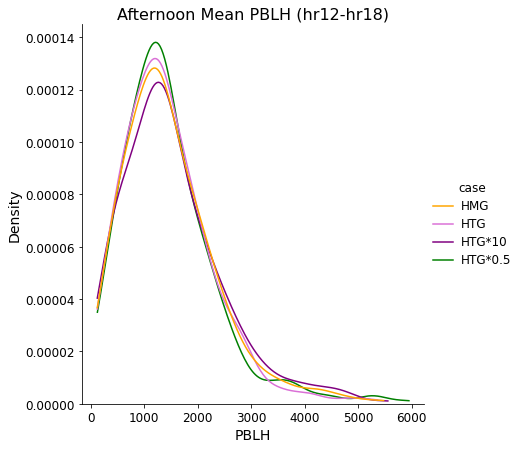

In [139]:
dfReal = pd.concat(axis=0, ignore_index=True, objs=[
     pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[0,:]), 'case': 'HMG'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[1,:]), 'case': 'HTG'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[2,:]), 'case': 'HTG*10'}),
     pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[3,:]), 'case': 'HTG*0.5'}),
#      pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[4,:]), 'case': 'HTG*0'}),
])

# dfArt = pd.concat(axis=0, ignore_index=True, objs=[
#      pd.DataFrame.from_dict({varSel: np.squeeze(art_var_dayMean.values[0,:]), 'case': 'HMG'}),
#      pd.DataFrame.from_dict({varSel: np.squeeze(art_var_dayMean.values[1,:]), 'case': 'HTG'}),
#      pd.DataFrame.from_dict({varSel: np.squeeze(art_var_dayMean.values[2,:]), 'case': 'HTG*0.5'}),
#      pd.DataFrame.from_dict({varSel: np.squeeze(art_var_dayMean.values[3,:]), 'case': 'HTG*0.25'}),
# ])



g = sns.displot(dfReal, x=varSel, hue='case', kind='kde', height=6, cut=0, palette=['orange','orchid','purple','green'])
# g = sns.displot(dfReal, x=varSel, hue='case', height=6, palette=['orange','orchid','purple'])


g.ax.set_title("Afternoon Mean "+varSel+" (hr"+str(startHr)+"-hr"+str(endHr)+")", fontsize=16 ) 
g.ax.set_xlabel(varSel,fontsize=14)
g.ax.set_ylabel('Density',fontsize=14)
g.ax.tick_params(axis='both', labelsize= 12)
plt.setp(g._legend.get_title(), fontsize=12)
plt.setp(g._legend.get_texts(), fontsize=12)

# g.ax.set_xscale('log')

# g.ax.axvline(110,color='k')
# g.ax.axvline(160,color='k')


In [33]:
# g = sns.displot(dfArt, x=varSel, hue='case', kind='kde' ,height=6, cut=0, palette=['r','b','dodgerblue','skyblue'])
# # g = sns.displot(dfArt, x=varSel, hue='case', height=6, palette=['r','b','dodgerblue','skyblue'])


# g.ax.set_title("Daytime Mean "+varSel, fontsize=16 ) 
# g.ax.set_xlabel(varSel,fontsize=14)
# g.ax.set_ylabel('Density',fontsize=14)
# g.ax.tick_params(axis='both', labelsize= 12)
# plt.setp(g._legend.get_title(), fontsize=12)
# plt.setp(g._legend.get_texts(), fontsize=12)

# # g.ax.set_xscale('log')
# # g.ax.axvline(20,color='k',linestyle='--')
# # g.ax.axvline(60,color='k',linestyle='--')

# # g.ax.axvline(110,color='k')
# # g.ax.axvline(160,color='k')


In [50]:
# # Number of days with mean SHFLX within those bounds? 

# print('Number of days HMGreal: ', len(np.where( (real_var_dayMean[0,:,0,0]>=110)  & (real_var_dayMean[0,:,0,0]<=160) )[0] ))
# print('Number of days HTGreal: ', len(np.where( (real_var_dayMean[1,:,0,0]>=110)  & (real_var_dayMean[1,:,0,0]<=160) )[0] ))
# print('Number of days HTG*10:  ', len(np.where( (real_var_dayMean[2,:,0,0]>=110)  & (real_var_dayMean[2,:,0,0]<=160) )[0] ))

# print()
# print('Number of days HMGart:    ', len(np.where( (art_var_dayMean[0,:,0,0]>=110)  & (art_var_dayMean[0,:,0,0]<=160) )[0] ))
# print('Number of days HTGrart:   ', len(np.where( (art_var_dayMean[1,:,0,0]>=110)  & (art_var_dayMean[1,:,0,0]<=160) )[0] ))
# print('Number of days HTG*0.5:   ', len(np.where( (art_var_dayMean[2,:,0,0]>=110)  & (art_var_dayMean[2,:,0,0]<=160) )[0] ))
# print('Number of days HTG*0.25:  ', len(np.where( (art_var_dayMean[3,:,0,0]>=110)  & (art_var_dayMean[3,:,0,0]<=160) )[0] ))



**In general, how do some distributions change?**

In [140]:
def plotPDFS_distVar(distVar, logScaleBinary):
    #No filtering of days based on above condition (i.e., precip amount)
    if len(np.shape(realSfc_allCases[distVar]))==5:
        if distVar=='WP3_CLUBB':
            levSel=-2
        else: 
            levSel=-1
        
        if np.shape(realSfc_allCases[distVar])[2]==65:
            real_var = realSfc_allCases[distVar].isel(ilev=levSel)
        elif np.shape(realSfc_allCases[distVar])[2]==64:
            real_var = realSfc_allCases[distVar].isel(lev=levSel)        
    else:
        real_var = realSfc_allCases[distVar]


    # Select those hours
    iHours_real = np.where( (real_var['time.hour']>=startHr) & (real_var['time.hour']<=endHr) )[0]
    real_var_selTime = real_var.isel(time=iHours_real)

    # For each date, get the mean value over the selected time period 
    real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')

    # Define dataframe
    dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[0,:]), 'case': 'HMG'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[1,:]), 'case': 'HTG'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[2,:]), 'case': 'HTG*10'}),
         pd.DataFrame.from_dict({varSel: np.squeeze(real_var_dayMean.values[3,:]), 'case': 'HTG*0.5'}),
    ])

    # Make plot 
    g = sns.displot(dfReal, x=varSel, hue='case', kind='kde', height=6, cut=0, palette=['orange','orchid','purple','green'])
#     g = sns.displot(dfReal, x=varSel, hue='case', height=6, palette=['orange','orchid','purple'])


    g.ax.set_title("Afternoon Mean "+distVar+" (hr"+str(startHr)+"-hr"+str(endHr)+")", fontsize=16 ) 
    g.ax.set_xlabel(distVar,fontsize=14)
    g.ax.set_ylabel('Density',fontsize=14)
    g.ax.tick_params(axis='both', labelsize= 12)
    plt.setp(g._legend.get_title(), fontsize=12)
    plt.setp(g._legend.get_texts(), fontsize=12)
    
    if logScaleBinary==1:
        g.ax.set_xscale('log')
    
    return plt
    

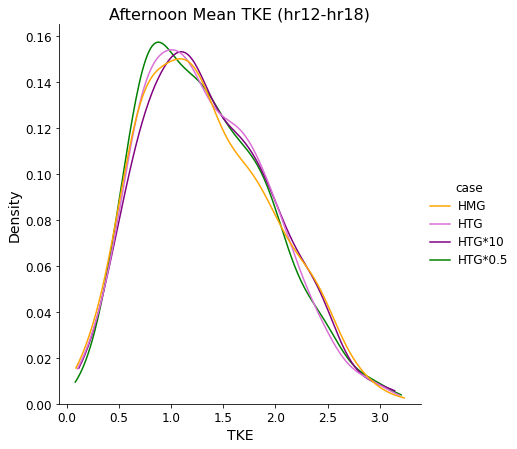

In [141]:
distVar    = 'TKE'
pltDistVar = plotPDFS_distVar(distVar,0)


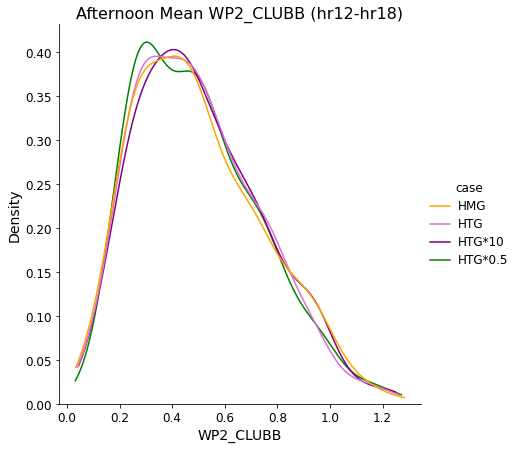

In [142]:
distVar    = 'WP2_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)


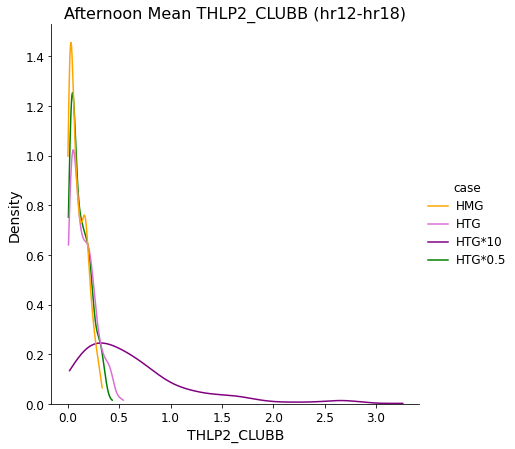

In [143]:
distVar    = 'THLP2_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)

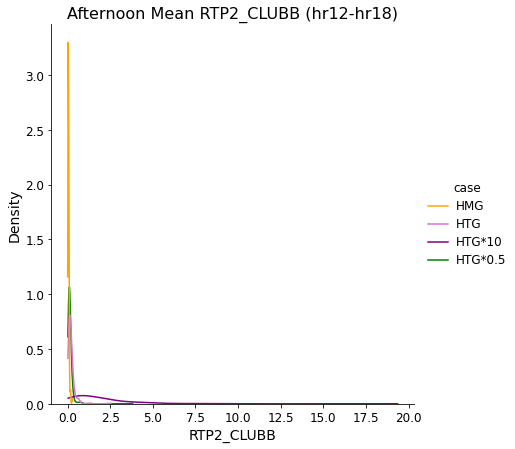

In [144]:
distVar    = 'RTP2_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)

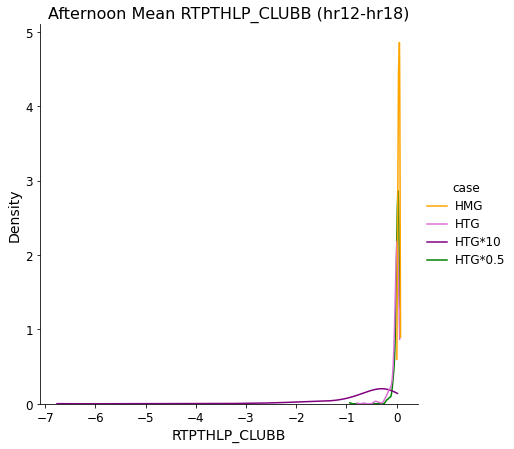

In [145]:
distVar    = 'RTPTHLP_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)

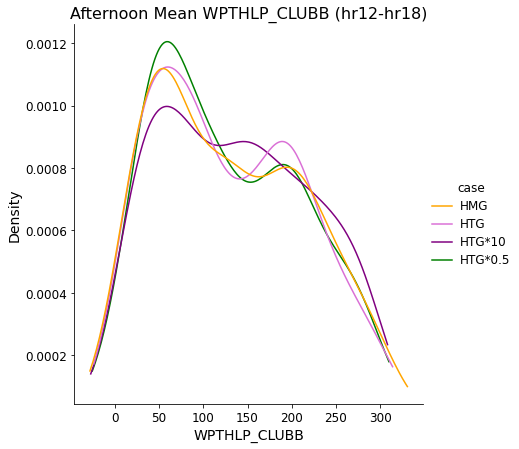

In [146]:
distVar    = 'WPTHLP_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)

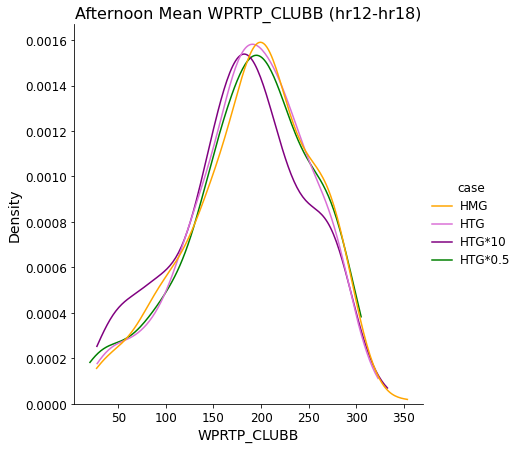

In [147]:
distVar    = 'WPRTP_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)

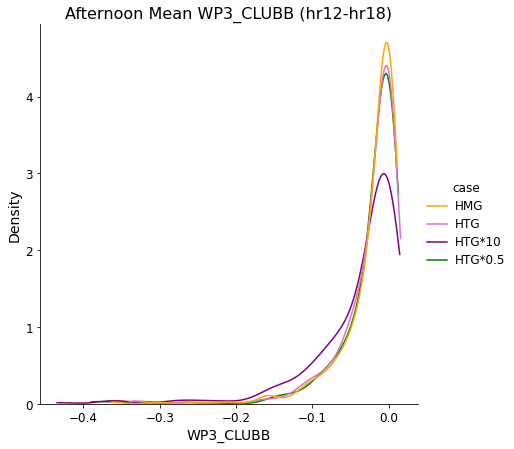

In [148]:
distVar    = 'WP3_CLUBB'
pltDistVar = plotPDFS_distVar(distVar,0)


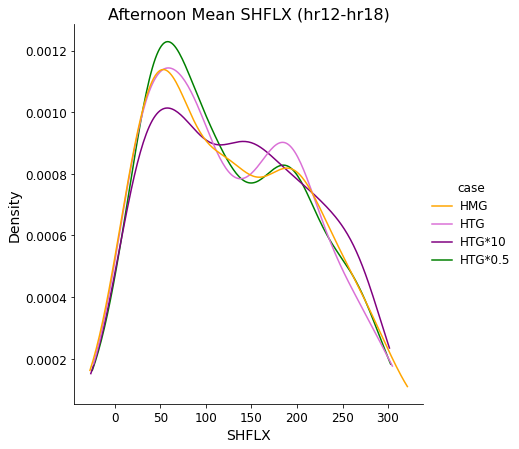

In [149]:
distVar    = 'SHFLX'
pltDistVar = plotPDFS_distVar(distVar,0)

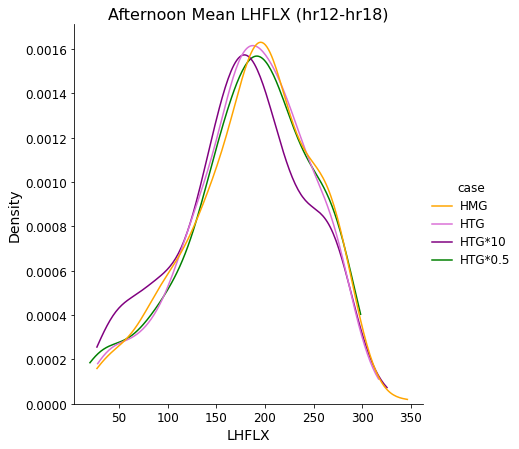

In [150]:
distVar    = 'LHFLX'
pltDistVar = plotPDFS_distVar(distVar,0)

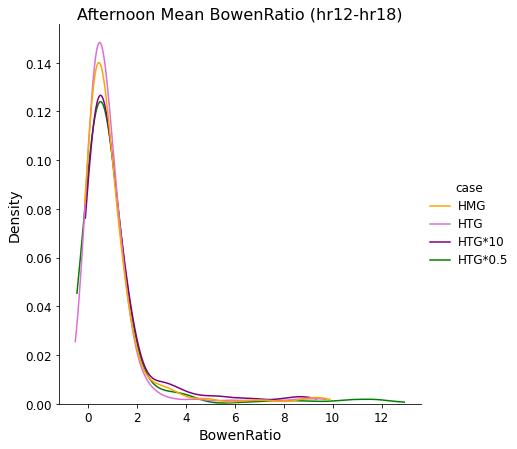

In [151]:
distVar    = 'BowenRatio'
pltDistVar = plotPDFS_distVar(distVar,0)

(0.0, 1.5)

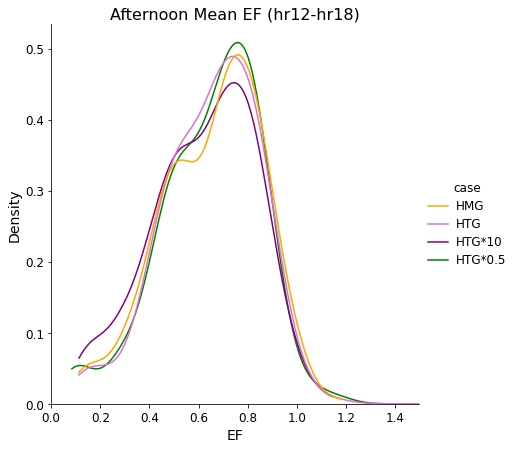

In [152]:
distVar    = 'EF'
pltDistVar = plotPDFS_distVar(distVar,0)
pltDistVar.xlim([0.0,1.5])

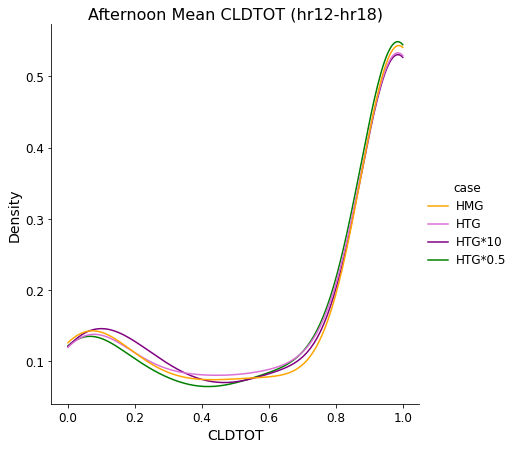

In [153]:
distVar    = 'CLDTOT'
pltDistVar = plotPDFS_distVar(distVar,0)

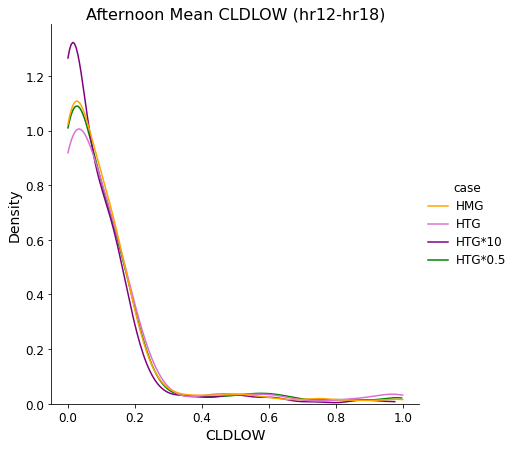

In [154]:
distVar    = 'CLDLOW'
pltDistVar = plotPDFS_distVar(distVar,0)

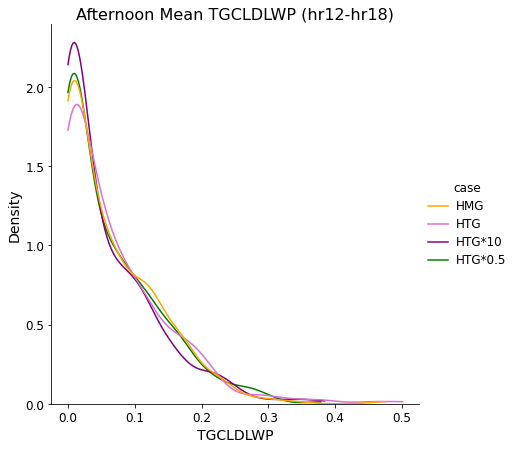

In [155]:
distVar    = 'TGCLDLWP'
pltDistVar = plotPDFS_distVar(distVar,0)

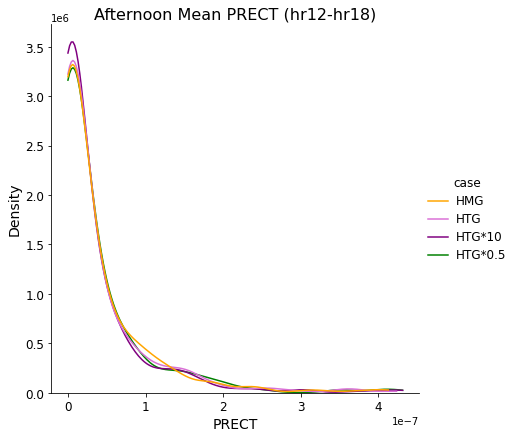

In [156]:
distVar    = 'PRECT'
pltDistVar = plotPDFS_distVar(distVar,0)

**Pick out where changes are large (positive and negative sides)**

In [157]:
## Now get the dates where the HTG case has a really different behavior than the HMG one... 
diff_realHTG   = np.squeeze(real_var_dayMean.values[1,:]) - np.squeeze(real_var_dayMean.values[0,:])
diff_realHTG10 = np.squeeze(real_var_dayMean.values[2,:]) - np.squeeze(real_var_dayMean.values[0,:])
diff_realHTGp5 = np.squeeze(real_var_dayMean.values[3,:]) - np.squeeze(real_var_dayMean.values[0,:])
diff_realHTG0  = np.squeeze(real_var_dayMean.values[4,:]) - np.squeeze(real_var_dayMean.values[0,:])



In [158]:
highPct = 90
lowPct  = 10
# highPct = 85
# lowPct  = 15

print('Real Surface:')
print('- - - - - - - - ')
print(highPct, 'th percentile difference (HTG): %.3e'  % np.nanpercentile(diff_realHTG, highPct))
print(lowPct,'th percentile difference (HTG):  %.3e'  % np.nanpercentile(diff_realHTG, lowPct))
print()
print(highPct,'th percentile difference (HTG10): %.3e'  % np.nanpercentile(diff_realHTG10, highPct))
print(lowPct,'th percentile difference (HTG10):  %.3e'  % np.nanpercentile(diff_realHTG10, lowPct))
print('\n\n')

# print('Artificial Surface:')
# print('- - - - - - - - - - - ')
# print(highPct,'th percentile difference (HTG): %.3e'  % np.nanpercentile(diff_artHTG, highPct))
# print(lowPct,'th percentile difference (HTG):  %.3e'  % np.nanpercentile(diff_artHTG, lowPct))
# print()
# print(highPct,'th percentile difference (HTG5): %.3e'  % np.nanpercentile(diff_artHTG5, highPct))
# print(lowPct,'th percentile difference (HTG5):  %.3e'  % np.nanpercentile(diff_artHTG5, lowPct))
# print()
# print(highPct,'th percentile difference (HTG25): %.3e'  % np.nanpercentile(diff_artHTG25, highPct))
# print(lowPct,'th percentile difference (HTG25):  %.3e'  % np.nanpercentile(diff_artHTG25, lowPct))


# print()
# print('Number of days in each category: ', len(np.where(diff_artHTG25>=np.nanpercentile(diff_artHTG25, highPct))[0]))



Real Surface:
- - - - - - - - 
90 th percentile difference (HTG): 2.314e+02
10 th percentile difference (HTG):  -2.900e+02

90 th percentile difference (HTG10): 3.619e+02
10 th percentile difference (HTG10):  -2.590e+02





In [159]:
iHigh_realHTG   = np.where(diff_realHTG   >= np.nanpercentile(diff_realHTG, highPct))[0]
iHigh_realHTG10 = np.where(diff_realHTG10 >= np.nanpercentile(diff_realHTG10, highPct))[0]
iHigh_realHTGp5 = np.where(diff_realHTGp5 >= np.nanpercentile(diff_realHTGp5, highPct))[0]
# iHigh_artHTG    = np.where(diff_artHTG    >= np.nanpercentile(diff_artHTG, highPct))[0]
# iHigh_artHTG5   = np.where(diff_artHTG5   >= np.nanpercentile(diff_artHTG5, highPct))[0]
# iHigh_artHTG25  = np.where(diff_artHTG25  >= np.nanpercentile(diff_artHTG25, highPct))[0]


iLow_realHTG   = np.where(diff_realHTG   <= np.nanpercentile(diff_realHTG, lowPct))[0]
iLow_realHTG10 = np.where(diff_realHTG10 <= np.nanpercentile(diff_realHTG10, lowPct))[0]
iLow_realHTGp5 = np.where(diff_realHTGp5 <= np.nanpercentile(diff_realHTGp5, lowPct))[0]
# iLow_artHTG    = np.where(diff_artHTG    <= np.nanpercentile(diff_artHTG, lowPct))[0]
# iLow_artHTG5   = np.where(diff_artHTG5   <= np.nanpercentile(diff_artHTG5, lowPct))[0]
# iLow_artHTG25  = np.where(diff_artHTG25  <= np.nanpercentile(diff_artHTG25, lowPct))[0]


In [160]:
varSel

'PBLH'

In [161]:
print('What happens when we run HTG*0??\n   Mean Difference: %.2f\n   Max Difference:  %.2f\n   Min Difference:  %.2f\n' % (np.nanmean(diff_realHTG0),np.nanmax(diff_realHTG0),np.nanmin(diff_realHTG0)) )


What happens when we run HTG*0??
   Mean Difference: 0.00
   Max Difference:  0.00
   Min Difference:  0.00



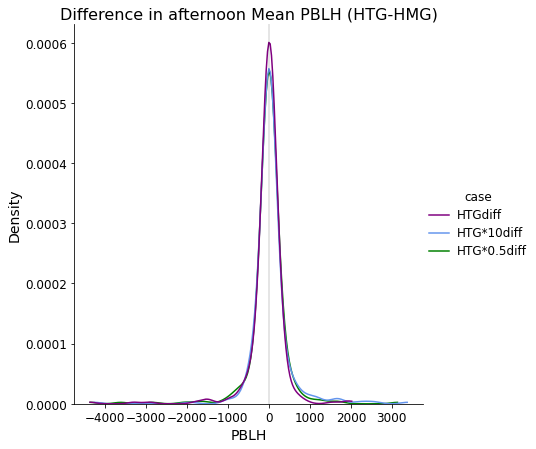

In [162]:
# Define dataframe
dfReal = pd.concat(axis=0, ignore_index=True, objs=[
     pd.DataFrame.from_dict({varSel: diff_realHTG,   'case': 'HTGdiff'}),
     pd.DataFrame.from_dict({varSel: diff_realHTG10, 'case': 'HTG*10diff'}),
     pd.DataFrame.from_dict({varSel: diff_realHTGp5, 'case': 'HTG*0.5diff'}),
#      pd.DataFrame.from_dict({varSel: diff_realHTG0, 'case': 'HTG*0diff'}),
])

# Make plot 
g = sns.displot(dfReal, x=varSel, hue='case', kind='kde', height=6, cut=0, palette=['purple','cornflowerblue','green'])
# g = sns.displot(dfReal, x=varSel, bins=50, hue='case', height=8, palette=['lawngreen','cornflowerblue'])


g.ax.set_title("Difference in afternoon Mean "+varSel+" (HTG-HMG)", fontsize=16 ) 
g.ax.set_xlabel(varSel,fontsize=14)
g.ax.set_ylabel('Density',fontsize=14)
g.ax.tick_params(axis='both', labelsize= 12)
plt.setp(g._legend.get_title(), fontsize=12)
plt.setp(g._legend.get_texts(), fontsize=12)

plt.axvline(0,color='k',linewidth=2,alpha=0.1)

# plt.axvline(np.nanpercentile(diff_realHTG, highPct), color='darkgreen', linestyle='--')
# plt.axvline(np.nanpercentile(diff_realHTG, lowPct),  color='darkgreen', linestyle='--')
# plt.axvline(np.nanpercentile(diff_realHTG10, highPct), color='cyan', linestyle='--')
# plt.axvline(np.nanpercentile(diff_realHTG10, lowPct),  color='cyan', linestyle='--')


In [22]:
len(iHigh_realHTG)

36

In [163]:
## Get indices of dates that are consistent...

# listHigh_real = list(set( iHigh_realHTG ) &  set( iHigh_realHTG10 ) )
# listLow_real  = list(set( iLow_realHTG )  &  set( iLow_realHTG10 ) )

listHigh_real = list(set( iHigh_realHTG )  )
listLow_real  = list(set( iLow_realHTG ) )

# listHigh_real = list(set( iHigh_realHTG10 )  )
# listLow_real  = list(set( iLow_realHTG10 ) )

print('Num days consistent for high percentile (real sfc): ', len(listHigh_real))
print('Num days consistent for low  percentile (real sfc): ', len(listLow_real))

# print('Num days consistent for high percentile (art sfc): ', len(listHigh_art))
# print('Num days consistent for low  percentile (art sfc): ', len(listLow_art))



Num days consistent for high percentile (real sfc):  36
Num days consistent for low  percentile (real sfc):  36


In [34]:
print('Realistic Surface')
print('Days with large LWP increases: \n')
for iDay in range(len(listHigh_real)):
    print('    ', strDates[np.sort(listHigh_real)][iDay])
print('\nDays with large LWP decreases: \n')
for iDay in range(len(listLow_real)):
    print('    ', strDates[np.sort(listLow_real)][iDay])

Realistic Surface
Days with large LWP increases: 

     2015-06-09
     2015-06-13
     2015-06-14
     2015-06-16
     2015-07-07
     2015-07-22
     2015-07-25
     2015-08-07
     2015-08-08
     2015-08-09
     2015-08-16
     2015-08-17
     2015-08-19
     2015-08-27
     2016-06-18
     2016-06-29
     2016-06-30
     2016-07-04
     2016-07-20
     2016-07-21
     2016-07-23
     2016-07-24
     2016-07-25
     2016-07-28
     2016-08-12
     2016-08-23
     2017-06-22
     2017-06-23
     2017-06-25
     2017-06-28
     2017-07-29
     2017-08-07
     2017-08-10
     2017-08-11
     2017-08-12
     2018-06-23

Days with large LWP decreases: 

     2015-06-07
     2015-06-10
     2015-06-11
     2015-06-12
     2015-06-21
     2015-06-22
     2015-06-23
     2015-06-25
     2015-06-27
     2015-06-28
     2015-06-30
     2015-07-05
     2015-07-10
     2015-07-17
     2015-07-18
     2015-07-19
     2015-07-20
     2015-07-28
     2015-08-02
     2016-06-08
     2016-06-17
   

In [96]:
# ## Write out dates to a file (to be read into other programs, like CLUBB_Budgets.ipynb)...
# fileName    = '/Users/mdfowler/Documents/Analysis/CLASP/SensitiveDaysToHTG_PBLH_HTG10onlyDefined.csv'

# df = pd.DataFrame({'PBLH+': strDates[np.sort(listHigh_real)], 
#                    'PBLH-': strDates[np.sort(listLow_real)]})

# df.to_csv(fileName)


In [339]:
str(strDates[np.sort(listHigh_real)][iDay])

'2015-06-09'

In [35]:
allIndicies = np.arange(0,len(strDates))

restOfIndices_real = list(set(allIndicies) - set(listHigh_real) - set(listLow_real))
# restOfIndices_art  = list(set(allIndicies) - set(listHigh_art)  - set(listLow_art))


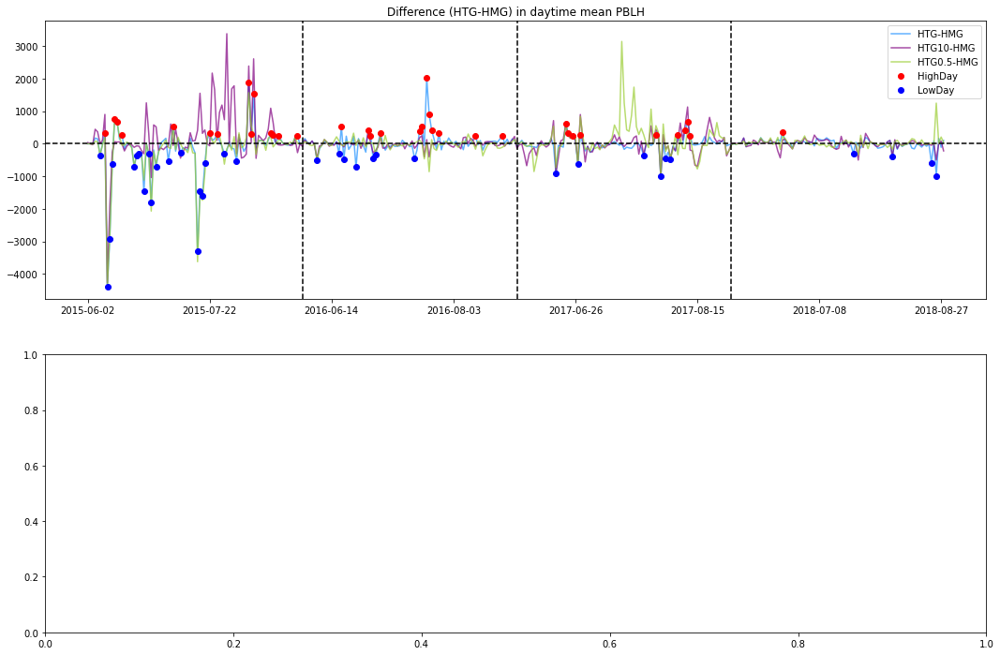

In [185]:
fig,axs = plt.subplots(2,1, figsize=(18,12))
axs = axs.ravel()

axs[0].plot(np.arange(len(diff_realHTG)), diff_realHTG,   color='dodgerblue',alpha=0.7, label='HTG-HMG')
axs[0].plot(np.arange(len(diff_realHTG)), diff_realHTG10, color='purple',alpha=0.7, label='HTG10-HMG')
axs[0].plot(np.arange(len(diff_realHTG)), diff_realHTGp5, color='yellowgreen', alpha=0.7, label='HTG0.5-HMG')
# axs[0].plot(np.arange(len(diff_realHTG)), diff_realHTG0, color='red',alpha=0.5, label='HTG0-HMG')

# axs[1].plot(diff_artHTG,    color='blue')
# axs[1].plot(diff_artHTG5, color='dodgerblue')
# axs[1].plot(diff_artHTG25, color='skyblue')

# Add labels
axs[0].set_title('Difference (HTG-HMG) in daytime mean '+varSel)

## Add separating lines for ease of looking at these 
axs[0].axhline(0,color='k',linestyle='--')
# axs[1].axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs[0].axvline(yrStart[iYr], color='k',linestyle='--')
#     axs[1].axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs[0].plot(np.arange(len(diff_realHTG))[listHigh_real], diff_realHTG[listHigh_real],'ro', label='HighDay')
axs[0].plot(np.arange(len(diff_realHTG))[listLow_real], diff_realHTG[listLow_real],'bo', label='LowDay')

axs[0].legend()

# Control tick labels
xTicks = axs[0].get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs[0].set_xticklabels(dates_xticks)

# xTicks = axs[1].get_xticks()
# dates_xticks = strDates[xTicks.astype(int)[:-1]]
# axs[1].set_xticklabels(dates_xticks)

## Add lines for percentiles?
# axs[0].axhline(np.nanpercentile(diff_realHTG, highPct), color='lawngreen', alpha=0.5)
# axs[0].axhline(np.nanpercentile(diff_realHTG, lowPct),  color='lawngreen', alpha=0.5)

# axs[0].axhline(np.nanpercentile(diff_realHTG10, highPct), color='cornflowerblue', alpha=0.6)
# axs[0].axhline(np.nanpercentile(diff_realHTG10, lowPct),  color='cornflowerblue', alpha=0.6)

# axs[1].axhline(np.nanpercentile(diff_artHTG, highPct), color='blue', alpha=0.5)
# axs[1].axhline(np.nanpercentile(diff_artHTG, lowPct),  color='blue', alpha=0.5)

# axs[1].axhline(np.nanpercentile(diff_artHTG5, highPct), color='dodgerblue', alpha=0.6)
# axs[1].axhline(np.nanpercentile(diff_artHTG5, lowPct),  color='dodgerblue', alpha=0.6)

# axs[1].axhline(np.nanpercentile(diff_artHTG25, highPct), color='skyblue', alpha=0.6)
# axs[1].axhline(np.nanpercentile(diff_artHTG25, lowPct),  color='skyblue', alpha=0.6)
    
plt.show()

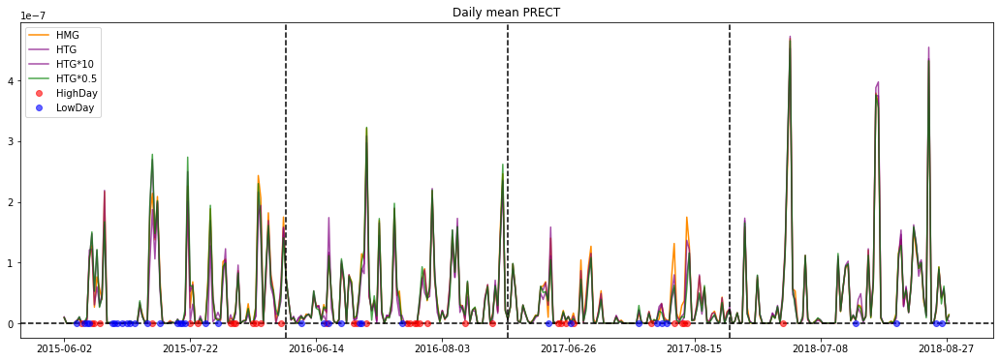

In [37]:
# Select those hours
distVar = 'PRECT'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='purple', alpha=0.7, label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', alpha=0.7, label='HTG*10')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[3,:]), color='green', alpha=0.7, label='HTG*0.5')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.zeros(len(listHigh_real)),'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.zeros(len(listLow_real)),'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

In [45]:
real_var_dayMean.case

<xarray.DataArray 'case' (case: 4)>
array(['HMG', 'HTG', 'HTG10', 'HTGp5'], dtype='<U5')
Coordinates:
  * case     (case) <U5 'HMG' 'HTG' 'HTG10' 'HTGp5'

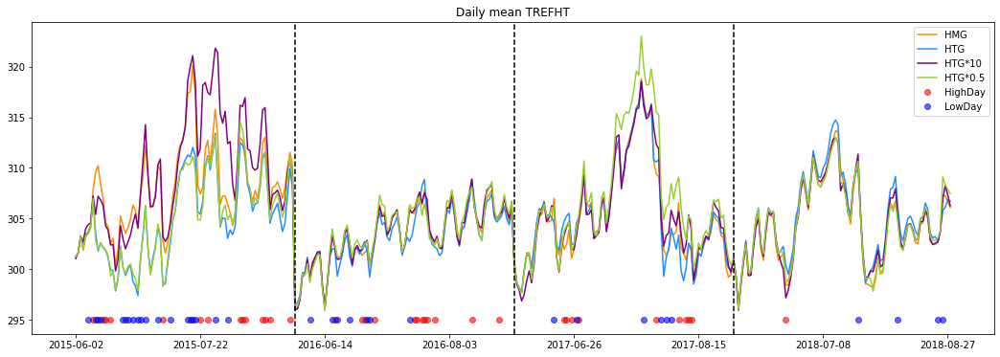

In [189]:
# Select those hours
distVar = 'TREFHT'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='dodgerblue', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[3,:]), color='yellowgreen', label='HTG*0.5')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*295,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*295,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

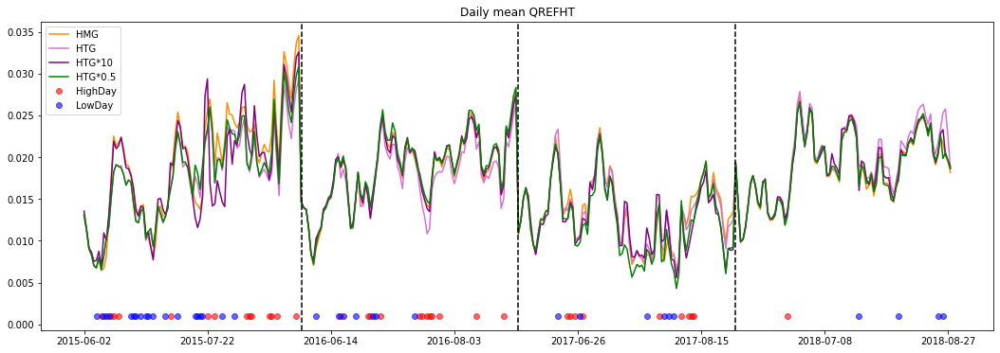

In [39]:
# Select those hours
distVar = 'QREFHT'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='orchid', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[3,:]), color='green', label='HTG*0.5')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*0.001,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*0.001,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

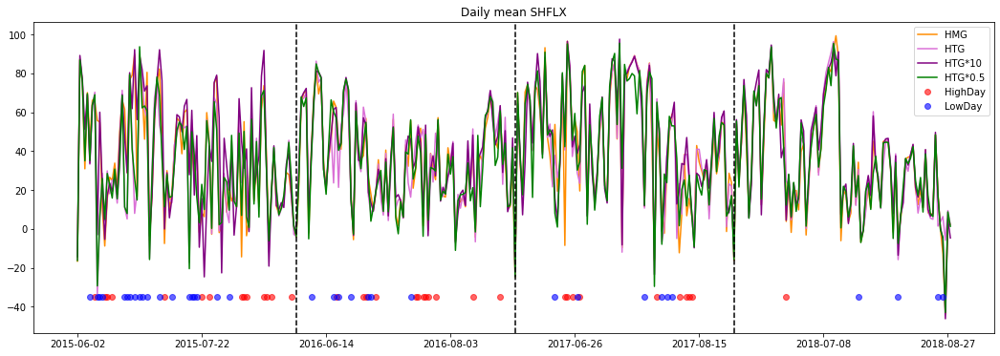

In [40]:
# Select those hours
distVar = 'SHFLX'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='orchid', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[3,:]), color='green', label='HTG*0.5')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*-35,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*-35,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

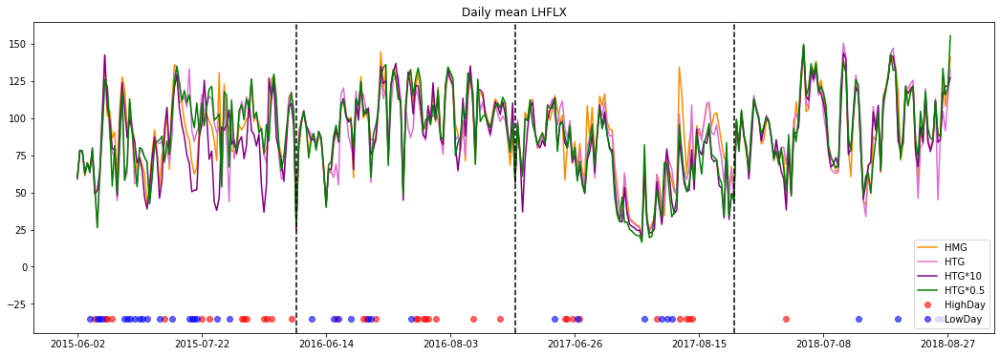

In [41]:
# Select those hours
distVar = 'LHFLX'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='orchid', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[3,:]), color='green', label='HTG*0.5')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*-35,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*-35,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

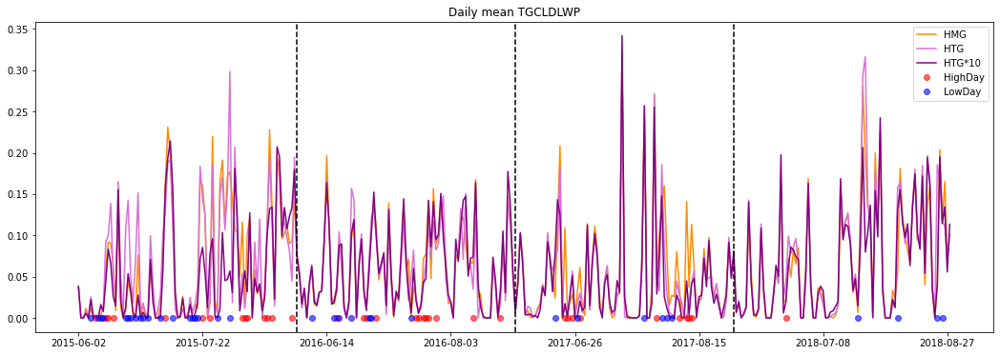

In [42]:
# Select those hours
distVar = 'TGCLDLWP'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='orchid', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*0,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*0,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

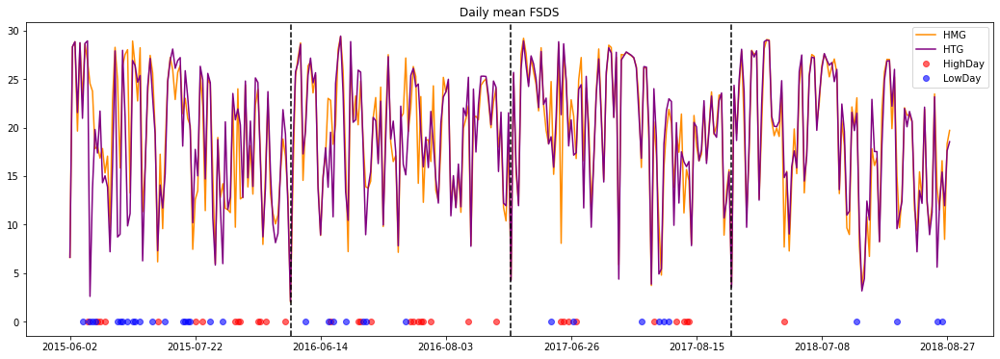

In [411]:
# Select those hours
distVar = 'FSDS'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='purple', label='HTG')
# axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*0,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*0,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

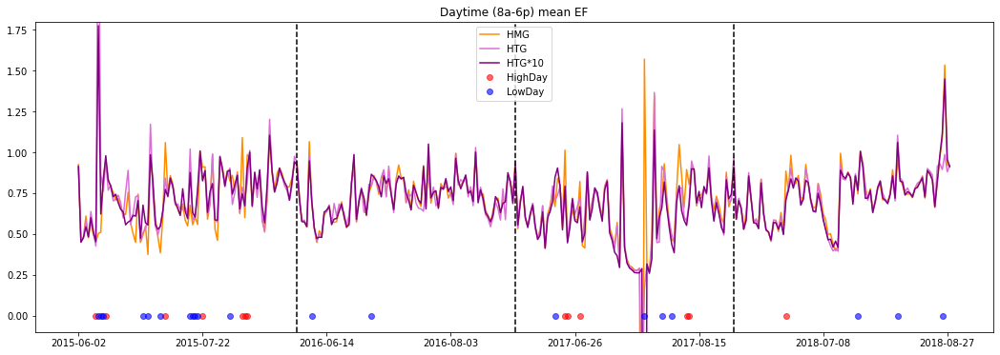

In [126]:
# Select those hours
distVar = 'EF'
real_var         = realSfc_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=8) & (real_var['time.hour']<=18) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='orchid', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')

# Add labels
axs.set_title('Daytime (8a-6p) mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*0,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*0,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

axs.set_ylim([-0.1,1.8])
    
plt.show()

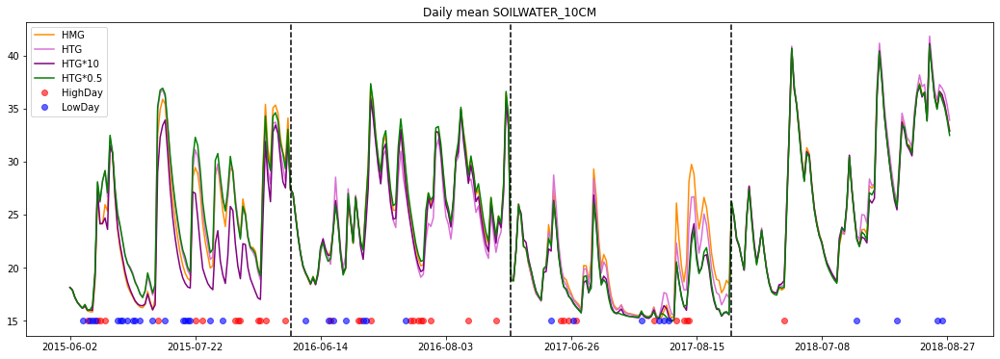

In [43]:
# Select those hours
distVar = 'SOILWATER_10CM'
real_var         = realSfcCLM_allCases[distVar]
iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
real_var_selTime = real_var.isel(time=iHours_real)

# For each date, get the mean value over the selected time period 
real_var_dayMean = real_var_selTime.groupby('year_month_day').mean(dim='time')


fig,axs = plt.subplots(1,1, figsize=(18,6))

axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[0,:]), color='darkorange',   label='HMG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[1,:]), color='orchid', label='HTG')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[2,:]), color='purple', label='HTG*10')
axs.plot(np.arange(len(diff_realHTG)), np.squeeze(real_var_dayMean[3,:]), color='green', label='HTG*0.5')

# Add labels
axs.set_title('Daily mean '+distVar)

## Add separating lines for ease of looking at these 
# axs.axhline(0,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')
    
    
# Plot markers for days that qualify as high/low changes
axs.plot(np.arange(len(diff_realHTG))[listHigh_real], np.ones(len(listHigh_real))*15,'ro', alpha=0.6, label='HighDay')
axs.plot(np.arange(len(diff_realHTG))[listLow_real],  np.ones(len(listLow_real))*15,'bo',  alpha=0.6, label='LowDay')

axs.legend()

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

    
plt.show()

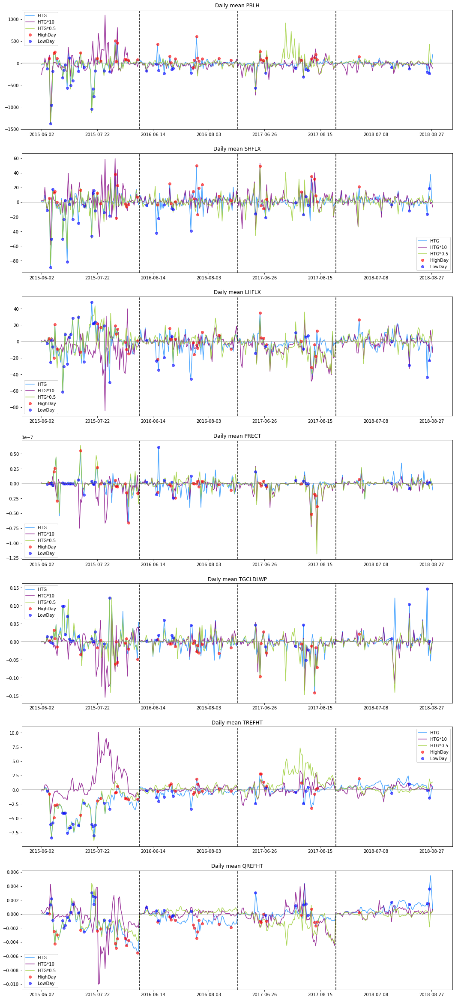

In [188]:
# Plot daily means...
plotVars = np.asarray(['PBLH','SHFLX','LHFLX','PRECT','TGCLDLWP','TREFHT','QREFHT'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    
    real_var         = realSfc_allCases[plotVars[iPlot]]
#     iHours_real      = np.where( (real_var['time.hour']>=0) & (real_var['time.hour']<=24) )[0]
#     real_var_selTime = real_var.isel(time=iHours_real)

    # For each date, get the mean value over the day
    real_var_dayMean = real_var.groupby('year_month_day').mean(dim='time')

    diffHTG   = real_var_dayMean.values[1,:]-real_var_dayMean.values[0,:]
    diffHTG10 = real_var_dayMean.values[2,:]-real_var_dayMean.values[0,:]
    diffHTGp5 = real_var_dayMean.values[3,:]-real_var_dayMean.values[0,:]
    
    axs[iPlot].plot(np.arange(len(diff_realHTG)), np.squeeze(diffHTG), 
                    color='dodgerblue', alpha=0.8, label='HTG')
    axs[iPlot].plot(np.arange(len(diff_realHTG)), np.squeeze(diffHTG10), 
                    color='purple', alpha=0.8, label='HTG*10')
    axs[iPlot].plot(np.arange(len(diff_realHTG)), np.squeeze(diffHTGp5), 
                    color='yellowgreen', alpha=0.8, label='HTG*0.5')
        
    ## Add separating lines for ease of looking at these 
    # axs.axhline(0,color='k',linestyle='--')
    for iYr in range(len(yrStart)):
        axs[iPlot].axvline(yrStart[iYr], color='k',linestyle='--')


    # Plot markers for days that qualify as high/low changes
#     axs[iPlot].plot(np.arange(len(diffHTG))[listHigh_real], np.ones(len(listHigh_real))*15,'ro', alpha=0.6, label='HighDay')
#     axs[iPlot].plot(np.arange(len(diffHTG))[listLow_real],  np.ones(len(listLow_real))*15,'bo',  alpha=0.6, label='LowDay')
    axs[iPlot].plot(np.arange(len(diffHTG))[listHigh_real], np.squeeze(diffHTG[listHigh_real]),'ro', alpha=0.6, label='HighDay')
    axs[iPlot].plot(np.arange(len(diffHTG))[listLow_real],  np.squeeze(diffHTG[listLow_real]),'bo',  alpha=0.6, label='LowDay')

    axs[iPlot].legend()
    axs[iPlot].axhline(0,color='grey',alpha=0.5)
    
    # Add labels
    axs[iPlot].set_title('Daily mean '+plotVars[iPlot])

    # Control tick labels
    xTicks       = axs[iPlot].get_xticks()
    dates_xticks = strDates[xTicks.astype(int)[:-1]]
    axs[iPlot].set_xticklabels(dates_xticks)
    

In [26]:
# print('Dates with highPct changes over a real surface:')
# print(np.sort(strDates[listHigh_real]))

# print('\nDates with highPct changes over an artificial surface:')
# print(np.sort(strDates[listHigh_art]))


In [277]:
# print('Dates with lowPct changes over a real surface:')
# print(np.sort(strDates[listLow_real]))

# print('\nDates with lowPct changes over an artificial surface:')
# print(np.sort(strDates[listLow_art]))



In [128]:
diffArr = np.full([len(strDates), 5], np.nan)

# diffArr[:,0] = diff_artHTG
# diffArr[:,1] = diff_artHTG5
# diffArr[:,2] = diff_artHTG25
diffArr[:,3] = diff_realHTG10
diffArr[:,4] = diff_realHTG


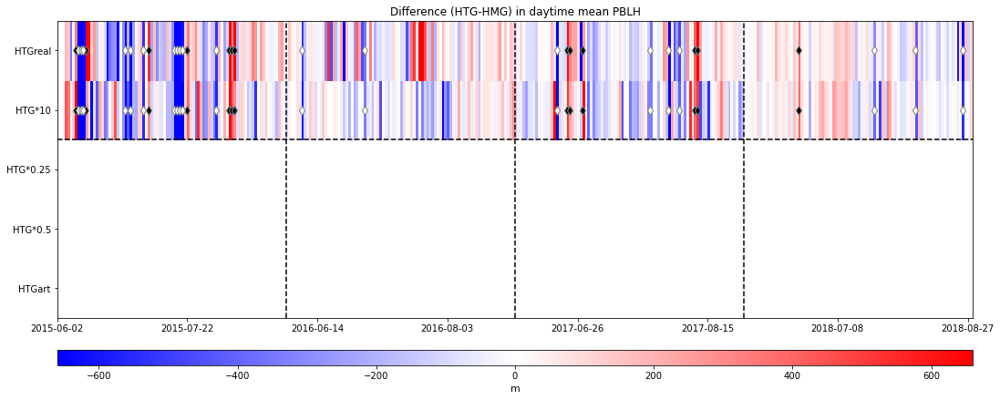

In [129]:
fig,axs = plt.subplots(1,1, figsize=(18,6))

cplot = axs.pcolor(np.transpose(diffArr), cmap='bwr', 
                       vmax = np.nanpercentile(np.abs(diffArr),95), vmin=-np.nanpercentile(np.abs(diffArr),95))

# Add labels
axs.set_title('Difference (HTG-HMG) in daytime mean '+varSel)


# Add colorbar
ax_position = axs.get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.12, ax_position.width, 0.04])
cbar = plt.colorbar(cplot, orientation='horizontal',cax=cbar_ax)
if hasattr(realSfc_allCases[varSel], 'units'):
            cbar.set_label(realSfc_allCases[varSel].units,fontsize=11)

# Control tick labels
xTicks = axs.get_xticks()
dates_xticks = strDates[xTicks.astype(int)[:-1]]
axs.set_xticklabels(dates_xticks)

axs.set_yticks([0.5,1.5,2.5,3.5,4.5])
axs.set_yticklabels(['HTGart','HTG*0.5','HTG*0.25','HTG*10','HTGreal'])

## Add separating lines for ease of looking at these 
axs.axhline(3,color='k',linestyle='--')
for iYr in range(len(yrStart)):
    axs.axvline(yrStart[iYr], color='k',linestyle='--')

## Add indicators of consistent days 
for iPoint in range(len(listHigh_real)):
    axs.plot(listHigh_real[iPoint], 4.5,'d',color='k', markeredgecolor='grey', markersize=6.5)
    axs.plot(listHigh_real[iPoint], 3.5,'d',color='k', markeredgecolor='grey', markersize=6.5)
    
# for iPoint in range(len(listHigh_art)):
#     axs.plot(listHigh_art[iPoint], 2.5,'d',color='k', markeredgecolor='grey', markersize=6.5)
#     axs.plot(listHigh_art[iPoint], 1.5,'d',color='k', markeredgecolor='grey', markersize=6.5)
#     axs.plot(listHigh_art[iPoint], 0.5,'d',color='k', markeredgecolor='grey', markersize=6.5)
    
for iPoint in range(len(listLow_real)):
    axs.plot(listLow_real[iPoint], 4.5,'d',color='w', markeredgecolor='grey', markersize=6.5)
    axs.plot(listLow_real[iPoint], 3.5,'d',color='w', markeredgecolor='grey', markersize=6.5)
    
# for iPoint in range(len(listLow_art)):
#     axs.plot(listLow_art[iPoint], 2.5,'d',color='w', markeredgecolor='grey', markersize=6.5)
#     axs.plot(listLow_art[iPoint], 1.5,'d',color='w', markeredgecolor='grey', markersize=6.5)
#     axs.plot(listLow_art[iPoint], 0.5,'d',color='w', markeredgecolor='grey', markersize=6.5)    
    
    
plt.show()

Text(0, 0.5, 'HTGreal10 - HMGreal')

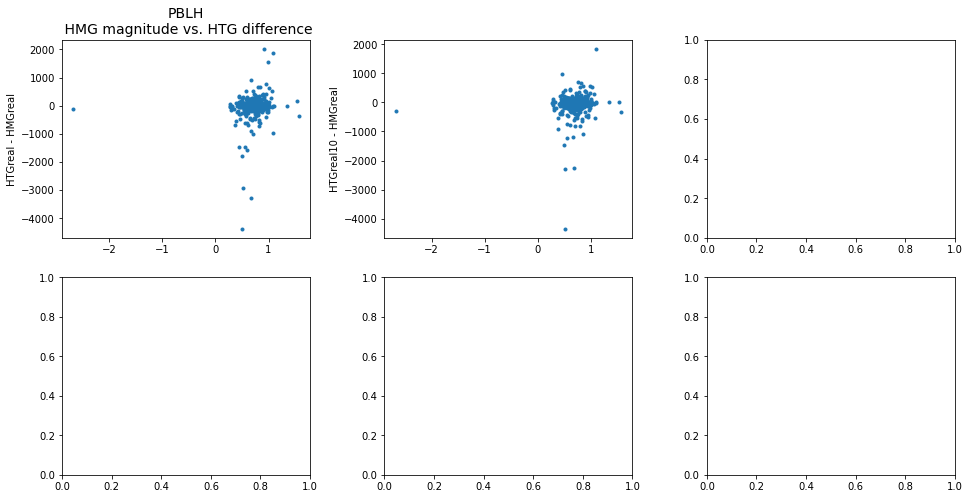

In [130]:
fig,axs = plt.subplots(2,3, figsize=(16,8))
axs     = axs.ravel()
fig.subplots_adjust(wspace=0.3)

axs[0].set_title(varSel+'\n HMG magnitude vs. HTG difference', fontsize=14)
axs[0].plot(np.squeeze(real_var_dayMean.values[0,:]), diff_realHTG, 'o', markersize=3)
axs[0].set_ylabel('HTGreal - HMGreal')

axs[1].plot(np.squeeze(real_var_dayMean.values[0,:]), diff_realHTG10, 'o', markersize=3)
axs[1].set_ylabel('HTGreal10 - HMGreal')

# axs[3].plot(np.squeeze(art_var_dayMean.values[0,:]), diff_artHTG, 'o', markersize=3)
# axs[3].set_ylabel('HTGart - HMGart')

# axs[4].plot(np.squeeze(art_var_dayMean.values[0,:]), diff_artHTG5, 'o', markersize=3)
# axs[4].set_ylabel('HTGart0.5 - HMGart')

# axs[5].plot(np.squeeze(art_var_dayMean.values[0,:]), diff_artHTG25, 'o', markersize=3)
# axs[5].set_ylabel('HTGart0.25 - HMGart')



In [424]:

# # Select those hours
# iHours_real = np.where( (realSfc_allCases['time.hour']>=7) & (realSfc_allCases['time.hour']<=19) )[0]
# # iHours_art  = np.where( (artSfc_all['time.hour']>=7)       & (artSfc_all['time.hour']<=19) )[0]

# realSfc_selTime = realSfc_allCases.isel(time=iHours_real)
# # artSfc_selTime  = artSfc_all.isel(time=iHours_art)

# # For each date, get the mean value over the selected time period 
# realSfc_dayMean = realSfc_selTime.groupby('year_month_day').mean(dim='time')
# # artSfc_dayMean  = artSfc_selTime.groupby('year_month_day').mean(dim='time')


In [59]:
# # Select nocturnal hours as 12a - 5a 
# iHours_real = np.where( (realSfc_allCases['time.hour']>=1) & (realSfc_allCases['time.hour']<=5) )[0]
# iHours_art  = np.where( (artSfc_all['time.hour']>=1)       & (artSfc_all['time.hour']<=5) )[0]

# realSfc_selNoct = realSfc_allCases.isel(time=iHours_real)
# artSfc_selNoct  = artSfc_all.isel(time=iHours_art)

# # For each date, get the mean value over the selected time period 
# realSfc_noctMean = realSfc_selNoct.groupby('year_month_day').mean(dim='time')
# artSfc_noctMean  = artSfc_selNoct.groupby('year_month_day').mean(dim='time')


In [61]:
# xVar     = 'WindMagnitude_interp'
# # Get mean of xVar over 850-950 hPa 
# selLevs_xVar     = realSfc_noctMean[xVar].isel(levInterp = np.arange(-11,-2)) 

# selLevs_xVar.levInterp.values

array([870., 880., 890., 900., 910., 920., 930., 940., 950.])

In [125]:
diff_realHTG[0]

-2.3979492

NameError: name 'realSfc_dayMean' is not defined

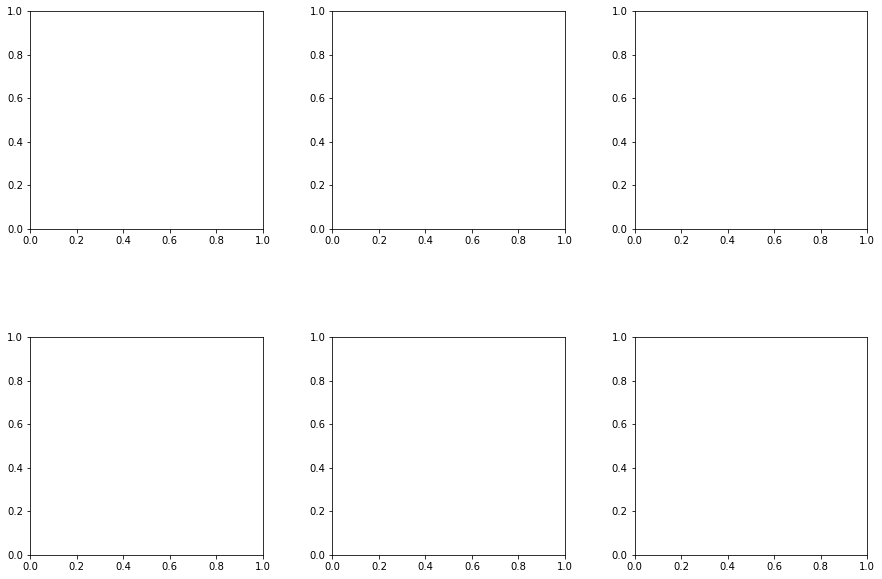

In [126]:
## Plot relationships to nocturnal mean in HMG... 

# Variable of interest...
yDiffVar = 'PBLH'

# As a function of.... (averaged over some layer)
xVar     = 'PRECT'


fig,axs = plt.subplots(2,3, figsize=(15,10))
axs     = axs.ravel()
fig.subplots_adjust(wspace=0.3, hspace=0.5)

axs[0].plot(np.squeeze(realSfc_dayMean[xVar].values[:,0]), 
            diff_realHTG,
               'ko', alpha=0.5,label='allDays')
axs[0].plot(np.squeeze(realSfc_dayMean[xVar].values[listHigh_real,0]),
            diff_realHTG[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[0].plot(np.squeeze(realSfc_dayMean[xVar].values[listLow_real,0]),
            diff_realHTG[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[0].set_title('Variable means over a realistic sfc', fontsize=14)
axs[0].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[0].set_xlabel('HMG daytime mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
axs[0].legend()


axs[1].plot(np.squeeze(realSfc_dayMean[xVar].values[:,1]), 
            diff_realHTG,
               'ko', alpha=0.5,label='allDays')
axs[1].plot(np.squeeze(realSfc_dayMean[xVar].values[listHigh_real,1]),
            diff_realHTG[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[1].plot(np.squeeze(realSfc_dayMean[xVar].values[listLow_real,1]),
            diff_realHTG[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[1].set_title('Variable means over a realistic sfc', fontsize=14)
axs[1].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[1].set_xlabel('HTG daytime mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
axs[1].legend()


axs[2].plot(np.squeeze(realSfc_dayMean[xVar].values[:,2]), 
            diff_realHTG,
               'ko', alpha=0.5,label='allDays')
axs[2].plot(np.squeeze(realSfc_dayMean[xVar].values[listHigh_real,2]),
            diff_realHTG[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[2].plot(np.squeeze(realSfc_dayMean[xVar].values[listLow_real,2]),
            diff_realHTG[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[2].set_title('Variable means over a realistic sfc', fontsize=14)
axs[2].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[2].set_xlabel('HTG10 daytime mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
axs[2].legend()


## Plot difference between HTG10 and HMG
axs[3].plot(np.squeeze(realSfc_dayMean[xVar].values[:,0]), 
            diff_realHTG10,
               'ko', alpha=0.5,label='allDays')
axs[3].plot(np.squeeze(realSfc_dayMean[xVar].values[listHigh_real,0]),
            diff_realHTG10[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[3].plot(np.squeeze(realSfc_dayMean[xVar].values[listLow_real,0]),
            diff_realHTG10[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[3].set_title('Variable means over a realistic sfc', fontsize=14)
axs[3].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[3].set_xlabel('HMG daytime mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
axs[3].legend()

axs[4].plot(np.squeeze(realSfc_dayMean[xVar].values[:,1]), 
            diff_realHTG10,
               'ko', alpha=0.5,label='allDays')
axs[4].plot(np.squeeze(realSfc_dayMean[xVar].values[listHigh_real,1]),
            diff_realHTG10[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[4].plot(np.squeeze(realSfc_dayMean[xVar].values[listLow_real,1]),
            diff_realHTG10[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[4].set_title('Variable means over a realistic sfc', fontsize=14)
axs[4].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[4].set_xlabel('HTG daytime mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
axs[4].legend()


axs[5].plot(np.squeeze(realSfc_dayMean[xVar].values[:,2]), 
            diff_realHTG10,
               'ko', alpha=0.5,label='allDays')
axs[5].plot(np.squeeze(realSfc_dayMean[xVar].values[listHigh_real,2]),
            diff_realHTG10[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[5].plot(np.squeeze(realSfc_dayMean[xVar].values[listLow_real,2]),
            diff_realHTG10[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[5].set_title('Variable means over a realistic sfc', fontsize=14)
axs[5].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[5].set_xlabel('HTG10 daytime mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
axs[5].legend()



axs[0].axhline(0,color='grey',linestyle=':')
axs[1].axhline(0,color='grey',linestyle=':')
axs[2].axhline(0,color='grey',linestyle=':')
axs[3].axhline(0,color='grey',linestyle=':')
axs[4].axhline(0,color='grey',linestyle=':')
axs[5].axhline(0,color='grey',linestyle=':')


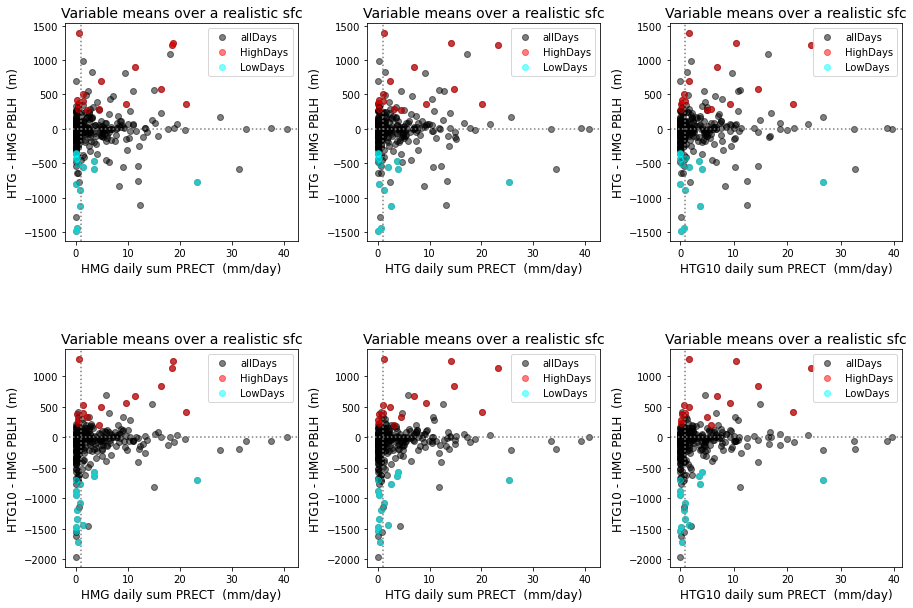

In [26]:
## Plot relationships to nocturnal mean in HMG... 

# Variable of interest...
yDiffVar = 'PBLH'

# As a function of.... (averaged over some layer)
xVar     = 'PRECT'


fig,axs = plt.subplots(2,3, figsize=(15,10))
axs     = axs.ravel()
fig.subplots_adjust(wspace=0.3, hspace=0.5)

axs[0].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,0,:,:]), 
            diff_realHTG,
               'ko', alpha=0.5,label='allDays')
axs[0].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listHigh_real,0]),
            diff_realHTG[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[0].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listLow_real,0]),
            diff_realHTG[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[0].set_title('Variable means over a realistic sfc', fontsize=14)
axs[0].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[0].set_xlabel('HMG daily sum '+xVar+ '  (mm/day)', fontsize=12)
axs[0].legend()


axs[1].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,1]), 
            diff_realHTG,
               'ko', alpha=0.5,label='allDays')
axs[1].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listHigh_real,1]),
            diff_realHTG[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[1].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listLow_real,1]),
            diff_realHTG[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[1].set_title('Variable means over a realistic sfc', fontsize=14)
axs[1].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[1].set_xlabel('HTG daily sum '+xVar+ '  (mm/day)', fontsize=12)
axs[1].legend()


axs[2].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,2]), 
            diff_realHTG,
               'ko', alpha=0.5,label='allDays')
axs[2].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listHigh_real,2]),
            diff_realHTG[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[2].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listLow_real,2]),
            diff_realHTG[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[2].set_title('Variable means over a realistic sfc', fontsize=14)
axs[2].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[2].set_xlabel('HTG10 daily sum '+xVar+ '  (mm/day)', fontsize=12)
axs[2].legend()


## Plot difference between HTG10 and HMG
axs[3].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,0]), 
            diff_realHTG10,
               'ko', alpha=0.5,label='allDays')
axs[3].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listHigh_real,0]),
            diff_realHTG10[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[3].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listLow_real,0]),
            diff_realHTG10[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[3].set_title('Variable means over a realistic sfc', fontsize=14)
axs[3].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[3].set_xlabel('HMG daily sum '+xVar+ '  (mm/day)', fontsize=12)
axs[3].legend()

axs[4].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,1]), 
            diff_realHTG10,
               'ko', alpha=0.5,label='allDays')
axs[4].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listHigh_real,1]),
            diff_realHTG10[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[4].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listLow_real,1]),
            diff_realHTG10[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[4].set_title('Variable means over a realistic sfc', fontsize=14)
axs[4].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[4].set_xlabel('HTG daily sum '+xVar+ '  (mm/day)', fontsize=12)
axs[4].legend()


axs[5].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[:,2]), 
            diff_realHTG10,
               'ko', alpha=0.5,label='allDays')
axs[5].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listHigh_real,2]),
            diff_realHTG10[listHigh_real],    
            'ro', alpha=0.5,label='HighDays')
axs[5].plot(np.squeeze(realSfc_allCasesDailySum['PRECT_mmPerDT'].values[listLow_real,2]),
            diff_realHTG10[listLow_real],    
            'o',color='cyan', alpha=0.5,label='LowDays')
axs[5].set_title('Variable means over a realistic sfc', fontsize=14)
axs[5].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
axs[5].set_xlabel('HTG10 daily sum '+xVar+ '  (mm/day)', fontsize=12)
axs[5].legend()



axs[0].axhline(0,color='grey',linestyle=':')
axs[1].axhline(0,color='grey',linestyle=':')
axs[2].axhline(0,color='grey',linestyle=':')
axs[3].axhline(0,color='grey',linestyle=':')
axs[4].axhline(0,color='grey',linestyle=':')
axs[5].axhline(0,color='grey',linestyle=':')


axs[0].axvline(1,color='grey',linestyle=':')
axs[1].axvline(1,color='grey',linestyle=':')
axs[2].axvline(1,color='grey',linestyle=':')
axs[3].axvline(1,color='grey',linestyle=':')
axs[4].axvline(1,color='grey',linestyle=':')
axs[5].axvline(1,color='grey',linestyle=':')



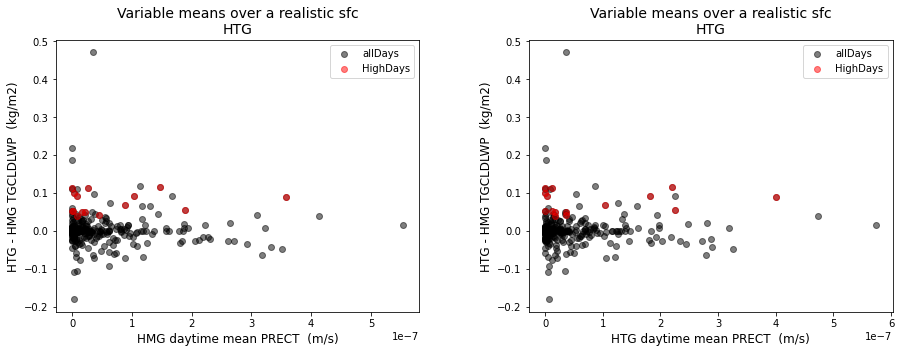

In [432]:
# ## Plot relationships to nocturnal mean in HMG... 

# # Variable of interest...
# yDiffVar = 'TGCLDLWP'

# # As a function of.... (averaged over some layer)
# xVar     = 'V_interp'
# # Get mean of xVar over 870-950 hPa 
# selLevs_xVar     = realSfc_noctMean[xVar].isel(levInterp = np.arange(-11,-2)) 
# # selLevs_xVar     = realSfc_dayMean[xVar].isel(levInterp = np.arange(-13,-2))
# selLevs_xVarMean = selLevs_xVar.mean(dim='levInterp')

# fig,axs = plt.subplots(1,2, figsize=(15,5))
# axs     = axs.ravel()
# fig.subplots_adjust(wspace=0.3, hspace=0.5)


# axs[0].plot(np.squeeze(selLevs_xVarMean[:,0]), 
#                np.squeeze(realSfc_dayMean[yDiffVar].values[:,1] - realSfc_dayMean[yDiffVar].values[:,0]), 
#                'ko', alpha=0.5,label='allDays')

# axs[0].plot(np.squeeze(selLevs_xVarMean[listHigh_real,0]), 
#                np.squeeze(realSfc_dayMean[yDiffVar].values[listHigh_real,1] - realSfc_dayMean[yDiffVar].values[listHigh_real,0]), 
#                'ro', alpha=0.5,label='HighDays')

# axs[0].set_title('Variable means over a realistic sfc\nHTG', fontsize=14)
# axs[0].set_ylabel('HTG - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
# axs[0].set_xlabel('HMG nocturnal mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)
# axs[0].legend()


# axs[1].plot(np.squeeze(selLevs_xVarMean[:,0]), 
#                np.squeeze(realSfc_dayMean[yDiffVar].values[:,2] - realSfc_dayMean[yDiffVar].values[:,0]), 
#                'ko', alpha=0.5)
# axs[1].plot(np.squeeze(selLevs_xVarMean[listHigh_real,0]), 
#                np.squeeze(realSfc_dayMean[yDiffVar].values[listHigh_real,2] - realSfc_dayMean[yDiffVar].values[listHigh_real,0]), 
#                'ro', alpha=0.5)

# axs[1].set_title('\nHTG10', fontsize=14)
# axs[1].set_ylabel('HTG10 - HMG '+yDiffVar+'  ('+realSfc_allCases[yDiffVar].units+')', fontsize=12)
# axs[1].set_xlabel('HMG nocturnal mean '+xVar+ '  ('+realSfc_allCases[xVar].units+')', fontsize=12)


# # Shading based on 900 hPa nocturnal wind magnitude
# # shadeVar     = 'TKE_interp'
# # selLevs_shadeVar     = realSfc_noctMean[shadeVar].isel(levInterp = np.arange(-13,-2))
# # selLevs_shadeVarMean = selLevs_shadeVar.mean(dim='levInterp')

# # axs[0].set_title(xVar+'\n  vs. '+yDiffVar+' difference', fontsize=14)
# # axs[0].scatter(np.squeeze(selLevs_xVarMean[:,0]), 
# #                np.squeeze(realSfc_dayMean[yDiffVar].values[:,1] - realSfc_dayMean[yDiffVar].values[:,0]), 
# #                c=selLevs_shadeVarMean[:,0,0,0],cmap='cool', alpha=0.5)
# # axs[0].set_ylabel('HTGreal - HMGreal')
# # axs[0].set_xlabel(xVar+' averaged over 850-950 hPa')
# # axs[0].set_ylabel(yDiffVar+' difference')

# # axs[1].scatter(np.squeeze(selLevs_xVarMean[:,0]), 
# #                np.squeeze(realSfc_dayMean[yDiffVar].values[:,2] - realSfc_dayMean[yDiffVar].values[:,0]), 
# #                c=selLevs_shadeVarMean[:,0,0,0],cmap='cool', alpha=0.5)
# # axs[1].set_ylabel('HTG10real - HMGreal')

# # print('Shading based on mean night-time WindMagnitude, averaged over 850-950 hPa')

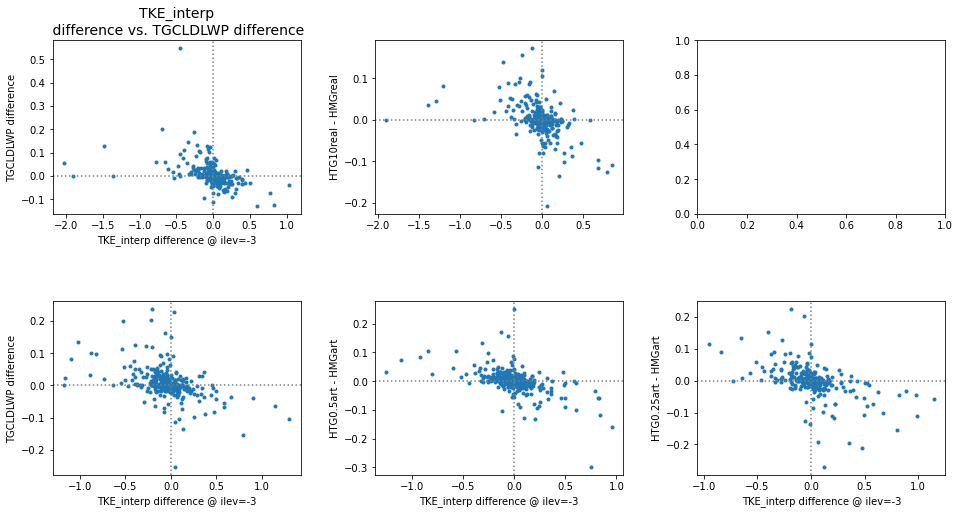

In [35]:
# ## Plot relationships? 

# # Variable of interest...
# yDiffVar = 'TGCLDLWP'

# # As a function of....
# xVar     = 'TKE_interp'
# xVarLev  = -3

# fig,axs = plt.subplots(2,3, figsize=(16,8))
# axs     = axs.ravel()
# fig.subplots_adjust(wspace=0.3, hspace=0.5)

# axs[0].set_title(xVar+'\n difference vs. '+yDiffVar+' difference', fontsize=14)
# axs[0].plot(np.squeeze(realSfc_dayMean[xVar].values[:,1,xVarLev,0,0] - realSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(realSfc_dayMean[yDiffVar].values[:,1] - realSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[0].set_ylabel('HTGreal - HMGreal')
# axs[0].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))
# axs[0].set_ylabel(yDiffVar+' difference')
# axs[0].axhline(0,color='grey',linestyle=':')
# axs[0].axvline(0,color='grey',linestyle=':')

# axs[1].plot(np.squeeze(realSfc_dayMean[xVar].values[:,2,xVarLev,0,0] - realSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(realSfc_dayMean[yDiffVar].values[:,2] - realSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[1].set_ylabel('HTG10real - HMGreal')
# axs[1].axhline(0,color='grey',linestyle=':')
# axs[1].axvline(0,color='grey',linestyle=':')

# axs[3].plot(np.squeeze(artSfc_dayMean[xVar].values[:,1,xVarLev,0,0] - artSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(artSfc_dayMean[yDiffVar].values[:,1] - artSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[3].set_ylabel('HTGart - HMGart')
# axs[3].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))
# axs[3].set_ylabel(yDiffVar+' difference')
# axs[3].axhline(0,color='grey',linestyle=':')
# axs[3].axvline(0,color='grey',linestyle=':')

# axs[4].plot(np.squeeze(artSfc_dayMean[xVar].values[:,2,xVarLev,0,0] - artSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(artSfc_dayMean[yDiffVar].values[:,2] - artSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[4].set_ylabel('HTG0.5art - HMGart')
# axs[4].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))
# axs[4].axhline(0,color='grey',linestyle=':')
# axs[4].axvline(0,color='grey',linestyle=':')

# axs[5].plot(np.squeeze(artSfc_dayMean[xVar].values[:,3,xVarLev,0,0] - artSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(artSfc_dayMean[yDiffVar].values[:,3] - artSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[5].set_ylabel('HTG0.25art - HMGart')
# axs[5].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))
# axs[5].axhline(0,color='grey',linestyle=':')
# axs[5].axvline(0,color='grey',linestyle=':')


Text(0.5, 0, 'CLDTOT difference @ ilev=None')

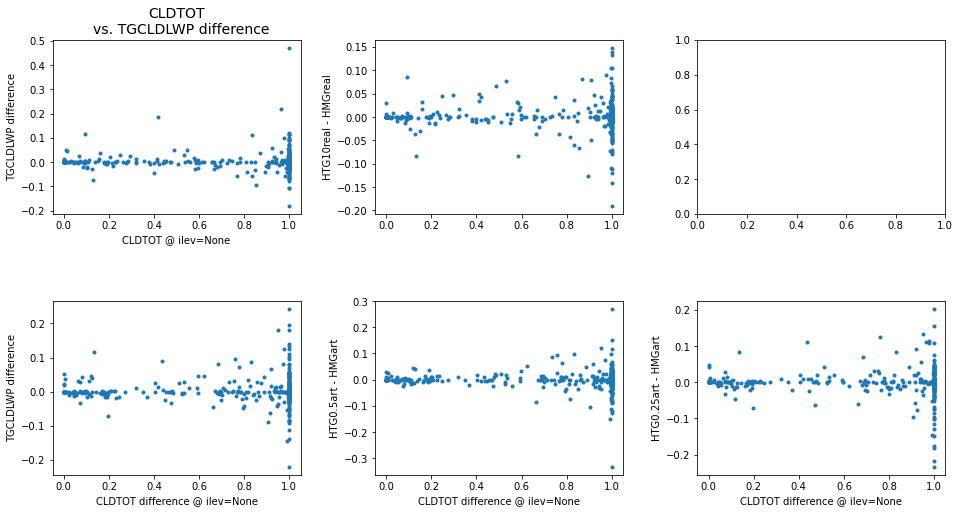

In [36]:
# ## Plot relationships? 

# # Variable of interest...
# yDiffVar = 'TGCLDLWP'

# # As a function of....
# xVar     = 'CLDTOT'
# xVarLev  = None

# fig,axs = plt.subplots(2,3, figsize=(16,8))
# axs     = axs.ravel()
# fig.subplots_adjust(wspace=0.3, hspace=0.5)

# axs[0].set_title(xVar+'\n  vs. '+yDiffVar+' difference', fontsize=14)
# axs[0].plot(np.squeeze(realSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(realSfc_dayMean[yDiffVar].values[:,1] - realSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[0].set_ylabel('HTGreal - HMGreal')
# axs[0].set_xlabel(xVar+' @ ilev='+str(xVarLev))
# axs[0].set_ylabel(yDiffVar+' difference')

# axs[1].plot(np.squeeze(realSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(realSfc_dayMean[yDiffVar].values[:,2] - realSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[1].set_ylabel('HTG10real - HMGreal')

# axs[3].plot(np.squeeze(artSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(artSfc_dayMean[yDiffVar].values[:,1] - artSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[3].set_ylabel('HTGart - HMGart')
# axs[3].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))
# axs[3].set_ylabel(yDiffVar+' difference')

# axs[4].plot(np.squeeze(artSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(artSfc_dayMean[yDiffVar].values[:,2] - artSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[4].set_ylabel('HTG0.5art - HMGart')
# axs[4].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))

# axs[5].plot(np.squeeze(artSfc_dayMean[xVar].values[:,0,xVarLev,0,0]), 
#             np.squeeze(artSfc_dayMean[yDiffVar].values[:,3] - artSfc_dayMean[yDiffVar].values[:,0]), 
#             'o', markersize=3)
# axs[5].set_ylabel('HTG0.25art - HMGart')
# axs[5].set_xlabel(xVar+' difference @ ilev='+str(xVarLev))


**Match those days in full arrays**

In [44]:
'''
Find all the times in the full array (20m dt) that line up with the day classifications above. 
'''
def getTimes_basedOnDates(fullDS, matchDatesDS):
    iTimes = []
    
    for iTime in range(len(matchDatesDS.year_month_day.values)):
        iKeepTimes = np.where((fullDS['time.year'] ==matchDatesDS.year_month_day_level_0.values[iTime]) &
                              (fullDS['time.month']==matchDatesDS.year_month_day_level_1.values[iTime]) & 
                              (fullDS['time.day']  ==matchDatesDS.year_month_day_level_2.values[iTime]))[0]    
        iTimes = np.append(iTimes, iKeepTimes).astype(int)
    
    # Now select only those times in the local time array
    DS_dayClass = fullDS.isel(time=iTimes)
    
    return(DS_dayClass)

In [45]:
## Get full arrays that match low/high percentiles that are consistent across surface definition 
#    ( so one set for real surface cases and one for the artificial surface cases )

# Real surface 
highPct_realSfc  = getTimes_basedOnDates(realSfc_allCases,     
                                         real_var_dayMean.isel(year_month_day=listHigh_real))

lowPct_realSfc   = getTimes_basedOnDates(realSfc_allCases,     
                                         real_var_dayMean.isel(year_month_day=listLow_real))

print('Done with real surface cases ')


# # Artificial surface 
# highPct_artSfc     = getTimes_basedOnDates(artSfc_all,     
#                                            art_var_dayMean.isel(year_month_day=listHigh_art))


# lowPct_artSfc      = getTimes_basedOnDates(artSfc_all,     
#                                            art_var_dayMean.isel(year_month_day=listLow_art))


print('Done with artificial surface cases')


# Matching observational datasets 
highPct_realSfc_obs = getTimes_basedOnDates(nateDS_local,     
                                            real_var_dayMean.isel(year_month_day=listHigh_real))
                                                 
lowPct_realSfc_obs = getTimes_basedOnDates(nateDS_local,     
                                            real_var_dayMean.isel(year_month_day=listLow_real))


# highPct_artSfc_obs   = getTimes_basedOnDates(nateDS_local,     
#                                              art_var_dayMean.isel(year_month_day=listHigh_art))

# lowPct_artSfc_obs   = getTimes_basedOnDates(nateDS_local,     
#                                             art_var_dayMean.isel(year_month_day=listLow_art))


print('Done with obs cases')



Done with real surface cases 
Done with artificial surface cases
Done with obs cases


In [46]:
## Get arrays with other % of days that don't fall into the category of the extremes 
restOfDays_realSfc   = getTimes_basedOnDates(realSfc_allCases,     
                                             real_var_dayMean.isel(year_month_day=restOfIndices_real))

# restOfDays_artSfc    = getTimes_basedOnDates(artSfc_all,     
#                                              art_var_dayMean.isel(year_month_day=restOfIndices_art))


restOfDays_realSfc_obs   = getTimes_basedOnDates(nateDS_local,     
                                             real_var_dayMean.isel(year_month_day=restOfIndices_real))

# restOfDays_artSfc_obs    = getTimes_basedOnDates(nateDS_local,     
#                                              art_var_dayMean.isel(year_month_day=restOfIndices_art))


print('Done getting datasets with rest of the days')


Done getting datasets with rest of the days


In [47]:
len(np.unique(restOfDays_realSfc.year_month_day.values))

280

In [48]:
## Get those days in CLM dataset too 

# Real surface 
highPct_realSfcCLM  = getTimes_basedOnDates(realSfcCLM_allCases,     
                                            real_var_dayMean.isel(year_month_day=listHigh_real))

lowPct_realSfcCLM   = getTimes_basedOnDates(realSfcCLM_allCases,     
                                            real_var_dayMean.isel(year_month_day=listLow_real))

# # Artificial surface 
# highPct_artSfcCLM  = getTimes_basedOnDates(artSfcCLM_all,     
#                                             real_var_dayMean.isel(year_month_day=listHigh_art))

# lowPct_artSfcCLM   = getTimes_basedOnDates(artSfcCLM_all,     
#                                             real_var_dayMean.isel(year_month_day=listLow_art))


# Get rest of the days 
restOfDays_realSfcCLM   = getTimes_basedOnDates(realSfcCLM_allCases,     
                                                real_var_dayMean.isel(year_month_day=restOfIndices_real))

# restOfDays_artSfcCLM    = getTimes_basedOnDates(artSfcCLM_all,     
#                                                art_var_dayMean.isel(year_month_day=restOfIndices_art))

print('Done getting CLM datasets')

Done getting CLM datasets


In [49]:
## Get those days in CLM (patch - level) dataset too 

# Real surface 
highPct_realSfcCLMpatch  = getTimes_basedOnDates(realSfcCLMpatch_allCases,     
                                            real_var_dayMean.isel(year_month_day=listHigh_real))

lowPct_realSfcCLMpatch   = getTimes_basedOnDates(realSfcCLMpatch_allCases,     
                                            real_var_dayMean.isel(year_month_day=listLow_real))

# Get rest of the days 
restOfDays_realSfcCLMpatch   = getTimes_basedOnDates(realSfcCLMpatch_allCases,     
                                                real_var_dayMean.isel(year_month_day=restOfIndices_real))


print('Done getting CLM datasets')

Done getting CLM datasets


### Look at days individually

In [190]:
posDates = np.unique(highPct_realSfc.year_month_day)
negDates = np.unique(lowPct_realSfc.year_month_day)

nPos = len(posDates)
nNeg = len(negDates)

print('Number of positive days: ',nPos)
print('Number of negative days: ',nNeg)


Number of positive days:  36
Number of negative days:  36


Text(0, 0.5, 'm')

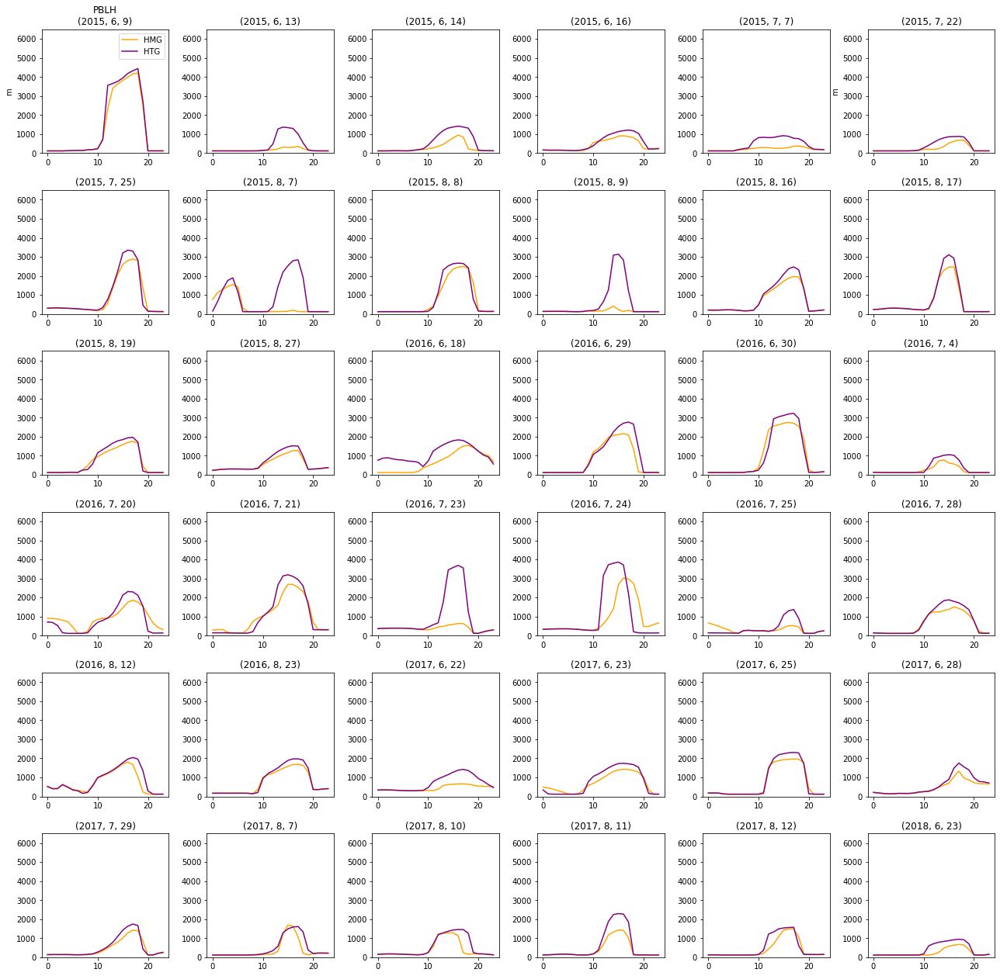

In [191]:
## Plot diurnal cycles for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))

axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'PBLH'

for iDay in range(nPos):
    #Select this time in array 
    iselDay = np.where((highPct_realSfc['time.year']  == posDates[iDay][0]) & 
                      (highPct_realSfc['time.month'] == posDates[iDay][1]) & 
                      (highPct_realSfc['time.day']   == posDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = highPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=0)[varSelPlot].values), color='orange', label='HMG')
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=1)[varSelPlot].values), color='purple', label='HTG')
#     axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=2)[varSelPlot].values), color='purple', label='HTG10')
    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+'\n'+str(posDates[iDay]))
        axs[iDay].legend()
    else:
        axs[iDay].set_title(str(posDates[iDay]))
        
    #set a consistent y limit
    axs[iDay].set_ylim([0,6500])
        
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)



Text(0, 0.5, 'fraction')

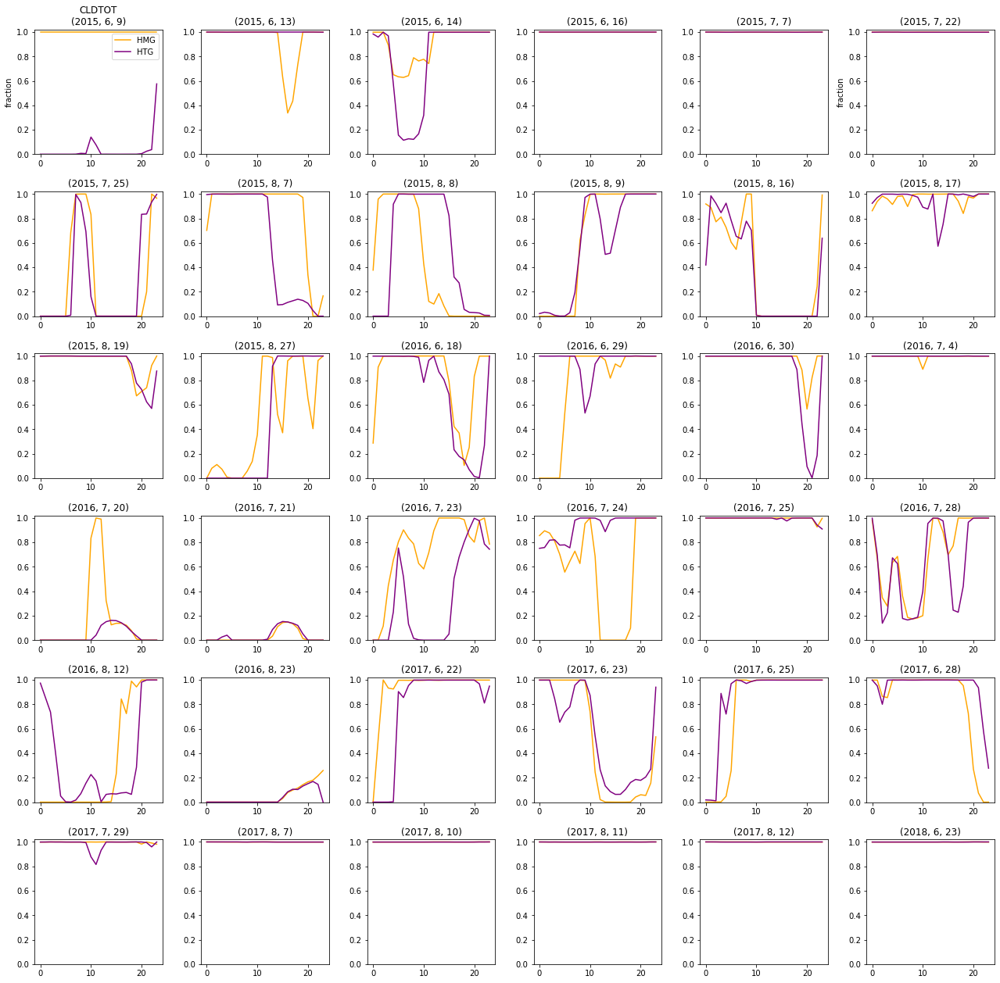

In [204]:
## Plot diurnal cycles for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'CLDTOT'

for iDay in range(nPos):
    #Select this time in array 
    iselDay = np.where((highPct_realSfc['time.year']  == posDates[iDay][0]) & 
                      (highPct_realSfc['time.month'] == posDates[iDay][1]) & 
                      (highPct_realSfc['time.day']   == posDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = highPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=0)[varSelPlot].values), color='orange', label='HMG')
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=1)[varSelPlot].values), color='purple', label='HTG')
#     axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=2)[varSelPlot].values), color='purple', label='HTG10')

    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+'\n'+str(posDates[iDay]))
        axs[iDay].legend()
    else:
        axs[iDay].set_title(str(posDates[iDay]))
        
    axs[iDay].set_ylim([0, 1.02])
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)


Text(0, 0.5, 'm/s')

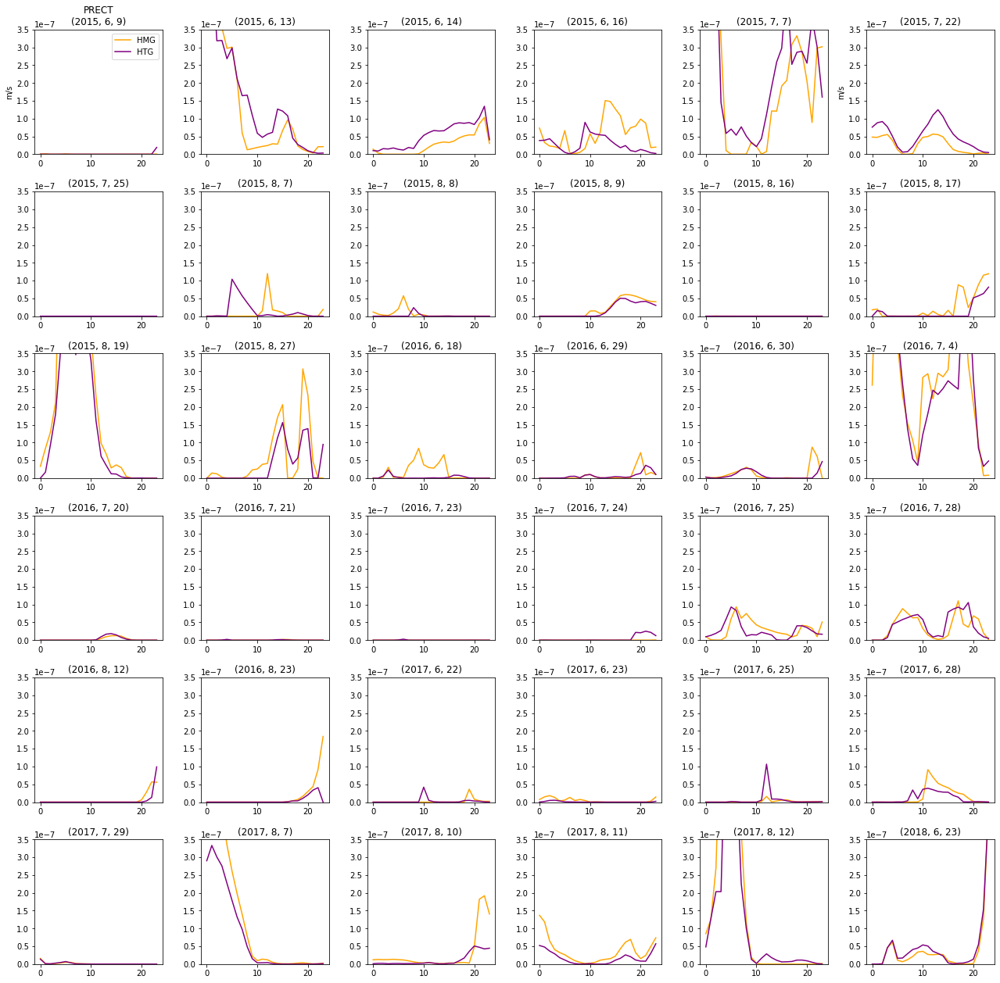

In [208]:
## Plot diurnal cycles for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'PRECT'

for iDay in range(nPos):
    #Select this time in array 
    iselDay = np.where((highPct_realSfc['time.year']  == posDates[iDay][0]) & 
                      (highPct_realSfc['time.month'] == posDates[iDay][1]) & 
                      (highPct_realSfc['time.day']   == posDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = highPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=0)[varSelPlot].values), color='orange', label='HMG')
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=1)[varSelPlot].values), color='purple', label='HTG')
#     axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=2)[varSelPlot].values), color='purple', label='HTG10')

    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+'\n'+str(posDates[iDay]))
        axs[iDay].legend()
    else:
        axs[iDay].set_title(str(posDates[iDay]))
        
    axs[iDay].set_ylim([0, 3.5e-7])
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)


Text(0, 0.5, 'm/s')

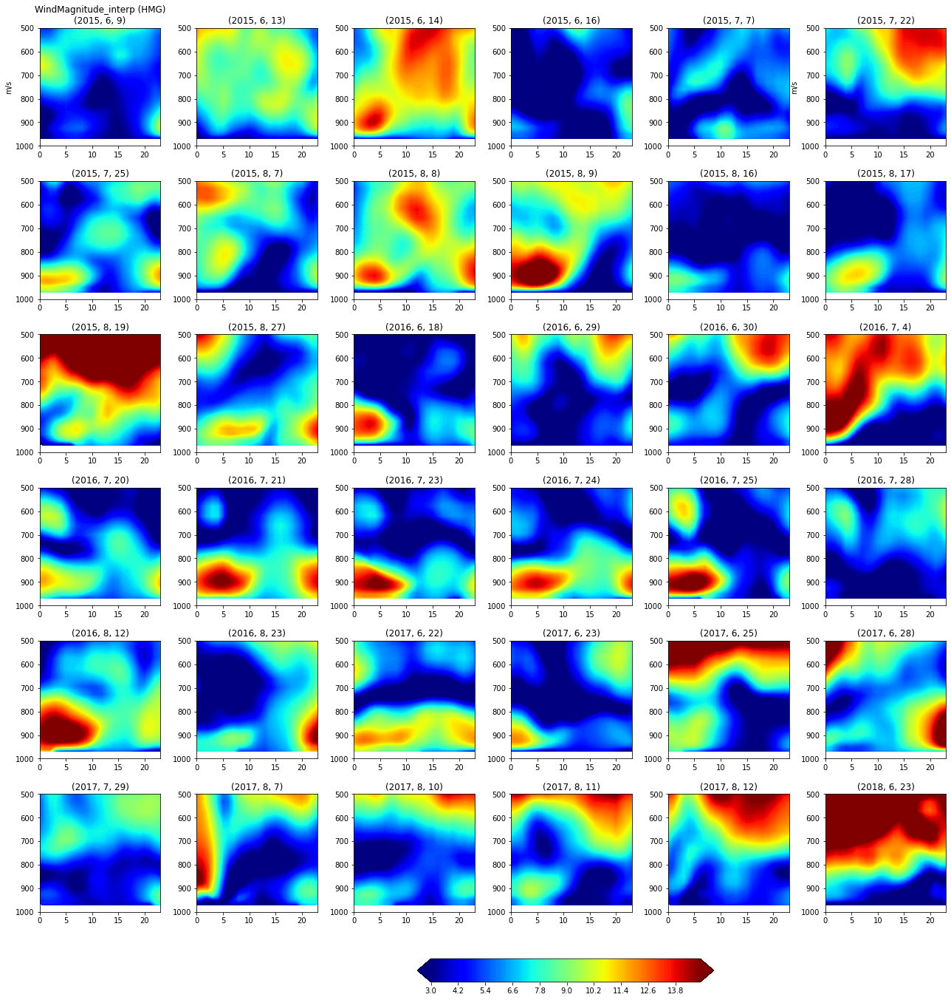

In [213]:
## Plot contours of HMG fields for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'WindMagnitude_interp'
levsRaw  = np.arange(3,15,0.1)

for iDay in range(nPos):
    #Select this time in array 
    iselDay = np.where((highPct_realSfc['time.year']  == posDates[iDay][0]) & 
                       (highPct_realSfc['time.month'] == posDates[iDay][1]) & 
                       (highPct_realSfc['time.day']   == posDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = highPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    contour_plot = axs[iDay].contourf(np.arange(24), selDayDS.levInterp.values, 
                                      np.squeeze(selDayDS.isel(case=0)[varSelPlot].values).transpose(),
                                      levels=levsRaw, cmap='jet',extend='both')
    # Add colorbar
    if iDay==33:
        ax_position = axs[iDay].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.06, ax_position.width+0.15, 0.02])
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)

    axs[iDay].invert_yaxis()
    axs[iDay].set_ylim([1000, 500])
    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+' (HMG)\n'+str(posDates[iDay]))
    else:
        axs[iDay].set_title(str(posDates[iDay]))
        
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)


Text(0, 0.5, 'm/s')

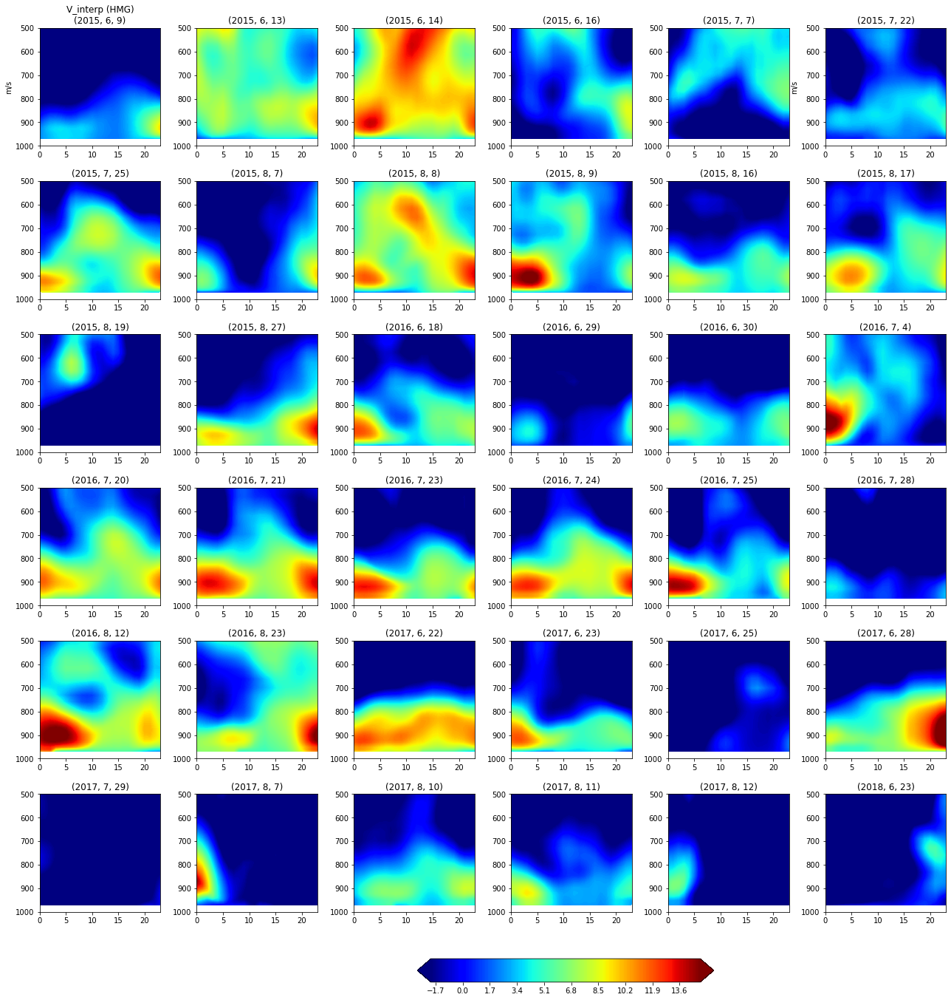

In [214]:
## Plot contours of HMG fields for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'V_interp'
levsRaw  = np.arange(-2,15,0.1)

for iDay in range(nPos):
    #Select this time in array 
    iselDay = np.where((highPct_realSfc['time.year']  == posDates[iDay][0]) & 
                       (highPct_realSfc['time.month'] == posDates[iDay][1]) & 
                       (highPct_realSfc['time.day']   == posDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = highPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    contour_plot = axs[iDay].contourf(np.arange(24), selDayDS.levInterp.values, 
                                      np.squeeze(selDayDS.isel(case=0)[varSelPlot].values).transpose(),
                                      levels=levsRaw, cmap='jet',extend='both')
    # Add colorbar
    if iDay==33:
        ax_position = axs[iDay].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.06, ax_position.width+0.15, 0.02])
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)

    axs[iDay].invert_yaxis()
    axs[iDay].set_ylim([1000, 500])
    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+' (HMG)\n'+str(posDates[iDay]))
    else:
        axs[iDay].set_title(str(posDates[iDay]))
        
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)


**Negative response days**

Text(0, 0.5, 'm')

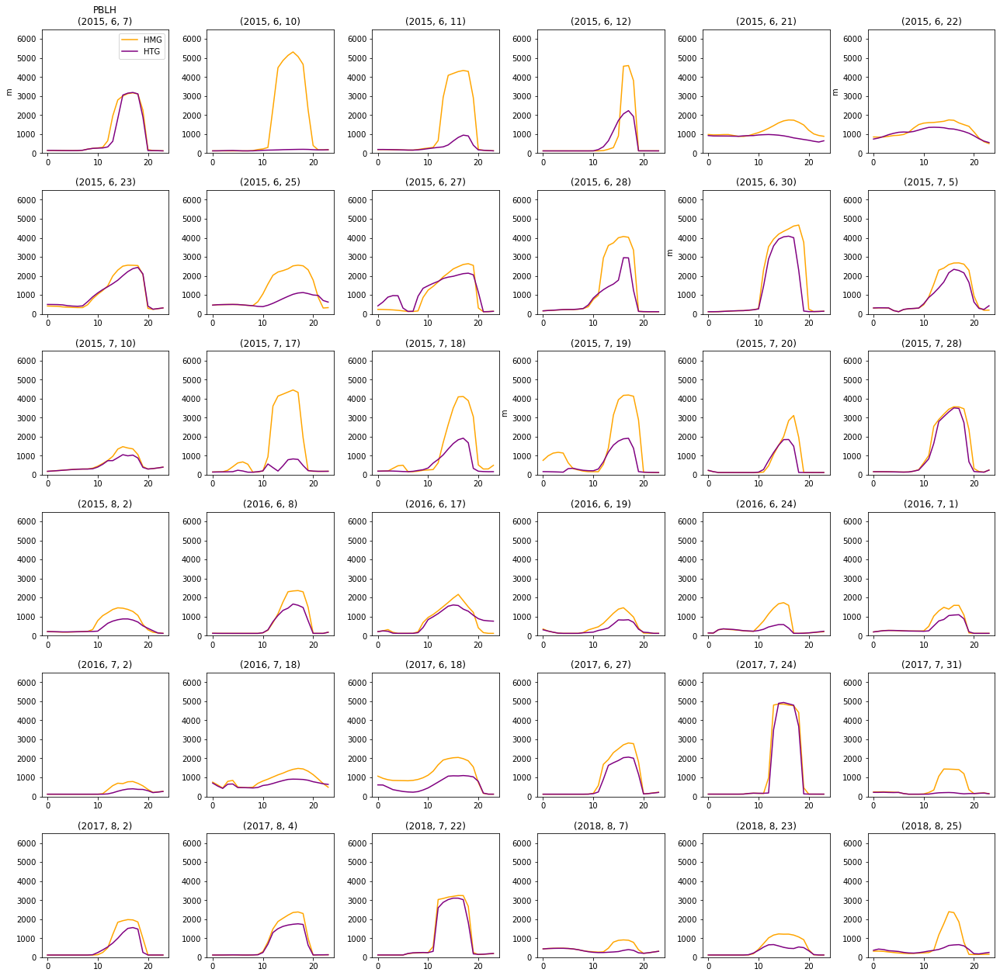

In [215]:
## Plot diurnal cycles for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'PBLH'

for iDay in range(nNeg):
    #Select this time in array 
    iselDay = np.where((lowPct_realSfc['time.year']  == negDates[iDay][0]) & 
                      (lowPct_realSfc['time.month'] == negDates[iDay][1]) & 
                      (lowPct_realSfc['time.day']   == negDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = lowPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=0)[varSelPlot].values), color='orange', label='HMG')
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=1)[varSelPlot].values), color='purple', label='HTG')
#     axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=2)[varSelPlot].values), color='purple', label='HTG10')

    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+'\n'+str(negDates[iDay]))
        axs[iDay].legend()
    else:
        axs[iDay].set_title(str(negDates[iDay]))
        
    #set a consistent y limit
    axs[iDay].set_ylim([0,6500])
#     axs[iDay].set_ylim([0,2000])

        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[10].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[15].set_ylabel(realSfc_allCases[varSelPlot].units)



Text(0, 0.5, 'fraction')

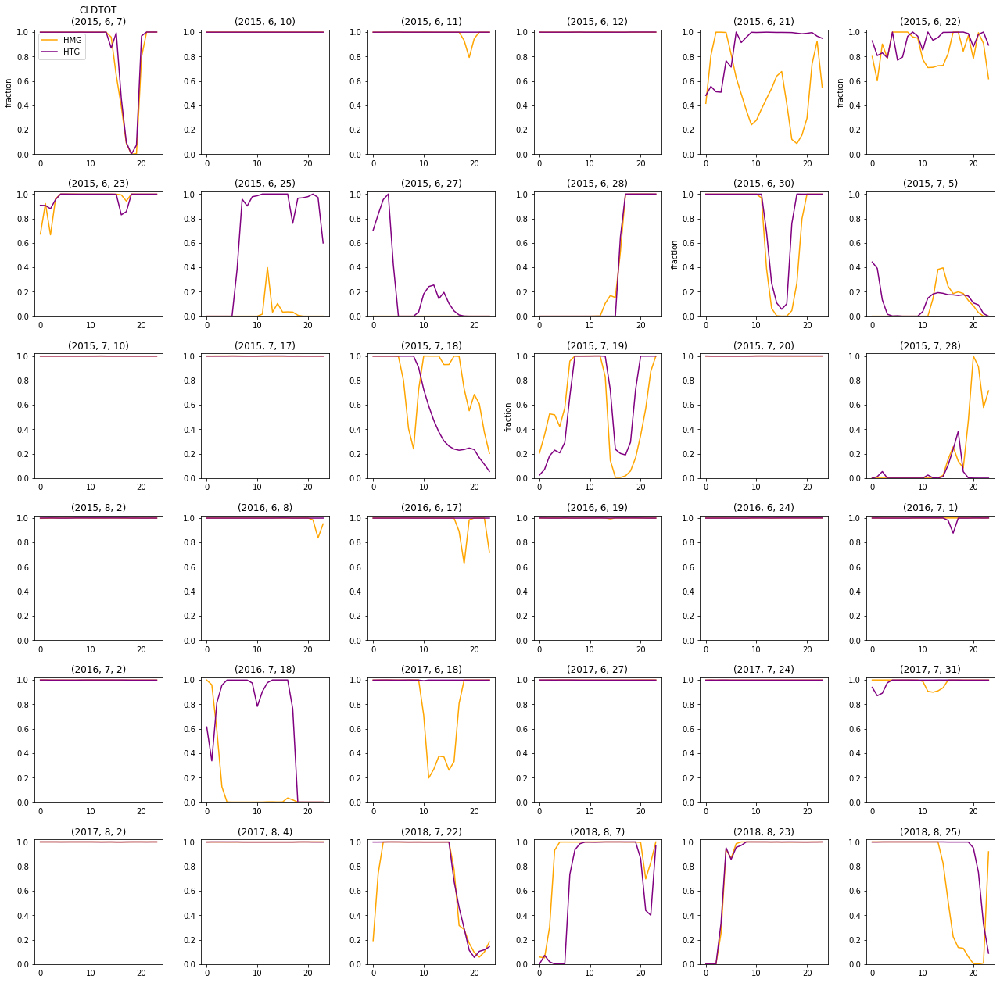

In [216]:
## Plot diurnal cycles for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'CLDTOT'

for iDay in range(nNeg):
    #Select this time in array 
    iselDay = np.where((lowPct_realSfc['time.year']  == negDates[iDay][0]) & 
                      (lowPct_realSfc['time.month']  == negDates[iDay][1]) & 
                      (lowPct_realSfc['time.day']    == negDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = lowPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=0)[varSelPlot].values), color='orange', label='HMG')
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=1)[varSelPlot].values), color='purple', label='HTG')
#     axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=2)[varSelPlot].values), color='purple', label='HTG10')

    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+'\n'+str(negDates[iDay]))
        axs[iDay].legend()
    else:
        axs[iDay].set_title(str(negDates[iDay]))
        
    axs[iDay].set_ylim([0, 1.02])
    
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[10].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[15].set_ylabel(realSfc_allCases[varSelPlot].units)



Text(0, 0.5, 'm/s')

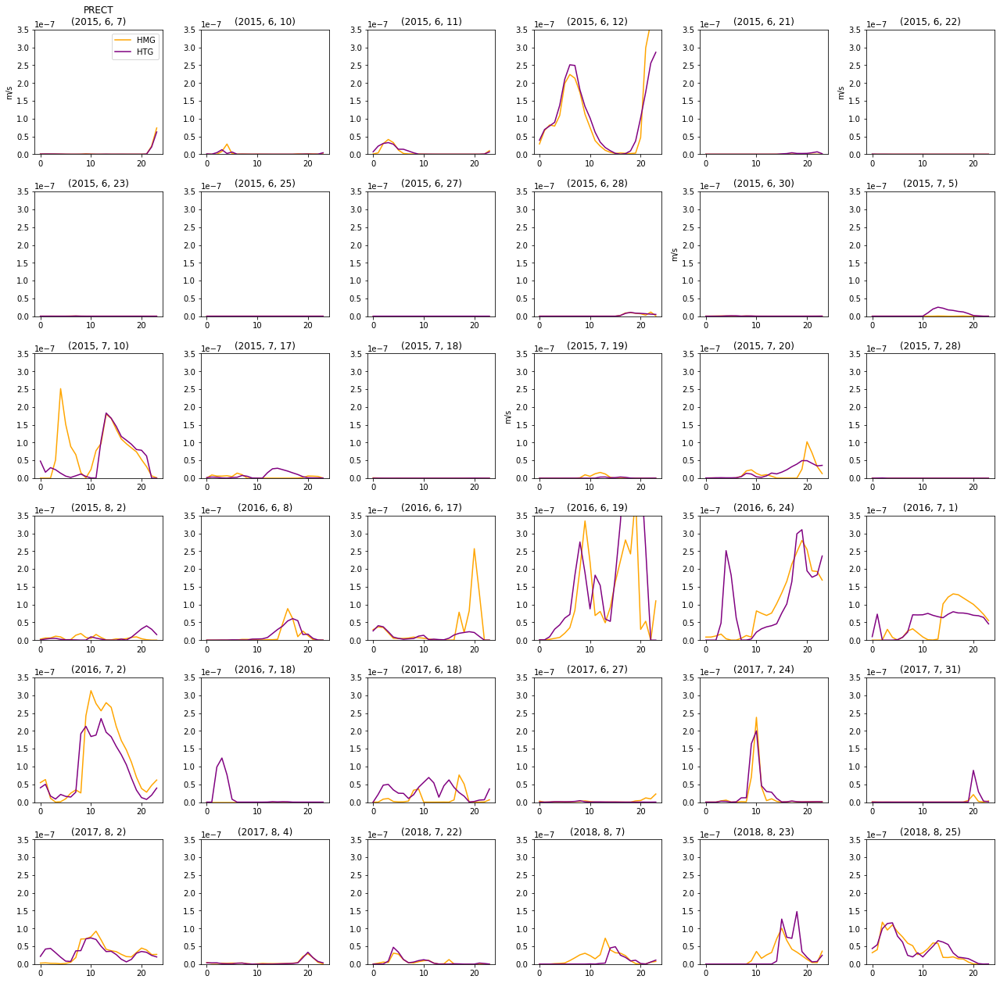

In [217]:
## Plot diurnal cycles for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'PRECT'

for iDay in range(nNeg):
    #Select this time in array 
    iselDay = np.where((lowPct_realSfc['time.year']  == negDates[iDay][0]) & 
                      (lowPct_realSfc['time.month'] == negDates[iDay][1]) & 
                      (lowPct_realSfc['time.day']   == negDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = lowPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=0)[varSelPlot].values), color='orange', label='HMG')
    axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=1)[varSelPlot].values), color='purple', label='HTG')
#     axs[iDay].plot(np.arange(24), np.squeeze(selDayDS.isel(case=2)[varSelPlot].values), color='purple', label='HTG10')

    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+'\n'+str(negDates[iDay]))
        axs[iDay].legend()
    else:
        axs[iDay].set_title(str(negDates[iDay]))
        
    axs[iDay].set_ylim([0, 3.5e-7])
    
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[10].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[15].set_ylabel(realSfc_allCases[varSelPlot].units)



Text(0, 0.5, 'm/s')

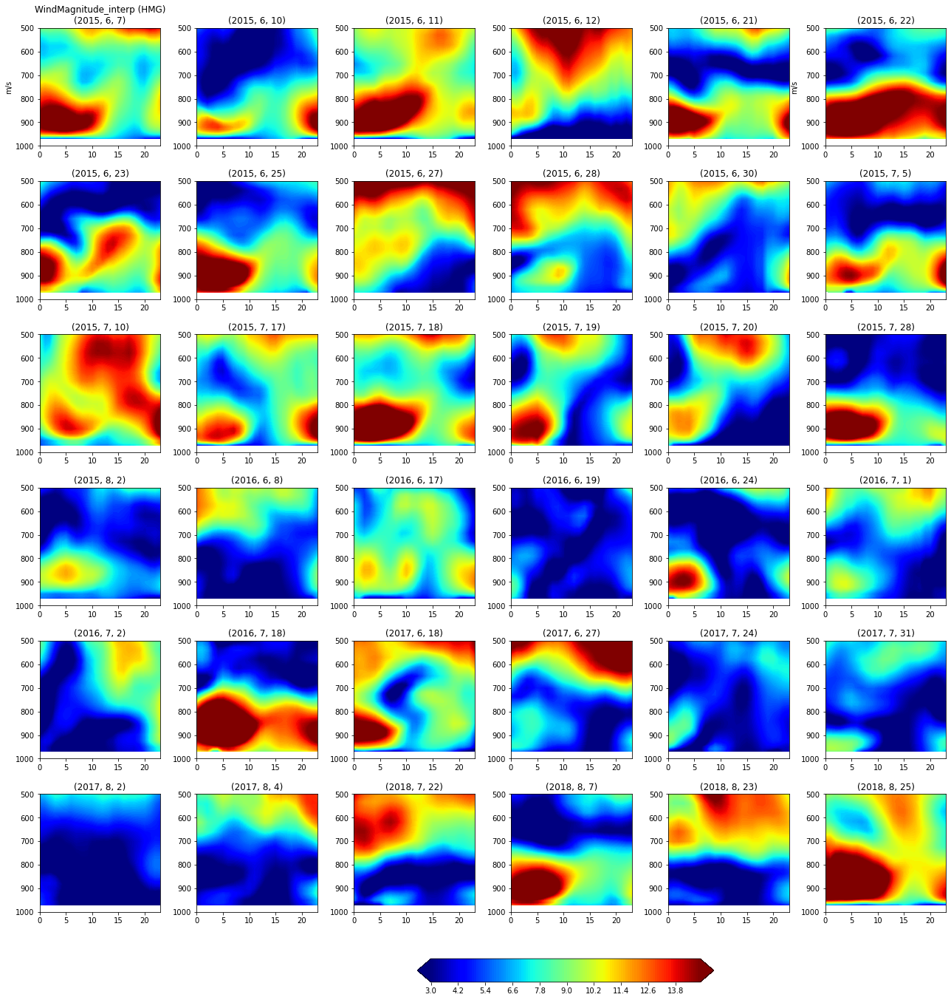

In [218]:
## Plot contours of HMG fields for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'WindMagnitude_interp'
levsRaw  = np.arange(3,15,0.1)

for iDay in range(nNeg):
    #Select this time in array 
    iselDay = np.where((lowPct_realSfc['time.year']  == negDates[iDay][0]) & 
                       (lowPct_realSfc['time.month'] == negDates[iDay][1]) & 
                       (lowPct_realSfc['time.day']   == negDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = lowPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    contour_plot = axs[iDay].contourf(np.arange(24), selDayDS.levInterp.values, 
                                      np.squeeze(selDayDS.isel(case=0)[varSelPlot].values).transpose(),
                                      levels=levsRaw, cmap='jet',extend='both')
    # Add colorbar
    if iDay==33:
        ax_position = axs[iDay].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.06, ax_position.width+0.15, 0.02])
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)

    axs[iDay].invert_yaxis()
    axs[iDay].set_ylim([1000, 500])
    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+' (HMG)\n'+str(negDates[iDay]))
    else:
        axs[iDay].set_title(str(negDates[iDay]))
        
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)


Text(0, 0.5, 'm/s')

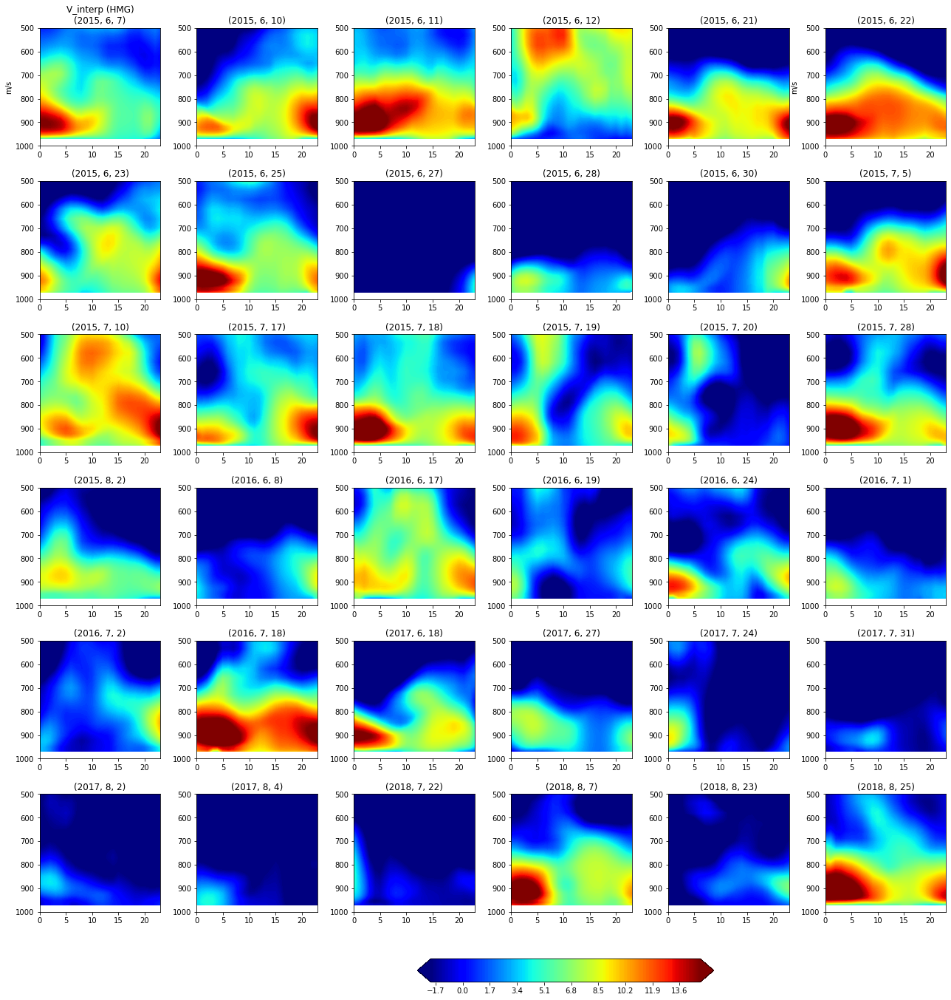

In [219]:
## Plot contours of HMG fields for LWP-increase days 

# fig,axs = plt.subplots(3,5, figsize=(22,10))
fig,axs = plt.subplots(6,6, figsize=(22,22))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.3, wspace=0.3)

varSelPlot = 'V_interp'
levsRaw  = np.arange(-2,15,0.1)

for iDay in range(nNeg):
    #Select this time in array 
    iselDay = np.where((lowPct_realSfc['time.year']  == negDates[iDay][0]) & 
                       (lowPct_realSfc['time.month'] == negDates[iDay][1]) & 
                       (lowPct_realSfc['time.day']   == negDates[iDay][2]))[0]
    
    # Get hourly means for just this selected day
    selDayDS = lowPct_realSfc.isel(time=iselDay).groupby('time.hour').mean()
    
    contour_plot = axs[iDay].contourf(np.arange(24), selDayDS.levInterp.values, 
                                      np.squeeze(selDayDS.isel(case=0)[varSelPlot].values).transpose(),
                                      levels=levsRaw, cmap='jet',extend='both')
    # Add colorbar
    if iDay==33:
        ax_position = axs[iDay].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.06, ax_position.width+0.15, 0.02])
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)

    axs[iDay].invert_yaxis()
    axs[iDay].set_ylim([1000, 500])
    
    if iDay==0:
        axs[iDay].set_title(varSelPlot+' (HMG)\n'+str(negDates[iDay]))
    else:
        axs[iDay].set_title(str(negDates[iDay]))
        
        
axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[5].set_ylabel(realSfc_allCases[varSelPlot].units)


### Look at just sets of individual days... 

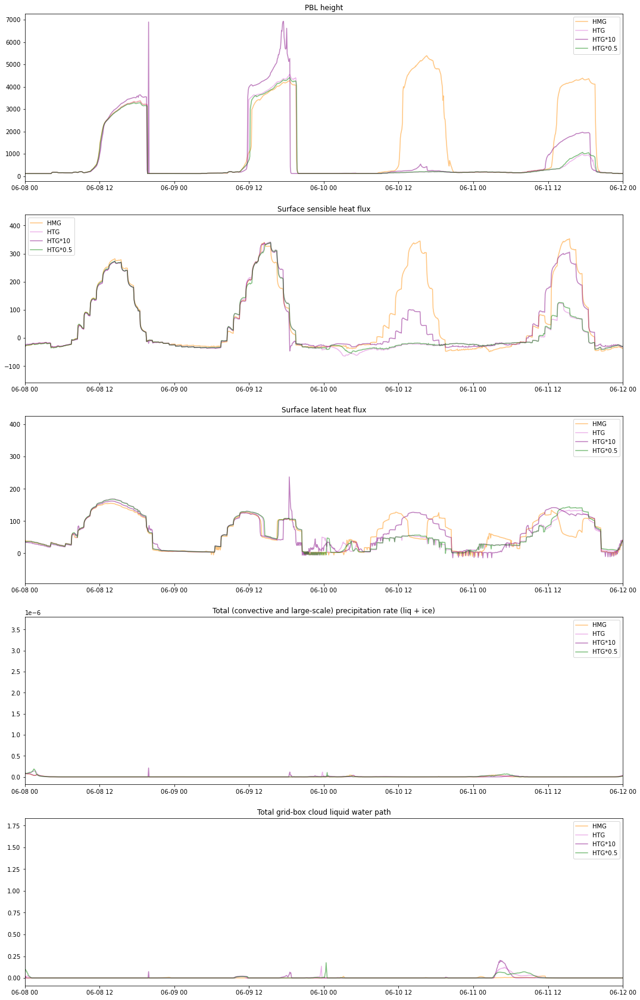

In [51]:
# Select those hours
plotVars = np.asarray(['PBLH','SHFLX','LHFLX','PRECT','TGCLDLWP'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[0,:]), color='darkorange', alpha=0.5, label='HMG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[1,:]), color='orchid', alpha=0.5, label='HTG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[2,:]), color='purple', alpha=0.5, label='HTG*10')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[3,:]), color='green',  alpha=0.5, label='HTG*0.5')

    # Add labels
    axs[iPlot].set_title(realSfc_allCases[plotVars[iPlot]].long_name)
    axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])    
#     axs[iPlot].set_xlim([datetime.date(2015,7,5), datetime.date(2015,7,20)])  
#     axs[iPlot].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  

    axs[iPlot].legend()
    
#     if iPlot==0:
#         axs[iPlot].set_ylim([0,1000])

    ## Add shading
#     axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
#     axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
#     axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')

    

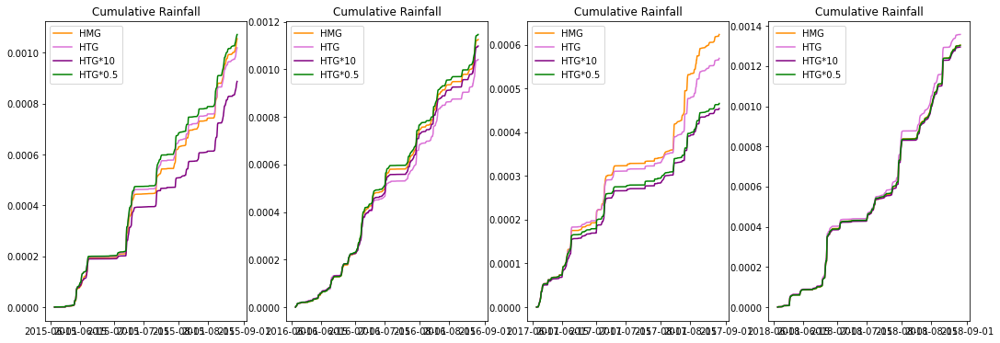

In [52]:
years = np.asarray([2015,2016,2017,2018])

fig,axs = plt.subplots(1,4, figsize=(18,6))
axs     = axs.ravel()

for plotYear in range(len(years)):
    iYear   = np.where(realSfc_allCases['time.year'].values==years[plotYear])[0]
    selYear = realSfc_allCases.isel(time=iYear)
    
    sumRain = np.cumsum(selYear['PRECT'].values, axis=1)
    
    axs[plotYear].plot(selYear.time.values, np.squeeze(sumRain[0,:]), color='darkorange', label='HMG')
    axs[plotYear].plot(selYear.time.values, np.squeeze(sumRain[1,:]), color='orchid', label='HTG')
    axs[plotYear].plot(selYear.time.values, np.squeeze(sumRain[2,:]), color='purple', label='HTG*10')
    axs[plotYear].plot(selYear.time.values, np.squeeze(sumRain[3,:]), color='green', label='HTG*0.5')

    axs[plotYear].legend()
    axs[plotYear].set_title('Cumulative Rainfall')
    
# axs[0].set_xlim([datetime.date(2015,6,1), datetime.date(2015,8,31)])  
# axs[0].set_ylim([0.00, 0.000085])

#  ## Add shading
# axs[0].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
# axs[0].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
# axs[0].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')
    

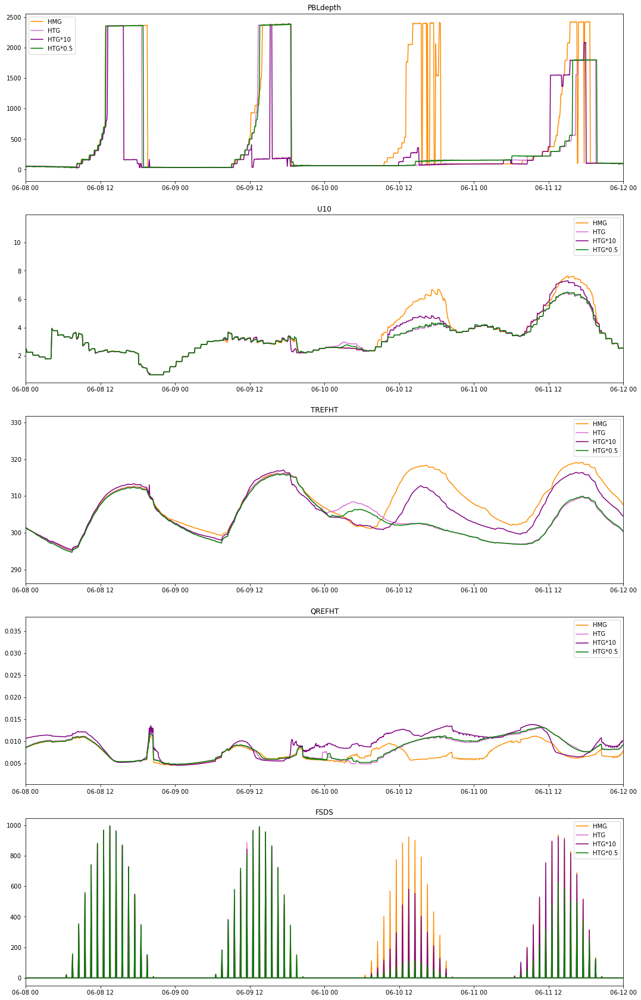

In [54]:
# Select those hours
plotVars = np.asarray(['PBLdepth','U10','TREFHT','QREFHT','FSDS'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[0,:]), color='darkorange', label='HMG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[1,:]), color='orchid',  label='HTG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[2,:]), color='purple',  label='HTG*10')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[3,:]), color='green',   label='HTG*0.5')

    # Add labels
    axs[iPlot].set_title(plotVars[iPlot])
    axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])    
#     axs[iPlot].set_xlim([datetime.date(2015,7,5), datetime.date(2015,7,20)])  
#     axs[iPlot].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
    
    ## Add shading
#     axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
#     axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
#     axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')
    
    axs[iPlot].legend()

    

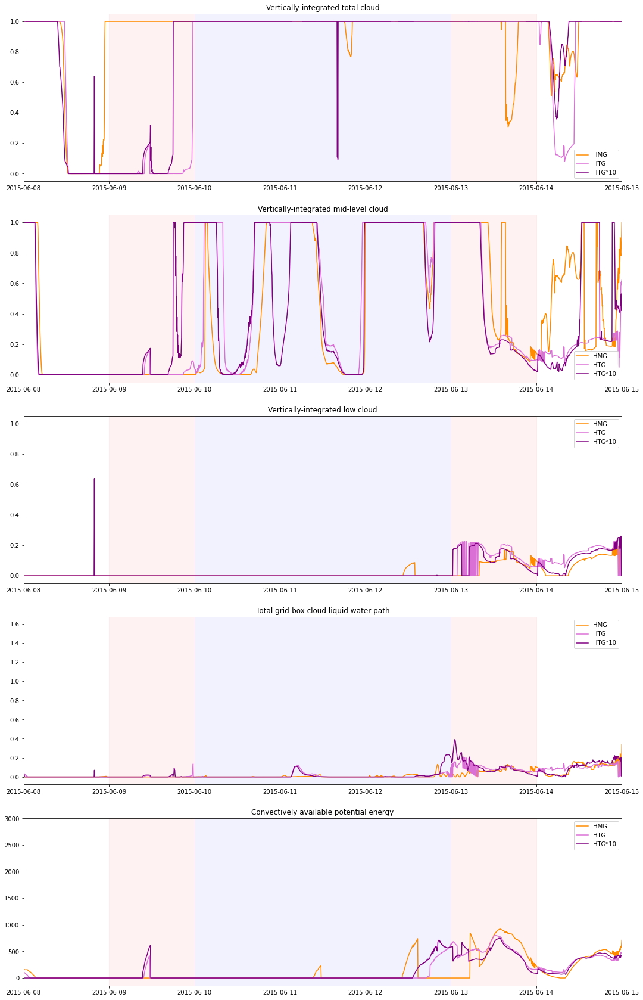

In [114]:
# Select those hours
plotVars = np.asarray(['CLDTOT','CLDMED','CLDLOW','TGCLDLWP','CAPE'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[0,:]), color='darkorange', label='HMG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[1,:]), color='orchid',  label='HTG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[2,:]), color='purple',  label='HTG*10')

    # Add labels
    axs[iPlot].set_title(realSfc_allCases[plotVars[iPlot]].long_name)
    axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,15)])    
#     axs[iPlot].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])  
#     axs[iPlot].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
    
    axs[iPlot].legend()
    
    ## Add shading
    axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
    axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
    axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')

    

In [1]:
# Select those hours
plotVars = np.asarray(['THLP2_CLUBB_interp','RTP2_CLUBB_interp','RTPTHLP_CLUBB_interp','WP2_CLUBB_interp'])
levSel   = -1
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[0,:,levSel]), color='darkorange', label='HMG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[1,:,levSel]), color='orchid',  label='HTG')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[2,:,levSel]), color='purple',  label='HTG*10')
    axs[iPlot].plot(realSfc_allCases.time.values, np.squeeze(realSfc_allCases[plotVars[iPlot]].values[3,:,levSel]), color='green',   label='HTG*0.5')

#     axs[iPlot].axhline(np.nanmean(np.squeeze(realSfc_allCases[plotVars[iPlot]].values[0,:,levSel])), color='darkorange',linestyle='--', label=None)
#     axs[iPlot].axhline(np.nanmean(np.squeeze(realSfc_allCases[plotVars[iPlot]].values[1,:,levSel])), color='orchid',linestyle='--', label=None)
#     axs[iPlot].axhline(np.nanmean(np.squeeze(realSfc_allCases[plotVars[iPlot]].values[2,:,levSel])), color='purple',linestyle='--', label=None)
            
    # Add labels
    axs[iPlot].set_title(realSfc_allCases[plotVars[iPlot]].long_name+' (lev= '+str(levSel)+')')
    axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])    
#     axs[iPlot].set_xlim([datetime.date(2015,7,5), datetime.date(2015,7,20)])  
#     axs[iPlot].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
    
    axs[iPlot].legend()

    ## Add shading
#     axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
#     axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
#     axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')

    if [plotVars[iPlot]]=='THLP2_CLUBB_interp':
        axs[iPlot].set_ylim([0,6])
    

NameError: name 'np' is not defined

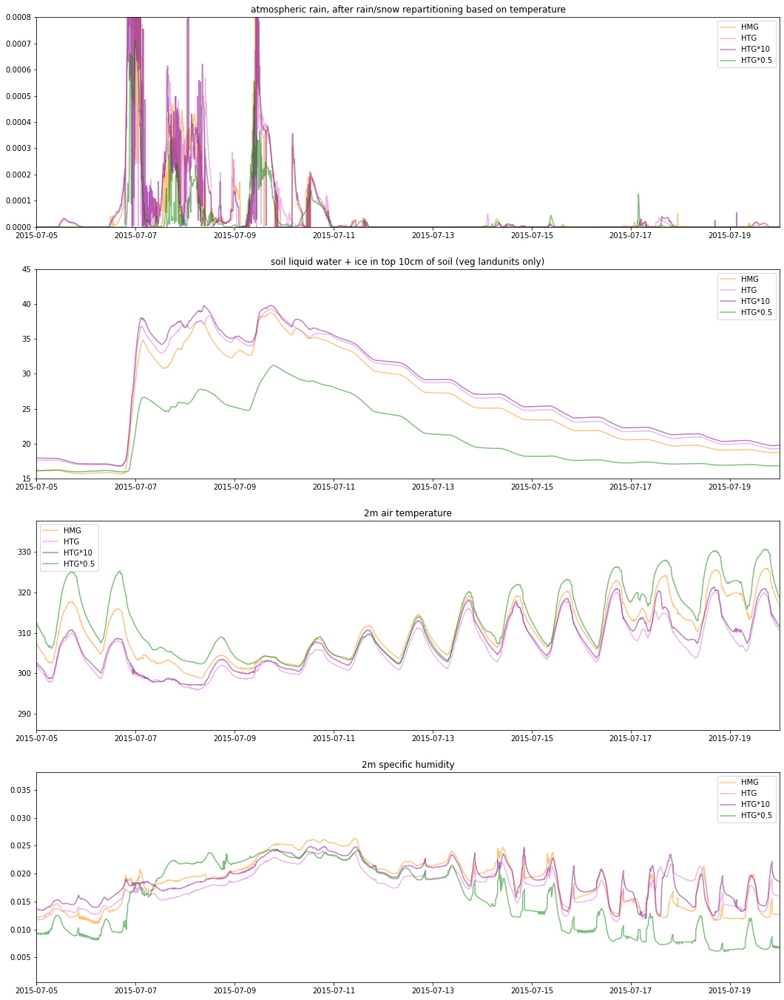

In [50]:
# Select those hours
plotVars = np.asarray(['RAIN','SOILWATER_10CM','TSA','Q2M'])
nPlots = len(plotVars)

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    axs[iPlot].plot(realSfcCLM_allCases.time.values, np.squeeze(realSfcCLM_allCases[plotVars[iPlot]].values[0,:]), color='darkorange', alpha=0.5, label='HMG')
    axs[iPlot].plot(realSfcCLM_allCases.time.values, np.squeeze(realSfcCLM_allCases[plotVars[iPlot]].values[1,:]), color='orchid', alpha=0.5, label='HTG')
    axs[iPlot].plot(realSfcCLM_allCases.time.values, np.squeeze(realSfcCLM_allCases[plotVars[iPlot]].values[2,:]), color='purple', alpha=0.5, label='HTG*10')
    axs[iPlot].plot(realSfcCLM_allCases.time.values, np.squeeze(realSfcCLM_allCases[plotVars[iPlot]].values[3,:]), color='green',  alpha=0.5, label='HTG*0.5')

    # Add labels
    axs[iPlot].set_title(realSfcCLM_allCases[plotVars[iPlot]].long_name)
#     axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,15)])    
    axs[iPlot].set_xlim([datetime.date(2015,7,5), datetime.date(2015,7,20)])  
#     axs[iPlot].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  

    ## Add shading
#     axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
#     axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
#     axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')
    
    axs[iPlot].legend()

    if plotVars[iPlot]=='SOILWATER_10CM':
        axs[iPlot].set_ylim([15,45])
    elif plotVars[iPlot]=='RAIN':
        axs[iPlot].set_ylim([0.0, 0.0008])
    

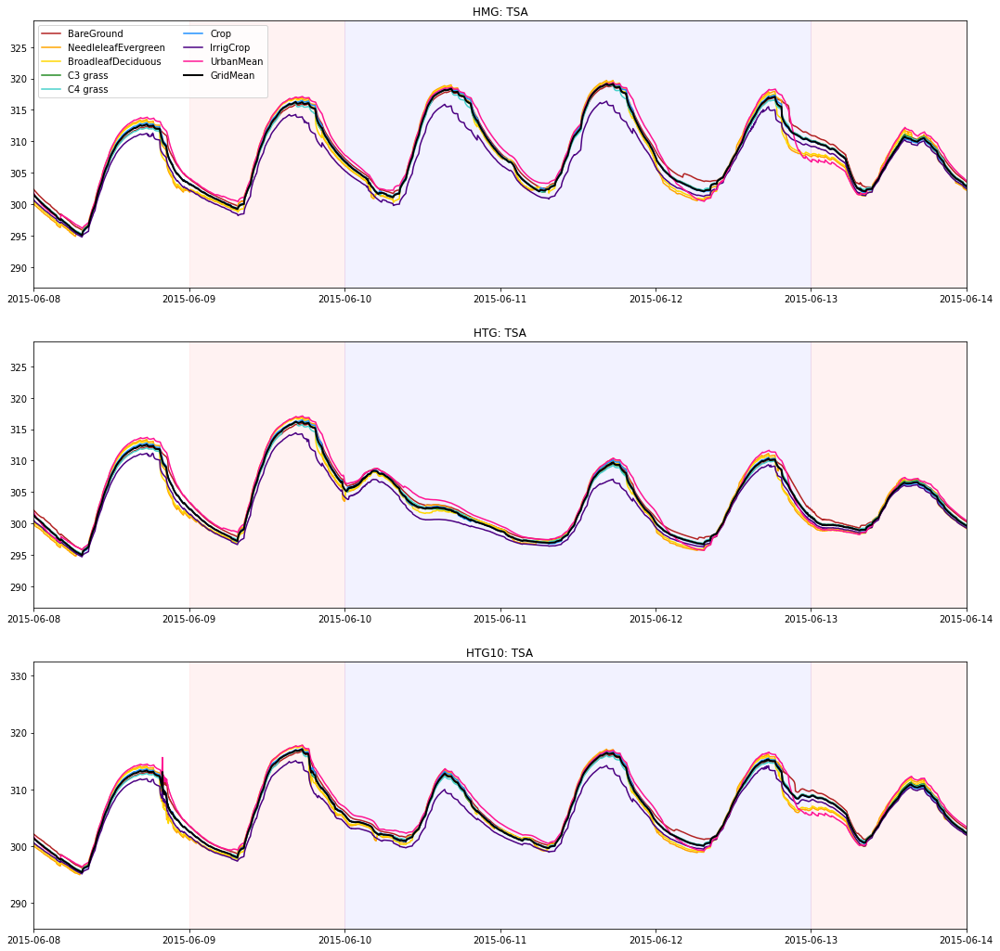

In [56]:
plotVar = 'TSA'
nPlots  = 3

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise',
                         'dodgerblue','indigo','deeppink'])

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    selCase = realSfcCLMpatch_allCases.isel(case=iPlot)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]
    varSel_urban = np.nansum(selCase[plotVar].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    #  Plot patch-level data
    nPatches = len(patchLabels)-len(iUrban)
    for iPatch in range(nPatches):
        axs[iPlot].plot(selCase.time.values, np.squeeze(selCase[plotVar].values[:,iPatch]), 
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
    axs[iPlot].plot(selCase.time.values, varSel_urban,
             '-', color=lineColors[-1], label='UrbanMean')
    
    # Plot grid mean too
    selCaseCLM = realSfcCLM_allCases.isel(case=iPlot)
    axs[iPlot].plot(selCaseCLM.time.values, selCaseCLM[plotVar].values,'k',linewidth=2,label='GridMean')

    
    if iPlot==0:
        axs[iPlot].legend(ncol=2)
    
    # Add labels
    axs[iPlot].set_title(str(selCase.case.values)+': '+str(plotVar))
    axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,14)]) 
    
    ## Add shading
    axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
    axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
    axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')



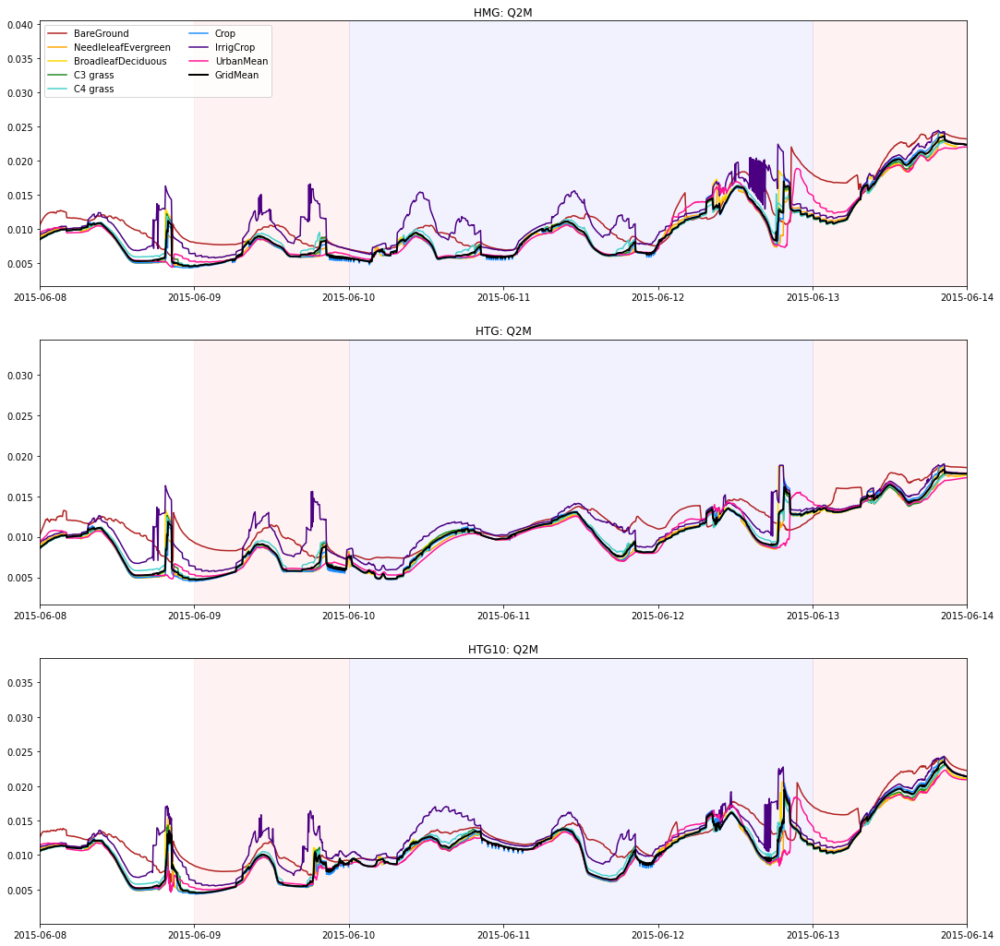

In [57]:
plotVar = 'Q2M'
nPlots  = 3

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise',
                         'dodgerblue','indigo','deeppink'])

fig,axs = plt.subplots(nPlots,1, figsize=(18,6*nPlots))
axs     = axs.ravel()

for iPlot in range(nPlots):
    selCase = realSfcCLMpatch_allCases.isel(case=iPlot)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]
    varSel_urban = np.nansum(selCase[plotVar].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    #  Plot patch-level data
    nPatches = len(patchLabels)-len(iUrban)
    for iPatch in range(nPatches):
        axs[iPlot].plot(selCase.time.values, np.squeeze(selCase[plotVar].values[:,iPatch]), 
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
    axs[iPlot].plot(selCase.time.values, varSel_urban,
             '-', color=lineColors[-1], label='UrbanMean')
    
    # Plot grid mean too
    selCaseCLM = realSfcCLM_allCases.isel(case=iPlot)
    axs[iPlot].plot(selCaseCLM.time.values, selCaseCLM[plotVar].values,'k',linewidth=2,label='GridMean')

    
    if iPlot==0:
        axs[iPlot].legend(ncol=2)
    
    # Add labels
    axs[iPlot].set_title(str(selCase.case.values)+': '+str(plotVar))
    axs[iPlot].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,14)]) 

    ## Add shading
    axs[iPlot].axvspan(datetime.date(2015,6,9),  datetime.date(2015,6,10), alpha=0.05, color='red')
    axs[iPlot].axvspan(datetime.date(2015,6,10), datetime.date(2015,6,13), alpha=0.05, color='blue')
    axs[iPlot].axvspan(datetime.date(2015,6,13), datetime.date(2015,6,14), alpha=0.05, color='red')


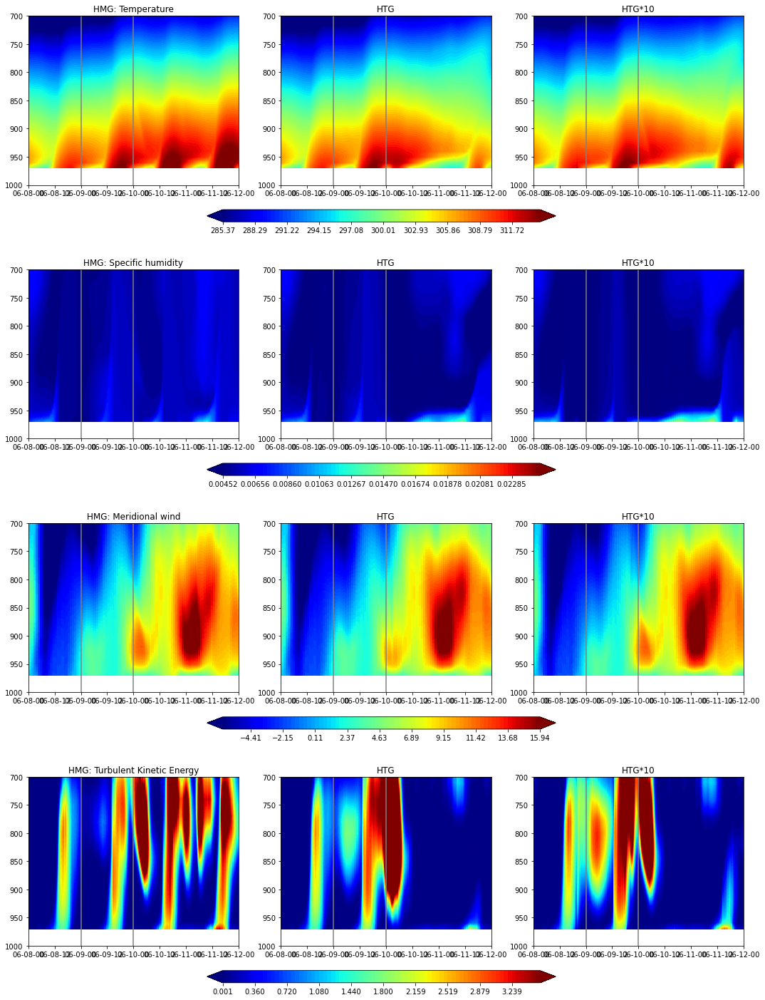

In [44]:
# Select those hours
plotVars = np.asarray(['T_interp','Q_interp','V_interp','TKE_interp'])
nPlots = len(plotVars)

maxLev = 700

fig,axs = plt.subplots(nPlots,3, figsize=(18,6*nPlots))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

numPlot=0
for iPlot in range(nPlots):
    
    iLevSel = np.where(realSfc_allCases.levInterp.values>=maxLev)[0]
    cMax = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel], 99)
    cMin = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel], 5)
    levs = np.arange(cMin,cMax, np.abs(cMax-cMin)/80)
    
    contour_plot = axs[numPlot+0].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=0)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    contour_plot = axs[numPlot+1].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=1)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    ax_position = axs[numPlot+1].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.03, ax_position.width+0.15, 0.01])
    cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        
    contour_plot = axs[numPlot+2].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=2)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    axs[numPlot+0].invert_yaxis()
    axs[numPlot+0].set_ylim([1000, maxLev])
    axs[numPlot+1].invert_yaxis()
    axs[numPlot+1].set_ylim([1000, maxLev])
    axs[numPlot+2].invert_yaxis()
    axs[numPlot+2].set_ylim([1000, maxLev])
    
    
    # Add labels
    axs[numPlot+0].set_title('HMG: '+realSfc_allCases[plotVars[iPlot]].long_name)
    axs[numPlot+1].set_title('HTG')
    axs[numPlot+2].set_title('HTG*10')
        
    axs[numPlot+0].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])  
    axs[numPlot+1].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)]) 
    axs[numPlot+2].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)]) 
    # Add marker lines
    axs[numPlot+0].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+0].axvline(datetime.date(2015,6,10),color='grey')
#     axs[numPlot+0].axvline(datetime.date(2015,6,13),color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,10),color='grey')
#     axs[numPlot+1].axvline(datetime.date(2015,6,13),color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,10),color='grey')
#     axs[numPlot+2].axvline(datetime.date(2015,6,13),color='grey')
    
#     axs[numPlot+0].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)]) 
#     axs[numPlot+1].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+2].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+0].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
#     axs[numPlot+1].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
#     axs[numPlot+2].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
    
    # Text in the x axis will be displayed in 'YYYY-mm' format.
    axs[numPlot+0].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%H'))
    axs[numPlot+1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%H'))
    axs[numPlot+2].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%H'))


    numPlot = numPlot+3

    

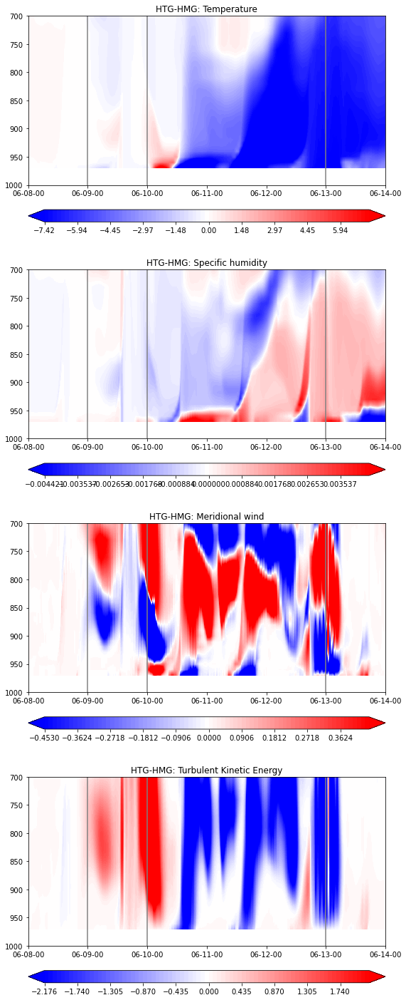

In [247]:
# Select those hours
plotVars = np.asarray(['T_interp','Q_interp','V_interp','TKE_interp'])
nPlots = len(plotVars)

maxLev = 700

fig,axs = plt.subplots(nPlots,1, figsize=(9,6*nPlots))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

numPlot=0
for iPlot in range(nPlots):
    
    diffVar = realSfc_allCases.isel(case=1)[plotVars[iPlot]].values - realSfc_allCases.isel(case=0)[plotVars[iPlot]].values
    
    iLevSel = np.where(realSfc_allCases.levInterp.values>=maxLev)[0]
    cMax = np.nanpercentile(diffVar[:,iLevSel], 99)
    cMin = np.nanpercentile(diffVar[:,iLevSel], 1)
    if np.abs(cMax)>=np.abs(cMin):
        levs = np.arange(-np.abs(cMax), np.abs(cMax), np.abs(2*cMax)/80)
    elif np.abs(cMax)<np.abs(cMin):
        levs = np.arange(-np.abs(cMin), np.abs(cMin), np.abs(2*cMin)/80)
    
    contour_plot = axs[numPlot+0].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(diffVar).transpose(),
                                      levels=levs, cmap='bwr',extend='both')

    ax_position = axs[numPlot+0].get_position()
    cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.03, ax_position.width, 0.01])
    cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
    
    axs[numPlot+0].invert_yaxis()
    axs[numPlot+0].set_ylim([1000, maxLev])
    
    
    # Add labels
    axs[numPlot+0].set_title('HTG-HMG: '+realSfc_allCases[plotVars[iPlot]].long_name)
        
    axs[numPlot+0].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,14)])  

    # Add marker lines
    axs[numPlot+0].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+0].axvline(datetime.date(2015,6,10),color='grey')
    axs[numPlot+0].axvline(datetime.date(2015,6,13),color='grey')
#     axs[numPlot+0].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)]) 
#     axs[numPlot+1].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+2].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+0].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
#     axs[numPlot+1].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
#     axs[numPlot+2].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
    
    # Text in the x axis will be displayed in 'YYYY-mm' format.
    axs[numPlot+0].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%H'))


    numPlot = numPlot+1

    

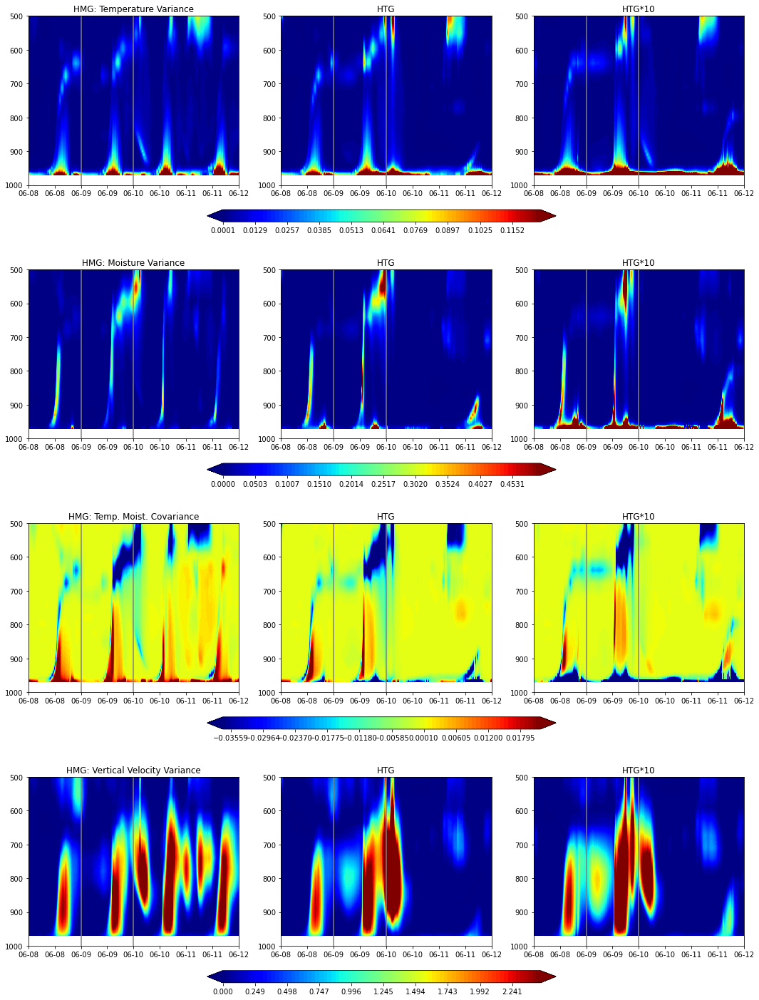

In [45]:
# Select those hours
plotVars = np.asarray(['THLP2_CLUBB_interp','RTP2_CLUBB_interp','RTPTHLP_CLUBB_interp','WP2_CLUBB_interp'])
nPlots = len(plotVars)

maxLev = 700

fig,axs = plt.subplots(nPlots,3, figsize=(18,6*nPlots))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

numPlot=0
for iPlot in range(nPlots):
    
    iLevSel = np.where(realSfc_allCases.levInterp.values>=maxLev)[0]
    cMax = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel,:,:], 99)
    cMin = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel,:,:], 5)
    levs = np.arange(cMin,cMax, np.abs(cMax-cMin)/80)
    
    contour_plot = axs[numPlot+0].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=0)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    contour_plot = axs[numPlot+1].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=1)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    ax_position = axs[numPlot+1].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.03, ax_position.width+0.15, 0.01])
    cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        
    contour_plot = axs[numPlot+2].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=2)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    axs[numPlot+0].invert_yaxis()
    axs[numPlot+0].set_ylim([1000, 500])
    axs[numPlot+1].invert_yaxis()
    axs[numPlot+1].set_ylim([1000, 500])
    axs[numPlot+2].invert_yaxis()
    axs[numPlot+2].set_ylim([1000, 500])
    
    
    # Add labels
    axs[numPlot+0].set_title('HMG: '+realSfc_allCases[plotVars[iPlot]].long_name)
    axs[numPlot+1].set_title('HTG')
    axs[numPlot+2].set_title('HTG*10')
        
    axs[numPlot+0].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])  
    axs[numPlot+1].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)]) 
    axs[numPlot+2].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])
    # Add marker lines
    axs[numPlot+0].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+0].axvline(datetime.date(2015,6,10),color='grey')
#     axs[numPlot+0].axvline(datetime.date(2015,6,13),color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,10),color='grey')
#     axs[numPlot+1].axvline(datetime.date(2015,6,13),color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,10),color='grey')
#     axs[numPlot+2].axvline(datetime.date(2015,6,13),color='grey')
    
#     axs[numPlot+0].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)]) 
#     axs[numPlot+1].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+2].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+0].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
#     axs[numPlot+1].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
#     axs[numPlot+2].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
    
    # Text in the x axis will be displayed in 'YYYY-mm' format.
    axs[numPlot+0].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    axs[numPlot+1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    axs[numPlot+2].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))


    numPlot = numPlot+3

    

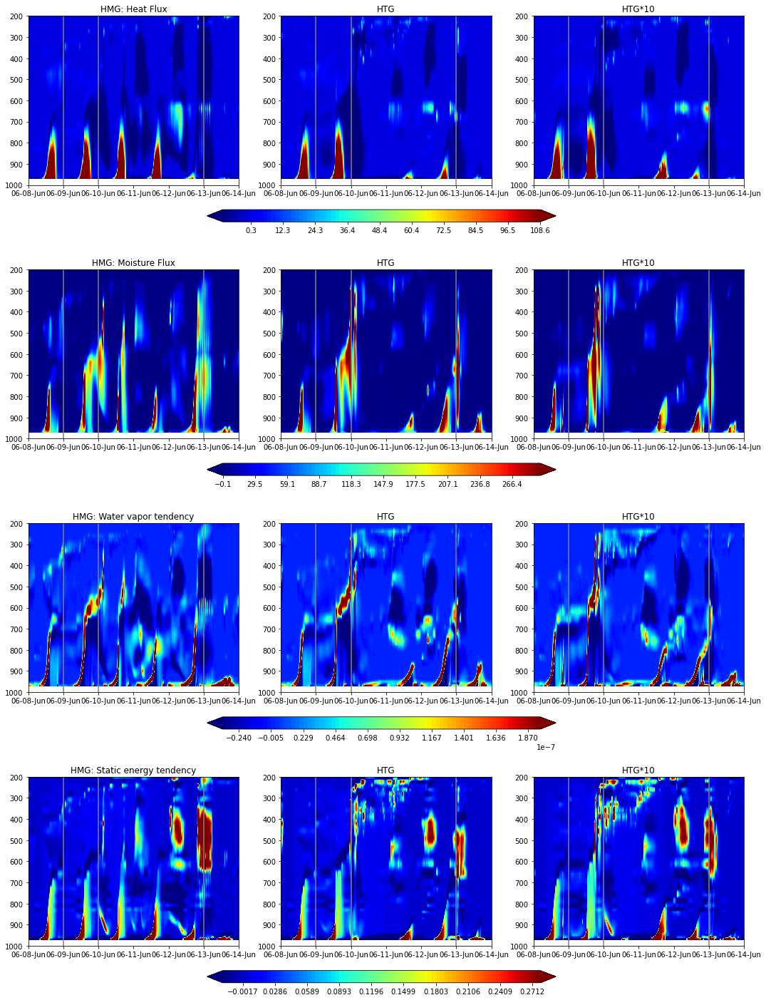

In [112]:
# Select those hours
plotVars = np.asarray(['WPTHLP_CLUBB_interp','WPRTP_CLUBB_interp','RVMTEND_CLUBB_interp','STEND_CLUBB_interp'])
nPlots = len(plotVars)

maxLev = 200

fig,axs = plt.subplots(nPlots,3, figsize=(18,6*nPlots))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

numPlot=0
for iPlot in range(nPlots):
    
    iLevSel = np.where(realSfc_allCases.levInterp.values>=maxLev)[0]
    cMax = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel,:,:], 99)
    cMin = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel,:,:], 5)
    levs = np.arange(cMin,cMax, np.abs(cMax-cMin)/80)
    
    contour_plot = axs[numPlot+0].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=0)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    contour_plot = axs[numPlot+1].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=1)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    ax_position = axs[numPlot+1].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.03, ax_position.width+0.15, 0.01])
    cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        
    contour_plot = axs[numPlot+2].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=2)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    axs[numPlot+0].invert_yaxis()
    axs[numPlot+0].set_ylim([1000, maxLev])
    axs[numPlot+1].invert_yaxis()
    axs[numPlot+1].set_ylim([1000, maxLev])
    axs[numPlot+2].invert_yaxis()
    axs[numPlot+2].set_ylim([1000, maxLev])
    
    
    # Add labels
    axs[numPlot+0].set_title('HMG: '+realSfc_allCases[plotVars[iPlot]].long_name)
    axs[numPlot+1].set_title('HTG')
    axs[numPlot+2].set_title('HTG*10')
        
    axs[numPlot+0].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,14)])  
    axs[numPlot+1].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,14)]) 
    axs[numPlot+2].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,14)]) 
    # Add marker lines
    axs[numPlot+0].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+0].axvline(datetime.date(2015,6,10),color='grey')
    axs[numPlot+0].axvline(datetime.date(2015,6,13),color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,10),color='grey')
    axs[numPlot+1].axvline(datetime.date(2015,6,13),color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,9), color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,10),color='grey')
    axs[numPlot+2].axvline(datetime.date(2015,6,13),color='grey')
    
#     axs[numPlot+0].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)]) 
#     axs[numPlot+1].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+2].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])   
#     axs[numPlot+0].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
#     axs[numPlot+1].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
#     axs[numPlot+2].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
    
    # Text in the x axis will be displayed in 'YYYY-mm' format.
    axs[numPlot+0].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%h'))
    axs[numPlot+1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%h'))
    axs[numPlot+2].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%h'))


    numPlot = numPlot+3

    

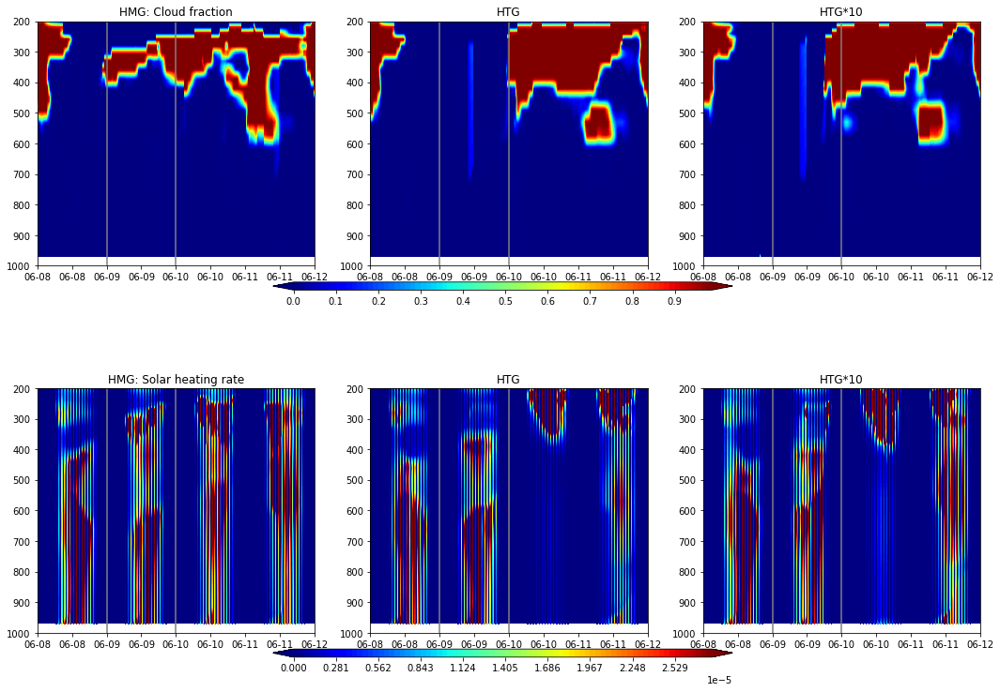

In [46]:
# Select those hours
plotVars = np.asarray(['CLOUD_interp','QRS_interp'])
nPlots = len(plotVars)

maxLev = 200

fig,axs = plt.subplots(nPlots,3, figsize=(18,6*nPlots))
axs     = axs.ravel()
fig.subplots_adjust(hspace=0.5)

numPlot=0
for iPlot in range(nPlots):
    
    iLevSel = np.where(realSfc_allCases.levInterp.values>=maxLev)[0]
    cMax = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel], 99)
    cMin = np.nanpercentile(realSfc_allCases[plotVars[iPlot]].values[:,:,iLevSel], 10)
    levs = np.arange(cMin,cMax, np.abs(cMax-cMin)/80)
    
    contour_plot = axs[numPlot+0].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=0)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    contour_plot = axs[numPlot+1].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=1)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    ax_position = axs[numPlot+1].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.08, ax_position.y0-0.03, ax_position.width+0.15, 0.01])
    cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        
    contour_plot = axs[numPlot+2].contourf(realSfc_allCases.time.values, realSfc_allCases.levInterp.values, 
                                      np.squeeze(realSfc_allCases.isel(case=2)[plotVars[iPlot]].values).transpose(),
                                      levels=levs, cmap='jet',extend='both')
    
    axs[numPlot+0].invert_yaxis()
    axs[numPlot+0].set_ylim([1000, maxLev])
    axs[numPlot+1].invert_yaxis()
    axs[numPlot+1].set_ylim([1000, maxLev])
    axs[numPlot+2].invert_yaxis()
    axs[numPlot+2].set_ylim([1000, maxLev])
    
    
    # Add labels
    axs[numPlot+0].set_title('HMG: '+realSfc_allCases[plotVars[iPlot]].long_name)
    axs[numPlot+1].set_title('HTG')
    axs[numPlot+2].set_title('HTG*10')
        
    axs[numPlot+0].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)])  
    axs[numPlot+1].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)]) 
    axs[numPlot+2].set_xlim([datetime.date(2015,6,8), datetime.date(2015,6,12)]) 
    # Add marker lines
    axs[numPlot+0].axvline(datetime.date(2015,6,9), color='gray')
    axs[numPlot+0].axvline(datetime.date(2015,6,10),color='gray')
#     axs[numPlot+0].axvline(datetime.date(2015,6,13),color='gray')
    axs[numPlot+1].axvline(datetime.date(2015,6,9), color='gray')
    axs[numPlot+1].axvline(datetime.date(2015,6,10),color='gray')
#     axs[numPlot+1].axvline(datetime.date(2015,6,13),color='gray')
    axs[numPlot+2].axvline(datetime.date(2015,6,9), color='gray')
    axs[numPlot+2].axvline(datetime.date(2015,6,10),color='gray')
#     axs[numPlot+2].axvline(datetime.date(2015,6,13),color='gray')
    
#     axs[numPlot+0].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)]) 
#     axs[numPlot+1].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+2].set_xlim([datetime.date(2015,7,16), datetime.date(2015,7,23)])
#     axs[numPlot+0].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)])  
#     axs[numPlot+1].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
#     axs[numPlot+2].set_xlim([datetime.date(2017,7,30), datetime.date(2017,8,2)]) 
    
    # Text in the x axis will be displayed in 'YYYY-mm' format.
    axs[numPlot+0].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    axs[numPlot+1].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    axs[numPlot+2].xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))


    numPlot = numPlot+3

    

### Back to our regularly scheduled programming: What about means over all the days in positive/negative classifications?

### What is other behavior on those days??

In [58]:
hourlyMean_highPct_realSfc   = highPct_realSfc.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_realSfc    = lowPct_realSfc.groupby("time.hour").mean(dim="time")

# hourlyMean_highPct_artSfc    = highPct_artSfc.groupby("time.hour").mean(dim="time")
# hourlyMean_lowPct_artSfc     = lowPct_artSfc.groupby("time.hour").mean(dim="time")

print('Computed hourly means for all surfaces + cases')


hourlyStd_highPct_realSfc   = highPct_realSfc.groupby("time.hour").std(dim="time")
hourlyStd_lowPct_realSfc    = lowPct_realSfc.groupby("time.hour").std(dim="time")

# hourlyStd_highPct_artSfc    = highPct_artSfc.groupby("time.hour").std(dim="time")
# hourlyStd_lowPct_artSfc     = lowPct_artSfc.groupby("time.hour").std(dim="time")
print('Computed hourly std for all surfaces + cases')



Computed hourly means for all surfaces + cases
Computed hourly std for all surfaces + cases


In [49]:
# ## Should I use a t-test instead...? It always seems to be significant, which feels wrong to me. 
# #   Probably due to just how many samples we have per hour when using the 5 min dt... 

# from scipy import stats

# iHrs = np.where(highPct_artSfc["time.hour"]==13)[0]

# # t_value,p_value=stats.ttest_ind(highPct_realSfc.TGCLDLWP.values[0,iHrs,0,0],
# #                                 highPct_realSfc.TGCLDLWP.values[1,iHrs,0,0])

# t_value,p_value=stats.ttest_rel(highPct_realSfc.TGCLDLWP.values[0,iHrs,0,0],
#                                 highPct_realSfc.TGCLDLWP.values[1,iHrs,0,0])

# print('Test statistic is %f'%float("{:.6f}".format(t_value)))

# print('p-value for two tailed test is %e'%p_value)

# alpha = 0.05

# if p_value<=alpha:

#     print('Conclusion','n','Since p-value(=%f)'%p_value,'<','alpha(=%.2f)'%alpha,'''We reject the null hypothesis H0. So we conclude that the 

# effect of HTG and HMG on TGCLDLWP are not equal i.e., μ1 = μ2 at %.2f level of significance.'''%alpha)

# else:

#     print('Conclusion','n','Since p-value(=%f)'%p_value,'>','alpha(=%.2f)'%alpha,'''We do not reject the null hypothesis H0.''')
    
    

In [995]:
# diffs = (highPct_realSfc.TGCLDLWP.values[1,iHrs,0,0]) - highPct_realSfc.TGCLDLWP.values[0,iHrs,0,0]

# xd = np.nanmean(diffs)
# sd = np.nanstd(diffs)
# n  = len(diffs)

# print('Number of samples: ', n)
# print('t stat = ', ( (xd - 0)/(sd/np.sqrt(n)) ) ) 

# print('Mean HMG for hour: ', np.nanmean(highPct_realSfc.TGCLDLWP.values[0,iHrs,0,0]))
# print('Mean HTG for hour', np.nanmean(highPct_realSfc.TGCLDLWP.values[1,iHrs,0,0]))


In [59]:
## Get large scale/obs information too

hourlyMean_highPct_realSfc_obs   = highPct_realSfc_obs.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_realSfc_obs    = lowPct_realSfc_obs.groupby("time.hour").mean(dim="time")

# hourlyMean_highPct_artSfc_obs    = highPct_artSfc_obs.groupby("time.hour").mean(dim="time")
# hourlyMean_lowPct_artSfc_obs     = lowPct_artSfc_obs.groupby("time.hour").mean(dim="time")

print('Computed observational means for all cases')


Computed observational means for all cases


In [60]:
hourlyMean_restOfDays_realSfc    = restOfDays_realSfc.groupby("time.hour").mean(dim="time")
# hourlyMean_restOfDays_artSfc     = restOfDays_artSfc.groupby("time.hour").mean(dim="time")

hourlyMean_restOfDays_realSfc_obs    = restOfDays_realSfc_obs.groupby("time.hour").mean(dim="time")
# hourlyMean_restOfDays_artSfc_obs     = restOfDays_artSfc_obs.groupby("time.hour").mean(dim="time")

print('Computed means for rest of days')


hourlyStd_restOfDays_realSfc    = restOfDays_realSfc.groupby("time.hour").std(dim="time")
# hourlyStd_restOfDays_artSfc     = restOfDays_artSfc.groupby("time.hour").std(dim="time")

hourlyStd_restOfDays_realSfc_obs    = restOfDays_realSfc_obs.groupby("time.hour").std(dim="time")
# hourlyStd_restOfDays_artSfc_obs     = restOfDays_artSfc_obs.groupby("time.hour").std(dim="time")

print('Computed std for rest of days')


Computed means for rest of days
Computed std for rest of days


In [61]:
len(np.unique(restOfDays_realSfc.year_month_day.values))

280

In [62]:
## Get CLM hourly means too 

hourlyMean_highPct_realSfcCLM    = highPct_realSfcCLM.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_realSfcCLM     = lowPct_realSfcCLM.groupby("time.hour").mean(dim="time")
hourlyMean_restOfDays_realSfcCLM = restOfDays_realSfcCLM.groupby("time.hour").mean(dim="time")

hourlyMean_highPct_realSfcCLMpatch    = highPct_realSfcCLMpatch.groupby("time.hour").mean(dim="time")
hourlyMean_lowPct_realSfcCLMpatch     = lowPct_realSfcCLMpatch.groupby("time.hour").mean(dim="time")
hourlyMean_restOfDays_realSfcCLMpatch = restOfDays_realSfcCLMpatch.groupby("time.hour").mean(dim="time")

print('Computed CLM means for all cases')



Computed CLM means for all cases


In [63]:
# Get number of obs going into those hourly means (for error bars)
nTimes_highPct_realSfc     = np.full([24], np.nan)
nTimes_lowPct_realSfc      = np.full([24], np.nan)
nTimes_restOfDays_realSfc  = np.full([24], np.nan)

# nTimes_highPct_artSfc     = np.full([24], np.nan)
# nTimes_lowPct_artSfc      = np.full([24], np.nan)
# nTimes_restOfDays_artSfc  = np.full([24], np.nan)

for iHr in range(24): 
    nTimes_highPct_realSfc[iHr]    = len(np.where(highPct_realSfc["time.hour"]==iHr)[0])
    nTimes_lowPct_realSfc[iHr]     = len(np.where(lowPct_realSfc["time.hour"]==iHr)[0])
    nTimes_restOfDays_realSfc[iHr] = len(np.where(restOfDays_realSfc["time.hour"]==iHr)[0])
    
#     nTimes_highPct_artSfc[iHr]    = len(np.where(highPct_artSfc["time.hour"]==iHr)[0])
#     nTimes_lowPct_artSfc[iHr]     = len(np.where(lowPct_artSfc["time.hour"]==iHr)[0])
#     nTimes_restOfDays_artSfc[iHr] = len(np.where(restOfDays_artSfc["time.hour"]==iHr)[0])

hourlyMean_highPct_realSfc['SampleCount']       = (('hour'), nTimes_highPct_realSfc)
hourlyMean_lowPct_realSfc['SampleCount']        = (('hour'), nTimes_lowPct_realSfc)
hourlyMean_restOfDays_realSfc['SampleCount']    = (('hour'), nTimes_restOfDays_realSfc)

# hourlyMean_highPct_artSfc['SampleCount']       = (('hour'), nTimes_highPct_artSfc)
# hourlyMean_lowPct_artSfc['SampleCount']        = (('hour'), nTimes_lowPct_artSfc)
# hourlyMean_restOfDays_artSfc['SampleCount']    = (('hour'), nTimes_restOfDays_artSfc)


**Make plots**

In [64]:
varSel


'PBLH'

In [65]:
np.shape(hourlyMean_highPct_realSfc[varSel].values)

(24, 5, 1, 1)

(0.0, 3500.0)

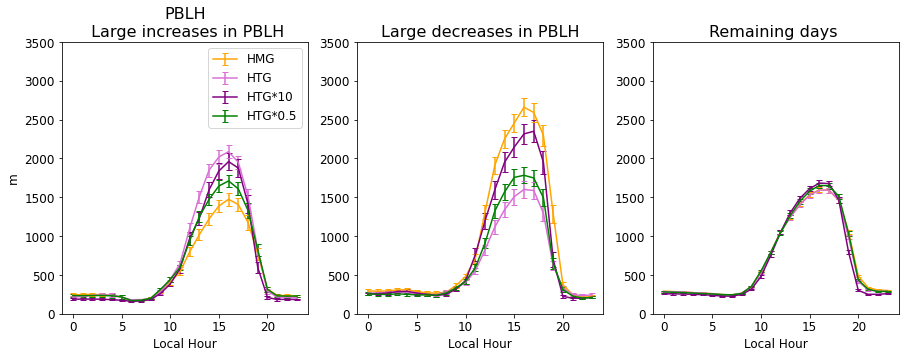

In [124]:
varSelPlot = varSel
levSel     = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()


# Set labels
# axs[0].set_title(varSelPlot+'\n High percentiles of '+varSel+' (realSfc)', fontsize=14)
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days ', fontsize=16)

axs[0].set_ylabel(realSfc_allCases['PBLH'].units, fontsize=12)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)

# Set axis ranges if desired

yMax = 3500
yMin = 0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])



(0.0, 3500.0)

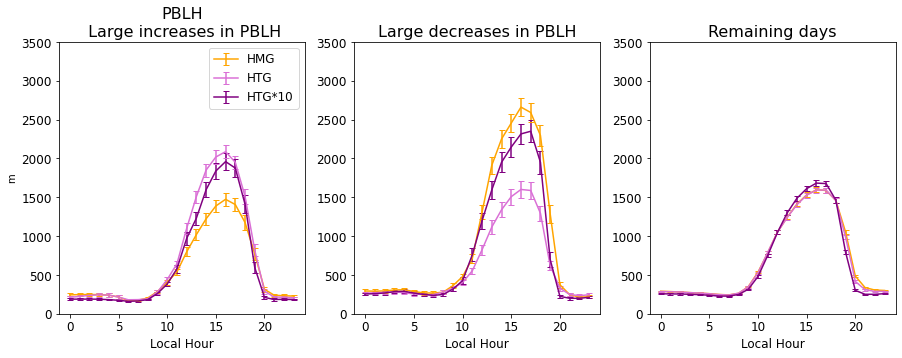

In [68]:
varSelPlot = varSel
levSel     = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
# axs[1].legend()

axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
# axs[2].legend()


# # Artificial surface 
# axs[3].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_artSfc[varSelPlot].values[:,0,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_artSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_artSfc['SampleCount'].values),
#                 color='r',capsize=3,label='HMG')
# axs[3].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_artSfc[varSelPlot].values[:,1,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_artSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_artSfc['SampleCount'].values),
#                 color='b',capsize=3,label='HTG')
# axs[3].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_artSfc[varSelPlot].values[:,2,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_artSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_artSfc['SampleCount'].values),
#                 color='dodgerblue',capsize=3,label='HTG*0.5')
# axs[3].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_artSfc[varSelPlot].values[:,3,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_artSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_artSfc['SampleCount'].values),
#                 color='skyblue',capsize=3,label='HTG*0.25')
# axs[3].legend()


# axs[4].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_artSfc[varSelPlot].values[:,0,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_artSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_artSfc['SampleCount'].values),
#                 fmt='--',color='r',capsize=3,label='HMG')
# axs[4].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_artSfc[varSelPlot].values[:,1,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_artSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_artSfc['SampleCount'].values),
#                 fmt='--',color='b',capsize=3,label='HTG')
# axs[4].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_artSfc[varSelPlot].values[:,2,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_artSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_artSfc['SampleCount'].values),
#                 fmt='--',color='dodgerblue',capsize=3,label='HTG*0.5')
# axs[4].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_artSfc[varSelPlot].values[:,3,levSel,0,0]),
#                  yerr =2*np.squeeze(hourlyStd_lowPct_artSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_artSfc['SampleCount'].values),
#                 fmt='--',color='skyblue',capsize=3,label='HTG*0.25')
# axs[4].legend()

# axs[5].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_artSfc[varSelPlot].values[:,0,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_artSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_artSfc['SampleCount'].values),
#                 fmt='-',color='r',capsize=3,label='HMG')
# axs[5].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_artSfc[varSelPlot].values[:,1,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_artSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_artSfc['SampleCount'].values),
#                 fmt='-',color='b',capsize=3,label='HTG')
# axs[5].errorbar(np.arange(24), 
#                np.squeeze(hourlyMean_restOfDays_artSfc[varSelPlot].values[:,2,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_artSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_artSfc['SampleCount'].values),
#                 fmt='-',color='dodgerblue',capsize=3,label='HTG*0.5')
# axs[5].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_artSfc[varSelPlot].values[:,3,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_artSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_artSfc['SampleCount'].values),
#                 fmt='-',color='skyblue',capsize=3,label='HTG*0.25')
# axs[5].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
# axs[3].set_xlabel('Local Hour')
# axs[4].set_xlabel('Local Hour')
# axs[5].set_xlabel('Local Hour')
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)

# Set axis ranges if desired
# yMax = 275
# yMin = -50
# yMax = 0.32
# yMin = 0.0
# yMax = 25
# yMin = -1
yMax = 3500
yMin = 0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


In [69]:
print('HMG_real max '+varSel+':   ', np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0]))
print('HTG_real max '+varSel+':   ', np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,1]))
print('HTG10_real max '+varSel+': ', np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,2]))
print('HTGp5_real max '+varSel+': ', np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,3]))
print()
print('Percent change in daily max (HTG vs HMG): %.3f pct' % ( ((np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,1])-np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0]))/np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0])) *100.0))
print('Percent change in daily max (HTG10 vs HMG): %.3f pct' % ( ((np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,2])-np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0]))/np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0])) *100.0))
print('Percent change in daily max (HTGp5 vs HMG): %.3f pct' % ( ((np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,3])-np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0]))/np.nanmax(hourlyMean_highPct_realSfc[varSel].values[:,0])) *100.0))


HMG_real max PBLH:    1474.1583
HTG_real max PBLH:    2087.8943
HTG10_real max PBLH:  1959.9282
HTGp5_real max PBLH:  1710.9159

Percent change in daily max (HTG vs HMG): 41.633 pct
Percent change in daily max (HTG10 vs HMG): 32.952 pct
Percent change in daily max (HTGp5 vs HMG): 16.061 pct


In [70]:
print('HMG_real max '+varSel+':   ', np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0]))
print('HTG_real max '+varSel+':   ', np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,1]))
print('HTG10_real max '+varSel+': ', np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,2]))
print('HTGp5_real max '+varSel+': ', np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,3]))
print()
print('Percent change in daily max (HTG vs HMG):   %.3f pct' % ( ((np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,1])-np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0]))/np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0])) *100.0))
print('Percent change in daily max (HTG10 vs HMG): %.3f pct' % ( ((np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,2])-np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0]))/np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0])) *100.0))
print('Percent change in daily max (HTGp5 vs HMG): %.3f pct' % ( ((np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,3])-np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0]))/np.nanmax(hourlyMean_lowPct_realSfc[varSel].values[:,0])) *100.0))



HMG_real max PBLH:    2661.4543
HTG_real max PBLH:    1601.1808
HTG10_real max PBLH:  2350.3972
HTGp5_real max PBLH:  1783.569

Percent change in daily max (HTG vs HMG):   -39.838 pct
Percent change in daily max (HTG10 vs HMG): -11.687 pct
Percent change in daily max (HTGp5 vs HMG): -32.985 pct


(0.0, 1.4)

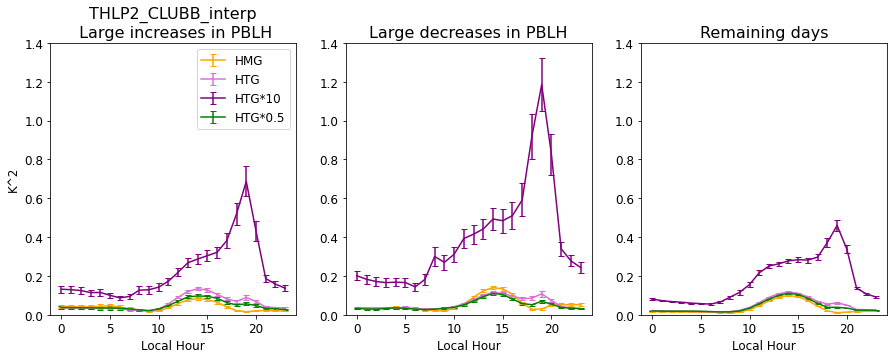

In [76]:
# varSelPlot = 'THLP2_CLUBB'
varSelPlot = 'THLP2_CLUBB_interp'

levSel = -1


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()

axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()




# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)

# Set axis ranges if desired
yMax = 1.4
yMin = 0.0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(0.0, 5.5)

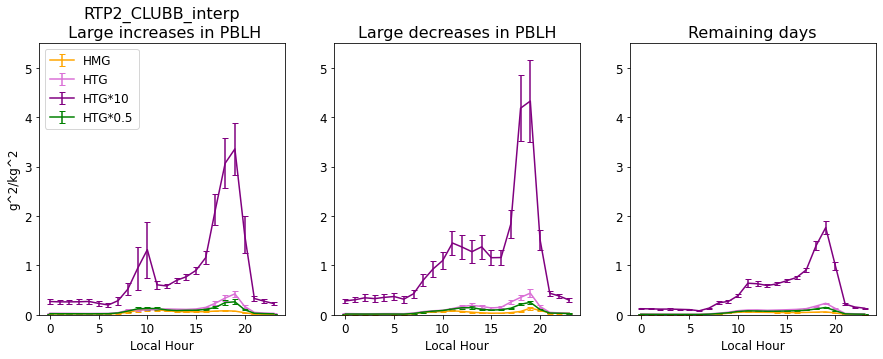

In [77]:
varSelPlot = 'RTP2_CLUBB_interp'

levSel = -1


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()

axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 5.5
yMin = 0.0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(-2.5, 0.15)

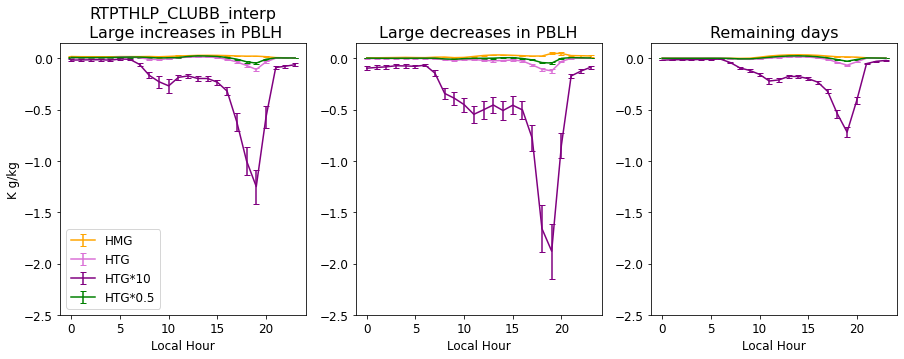

In [81]:
varSelPlot = 'RTPTHLP_CLUBB_interp'

levSel = -1


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# # axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 0.15
yMin = -2.5

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


In [45]:
np.nanmean(hourlyMean_lowPct_realSfc.PS.values)

97484.055

(0.0, 1.6e-07)

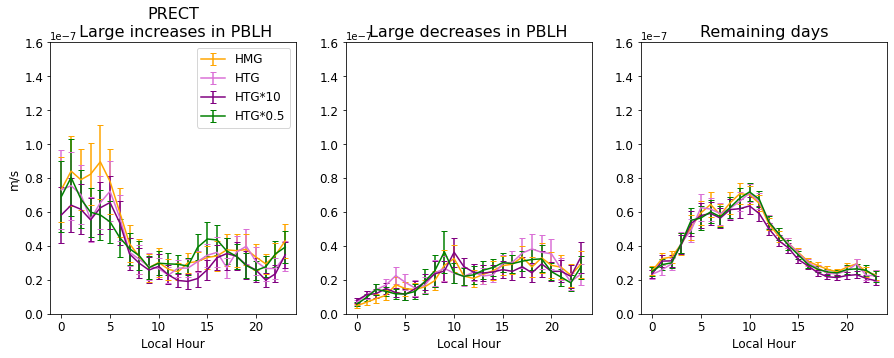

In [82]:
varSelPlot = 'PRECT'

levSel = None


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()



# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
# yMax = 1.3e-7
yMax = 1.6e-7
yMin = 0.0
# yMax = 1e-8
# yMin = 0.0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(0.0, 0.2)

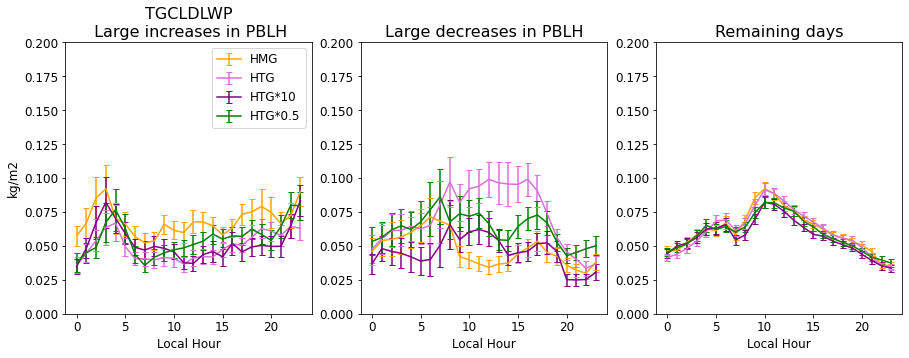

In [83]:
varSelPlot = 'TGCLDLWP'

levSel = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# # axs[2].legend()



# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 0.2
yMin = 0.0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(-40.0, 250.0)

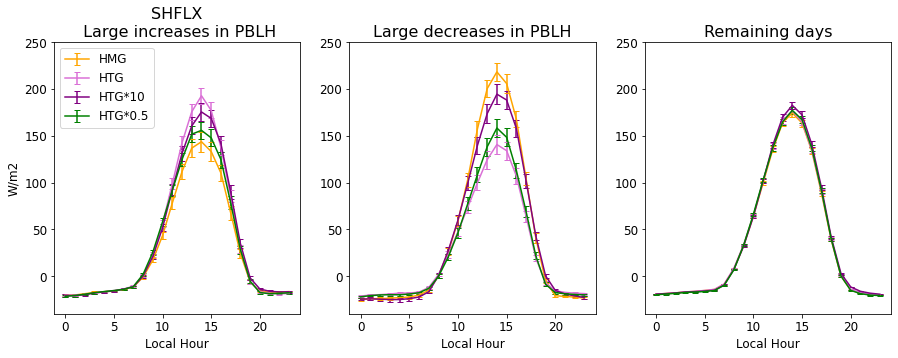

In [84]:
varSelPlot = 'SHFLX'

levSel = None


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()




# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 250
yMin = -40

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(-10.0, 250.0)

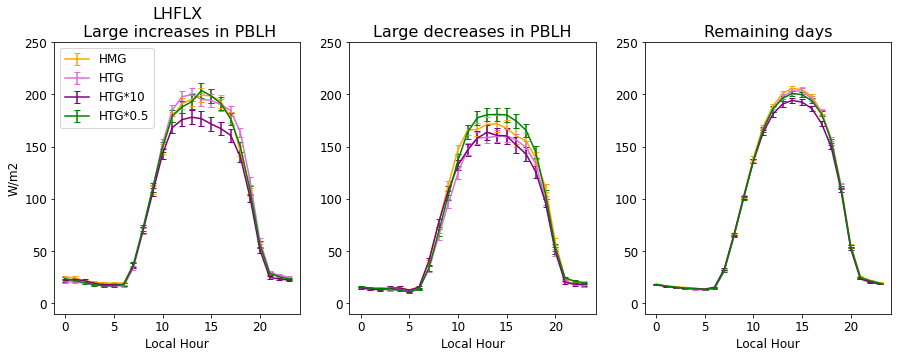

In [85]:
varSelPlot = 'LHFLX'

levSel = None


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 250
yMin = -10

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(0.5, 1.01)

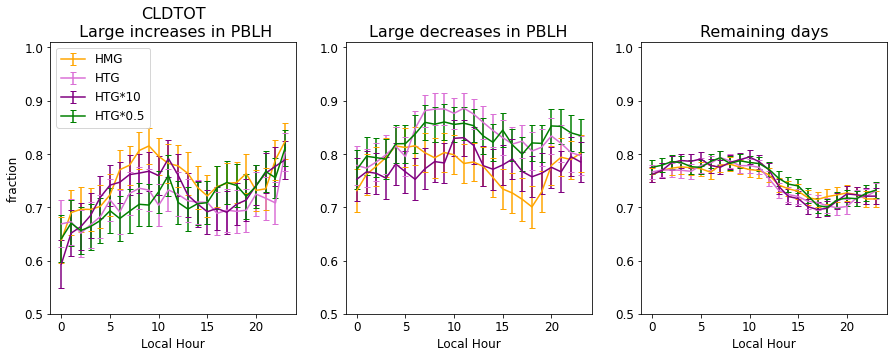

In [86]:
varSelPlot = 'CLDTOT'

levSel = None


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# # axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)



# Set axis ranges if desired
yMax = 1.01
yMin = 0.5

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(0.0, 0.25)

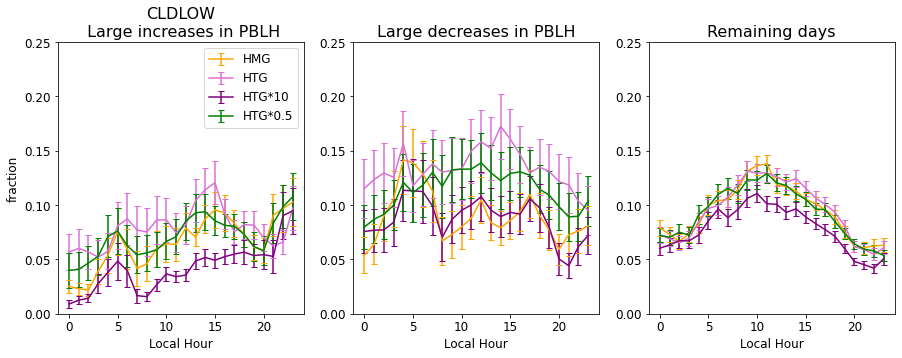

In [87]:
varSelPlot = 'CLDLOW'
levSel = None


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)



# Set axis ranges if desired
yMax = 0.25
yMin = 0.0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


(-4.0, 4.0)

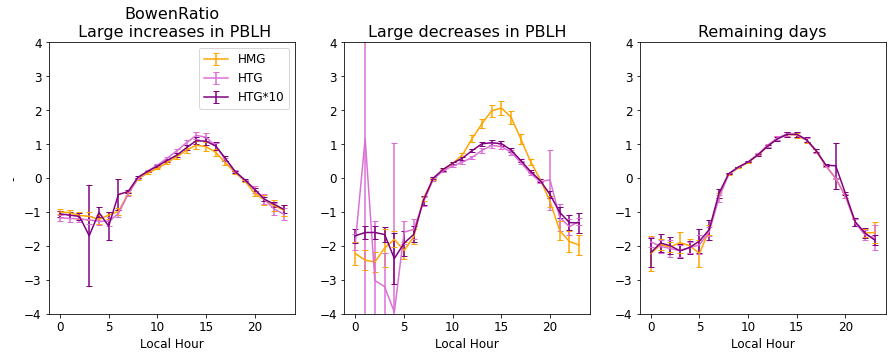

In [249]:
varSelPlot = 'BowenRatio'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
# axs[2].legend()





# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 4
yMin = -4

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


(8.0, 18.0)

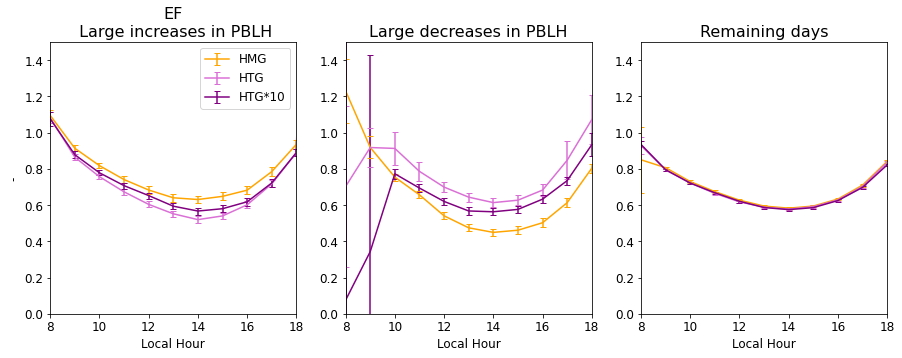

In [253]:
varSelPlot = 'EF'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
# axs[2].legend()





# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 1.5
yMin = 0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

maxHr = 18
minHr = 8
axs[0].set_xlim([minHr, maxHr])
axs[1].set_xlim([minHr, maxHr])
axs[2].set_xlim([minHr, maxHr])


(100.0, 2800.0)

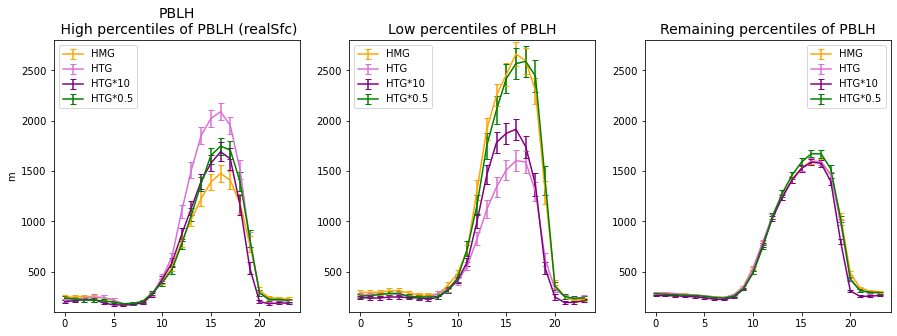

In [77]:
varSelPlot = 'PBLH'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
axs[0].legend()



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
axs[1].legend()

axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
axs[2].legend()





# Set labels
axs[0].set_title(varSelPlot+'\n High percentiles of '+varSel+' (realSfc)', fontsize=14)
axs[1].set_title('Low percentiles of '+varSel, fontsize=14)
axs[2].set_title('Remaining percentiles of '+varSel, fontsize=14)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
# axs[3].set_xlabel('Local Hour')
# axs[4].set_xlabel('Local Hour')
# axs[5].set_xlabel('Local Hour')

# Set axis ranges if desired
yMax = 2800
yMin = 100

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


AttributeError: 'DataArray' object has no attribute 'units'

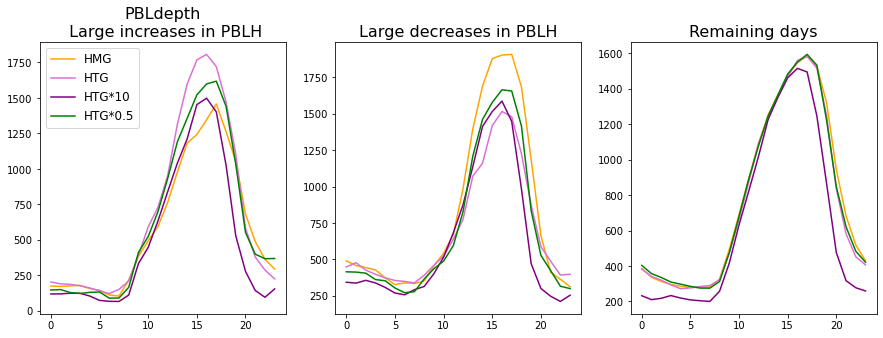

In [88]:
varSelPlot = 'PBLdepth'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0],color='orange',label='HMG')
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,1],color='orchid',label='HTG')
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,2],color='purple',label='HTG*10')
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,3],color='green', label='HTG*0.5')
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,4],color='red',   label='HTG*0')
axs[0].legend(fontsize=12)

axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfc[varSelPlot].values[:,0],'-',color='orange',label='HMG')
axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfc[varSelPlot].values[:,1],'-',color='orchid',label='HTG')
axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfc[varSelPlot].values[:,2],'-',color='purple',label='HTG*10')
axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfc[varSelPlot].values[:,3],'-',color='green',label='HTG*0.5')
# axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfc[varSelPlot].values[:,4],'-',color='red',  label='HTG*0')
# axs[1].legend()

axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0],color='orange',label='HMG')
axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1],color='orchid',label='HTG')
axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2],color='purple',label='HTG*10')
axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3],color='green',label='HTG*0.5')
# axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4],color='red',  label='HTG*0')
# axs[2].legend()


# # Artificial surface 
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfc[varSelPlot].values[:,0],color='r',label='HMG')
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfc[varSelPlot].values[:,1],color='b',label='HTG')
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfc[varSelPlot].values[:,2],color='dodgerblue',label='HTG*0.5')
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfc[varSelPlot].values[:,3],color='skyblue',label='HTG*0.25')
# axs[3].legend()


# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfc[varSelPlot].values[:,0],'--',color='r',label='HMG')
# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfc[varSelPlot].values[:,1],'--',color='b',label='HTG')
# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfc[varSelPlot].values[:,2],'--',color='dodgerblue',label='HTG*0.5')
# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfc[varSelPlot].values[:,3],'--',color='skyblue',label='HTG*0.25')
# axs[4].legend()

# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfc[varSelPlot].values[:,0],'-',color='r',label='HMG')
# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfc[varSelPlot].values[:,1],'-',color='b',label='HTG')
# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfc[varSelPlot].values[:,2],'-',color='dodgerblue',label='HTG*0.5')
# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfc[varSelPlot].values[:,3],'-',color='skyblue',label='HTG*0.25')
# axs[5].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 2800
yMin = 0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


(300.0, 318.0)

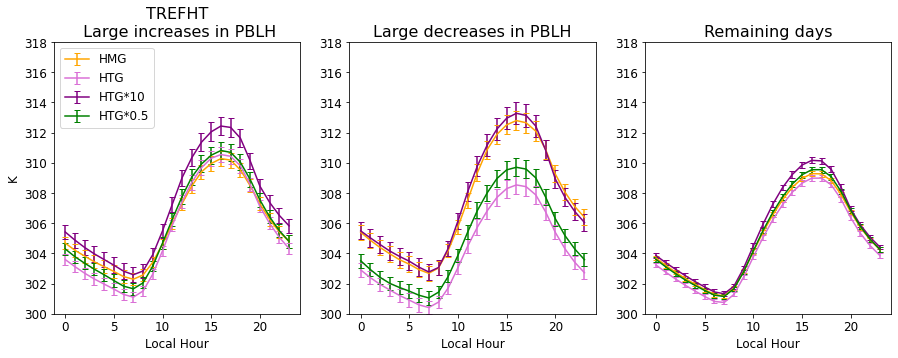

In [90]:
varSelPlot = 'TREFHT'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()





# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)



# Set axis ranges if desired
yMax = 318
yMin = 300

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


(0.011, 0.026)

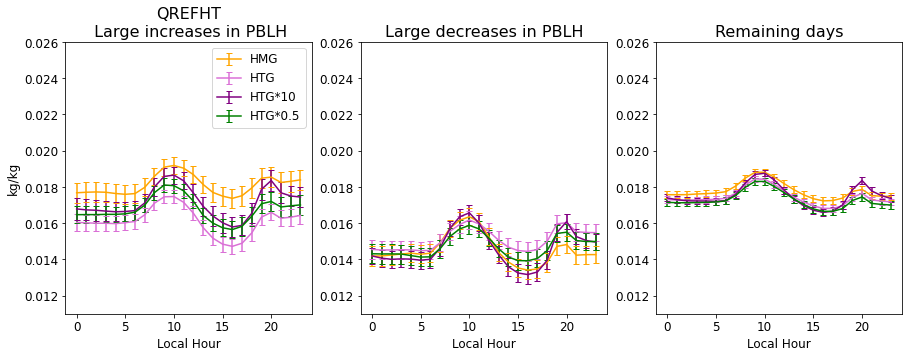

In [91]:
varSelPlot = 'QREFHT'
levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)



axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()




# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)



# Set axis ranges if desired
# yMax = 0.0235
# yMin = 0.013
yMax = 0.026
yMin = 0.011

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


(2.0, 5.0)

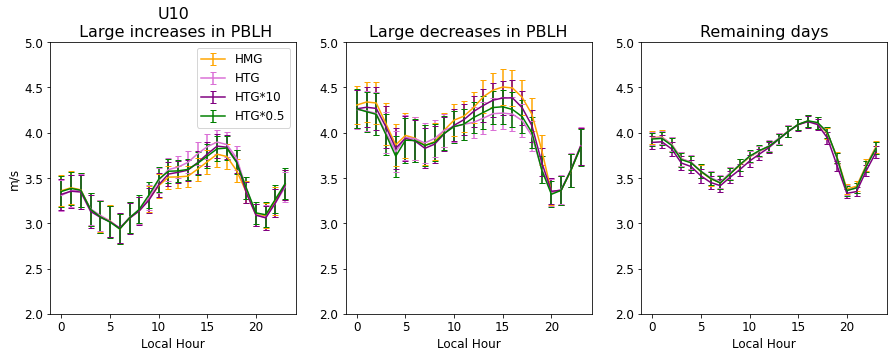

In [92]:
varSelPlot = 'U10'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[0].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
axs[0].legend(fontsize=12)


axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
#                 fmt='-',color='red',capsize=3,label='HTG*0')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].errorbar(np.arange(24), 
#                 np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0]),
#                 yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,4,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
#                 color='red',capsize=3,label='HTG*0')
# axs[2].legend()




# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 5.0
yMin = 2.0

axs[0].set_ylim([yMin, yMax])
axs[1].set_ylim([yMin, yMax])
axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


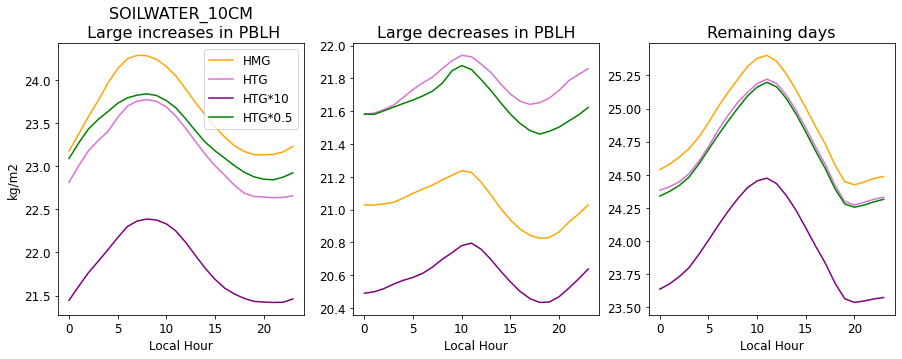

In [93]:
varSelPlot = 'SOILWATER_10CM'

levSel  = None

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfcCLM[varSelPlot].values[:,0],color='orange',label='HMG')
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfcCLM[varSelPlot].values[:,1],color='orchid',label='HTG')
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfcCLM[varSelPlot].values[:,2],color='purple',label='HTG*10')
axs[0].plot(np.arange(24), hourlyMean_highPct_realSfcCLM[varSelPlot].values[:,3],color='green',label='HTG*0.5')
axs[0].legend(fontsize=12)

axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfcCLM[varSelPlot].values[:,0],'-',color='orange',label='HMG')
axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfcCLM[varSelPlot].values[:,1],'-',color='orchid',label='HTG')
axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfcCLM[varSelPlot].values[:,2],'-',color='purple',label='HTG*10')
axs[1].plot(np.arange(24), hourlyMean_lowPct_realSfcCLM[varSelPlot].values[:,3],'-',color='green',label='HTG*0.5')
# axs[1].legend()

axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfcCLM[varSelPlot].values[:,0],color='orange',label='HMG')
axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfcCLM[varSelPlot].values[:,1],color='orchid',label='HTG')
axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfcCLM[varSelPlot].values[:,2],color='purple',label='HTG*10')
axs[2].plot(np.arange(24), hourlyMean_restOfDays_realSfcCLM[varSelPlot].values[:,3],color='green',label='HTG*0.5')
# axs[2].legend()



# # Artificial surface 
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfcCLM[varSelPlot].values[:,0],color='r',label='HMG')
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfcCLM[varSelPlot].values[:,1],color='b',label='HTG')
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfcCLM[varSelPlot].values[:,2],color='dodgerblue',label='HTG*0.5')
# axs[3].plot(np.arange(24), hourlyMean_highPct_artSfcCLM[varSelPlot].values[:,3],color='skyblue',label='HTG*0.25')
# axs[3].legend()


# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfcCLM[varSelPlot].values[:,0],'--',color='r',label='HMG')
# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfcCLM[varSelPlot].values[:,1],'--',color='b',label='HTG')
# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfcCLM[varSelPlot].values[:,2],'--',color='dodgerblue',label='HTG*0.5')
# axs[4].plot(np.arange(24), hourlyMean_lowPct_artSfcCLM[varSelPlot].values[:,3],'--',color='skyblue',label='HTG*0.25')
# axs[4].legend()

# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfcCLM[varSelPlot].values[:,0],'-',color='r',label='HMG')
# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfcCLM[varSelPlot].values[:,1],'-',color='b',label='HTG')
# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfcCLM[varSelPlot].values[:,2],'-',color='dodgerblue',label='HTG*0.5')
# axs[5].plot(np.arange(24), hourlyMean_restOfDays_artSfcCLM[varSelPlot].values[:,3],'-',color='skyblue',label='HTG*0.25')
# axs[5].legend()


# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfcCLM_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 30
yMin = 20

# axs[0].set_ylim([yMin, yMax])
# axs[1].set_ylim([yMin, yMax])
# axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])

# maxHr = 20
# minHr = 7
# axs[0].set_xlim([minHr, maxHr])
# axs[1].set_xlim([minHr, maxHr])
# axs[2].set_xlim([minHr, maxHr])
# axs[3].set_xlim([minHr, maxHr])


Downwelling solar flux at surface


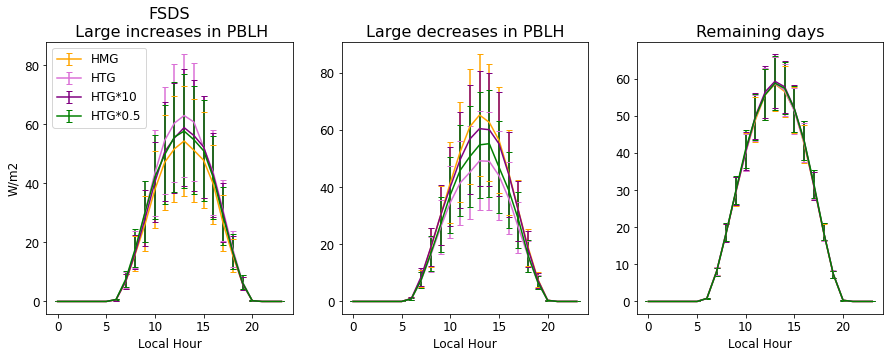

In [94]:
varSelPlot = 'FSDS'

levSel = None


# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(1,3, figsize=(15,5))
axs     = axs.ravel()

# Real surface 
# axs[0].plot(np.arange(24), hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0],color='orange',label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[0].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
axs[0].legend(fontsize=12)


axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orange',capsize=3,label='HMG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='orchid',capsize=3,label='HTG')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='purple',capsize=3,label='HTG*10')
axs[1].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values),
                fmt='-',color='green',capsize=3,label='HTG*0.5')
# axs[1].legend()


axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orange',capsize=3,label='HMG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='orchid',capsize=3,label='HTG')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='purple',capsize=3,label='HTG*10')
axs[2].errorbar(np.arange(24), 
                np.squeeze(hourlyMean_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0]),
                yerr =2*np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,levSel,0,0])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values),
                color='green',capsize=3,label='HTG*0.5')
# axs[2].legend()



# Set labels
axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)
# axs[3].set_title('(artificialSfc)', fontsize=14)

axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
# axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
axs[0].set_xlabel('Local Hour', fontsize=12)
axs[1].set_xlabel('Local Hour', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# Set axis ranges if desired
yMax = 0.2
yMin = -2.75

print(realSfc_allCases[varSelPlot].long_name)

# axs[0].set_ylim([yMin, yMax])
# axs[1].set_ylim([yMin, yMax])
# axs[2].set_ylim([yMin, yMax])
# axs[3].set_ylim([yMin, yMax])
# axs[4].set_ylim([yMin, yMax])
# axs[5].set_ylim([yMin, yMax])


In [111]:
realSfc_allCases.FSDS.long_name

'Downwelling solar flux at surface'

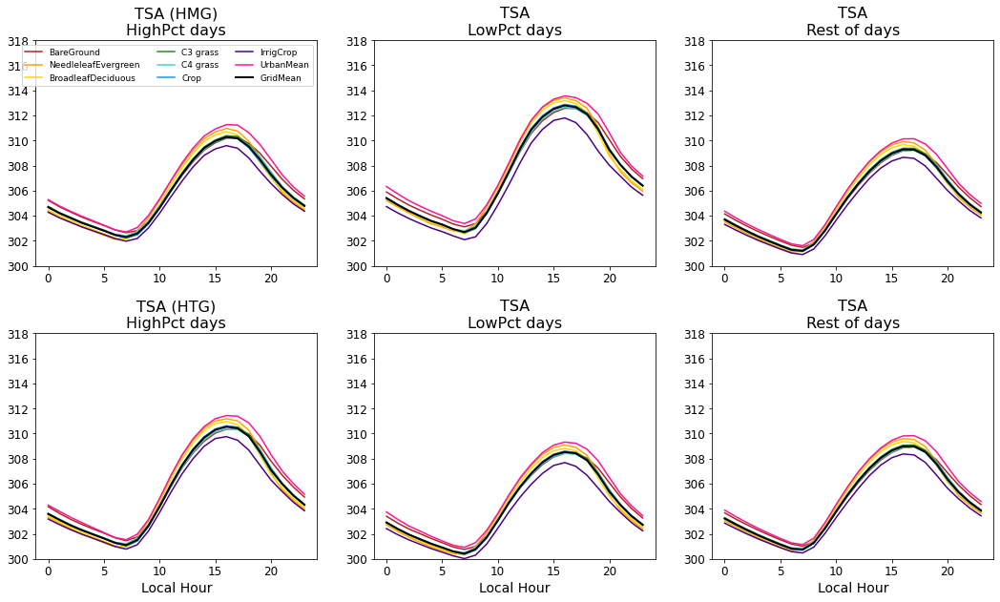

In [95]:
## Figure for manuscript

varSelPlot = 'TSA'

fig,axs = plt.subplots(2,3, figsize=(18,10))
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.3)

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise','dodgerblue','indigo','deeppink'])

# yMax = np.asarray([315, 0.025])
# yMin = np.asarray([299, 0.011])

iPlot=0

for iCase in range(2):
    selCaseHighPct = hourlyMean_highPct_realSfcCLMpatch.isel(case=iCase)
    selCaseLowPct  = hourlyMean_lowPct_realSfcCLMpatch.isel(case=iCase)
    selCaseRest    = hourlyMean_restOfDays_realSfcCLMpatch.isel(case=iCase)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]

    varSel_urban_high = np.nansum(selCaseHighPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_low  = np.nansum(selCaseLowPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_rest = np.nansum(selCaseRest[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    ## Plot patch means
    nPatches = len(patchLabels)-len(iUrban)
    
    for iPatch in range(nPatches):
        axs[iPlot+0].plot(selCaseHighPct.hour.values, np.squeeze(selCaseHighPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+1].plot(selCaseLowPct.hour.values, np.squeeze(selCaseLowPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+2].plot(selCaseRest.hour.values, np.squeeze(selCaseRest[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
            
    axs[iPlot+0].plot(selCaseHighPct.hour.values, varSel_urban_high,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+1].plot(selCaseLowPct.hour.values, varSel_urban_low,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+2].plot(selCaseRest.hour.values, varSel_urban_rest,
             '-',color=lineColors[-1],label='UrbanMean')
    
    # Plot gridcell means 
    selCaseHighPct_clm = hourlyMean_highPct_realSfcCLM.isel(case=iCase)
    selCaseLowPct_clm  = hourlyMean_lowPct_realSfcCLM.isel(case=iCase)
    selCaseRest_clm    = hourlyMean_restOfDays_realSfcCLM.isel(case=iCase)
    
    axs[iPlot+0].plot(selCaseHighPct_clm.hour.values, selCaseHighPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+1].plot(selCaseLowPct_clm.hour.values, selCaseLowPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+2].plot(selCaseRest_clm.hour.values, selCaseRest_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    
    axs[iPlot+0].set_title(varSelPlot+' ('+str(selCaseHighPct.case.values)+')\nHighPct days',fontsize=16)
    axs[iPlot+1].set_title(varSelPlot+'\nLowPct days',fontsize=16)
    axs[iPlot+2].set_title(varSelPlot+'\nRest of days',fontsize=16)

    if iCase==0:
        axs[iPlot+0].legend(fontsize=9,ncol=3)
    
    if iCase==1:
        axs[iPlot+0].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+1].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+2].set_xlabel('Local Hour', fontsize=14)
        
        
    axs[iPlot+0].tick_params(axis='both', labelsize= 12)
    axs[iPlot+1].tick_params(axis='both', labelsize= 12)
    axs[iPlot+2].tick_params(axis='both', labelsize= 12)

    # Set y limits 
    yMax = 318
    yMin = 300
    axs[iPlot+0].set_ylim([yMin,yMax])
    axs[iPlot+1].set_ylim([yMin,yMax])
    axs[iPlot+2].set_ylim([yMin,yMax])
    
    iPlot = iPlot+3
    

# axs[0].grid()
# axs[1].grid()



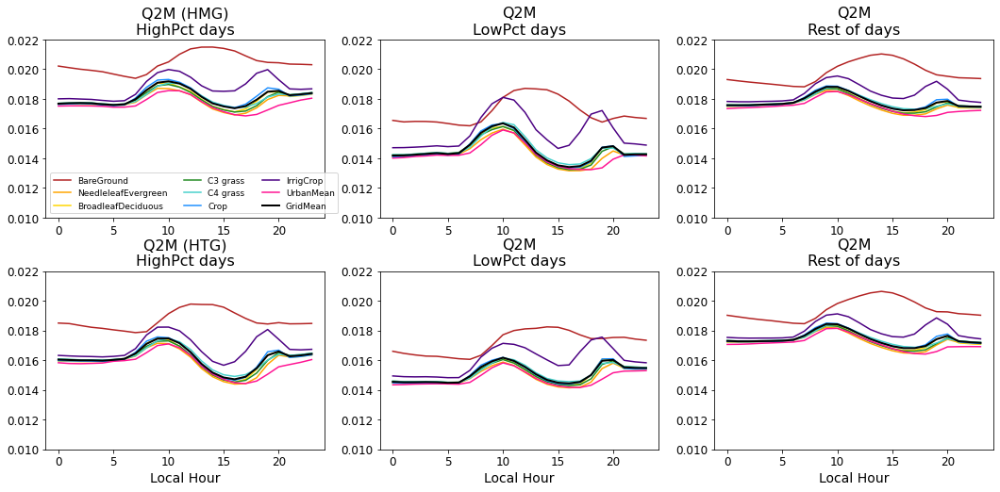

In [96]:
## Figure for manuscript

varSelPlot = 'Q2M'

fig,axs = plt.subplots(2,3, figsize=(18,8))
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.3)

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise','dodgerblue','indigo','deeppink'])

# yMax = np.asarray([315, 0.025])
# yMin = np.asarray([299, 0.011])

iPlot=0

for iCase in range(2):
    selCaseHighPct = hourlyMean_highPct_realSfcCLMpatch.isel(case=iCase)
    selCaseLowPct  = hourlyMean_lowPct_realSfcCLMpatch.isel(case=iCase)
    selCaseRest    = hourlyMean_restOfDays_realSfcCLMpatch.isel(case=iCase)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]

    varSel_urban_high = np.nansum(selCaseHighPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_low  = np.nansum(selCaseLowPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_rest = np.nansum(selCaseRest[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    ## Plot patch means
    nPatches = len(patchLabels)-len(iUrban)
    
    for iPatch in range(nPatches):
        axs[iPlot+0].plot(selCaseHighPct.hour.values, np.squeeze(selCaseHighPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+1].plot(selCaseLowPct.hour.values, np.squeeze(selCaseLowPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+2].plot(selCaseRest.hour.values, np.squeeze(selCaseRest[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
            
    axs[iPlot+0].plot(selCaseHighPct.hour.values, varSel_urban_high,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+1].plot(selCaseLowPct.hour.values, varSel_urban_low,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+2].plot(selCaseRest.hour.values, varSel_urban_rest,
             '-',color=lineColors[-1],label='UrbanMean')
    
    # Plot gridcell means 
    selCaseHighPct_clm = hourlyMean_highPct_realSfcCLM.isel(case=iCase)
    selCaseLowPct_clm  = hourlyMean_lowPct_realSfcCLM.isel(case=iCase)
    selCaseRest_clm    = hourlyMean_restOfDays_realSfcCLM.isel(case=iCase)
    
    axs[iPlot+0].plot(selCaseHighPct_clm.hour.values, selCaseHighPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+1].plot(selCaseLowPct_clm.hour.values, selCaseLowPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+2].plot(selCaseRest_clm.hour.values, selCaseRest_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    
    axs[iPlot+0].set_title(varSelPlot+' ('+str(selCaseHighPct.case.values)+')\nHighPct days',fontsize=16)
    axs[iPlot+1].set_title(varSelPlot+'\nLowPct days',fontsize=16)
    axs[iPlot+2].set_title(varSelPlot+'\nRest of days',fontsize=16)

    if iCase==0:
        axs[iPlot+0].legend(fontsize=9,ncol=3)
    
    if iCase==1:
        axs[iPlot+0].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+1].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+2].set_xlabel('Local Hour', fontsize=14)
        
        
    axs[iPlot+0].tick_params(axis='both', labelsize= 12)
    axs[iPlot+1].tick_params(axis='both', labelsize= 12)
    axs[iPlot+2].tick_params(axis='both', labelsize= 12)

#     Set y limits 
    yMax = 0.022
    yMin = 0.010
    axs[iPlot+0].set_ylim([yMin,yMax])
    axs[iPlot+1].set_ylim([yMin,yMax])
    axs[iPlot+2].set_ylim([yMin,yMax])
    
    iPlot = iPlot+3
    

# axs[0].grid()
# axs[1].grid()



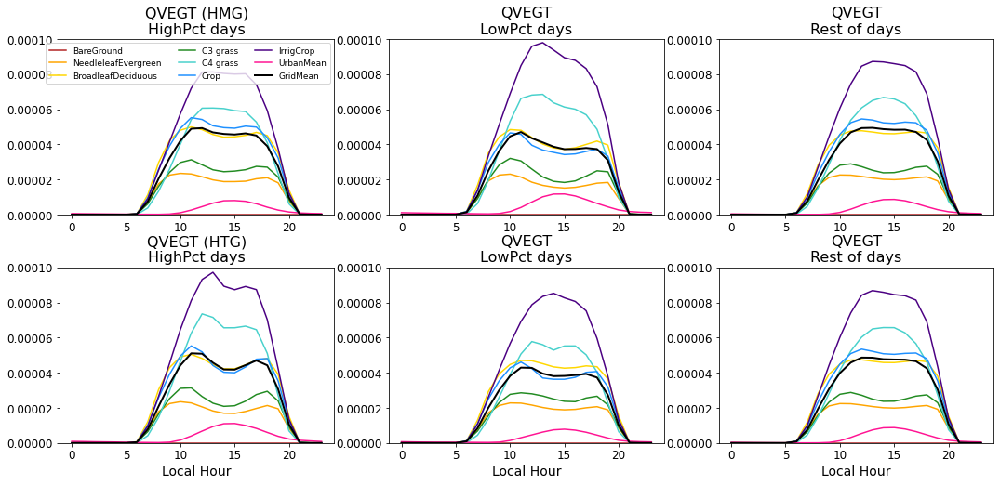

In [97]:
## Figure for manuscript

varSelPlot = 'QVEGT'

fig,axs = plt.subplots(2,3, figsize=(18,8))
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.3)

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise','dodgerblue','indigo','deeppink'])

# yMax = np.asarray([315, 0.025])
# yMin = np.asarray([299, 0.011])

iPlot=0

for iCase in range(2):
    selCaseHighPct = hourlyMean_highPct_realSfcCLMpatch.isel(case=iCase)
    selCaseLowPct  = hourlyMean_lowPct_realSfcCLMpatch.isel(case=iCase)
    selCaseRest    = hourlyMean_restOfDays_realSfcCLMpatch.isel(case=iCase)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]

    varSel_urban_high = np.nansum(selCaseHighPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_low  = np.nansum(selCaseLowPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_rest = np.nansum(selCaseRest[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    ## Plot patch means
    nPatches = len(patchLabels)-len(iUrban)
    
    for iPatch in range(nPatches):
        axs[iPlot+0].plot(selCaseHighPct.hour.values, np.squeeze(selCaseHighPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+1].plot(selCaseLowPct.hour.values, np.squeeze(selCaseLowPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+2].plot(selCaseRest.hour.values, np.squeeze(selCaseRest[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
            
    axs[iPlot+0].plot(selCaseHighPct.hour.values, varSel_urban_high,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+1].plot(selCaseLowPct.hour.values, varSel_urban_low,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+2].plot(selCaseRest.hour.values, varSel_urban_rest,
             '-',color=lineColors[-1],label='UrbanMean')
    
    # Plot gridcell means 
    selCaseHighPct_clm = hourlyMean_highPct_realSfcCLM.isel(case=iCase)
    selCaseLowPct_clm  = hourlyMean_lowPct_realSfcCLM.isel(case=iCase)
    selCaseRest_clm    = hourlyMean_restOfDays_realSfcCLM.isel(case=iCase)
    
    axs[iPlot+0].plot(selCaseHighPct_clm.hour.values, selCaseHighPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+1].plot(selCaseLowPct_clm.hour.values, selCaseLowPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+2].plot(selCaseRest_clm.hour.values, selCaseRest_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    
    axs[iPlot+0].set_title(varSelPlot+' ('+str(selCaseHighPct.case.values)+')\nHighPct days',fontsize=16)
    axs[iPlot+1].set_title(varSelPlot+'\nLowPct days',fontsize=16)
    axs[iPlot+2].set_title(varSelPlot+'\nRest of days',fontsize=16)

    if iCase==0:
        axs[iPlot+0].legend(fontsize=9,ncol=3)
    
    if iCase==1:
        axs[iPlot+0].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+1].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+2].set_xlabel('Local Hour', fontsize=14)
        
        
    axs[iPlot+0].tick_params(axis='both', labelsize= 12)
    axs[iPlot+1].tick_params(axis='both', labelsize= 12)
    axs[iPlot+2].tick_params(axis='both', labelsize= 12)

#     Set y limits 
    yMax = 1e-4
    yMin = 0
    axs[iPlot+0].set_ylim([yMin,yMax])
    axs[iPlot+1].set_ylim([yMin,yMax])
    axs[iPlot+2].set_ylim([yMin,yMax])
    
    iPlot = iPlot+3
    

# axs[0].grid()
# axs[1].grid()



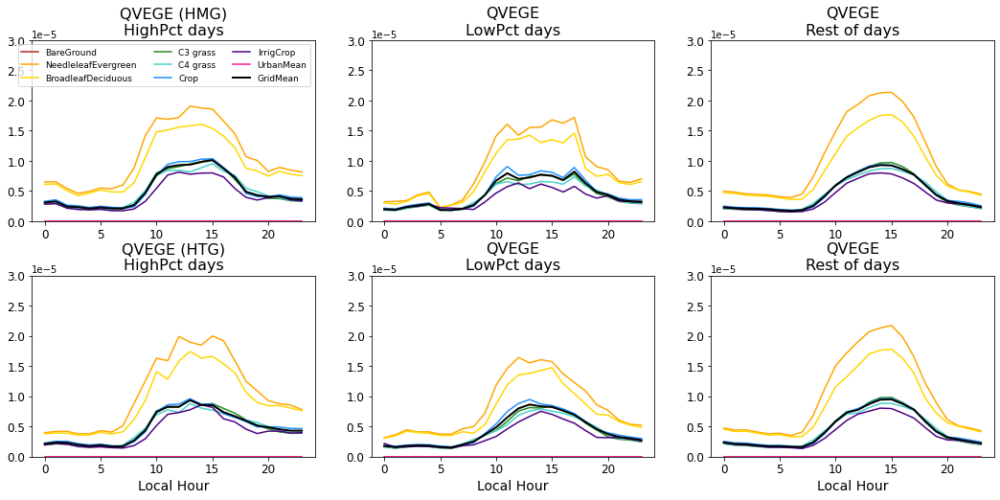

In [98]:
## Figure for manuscript

varSelPlot = 'QVEGE'

fig,axs = plt.subplots(2,3, figsize=(18,8))
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.3)

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise','dodgerblue','indigo','deeppink'])

# yMax = np.asarray([315, 0.025])
# yMin = np.asarray([299, 0.011])

iPlot=0

for iCase in range(2):
    selCaseHighPct = hourlyMean_highPct_realSfcCLMpatch.isel(case=iCase)
    selCaseLowPct  = hourlyMean_lowPct_realSfcCLMpatch.isel(case=iCase)
    selCaseRest    = hourlyMean_restOfDays_realSfcCLMpatch.isel(case=iCase)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]

    varSel_urban_high = np.nansum(selCaseHighPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_low  = np.nansum(selCaseLowPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_rest = np.nansum(selCaseRest[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    ## Plot patch means
    nPatches = len(patchLabels)-len(iUrban)
    
    for iPatch in range(nPatches):
        axs[iPlot+0].plot(selCaseHighPct.hour.values, np.squeeze(selCaseHighPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+1].plot(selCaseLowPct.hour.values, np.squeeze(selCaseLowPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+2].plot(selCaseRest.hour.values, np.squeeze(selCaseRest[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
            
    axs[iPlot+0].plot(selCaseHighPct.hour.values, varSel_urban_high,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+1].plot(selCaseLowPct.hour.values, varSel_urban_low,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+2].plot(selCaseRest.hour.values, varSel_urban_rest,
             '-',color=lineColors[-1],label='UrbanMean')
    
    # Plot gridcell means 
    selCaseHighPct_clm = hourlyMean_highPct_realSfcCLM.isel(case=iCase)
    selCaseLowPct_clm  = hourlyMean_lowPct_realSfcCLM.isel(case=iCase)
    selCaseRest_clm    = hourlyMean_restOfDays_realSfcCLM.isel(case=iCase)
    
    axs[iPlot+0].plot(selCaseHighPct_clm.hour.values, selCaseHighPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+1].plot(selCaseLowPct_clm.hour.values, selCaseLowPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+2].plot(selCaseRest_clm.hour.values, selCaseRest_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    
    axs[iPlot+0].set_title(varSelPlot+' ('+str(selCaseHighPct.case.values)+')\nHighPct days',fontsize=16)
    axs[iPlot+1].set_title(varSelPlot+'\nLowPct days',fontsize=16)
    axs[iPlot+2].set_title(varSelPlot+'\nRest of days',fontsize=16)

    if iCase==0:
        axs[iPlot+0].legend(fontsize=9,ncol=3)
    
    if iCase==1:
        axs[iPlot+0].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+1].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+2].set_xlabel('Local Hour', fontsize=14)
        
        
    axs[iPlot+0].tick_params(axis='both', labelsize= 12)
    axs[iPlot+1].tick_params(axis='both', labelsize= 12)
    axs[iPlot+2].tick_params(axis='both', labelsize= 12)

#     Set y limits 
    yMax = 3e-5
    yMin = 0
    axs[iPlot+0].set_ylim([yMin,yMax])
    axs[iPlot+1].set_ylim([yMin,yMax])
    axs[iPlot+2].set_ylim([yMin,yMax])
    
    iPlot = iPlot+3
    

# axs[0].grid()
# axs[1].grid()



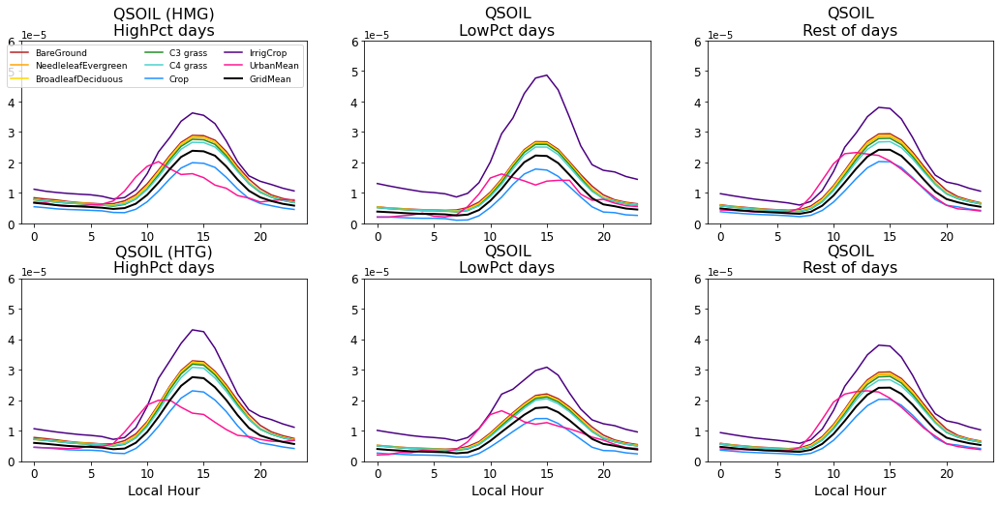

In [99]:
## Figure for manuscript

varSelPlot = 'QSOIL'

fig,axs = plt.subplots(2,3, figsize=(18,8))
axs     = axs.ravel()
fig.subplots_adjust(hspace = 0.3)

lineColors = np.asarray(['firebrick','orange','gold','forestgreen','mediumturquoise','dodgerblue','indigo','deeppink'])

# yMax = np.asarray([315, 0.025])
# yMin = np.asarray([299, 0.011])

iPlot=0

for iCase in range(2):
    selCaseHighPct = hourlyMean_highPct_realSfcCLMpatch.isel(case=iCase)
    selCaseLowPct  = hourlyMean_lowPct_realSfcCLMpatch.isel(case=iCase)
    selCaseRest    = hourlyMean_restOfDays_realSfcCLMpatch.isel(case=iCase)
    
    ## Get urban mean
    iUrban = np.where((colType>=70) & (colType<80))[0]

    varSel_urban_high = np.nansum(selCaseHighPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_low  = np.nansum(selCaseLowPct[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])
    varSel_urban_rest = np.nansum(selCaseRest[varSelPlot].values[:, iUrban]*PFTwgt[iUrban], axis=1)/np.nansum(PFTwgt[iUrban])

    ## Plot patch means
    nPatches = len(patchLabels)-len(iUrban)
    
    for iPatch in range(nPatches):
        axs[iPlot+0].plot(selCaseHighPct.hour.values, np.squeeze(selCaseHighPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+1].plot(selCaseLowPct.hour.values, np.squeeze(selCaseLowPct[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
        
        axs[iPlot+2].plot(selCaseRest.hour.values, np.squeeze(selCaseRest[varSelPlot].values[:, iPatch]),
                        '-', color=lineColors[iPatch], label=patchLabels[iPatch])
            
    axs[iPlot+0].plot(selCaseHighPct.hour.values, varSel_urban_high,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+1].plot(selCaseLowPct.hour.values, varSel_urban_low,
             '-',color=lineColors[-1],label='UrbanMean')
    axs[iPlot+2].plot(selCaseRest.hour.values, varSel_urban_rest,
             '-',color=lineColors[-1],label='UrbanMean')
    
    # Plot gridcell means 
    selCaseHighPct_clm = hourlyMean_highPct_realSfcCLM.isel(case=iCase)
    selCaseLowPct_clm  = hourlyMean_lowPct_realSfcCLM.isel(case=iCase)
    selCaseRest_clm    = hourlyMean_restOfDays_realSfcCLM.isel(case=iCase)
    
    axs[iPlot+0].plot(selCaseHighPct_clm.hour.values, selCaseHighPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+1].plot(selCaseLowPct_clm.hour.values, selCaseLowPct_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    axs[iPlot+2].plot(selCaseRest_clm.hour.values, selCaseRest_clm[varSelPlot].values,'k',linewidth=2,label='GridMean')
    
    axs[iPlot+0].set_title(varSelPlot+' ('+str(selCaseHighPct.case.values)+')\nHighPct days',fontsize=16)
    axs[iPlot+1].set_title(varSelPlot+'\nLowPct days',fontsize=16)
    axs[iPlot+2].set_title(varSelPlot+'\nRest of days',fontsize=16)

    if iCase==0:
        axs[iPlot+0].legend(fontsize=9,ncol=3)
    
    if iCase==1:
        axs[iPlot+0].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+1].set_xlabel('Local Hour', fontsize=14)
        axs[iPlot+2].set_xlabel('Local Hour', fontsize=14)
        
        
    axs[iPlot+0].tick_params(axis='both', labelsize= 12)
    axs[iPlot+1].tick_params(axis='both', labelsize= 12)
    axs[iPlot+2].tick_params(axis='both', labelsize= 12)

#     Set y limits 
    yMax = 0.6e-4
    yMin = 0
    axs[iPlot+0].set_ylim([yMin,yMax])
    axs[iPlot+1].set_ylim([yMin,yMax])
    axs[iPlot+2].set_ylim([yMin,yMax])
    
    iPlot = iPlot+3
    

# axs[0].grid()
# axs[1].grid()



**Plot large scale forcing**

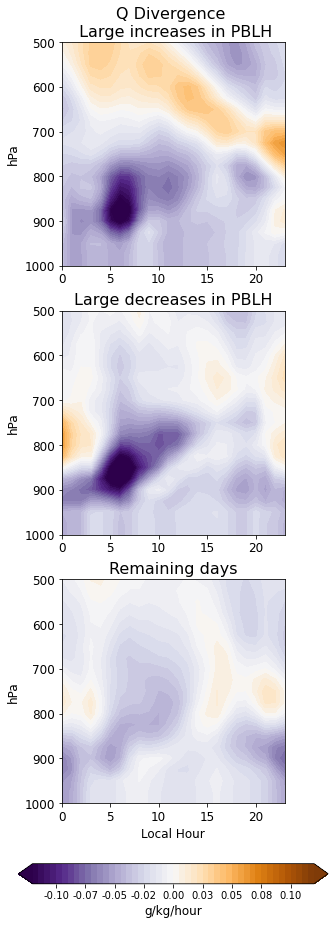

In [100]:
varSelPlot = 'q_adv_h'
levs = np.arange(-0.12, 0.125, 0.005)

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(3,1, figsize=(4,14))
axs     = axs.ravel()

hours   = hourlyMean_highPct_realSfc_obs['hour'].values
levAtm  =  hourlyMean_highPct_realSfc_obs['lev'].values

axs[0].contourf(hours, levAtm, np.transpose(hourlyMean_highPct_realSfc_obs[varSelPlot].values), 
                levs, cmap='PuOr_r', extend='both')

axs[1].contourf(hours, levAtm, np.transpose(hourlyMean_lowPct_realSfc_obs[varSelPlot].values), 
                levs, cmap='PuOr_r', extend='both')

cp=axs[2].contourf(hours, levAtm, np.transpose(hourlyMean_restOfDays_realSfc_obs[varSelPlot].values), 
                levs, cmap='PuOr_r', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0-0.15, ax_position.y0-0.08, ax_position.width+0.3, 0.02])
cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax, format='%.2f')
cbar.set_label(nateDS_local[varSelPlot].units,fontsize=12)



# Invert axes and set up titles/labels
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
# axs[3].invert_yaxis()
# axs[4].invert_yaxis()
# axs[5].invert_yaxis()

axs[0].set_ylim([1000,500])
axs[1].set_ylim([1000,500])
axs[2].set_ylim([1000,500])

# Set labels
axs[0].set_title('Q Divergence \n Large increases in '+varSel, fontsize=16)
axs[1].set_title('Large decreases in '+varSel, fontsize=16)
axs[2].set_title('Remaining days', fontsize=16)

axs[0].set_ylabel('hPa', fontsize=12)
axs[1].set_ylabel('hPa', fontsize=12)
axs[2].set_ylabel('hPa', fontsize=12)
axs[2].set_xlabel('Local Hour', fontsize=12)

axs[0].tick_params(axis='both', labelsize= 12)
axs[1].tick_params(axis='both', labelsize= 12)
axs[2].tick_params(axis='both', labelsize= 12)


# axs[3].set_title(varSelPlot+'\n on highPct days of '+varSel+' (artificialSfc)')
# axs[4].set_title('On lowPct days of '+varSel+' (artificialSfc)')
# axs[5].set_title('On remaining percentiles days of '+varSel+' (artificialSfc)')


Text(0.5, 1.0, 'On remaining percentiles days of PBLH (realSfc)')

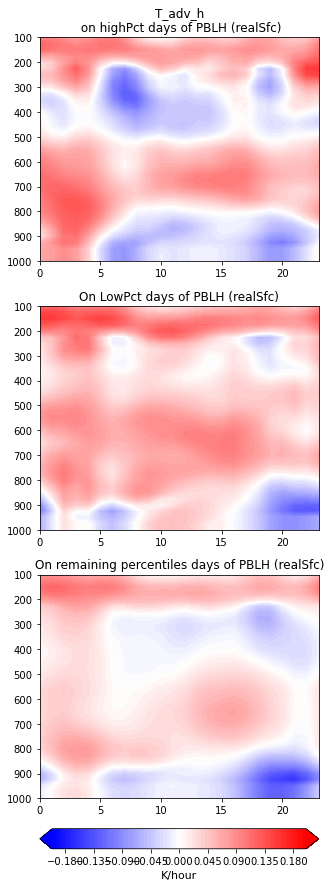

In [218]:
varSelPlot = 'T_adv_h'
levs = np.arange(-0.2, 0.205, 0.005)

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(3,1, figsize=(5,14))
axs     = axs.ravel()

hours   = hourlyMean_highPct_realSfc_obs['hour'].values
levAtm  =  hourlyMean_highPct_realSfc_obs['lev'].values

axs[0].contourf(hours, levAtm, np.transpose(hourlyMean_highPct_realSfc_obs[varSelPlot].values), 
                levs, cmap='bwr', extend='both')

axs[1].contourf(hours, levAtm, np.transpose(hourlyMean_lowPct_realSfc_obs[varSelPlot].values), 
                levs, cmap='bwr', extend='both')

cp=axs[2].contourf(hours, levAtm, np.transpose(hourlyMean_restOfDays_realSfc_obs[varSelPlot].values), 
                levs, cmap='bwr', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0, ax_position.y0-0.05, ax_position.width, 0.02])
cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax)
cbar.set_label(nateDS_local[varSelPlot].units,fontsize=11)

# axs[3].contourf(hours, levAtm, np.transpose(hourlyMean_highPct_artSfc_obs[varSelPlot].values), 
#                      levs, cmap='bwr', extend='both')
# cp = axs[4].contourf(hours, levAtm, np.transpose(hourlyMean_lowPct_artSfc_obs[varSelPlot].values), 
#                      levs, cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.1, ax_position.width+0.15, 0.03])
# cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax)
# cbar.set_label(nateDS_local[varSelPlot].units,fontsize=11)

# axs[5].contourf(hours, levAtm, np.transpose(hourlyMean_restOfDays_artSfc_obs[varSelPlot].values), 
#                      levs, cmap='bwr', extend='both')


# Invert axes and set up titles/labels
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
# axs[3].invert_yaxis()
# axs[4].invert_yaxis()
# axs[5].invert_yaxis()

axs[0].set_title(varSelPlot+'\n on highPct days of '+varSel+' (realSfc)')
axs[1].set_title('On LowPct days of '+varSel+' (realSfc)')
axs[2].set_title('On remaining percentiles days of '+varSel+' (realSfc)')

Text(0.5, 1.0, 'On remaining percentiles days of PBLH (realSfc)')

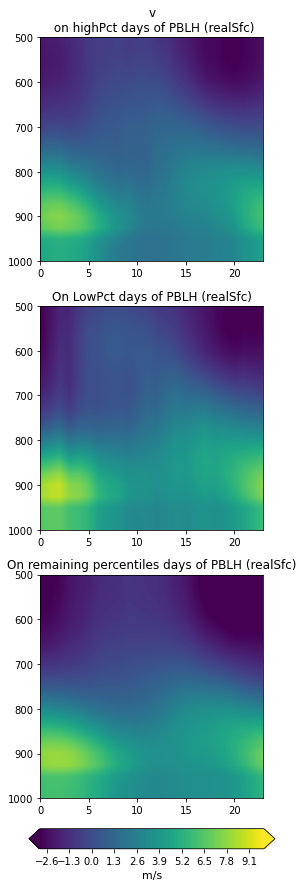

In [59]:
varSelPlot = 'v'
levs = np.arange(-3,10,0.05)

# fig,axs = plt.subplots(2,3, figsize=(15,10))
fig,axs = plt.subplots(3,1, figsize=(4,14))
axs     = axs.ravel()

hours   = hourlyMean_highPct_realSfc_obs['hour'].values
levAtm  =  hourlyMean_highPct_realSfc_obs['lev'].values

axs[0].contourf(hours, levAtm, np.transpose(hourlyMean_highPct_realSfc_obs[varSelPlot].values), 
                levs, cmap='viridis', extend='both')

axs[1].contourf(hours, levAtm, np.transpose(hourlyMean_lowPct_realSfc_obs[varSelPlot].values), 
                levs, cmap='viridis', extend='both')

cp=axs[2].contourf(hours, levAtm, np.transpose(hourlyMean_restOfDays_realSfc_obs[varSelPlot].values), 
                levs, cmap='viridis', extend='both')
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax = fig.add_axes([ax_position.x0-0.04, ax_position.y0-0.05, ax_position.width+0.08, 0.02])
cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax)
cbar.set_label(nateDS_local[varSelPlot].units,fontsize=11)

# axs[3].contourf(hours, levAtm, np.transpose(hourlyMean_highPct_artSfc_obs[varSelPlot].values), 
#                      levs, cmap='bwr', extend='both')
# cp = axs[4].contourf(hours, levAtm, np.transpose(hourlyMean_lowPct_artSfc_obs[varSelPlot].values), 
#                      levs, cmap='bwr', extend='both')
# # Add colorbar
# ax_position = axs[4].get_position()
# cbar_ax = fig.add_axes([ax_position.x0-0.05, ax_position.y0-0.1, ax_position.width+0.15, 0.03])
# cbar = plt.colorbar(cp, orientation='horizontal',cax=cbar_ax)
# cbar.set_label(nateDS_local[varSelPlot].units,fontsize=11)

# axs[5].contourf(hours, levAtm, np.transpose(hourlyMean_restOfDays_artSfc_obs[varSelPlot].values), 
#                      levs, cmap='bwr', extend='both')


# Invert axes and set up titles/labels
axs[0].invert_yaxis()
axs[1].invert_yaxis()
axs[2].invert_yaxis()
# axs[3].invert_yaxis()
# axs[4].invert_yaxis()
# axs[5].invert_yaxis()

axs[0].set_ylim([1000,500])
axs[1].set_ylim([1000,500])
axs[2].set_ylim([1000,500])

axs[0].set_title(varSelPlot+'\n on highPct days of '+varSel+' (realSfc)')
axs[1].set_title('On LowPct days of '+varSel+' (realSfc)')
axs[2].set_title('On remaining percentiles days of '+varSel+' (realSfc)')

# axs[3].set_title(varSelPlot+'\n on highPct days of '+varSel+' (artificialSfc)')
# axs[4].set_title('On lowPct days of '+varSel+' (artificialSfc)')
# axs[5].set_title('On remaining percentiles days of '+varSel+' (artificialSfc)')


**Contour plots of other variable changes**

In [101]:
'''
Give this plotting routine the hourly mean DS' of high/low percentile filtering
'''

def plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(highPctDS, lowPctDS, restOfDaysDS,
                                                                   sfcString, varSelPlot,
                                                                   levsRaw, levsDiff, maxLev,
                                                                   cmapRaw):

    ## Select which levels array to use
    if np.shape(highPctDS[varSelPlot].values)[2]==len(highPctDS.ilev.values):
        levSel = 'ilev'
    elif np.shape(highPctDS[varSelPlot].values)[2]==len(highPctDS.lev.values):
        levSel = 'lev'
    elif np.shape(highPctDS[varSelPlot].values)[2]==len(highPctDS.levInterp.values):
        levSel = 'levInterp'

    HMGvar_high   = np.squeeze(highPctDS.isel(case=np.where(highPctDS.case=='HMG')[0])[varSelPlot].values)
    HMGvar_low    = np.squeeze(lowPctDS.isel(case=np.where(lowPctDS.case == 'HMG')[0])[varSelPlot].values)
    HMGvar_rest   = np.squeeze(restOfDaysDS.isel(case=np.where(lowPctDS.case == 'HMG')[0])[varSelPlot].values)

    HTGvar_high   = np.squeeze(highPctDS.isel(case=np.where(highPctDS.case=='HTG')[0])[varSelPlot].values)
    HTGvar_low    = np.squeeze(lowPctDS.isel(case=np.where(lowPctDS.case == 'HTG')[0])[varSelPlot].values)
    HTGvar_rest   = np.squeeze(restOfDaysDS.isel(case=np.where(lowPctDS.case == 'HTG')[0])[varSelPlot].values)

    diffHTG_high   = HTGvar_high    - HMGvar_high
    diffHTG_low    = HTGvar_low     - HMGvar_low
    diffHTG_rest   = HTGvar_rest    - HMGvar_rest

    if sfcString=='realSfc':
        HTG10var_high   = np.squeeze(highPctDS.isel(case=np.where(highPctDS.case=='HTG10')[0])[varSelPlot].values)
        HTG10var_low    = np.squeeze(lowPctDS.isel(case=np.where(lowPctDS.case == 'HTG10')[0])[varSelPlot].values)
        HTG10var_rest   = np.squeeze(restOfDaysDS.isel(case=np.where(restOfDaysDS.case == 'HTG10')[0])[varSelPlot].values)

        diffHTG10_high   = HTG10var_high    - HMGvar_high
        diffHTG10_low    = HTG10var_low     - HMGvar_low
        diffHTG10_rest   = HTG10var_rest    - HMGvar_rest
        
        
        HTGp5var_high   = np.squeeze(highPctDS.isel(case=np.where(highPctDS.case=='HTGp5')[0])[varSelPlot].values)
        HTGp5var_low    = np.squeeze(lowPctDS.isel(case=np.where(lowPctDS.case == 'HTGp5')[0])[varSelPlot].values)
        HTGp5var_rest   = np.squeeze(restOfDaysDS.isel(case=np.where(restOfDaysDS.case == 'HTGp5')[0])[varSelPlot].values)

        diffHTGp5_high   = HTGp5var_high    - HMGvar_high
        diffHTGp5_low    = HTGp5var_low     - HMGvar_low
        diffHTGp5_rest   = HTGp5var_rest    - HMGvar_rest


    elif sfcString=='artificialSfc':
        HTG5var_high   = np.squeeze(highPctDS.isel(case=np.where(highPctDS.case=='HTG5')[0])[varSelPlot].values)
        HTG5var_low    = np.squeeze(lowPctDS.isel(case=np.where(lowPctDS.case == 'HTG5')[0])[varSelPlot].values)
        HTG5var_rest   = np.squeeze(restOfDaysDS.isel(case=np.where(restOfDaysDS.case == 'HTG5')[0])[varSelPlot].values)

        diffHTG5_high   = HTG5var_high    - HMGvar_high
        diffHTG5_low    = HTG5var_low     - HMGvar_low
        diffHTG5_rest   = HTG5var_rest    - HMGvar_rest

        HTG25var_high   = np.squeeze(highPctDS.isel(case=np.where(highPctDS.case=='HTG25')[0])[varSelPlot].values)
        HTG25var_low    = np.squeeze(lowPctDS.isel(case=np.where(lowPctDS.case == 'HTG25')[0])[varSelPlot].values)
        HTG25var_rest   = np.squeeze(restOfDaysDS.isel(case=np.where(restOfDaysDS.case == 'HTG25')[0])[varSelPlot].values)

        diffHTG25_high   = HTG25var_high    - HMGvar_high
        diffHTG25_low    = HTG25var_low     - HMGvar_low
        diffHTG25_rest   = HTG25var_rest    - HMGvar_rest

    else:
        print('* Please select either realSfc or artificialSfc for sfcString input * ')



    ## Set up figure
    fig,axs = plt.subplots(3,4, figsize=(18,14))
    axs     = axs.ravel()
    fig.subplots_adjust(hspace=0.2)

    hours   = highPctDS.hour.values
    atmLevs = highPctDS[levSel].values

#     if sfcString=='realSfc':
#         fig.delaxes(axs[3])
#         fig.delaxes(axs[7])
#         fig.delaxes(axs[11])

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Plot raw values
    
    # cmap = PiYG for two-sided vars, otherwise use viridis
    
    contour_plot = axs[0].contourf(hours, atmLevs,
                                 np.squeeze(HMGvar_high).transpose(),
                                 levels=levsRaw, cmap=cmapRaw,extend='both')
    contour_plot = axs[4].contourf(hours, atmLevs,
                                 np.squeeze(HMGvar_low).transpose(),
                                 levels=levsRaw, cmap=cmapRaw,extend='both')
    contour_plot = axs[8].contourf(hours, atmLevs,
                                 np.squeeze(HMGvar_rest).transpose(),
                                 levels=levsRaw, cmap=cmapRaw,extend='both')
    
    # Add colorbar
    ax_position = axs[8].get_position()
    cbar_ax = fig.add_axes([ax_position.x0-0.025, ax_position.y0-0.1, ax_position.width+0.05, 0.02])
    if varSelPlot=='Q':
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax,format='%.1e')
        tick_locator = ticker.MaxNLocator(nbins=5)
        cbar.locator = tick_locator
        cbar.update_ticks()
    else:
        cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
    cbar.ax.tick_params(labelsize=12)
    if hasattr(realSfc_allCases[varSelPlot], 'units'):
        cbar.set_label(realSfc_allCases[varSelPlot].units,fontsize=12)


    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Plot differences
    contour_plot = axs[1].contourf(hours, atmLevs, diffHTG_high.transpose(),
                                   levels=levsDiff, cmap='bwr',extend='both')
    contour_plot = axs[5].contourf(hours, atmLevs, diffHTG_low.transpose(),
                                   levels=levsDiff, cmap='bwr',extend='both')
    contour_plot = axs[9].contourf(hours, atmLevs, diffHTG_rest.transpose(),
                                   levels=levsDiff, cmap='bwr',extend='both')
    
    # - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Real surface
    if sfcString=='realSfc':
        contour_plot = axs[2].contourf(hours, atmLevs, diffHTG10_high.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[6].contourf(hours, atmLevs, diffHTG10_low.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[10].contourf(hours, atmLevs, diffHTG10_rest.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        
        contour_plot = axs[3].contourf(hours, atmLevs, diffHTGp5_high.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[7].contourf(hours, atmLevs, diffHTGp5_low.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[11].contourf(hours, atmLevs, diffHTGp5_rest.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')

        # Add colorbar
        ax_position = axs[10].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.18, ax_position.y0-0.1, ax_position.width+0.12, 0.02])
        if varSelPlot=='Q':
            cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax,format='%0.1e')
            tick_locator = ticker.MaxNLocator(nbins=5)
            cbar.locator = tick_locator
            cbar.update_ticks()
        else:
            cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        cbar.ax.tick_params(labelsize=12)
        if hasattr(realSfc_allCases[varSelPlot], 'units'):
            cbar.set_label(realSfc_allCases[varSelPlot].units,fontsize=12)
            
        ## Other plot options as necessary
        axs[2].set_title('HTG*10-HMG', fontsize=16)
        axs[3].set_title('HTG*0.5-HMG', fontsize=16)
        axs[11].set_xlabel('Local Hour', fontsize=14)
        
        axs[3].invert_yaxis()
        axs[7].invert_yaxis()
        axs[11].invert_yaxis()
        axs[3].set_ylim([1000, maxLev])
        axs[7].set_ylim([1000, maxLev])
        axs[11].set_ylim([1000, maxLev])
        axs[7].axes.yaxis.set_ticklabels([])
        axs[11].axes.yaxis.set_ticklabels([])
        axs[3].axes.xaxis.set_ticklabels([])
        axs[7].axes.xaxis.set_ticklabels([])

 
    # - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Artificial surface
    elif sfcString=='artificialSfc':
        contour_plot = axs[2].contourf(hours, atmLevs, diffHTG5_high.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[6].contourf(hours, atmLevs, diffHTG5_low.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[10].contourf(hours, atmLevs, diffHTG5_rest.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')

        contour_plot = axs[3].contourf(hours, atmLevs, diffHTG25_high.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[7].contourf(hours, atmLevs, diffHTG25_low.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')
        contour_plot = axs[11].contourf(hours, atmLevs, diffHTG25_rest.transpose(),
                                         levels=levsDiff, cmap='bwr',extend='both')

        # Add colorbar
        ax_position = axs[11].get_position()
        cbar_ax = fig.add_axes([ax_position.x0-0.31, ax_position.y0-0.1, ax_position.width+0.20, 0.02])
        if varSelPlot=='Q':
            cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax,format='%0.1e')
            tick_locator = ticker.MaxNLocator(nbins=5)
            cbar.locator = tick_locator
            cbar.update_ticks()
        else:
            cbar = plt.colorbar(contour_plot, orientation='horizontal',cax=cbar_ax)
        cbar.ax.tick_params(labelsize=12)
        if hasattr(realSfc_allCases[varSelPlot], 'units'):
            cbar.set_label(realSfc_allCases[varSelPlot].units,fontsize=12)

        # Other plot options as needed for extra multiplier cases
        axs[3].invert_yaxis()
        axs[7].invert_yaxis()
        axs[11].invert_yaxis()
        axs[3].set_ylim([1000, maxLev])
        axs[7].set_ylim([1000, maxLev])
        axs[11].set_ylim([1000, maxLev])
        axs[7].axes.yaxis.set_ticklabels([])
        axs[11].axes.yaxis.set_ticklabels([])
        axs[3].axes.xaxis.set_ticklabels([])
        axs[7].axes.xaxis.set_ticklabels([])

        axs[2].set_title('HTG*0.5-HMG', fontsize=16)
        axs[3].set_title('HTG*0.25-HMG', fontsize=16)
        axs[11].set_xlabel('Local Hour', fontsize=14)

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    # Other plot options
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()
    axs[4].invert_yaxis()
    axs[5].invert_yaxis()
    axs[6].invert_yaxis()
    axs[8].invert_yaxis()
    axs[9].invert_yaxis()
    axs[10].invert_yaxis()


    axs[0].set_ylim([1000, maxLev])
    axs[1].set_ylim([1000, maxLev])
    axs[2].set_ylim([1000, maxLev])
    axs[4].set_ylim([1000, maxLev])
    axs[5].set_ylim([1000, maxLev])
    axs[6].set_ylim([1000, maxLev])
    axs[8].set_ylim([1000, maxLev])
    axs[9].set_ylim([1000, maxLev])
    axs[10].set_ylim([1000, maxLev])
   

    axs[0].axes.xaxis.set_ticklabels([])
    axs[1].axes.xaxis.set_ticklabels([])
    axs[2].axes.xaxis.set_ticklabels([])
    axs[4].axes.xaxis.set_ticklabels([])
    axs[5].axes.xaxis.set_ticklabels([])
    axs[6].axes.xaxis.set_ticklabels([])
    
    axs[1].axes.yaxis.set_ticklabels([])
    axs[2].axes.yaxis.set_ticklabels([])
    axs[5].axes.yaxis.set_ticklabels([])
    axs[6].axes.yaxis.set_ticklabels([])
    axs[9].axes.yaxis.set_ticklabels([])
    axs[10].axes.yaxis.set_ticklabels([])
   

    axs[0].set_title(varSelPlot+' (HMG)\n Large increases in '+varSel, fontsize=16)
    axs[1].set_title('HTG-HMG', fontsize=16)
       
    axs[4].set_title('Large decreases in '+varSel, fontsize=16)
    
    axs[8].set_title('Remaining days', fontsize=16)

    axs[8].set_xlabel('Local Hour', fontsize=12)
    axs[9].set_xlabel('Local Hour', fontsize=12)
    axs[10].set_xlabel('Local Hour', fontsize=12)
    
    if varSelPlot.endswith('_interp'):
        axs[0].set_ylabel('hPa', fontsize=12)
        axs[4].set_ylabel('hPa', fontsize=12)
        axs[8].set_ylabel('hPa', fontsize=12)
    else:
        axs[0].set_ylabel('hPa (model hybrid coord)', fontsize=12)
        axs[4].set_ylabel('hPa (model hybrid coord)', fontsize=12)
        axs[8].set_ylabel('hPa (model hybrid coord)', fontsize=12)

        

    # Set labels
#     axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)
#     axs[1].set_title('Large decreases in '+varSel, fontsize=16)
#     axs[2].set_title('Remaining days', fontsize=16)
#     # axs[3].set_title('(artificialSfc)', fontsize=14)

#     axs[0].set_ylabel(realSfc_allCases[varSelPlot].units, fontsize=12)
    # axs[3].set_ylabel(realSfc_allCases[varSelPlot].units)
#     axs[0].set_xlabel('Local Hour', fontsize=12)
#     axs[1].set_xlabel('Local Hour', fontsize=12)
#     axs[2].set_xlabel('Local Hour', fontsize=12)

    axs[0].tick_params(axis='both', labelsize= 12)
    axs[1].tick_params(axis='both', labelsize= 12)
    axs[2].tick_params(axis='both', labelsize= 12)
    axs[4].tick_params(axis='both', labelsize= 12)
    axs[5].tick_params(axis='both', labelsize= 12)
    axs[6].tick_params(axis='both', labelsize= 12)
    axs[8].tick_params(axis='both', labelsize= 12)
    axs[9].tick_params(axis='both', labelsize= 12)
    axs[10].tick_params(axis='both', labelsize= 12)
        

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Add markers of significant differences

    ## Real surface significance 
    for il in range(len(hourlyMean_highPct_realSfc[levSel].values)):
        
        ## High pct
        stdErr_highPct_HMG = np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,0,il])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values)
        stdErr_highPct_HTG = np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,1,il])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values)
        stdErr_highPct_HTG10 = np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,2,il])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values)
        stdErr_highPct_HTGp5 = np.squeeze(hourlyStd_highPct_realSfc[varSelPlot].values[:,3,il])/np.sqrt(hourlyMean_highPct_realSfc['SampleCount'].values)

        xmax1_highPct = np.squeeze(HMGvar_high)[:,il] + (2*stdErr_highPct_HMG)
        xmin1_highPct = np.squeeze(HMGvar_high)[:,il] - (2*stdErr_highPct_HMG)
        xmax2_highPct = np.squeeze(HTGvar_high)[:,il] + (2*stdErr_highPct_HTG)
        xmin2_highPct = np.squeeze(HTGvar_high)[:,il] - (2*stdErr_highPct_HTG)
        
        xmax2_highPct10 = np.squeeze(HTG10var_high)[:,il] + (2*stdErr_highPct_HTG10)
        xmin2_highPct10 = np.squeeze(HTG10var_high)[:,il] - (2*stdErr_highPct_HTG10)
        
        xmax2_highPctp5 = np.squeeze(HTGp5var_high)[:,il] + (2*stdErr_highPct_HTGp5)
        xmin2_highPctp5 = np.squeeze(HTGp5var_high)[:,il] - (2*stdErr_highPct_HTGp5)
        
        
        ## Low pct
        stdErr_lowPct_HMG = np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,0,il])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values)
        stdErr_lowPct_HTG = np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,1,il])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values)
        stdErr_lowPct_HTG10 = np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,2,il])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values)
        stdErr_lowPct_HTGp5 = np.squeeze(hourlyStd_lowPct_realSfc[varSelPlot].values[:,3,il])/np.sqrt(hourlyMean_lowPct_realSfc['SampleCount'].values)

        xmax1_lowPct = np.squeeze(HMGvar_low)[:,il] + (2*stdErr_lowPct_HMG)
        xmin1_lowPct = np.squeeze(HMGvar_low)[:,il] - (2*stdErr_lowPct_HMG)
        xmax2_lowPct = np.squeeze(HTGvar_low)[:,il] + (2*stdErr_lowPct_HTG)
        xmin2_lowPct = np.squeeze(HTGvar_low)[:,il] - (2*stdErr_lowPct_HTG)
        
        xmax2_lowPct10 = np.squeeze(HTG10var_low)[:,il] + (2*stdErr_lowPct_HTG10)
        xmin2_lowPct10 = np.squeeze(HTG10var_low)[:,il] - (2*stdErr_lowPct_HTG10)
        
        xmax2_lowPctp5 = np.squeeze(HTGp5var_low)[:,il] + (2*stdErr_lowPct_HTGp5)
        xmin2_lowPctp5 = np.squeeze(HTGp5var_low)[:,il] - (2*stdErr_lowPct_HTGp5)
        
        
        
        ## Rest of days
        stdErr_restOfDays_HMG = np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,0,il])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values)
        stdErr_restOfDays_HTG = np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,1,il])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values)
        stdErr_restOfDays_HTG10 = np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,2,il])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values)
        stdErr_restOfDays_HTGp5 = np.squeeze(hourlyStd_restOfDays_realSfc[varSelPlot].values[:,3,il])/np.sqrt(hourlyMean_restOfDays_realSfc['SampleCount'].values)

        xmax1_restOfDays = np.squeeze(HMGvar_rest)[:,il] + (2*stdErr_restOfDays_HMG)
        xmin1_restOfDays = np.squeeze(HMGvar_rest)[:,il] - (2*stdErr_restOfDays_HMG)
        xmax2_restOfDays = np.squeeze(HTGvar_rest)[:,il] + (2*stdErr_restOfDays_HTG)
        xmin2_restOfDays = np.squeeze(HTGvar_rest)[:,il] - (2*stdErr_restOfDays_HTG)
        
        xmax2_restOfDays10 = np.squeeze(HTG10var_rest)[:,il] + (2*stdErr_restOfDays_HTG10)
        xmin2_restOfDays10 = np.squeeze(HTG10var_rest)[:,il] - (2*stdErr_restOfDays_HTG10)
        
        xmax2_restOfDaysp5 = np.squeeze(HTGp5var_rest)[:,il] + (2*stdErr_restOfDays_HTGp5)
        xmin2_restOfDaysp5 = np.squeeze(HTGp5var_rest)[:,il] - (2*stdErr_restOfDays_HTGp5)

        # Check significance and plot 
        levSig_highPct   = np.ones([24])
        levSig_highPct10 = np.ones([24])
        levSig_highPctp5 = np.ones([24])
        
        levSig_lowPct   = np.ones([24])
        levSig_lowPct10 = np.ones([24])
        levSig_lowPctp5 = np.ones([24])
        
        levSig_restOfDays   = np.ones([24])
        levSig_restOfDays10 = np.ones([24])
        levSig_restOfDaysp5 = np.ones([24])
        
        for iHr in range(24):
            ## High Pct 
            # HTG
            if ((abs(xmin1_highPct[iHr])>=abs(xmin2_highPct[iHr])) & (abs(xmin1_highPct[iHr])<=abs(xmax2_highPct[iHr]))):
                levSig_highPct[iHr] = 0
            elif ((abs(xmin2_highPct[iHr])>=abs(xmin1_highPct[iHr])) & (abs(xmin2_highPct[iHr])<=abs(xmax1_highPct[iHr]))):
                levSig_highPct[iHr] = 0

            if levSig_highPct[iHr]==1:
                axs[1].plot(hourlyMean_highPct_realSfc['hour'].values[iHr],
                            hourlyMean_highPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)

            # HTG10
            if ((abs(xmin1_highPct[iHr])>=abs(xmin2_highPct10[iHr])) & (abs(xmin1_highPct[iHr])<=abs(xmax2_highPct10[iHr]))):
                levSig_highPct10[iHr] = 0
            elif ((abs(xmin2_highPct10[iHr])>=abs(xmin1_highPct[iHr])) & (abs(xmin2_highPct10[iHr])<=abs(xmax1_highPct[iHr]))):
                levSig_highPct10[iHr] = 0

            if levSig_highPct10[iHr]==1:
                axs[2].plot(hourlyMean_highPct_realSfc['hour'].values[iHr],
                            hourlyMean_highPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)
                
            # HTGp5
            if ((abs(xmin1_highPct[iHr])>=abs(xmin2_highPctp5[iHr])) & (abs(xmin1_highPct[iHr])<=abs(xmax2_highPctp5[iHr]))):
                levSig_highPctp5[iHr] = 0
            elif ((abs(xmin2_highPctp5[iHr])>=abs(xmin1_highPct[iHr])) & (abs(xmin2_highPctp5[iHr])<=abs(xmax1_highPct[iHr]))):
                levSig_highPctp5[iHr] = 0

            if levSig_highPctp5[iHr]==1:
                axs[3].plot(hourlyMean_highPct_realSfc['hour'].values[iHr],
                            hourlyMean_highPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)
                
                
            ## Low percent
            # HTG
            if ((abs(xmin1_lowPct[iHr])>=abs(xmin2_lowPct[iHr])) & (abs(xmin1_lowPct[iHr])<=abs(xmax2_lowPct[iHr]))):
                levSig_lowPct[iHr] = 0
            elif ((abs(xmin2_lowPct[iHr])>=abs(xmin1_lowPct[iHr])) & (abs(xmin2_lowPct[iHr])<=abs(xmax1_lowPct[iHr]))):
                levSig_lowPct[iHr] = 0

            if levSig_lowPct[iHr]==1:
                axs[5].plot(hourlyMean_lowPct_realSfc['hour'].values[iHr],
                            hourlyMean_lowPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)

            # HTG10
            if ((abs(xmin1_lowPct[iHr])>=abs(xmin2_lowPct10[iHr])) & (abs(xmin1_lowPct[iHr])<=abs(xmax2_lowPct10[iHr]))):
                levSig_lowPct10[iHr] = 0
            elif ((abs(xmin2_lowPct10[iHr])>=abs(xmin1_lowPct[iHr])) & (abs(xmin2_lowPct10[iHr])<=abs(xmax1_lowPct[iHr]))):
                levSig_lowPct10[iHr] = 0

            if levSig_lowPct10[iHr]==1:
                axs[6].plot(hourlyMean_lowPct_realSfc['hour'].values[iHr],
                            hourlyMean_lowPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)
                
            # HTGp5
            if ((abs(xmin1_lowPct[iHr])>=abs(xmin2_lowPctp5[iHr])) & (abs(xmin1_lowPct[iHr])<=abs(xmax2_lowPctp5[iHr]))):
                levSig_lowPctp5[iHr] = 0
            elif ((abs(xmin2_lowPctp5[iHr])>=abs(xmin1_lowPct[iHr])) & (abs(xmin2_lowPctp5[iHr])<=abs(xmax1_lowPct[iHr]))):
                levSig_lowPctp5[iHr] = 0

            if levSig_lowPctp5[iHr]==1:
                axs[7].plot(hourlyMean_lowPct_realSfc['hour'].values[iHr],
                            hourlyMean_lowPct_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)
                
                
                
            ## Rest of days
            # HTG
            if ((abs(xmin1_restOfDays[iHr])>=abs(xmin2_restOfDays[iHr])) & (abs(xmin1_restOfDays[iHr])<=abs(xmax2_restOfDays[iHr]))):
                levSig_restOfDays[iHr] = 0
            elif ((abs(xmin2_restOfDays[iHr])>=abs(xmin1_restOfDays[iHr])) & (abs(xmin2_restOfDays[iHr])<=abs(xmax1_restOfDays[iHr]))):
                levSig_restOfDays[iHr] = 0

            if levSig_restOfDays[iHr]==1:
                axs[9].plot(hourlyMean_restOfDays_realSfc['hour'].values[iHr],
                            hourlyMean_restOfDays_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)

            # HTG10
            if ((abs(xmin1_restOfDays[iHr])>=abs(xmin2_restOfDays10[iHr])) & (abs(xmin1_restOfDays[iHr])<=abs(xmax2_restOfDays10[iHr]))):
                levSig_restOfDays10[iHr] = 0
            elif ((abs(xmin2_restOfDays10[iHr])>=abs(xmin1_restOfDays[iHr])) & (abs(xmin2_restOfDays10[iHr])<=abs(xmax1_restOfDays[iHr]))):
                levSig_restOfDays10[iHr] = 0

            if levSig_restOfDays10[iHr]==1:
                axs[10].plot(hourlyMean_restOfDays_realSfc['hour'].values[iHr],
                            hourlyMean_restOfDays_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)

                
            # HTGp5
            if ((abs(xmin1_restOfDays[iHr])>=abs(xmin2_restOfDaysp5[iHr])) & (abs(xmin1_restOfDays[iHr])<=abs(xmax2_restOfDaysp5[iHr]))):
                levSig_restOfDaysp5[iHr] = 0
            elif ((abs(xmin2_restOfDaysp5[iHr])>=abs(xmin1_restOfDays[iHr])) & (abs(xmin2_restOfDaysp5[iHr])<=abs(xmax1_restOfDays[iHr]))):
                levSig_restOfDaysp5[iHr] = 0

            if levSig_restOfDaysp5[iHr]==1:
                axs[10].plot(hourlyMean_restOfDays_realSfc['hour'].values[iHr],
                            hourlyMean_restOfDays_realSfc[levSel].values[il],
                            'ko',alpha=0.3,markersize=1)

#     # Artificial surface significance
#     for il in range(len(hourlyMean_dDry_artSfc[levSel].values)):
#         stdErr_dDry_HMG = np.squeeze(hourlyStd_dDry_artSfc[varSel].values)[:,0,il]/np.sqrt(hourlyMean_dDry_artSfc['SampleCount'].values)
#         stdErr_dDry_HTG = np.squeeze(hourlyStd_dDry_artSfc[varSel].values)[:,1,il]/np.sqrt(hourlyMean_dDry_artSfc['SampleCount'].values)
#         stdErr_dDry_HTG5  = np.squeeze(hourlyStd_dDry_artSfcMult[varSel].values)[:,0,il]/np.sqrt(hourlyMean_dDry_artSfcMult['SampleCount'].values)
#         stdErr_dDry_HTG25 = np.squeeze(hourlyStd_dDry_artSfcMult[varSel].values)[:,1,il]/np.sqrt(hourlyMean_dDry_artSfcMult['SampleCount'].values)

#         xmax1_dry = np.squeeze(HMGvar_art)[:,il] + (2*stdErr_dDry_HMG)
#         xmin1_dry = np.squeeze(HMGvar_art)[:,il] - (2*stdErr_dDry_HMG)
#         xmax2_dry = np.squeeze(HTGvar_art)[:,il] + (2*stdErr_dDry_HTG)
#         xmin2_dry = np.squeeze(HTGvar_art)[:,il] - (2*stdErr_dDry_HTG)

#         xmax2_dry5 = np.squeeze(HTG5var)[:,il] + (2*stdErr_dDry_HTG5)
#         xmin2_dry5 = np.squeeze(HTG5var)[:,il] - (2*stdErr_dDry_HTG5)
#         xmax2_dry25 = np.squeeze(HTG25var)[:,il] + (2*stdErr_dDry_HTG25)
#         xmin2_dry25 = np.squeeze(HTG25var)[:,il] - (2*stdErr_dDry_HTG25)


#         levSig_dry = np.ones([24])
#         levSig_dry5  = np.ones([24])
#         levSig_dry25 = np.ones([24])
#         for iHr in range(24):
#             # HTG
#             if ((abs(xmin1_dry[iHr])>=abs(xmin2_dry[iHr])) & (abs(xmin1_dry[iHr])<=abs(xmax2_dry[iHr]))):
#                 levSig_dry[iHr] = 0
#             elif ((abs(xmin2_dry[iHr])>=abs(xmin1_dry[iHr])) & (abs(xmin2_dry[iHr])<=abs(xmax1_dry[iHr]))):
#                 levSig_dry[iHr] = 0

#             if levSig_dry[iHr]==1:
#                 axs[5].plot(hourlyMean_dDry_artSfc['hour'].values[iHr],
#                             hourlyMean_dDry_artSfc[levSel].values[il],
#                             'ko',alpha=0.3,markersize=2)

#             # HTG5
#             if ((abs(xmin1_dry[iHr])>=abs(xmin2_dry5[iHr])) & (abs(xmin1_dry[iHr])<=abs(xmax2_dry5[iHr]))):
#                 levSig_dry5[iHr] = 0
#             elif ((abs(xmin2_dry5[iHr])>=abs(xmin1_dry[iHr])) & (abs(xmin2_dry5[iHr])<=abs(xmax1_dry[iHr]))):
#                 levSig_dry5[iHr] = 0

#             if levSig_dry5[iHr]==1:
#                 axs[6].plot(hourlyMean_dDry_artSfcMult['hour'].values[iHr],
#                             hourlyMean_dDry_artSfcMult[levSel].values[il],
#                             'ko',alpha=0.3,markersize=2)

#             # HTG25
#             if ((abs(xmin1_dry[iHr])>=abs(xmin2_dry25[iHr])) & (abs(xmin1_dry[iHr])<=abs(xmax2_dry25[iHr]))):
#                 levSig_dry25[iHr] = 0
#             elif ((abs(xmin2_dry25[iHr])>=abs(xmin1_dry[iHr])) & (abs(xmin2_dry25[iHr])<=abs(xmax1_dry[iHr]))):
#                 levSig_dry25[iHr] = 0

#             if levSig_dry25[iHr]==1:
#                 axs[7].plot(hourlyMean_dDry_artSfcMult['hour'].values[iHr],
#                             hourlyMean_dDry_artSfcMult[levSel].values[il],
#                             'ko',alpha=0.3,markersize=2)


    return

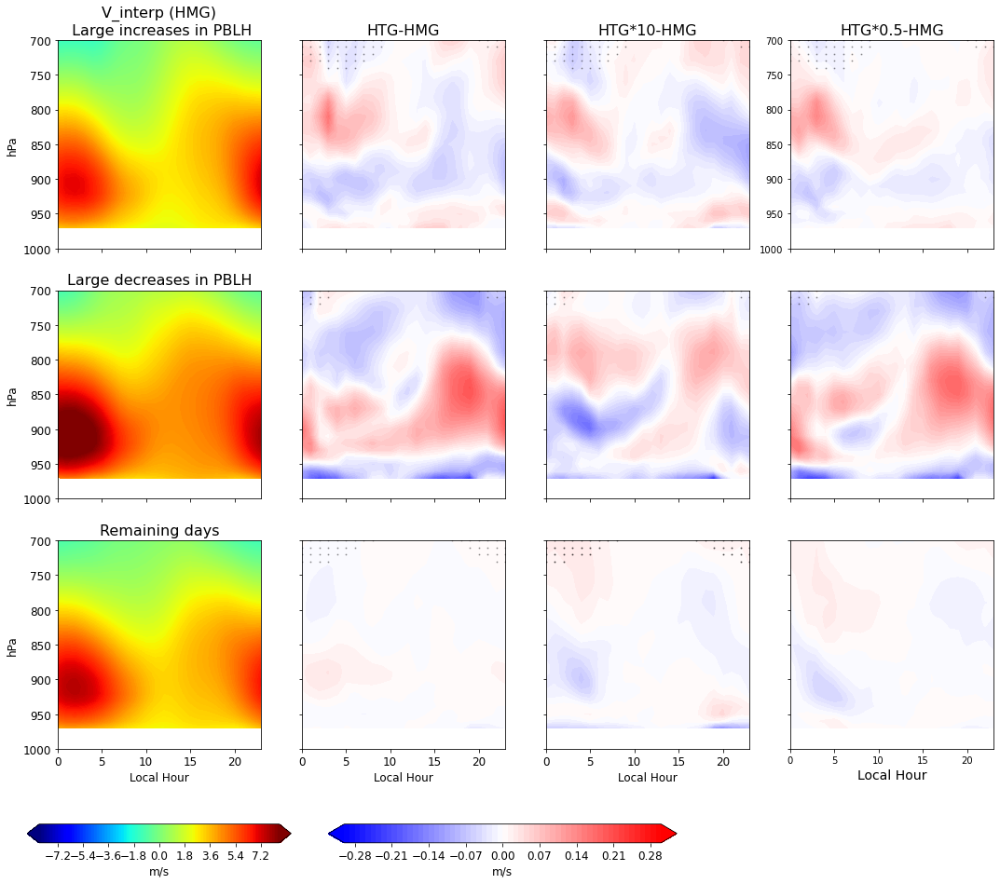

In [102]:
varSelPlot = 'V_interp'
levsDiff   = np.arange(-0.3, 0.31, 0.01)
levsRaw    = np.arange(-8.5,8.6,0.1)
# levsRaw    = np.arange(-3,15,0.02)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700, # Highest level to plot to
                                                               'jet') #cmap to use for raw values


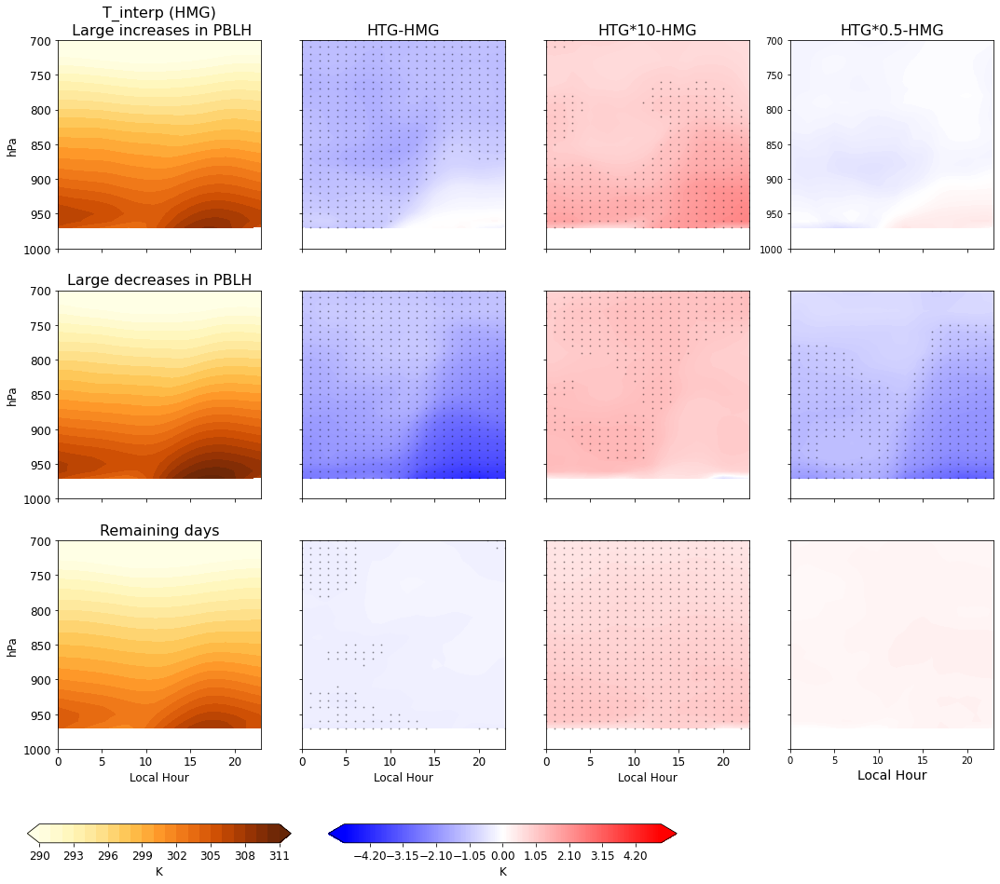

In [103]:
# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(highPctDS, lowPctDS, restOfDaysDS,
#                                                                    sfcString, varSelPlot,
#                                                                    levsRaw, levsDiff, maxLev)
        
levsRaw  = np.arange(290,312,1)
# levsDiff = np.arange(-3.0,3.05,0.05)
levsDiff = np.arange(-5.0,5.05,0.05)
varSelPlot = 'T_interp'

plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,     
                                                               levsDiff,  
                                                               700, 
                                                               'YlOrBr')   

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,     
#                                                                levsDiff,  
#                                                                700)   


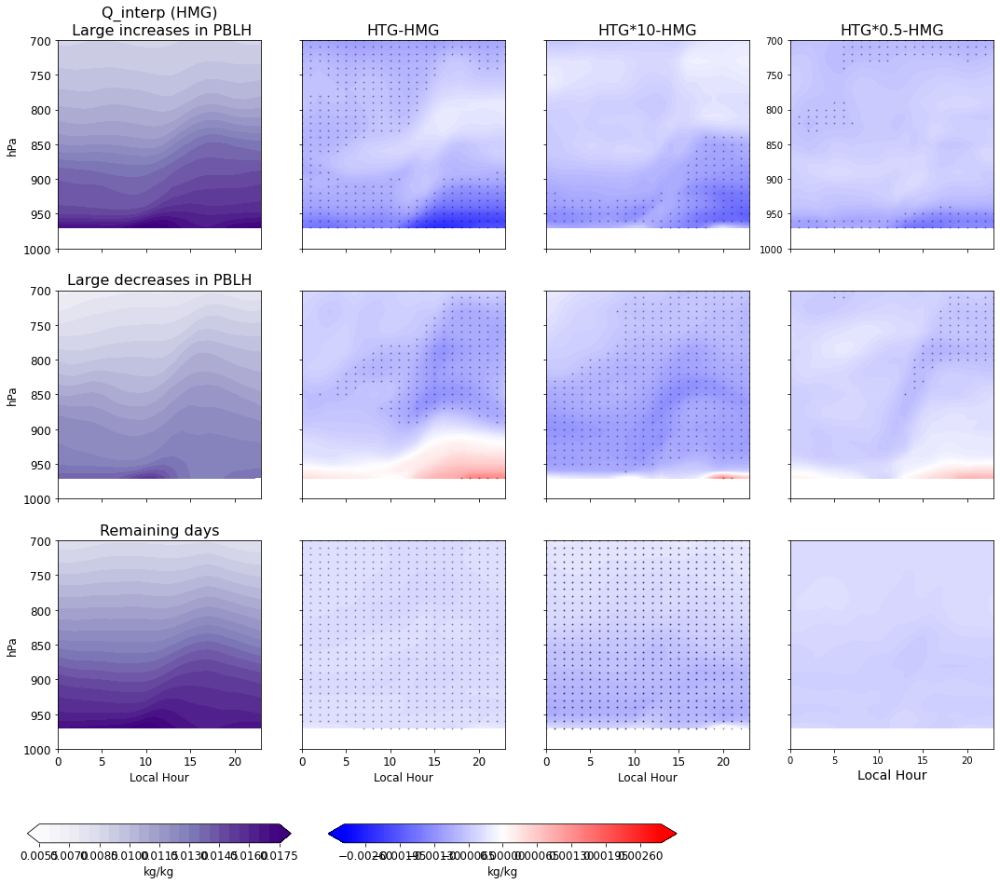

In [104]:
# levsDiff = np.arange(-2e-3, 2.05e-3, 0.05e-3)
levsDiff = np.arange(-3e-3, 3.05e-3, 0.05e-3)
levsRaw  = np.arange(0.0055, 0.018, 0.0005)
varSelPlot = 'Q_interp'

plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,
                                                               'Purples') 

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,     
#                                                                levsDiff,  
#                                                                700)    

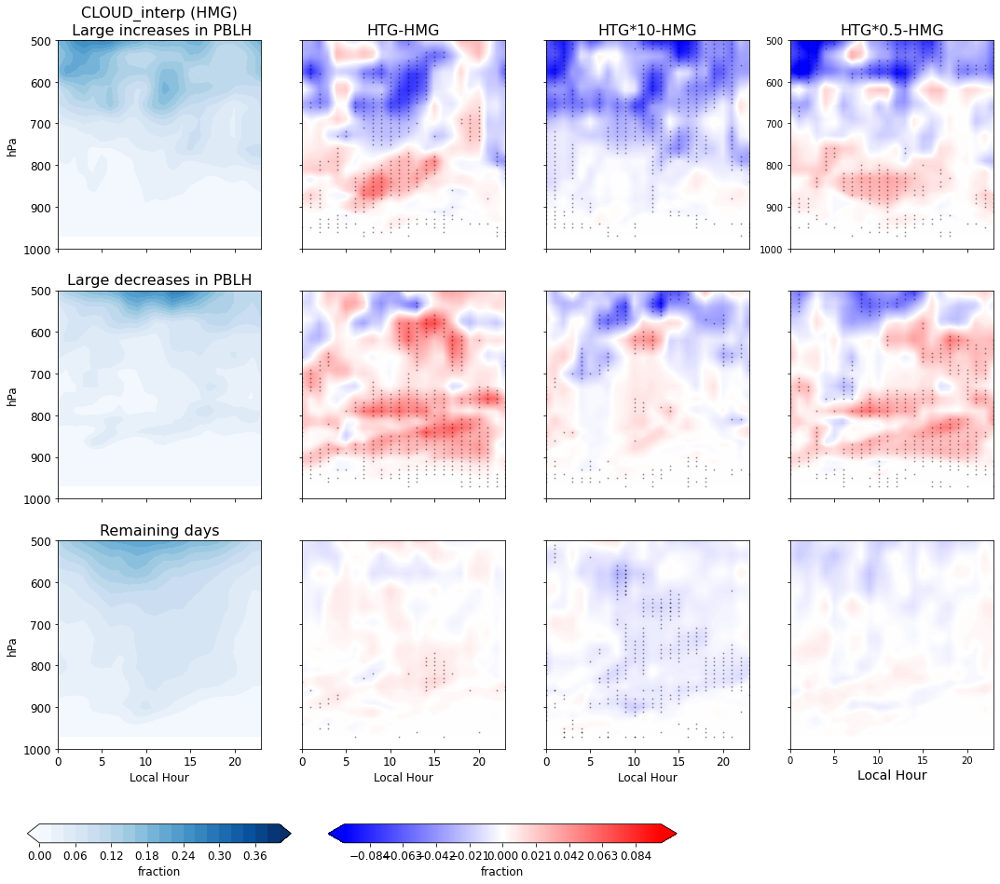

In [105]:
levsDiff = np.arange(-0.1,0.101,0.001)
levsRaw  = np.arange(0,0.42,0.02)
varSelPlot = 'CLOUD_interp'

plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               500, # Highest level to plot to
                                                               'Blues')



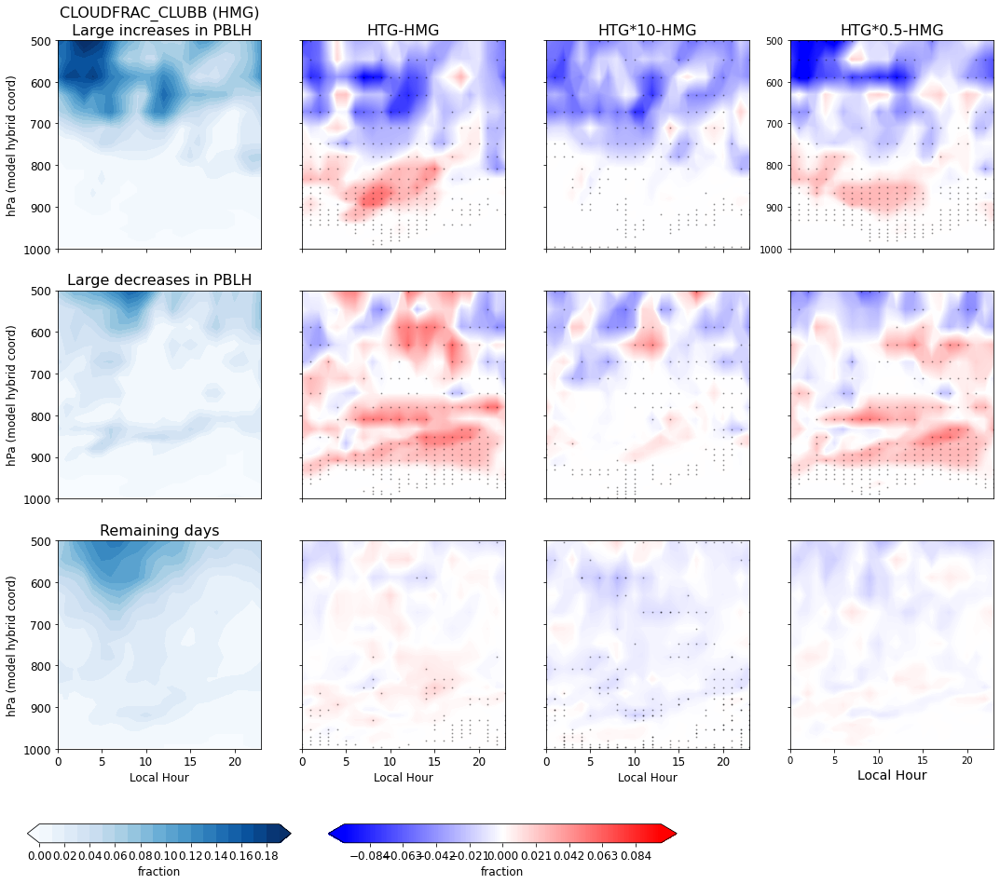

In [106]:
levsDiff = np.arange(-0.1,0.101,0.001)
levsRaw  = np.arange(0,0.2,0.01)

plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               'CLOUDFRAC_CLUBB',
                                                               levsRaw,
                                                               levsDiff,
                                                               500, # Highest level to plot to
                                                              'Blues')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                'CLOUDFRAC_CLUBB',
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                200) # Highest level to plot to


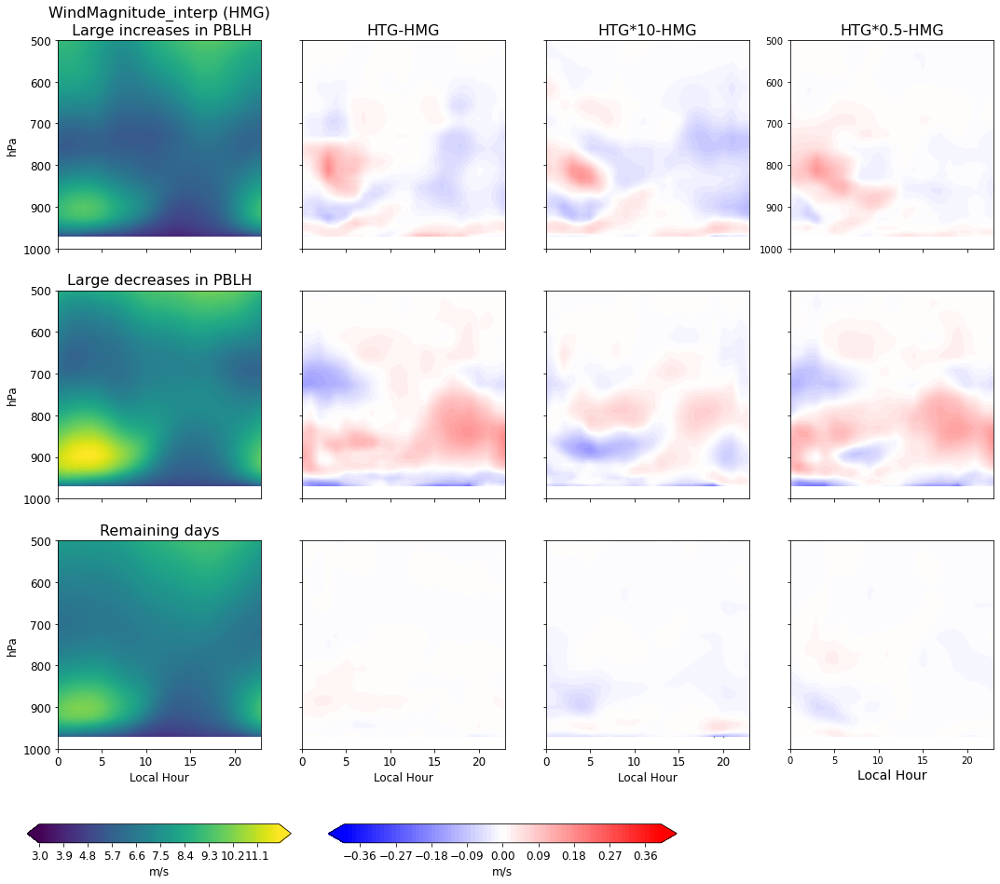

In [107]:
levsDiff = np.arange(-0.4,0.41,0.01)
levsRaw  = np.arange(3,12,0.1)
varSelPlot = 'WindMagnitude_interp'

    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               500,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                400) # Highest level to plot to



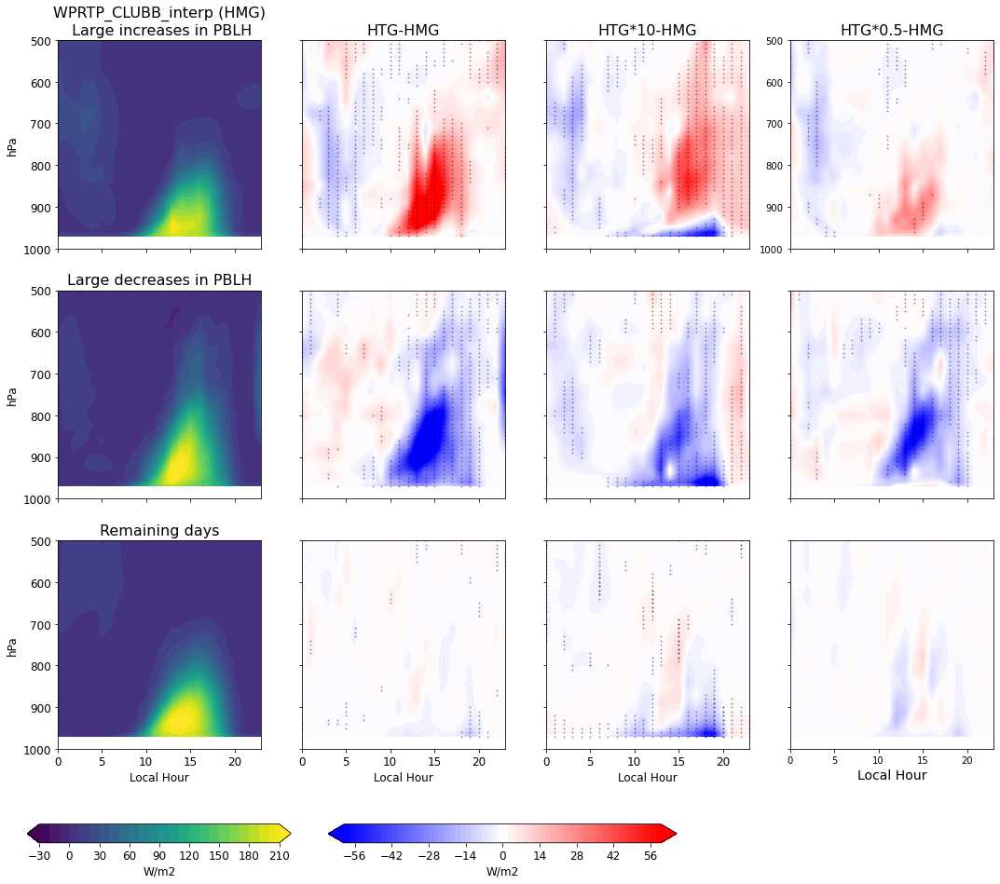

In [108]:
levsDiff = np.arange(-60,62,2)
levsRaw  = np.arange(-30,220,10)
varSelPlot = 'WPRTP_CLUBB_interp'
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               500,  # Highest level to plot to
                                                               'viridis')


# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                500) # Highest level to plot to


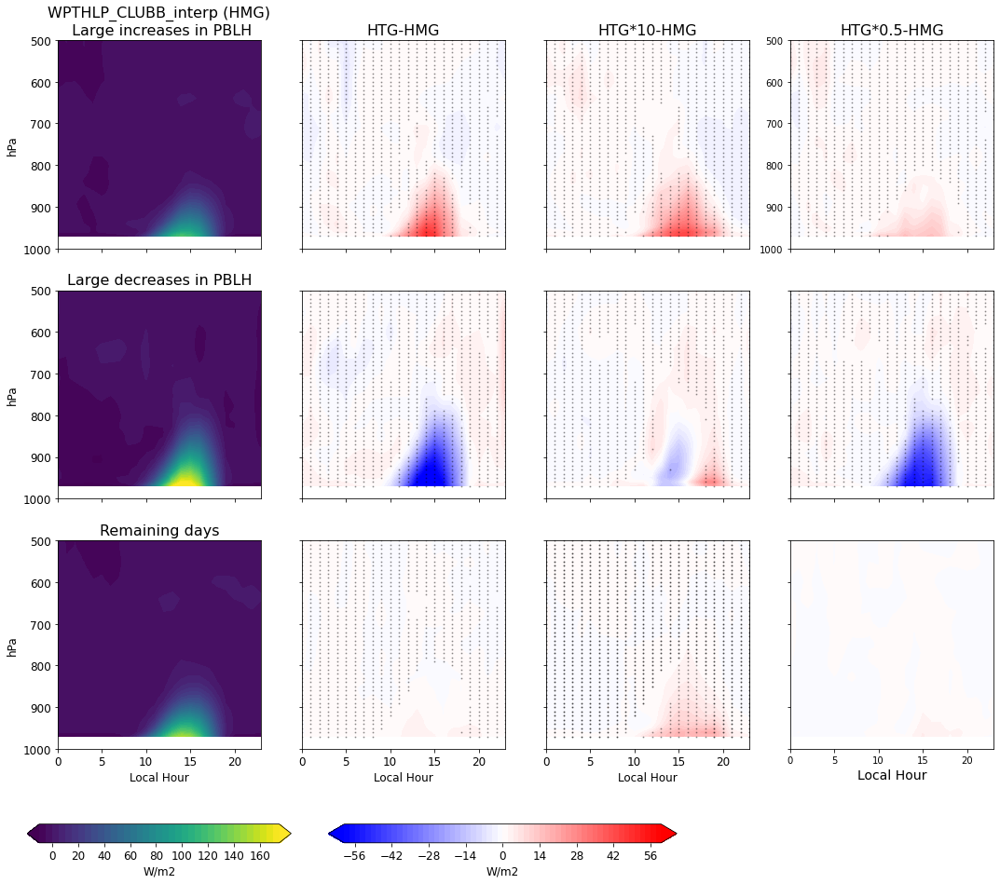

In [109]:
varSelPlot = 'WPTHLP_CLUBB_interp'
levsDiff = np.arange(-60,62,2)
levsRaw  = np.arange(-10,180,5)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               500,  # Highest level to plot to
                                                               'viridis')


# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                500) # Highest level to plot to



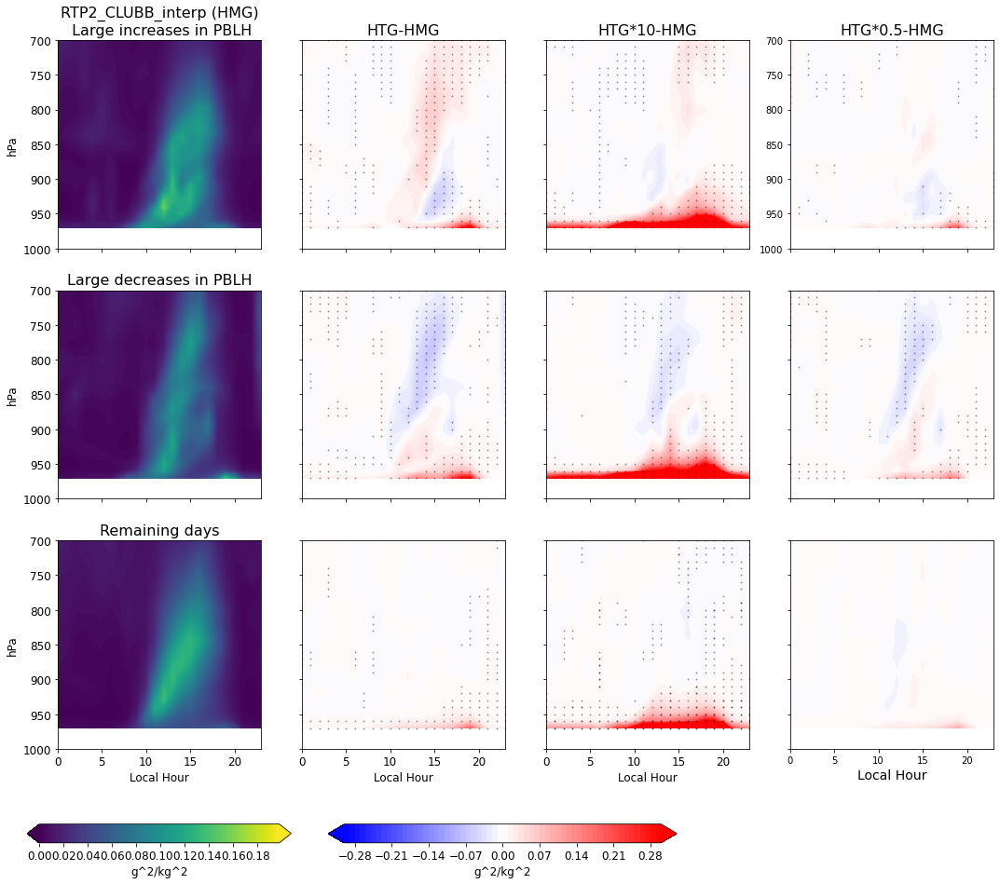

In [110]:
varSelPlot = 'RTP2_CLUBB_interp'
levsDiff   = np.arange(-0.30, 0.31, 0.01)
levsRaw    = np.arange(0,0.2,0.002)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to



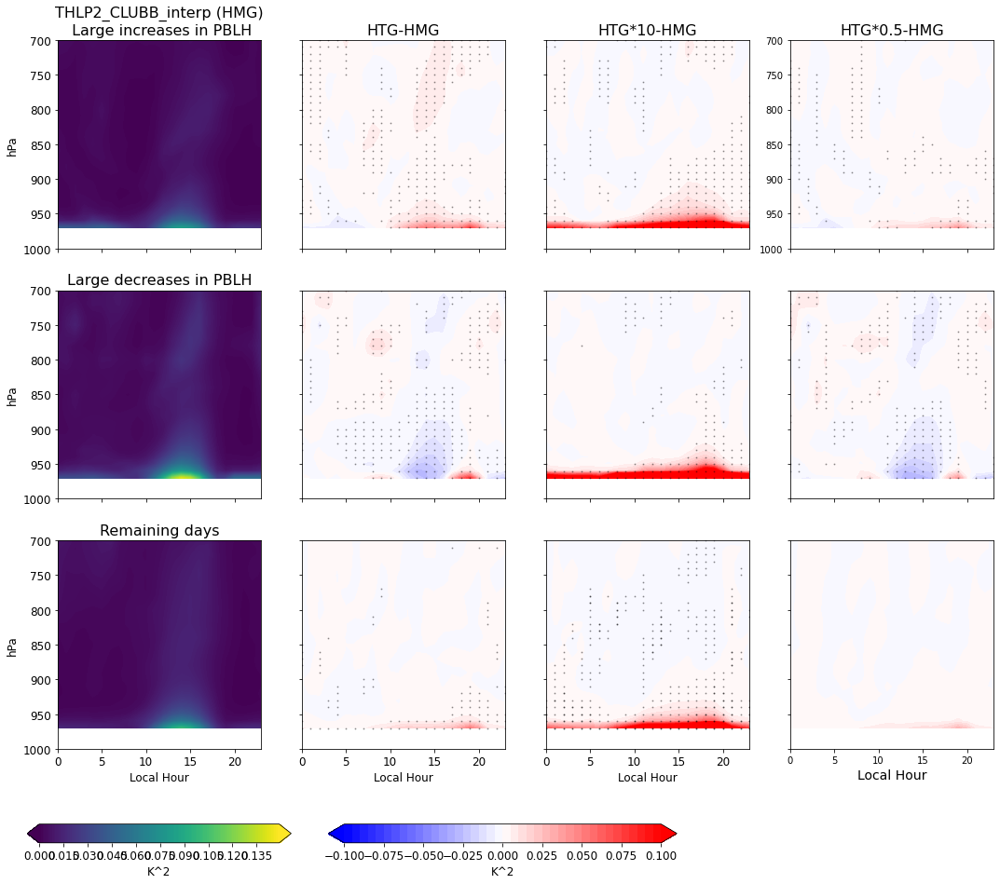

In [111]:
varSelPlot = 'THLP2_CLUBB_interp'
levsDiff   = np.arange(-0.10, 0.105, 0.005)
levsRaw    = np.arange(0,0.15,0.001)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to



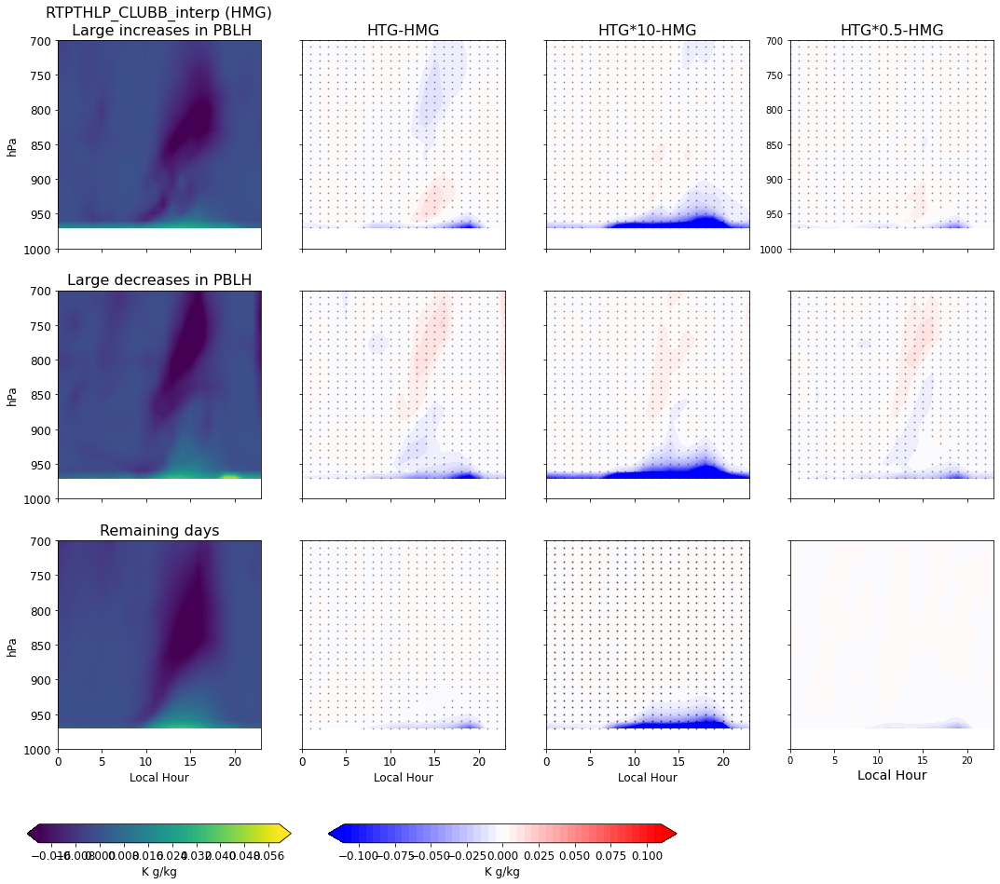

In [112]:
varSelPlot = 'RTPTHLP_CLUBB_interp'
levsDiff   = np.arange(-0.11, 0.115, 0.005)
levsRaw    = np.arange(-0.02,0.06,0.0005)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   

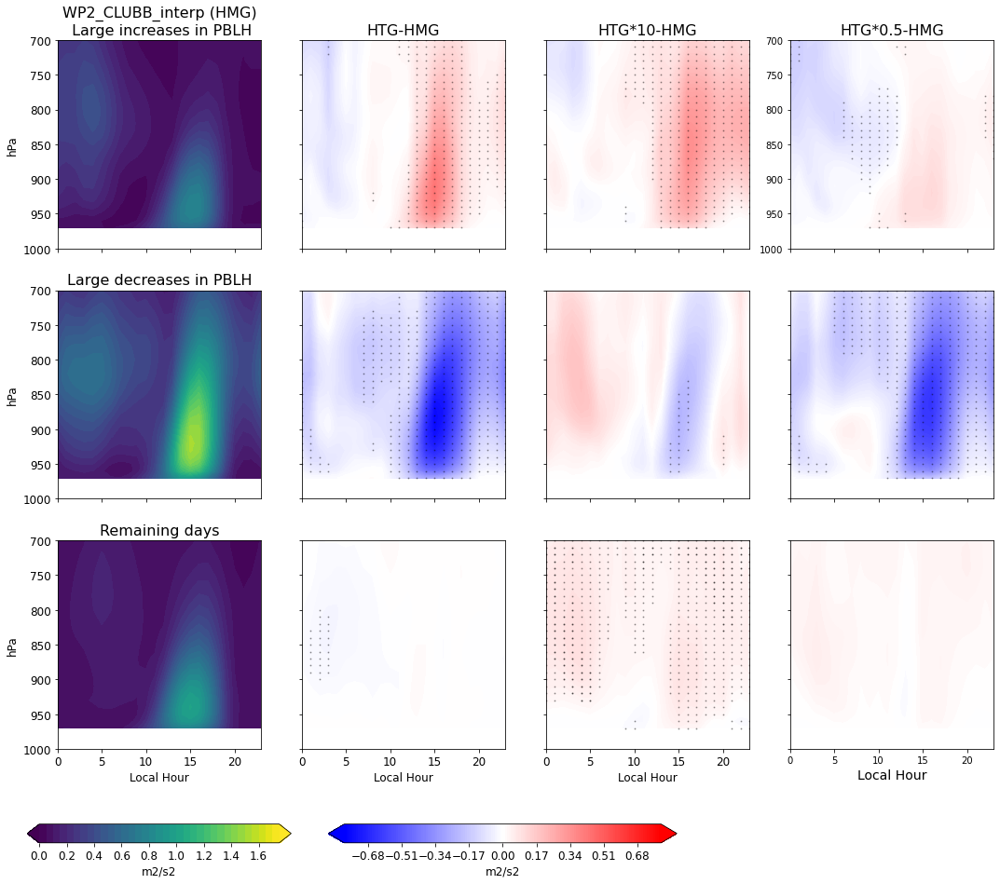

In [113]:
varSelPlot = 'WP2_CLUBB_interp'
levsDiff   = np.arange(-0.8, 0.81, 0.01)
levsRaw    = np.arange(0,1.8,0.05)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   

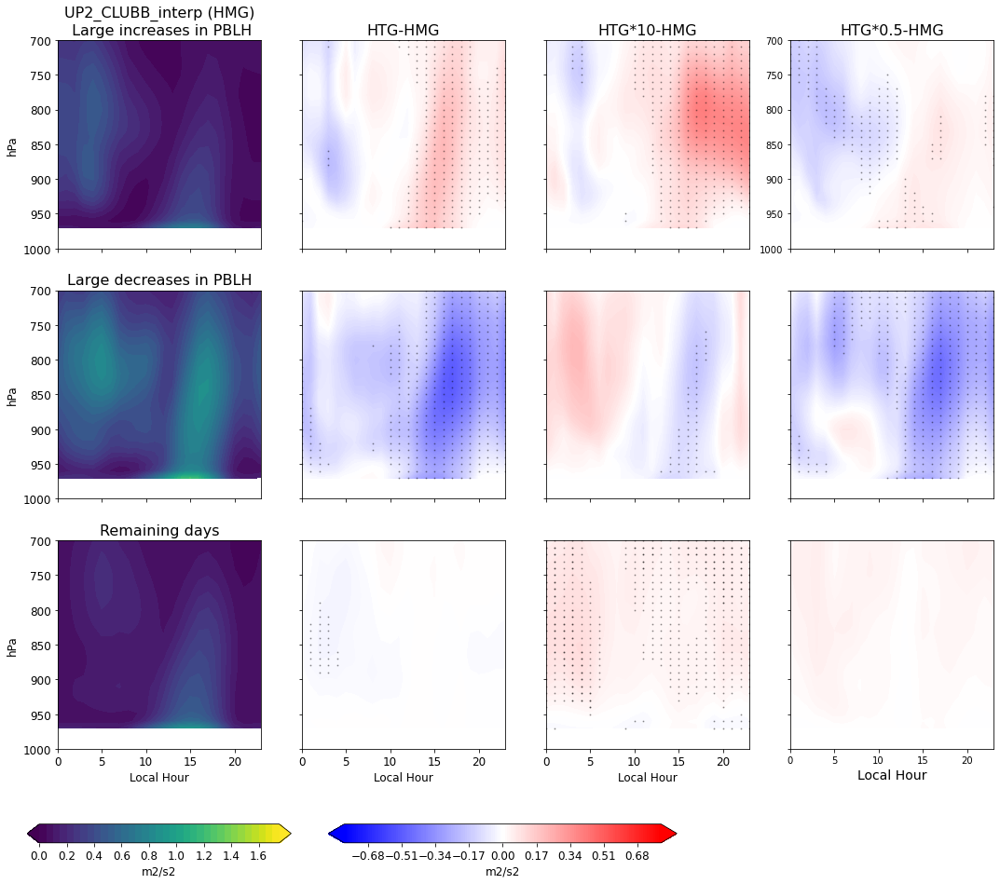

In [114]:
varSelPlot = 'UP2_CLUBB_interp'
levsDiff   = np.arange(-0.8, 0.81, 0.01)
levsRaw    = np.arange(0,1.8,0.05)

plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   

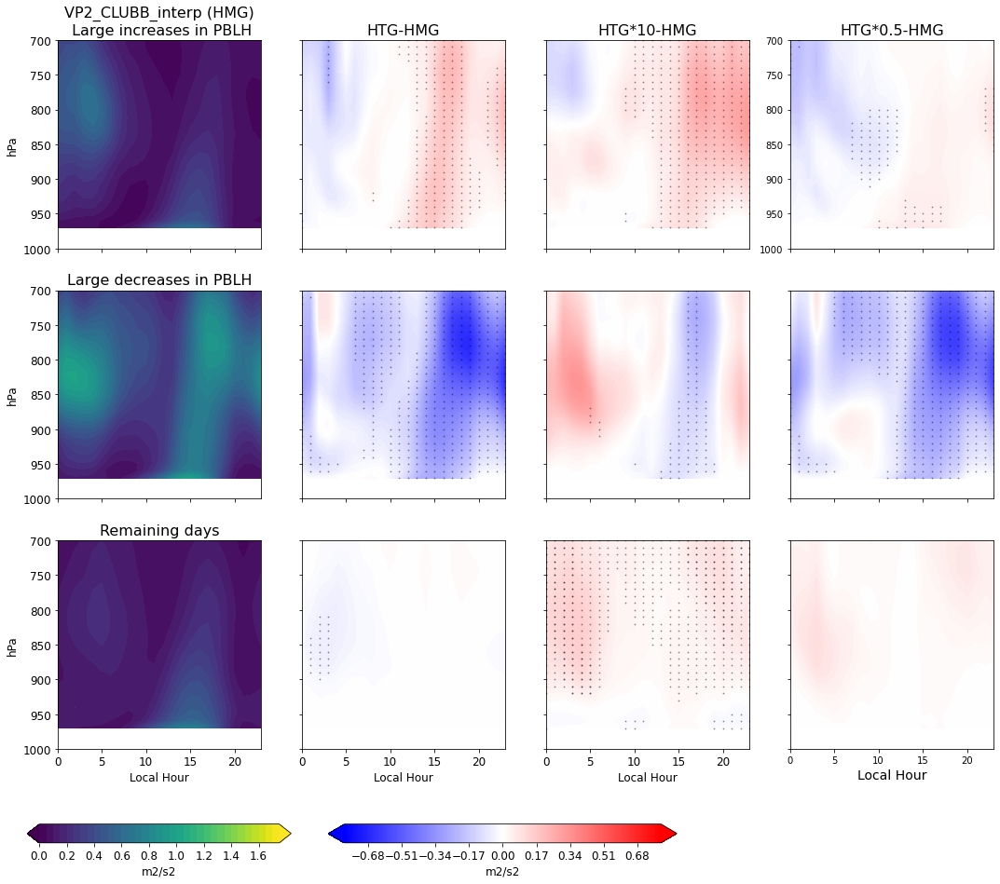

In [115]:
varSelPlot = 'VP2_CLUBB_interp'
levsDiff   = np.arange(-0.8, 0.81, 0.01)
levsRaw    = np.arange(0,1.8,0.05)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   

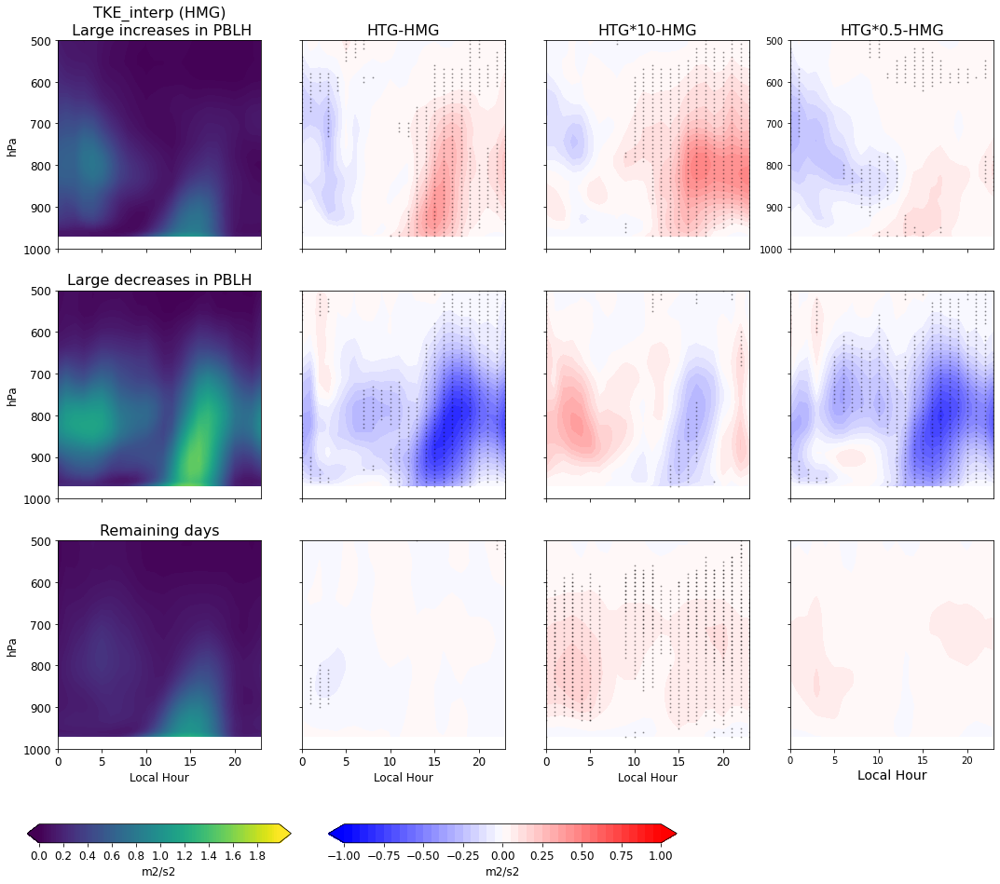

In [116]:
varSelPlot = 'TKE_interp'
levsDiff   = np.arange(-1.0, 1.05, 0.05)
levsRaw    = np.arange(0,2.0,0.02)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               500,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                500) # Highest level to plot to   



In [117]:
realSfc_allCases['RVMTEND_CLUBB_interp'].long_name

'Water vapor tendency'

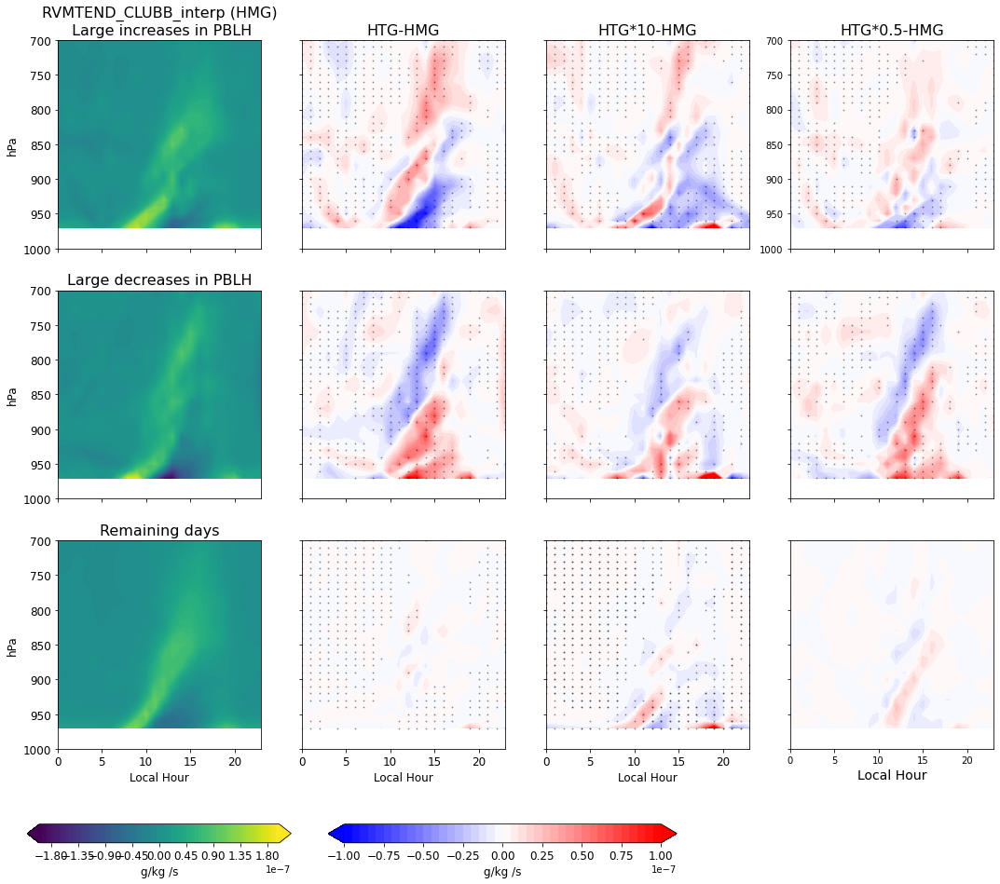

In [118]:
varSelPlot = 'RVMTEND_CLUBB_interp'
levsDiff   = np.arange(-1e-7, 1.05e-7, 0.05e-7)
levsRaw    = np.arange(-2e-7, 2.05e-7, 0.05e-7)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   



In [119]:
realSfc_allCases['STEND_CLUBB_interp'].long_name

'Static energy tendency'

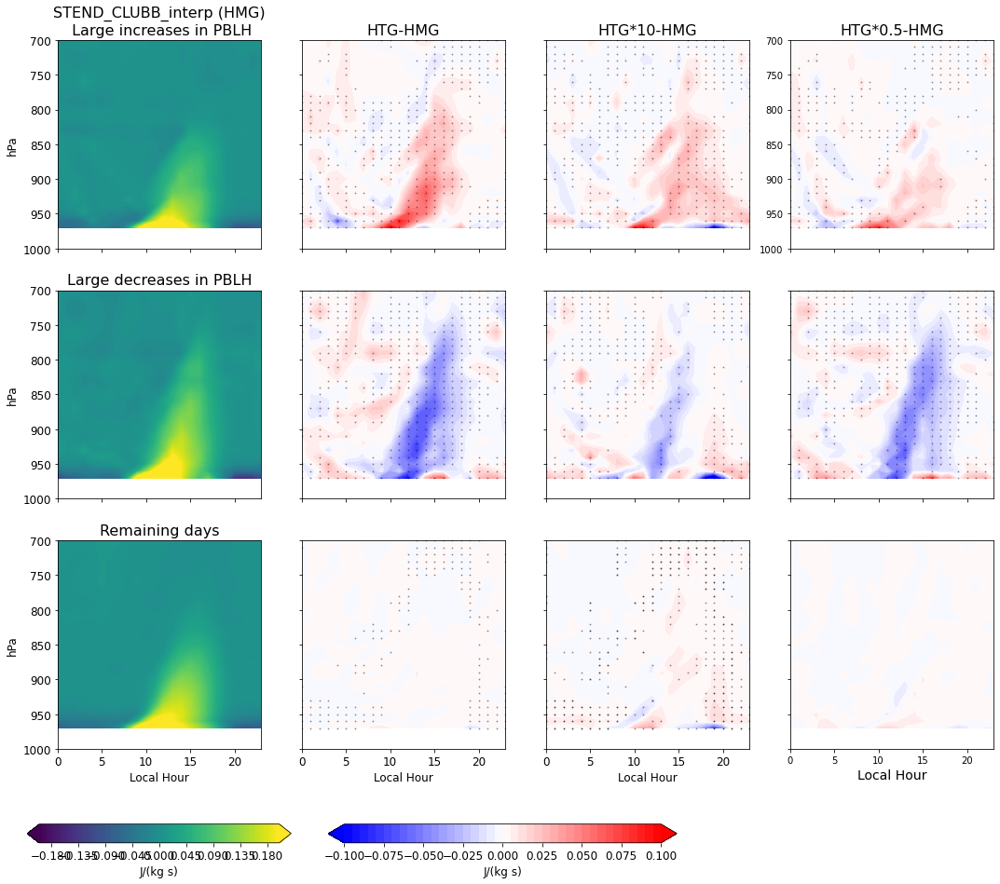

In [120]:
varSelPlot = 'STEND_CLUBB_interp'
levsDiff   = np.arange(-1e-1, 1.05e-1, 0.05e-1)
levsRaw    = np.arange(-2e-1, 2.05e-1, 0.05e-1)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'viridis')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   



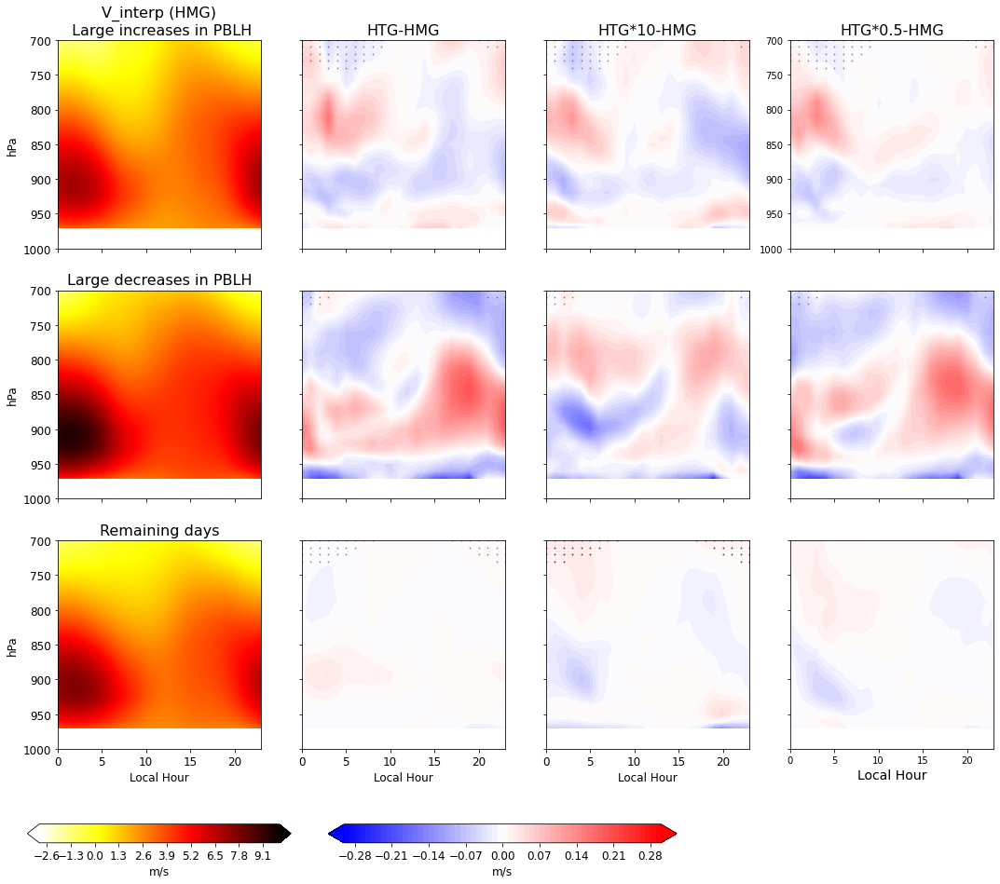

In [121]:
varSelPlot = 'V_interp'
levsDiff   = np.arange(-0.3, 0.31, 0.01)
levsRaw    = np.arange(-3,10,0.02)
# levsRaw    = np.arange(-3,15,0.02)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'hot_r')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to  


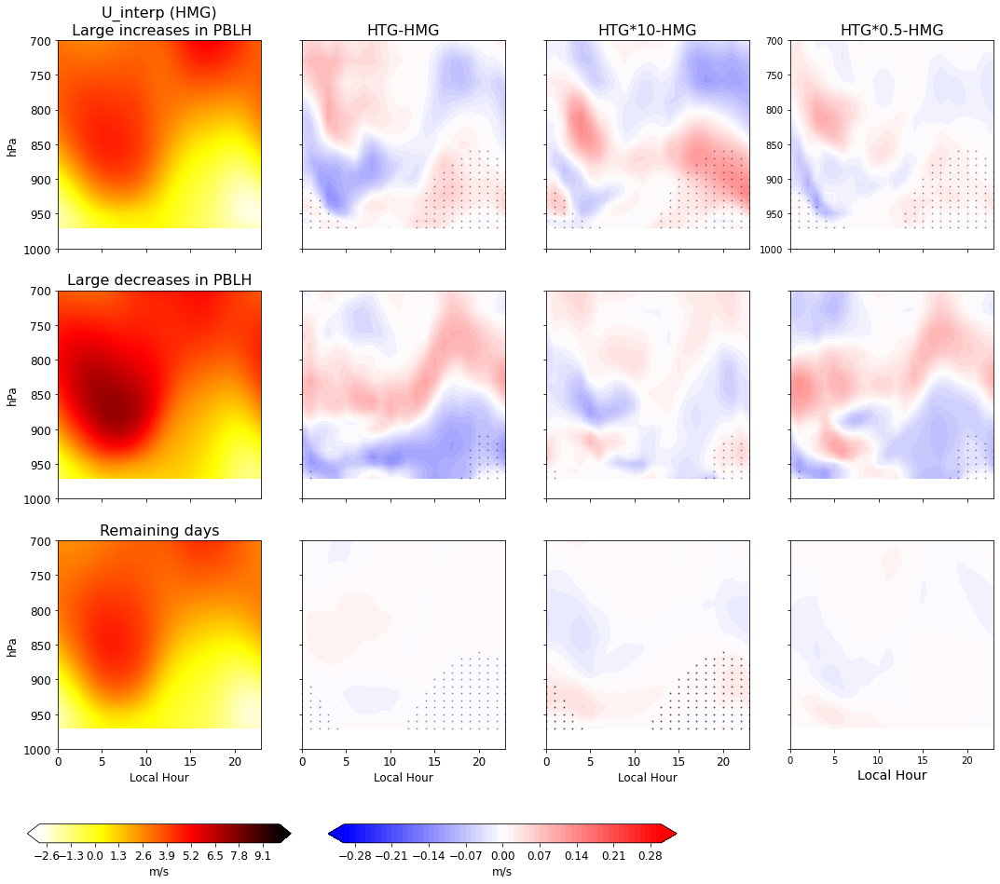

In [122]:
varSelPlot = 'U_interp'
levsDiff   = np.arange(-0.3, 0.31, 0.01)
levsRaw    = np.arange(-3,10,0.02)
    
plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_realSfc, 
                                                               hourlyMean_lowPct_realSfc, 
                                                               hourlyMean_restOfDays_realSfc,
                                                               'realSfc', 
                                                               varSelPlot,
                                                               levsRaw,
                                                               levsDiff,
                                                               700,  # Highest level to plot to
                                                               'hot_r')

# plotTimeHeightDifference_meanDiurnalCycle_contourfCondense_Dry(hourlyMean_highPct_artSfc, 
#                                                                hourlyMean_lowPct_artSfc, 
#                                                                hourlyMean_restOfDays_artSfc,
#                                                                'artificialSfc', 
#                                                                varSelPlot,
#                                                                levsRaw,
#                                                                levsDiff,
#                                                                700) # Highest level to plot to   

## Mean profiles averaged over some hours?

In [125]:
'''
Give this plotting routine the hourly mean DS' of high/low percentile filtering
'''

def plotProfiles_meanOverHours(highPctDS, lowPctDS, restOfDaysDS,
                               varSelPlot,
                               startHr,endHr,
                               xMin, xMax, maxLev):
    
    caseNames = np.asarray(['HMG','HTG','HTG*10','HTG*0.5'])
    colorList = np.asarray(['orange','violet','purple','green'])

    ## Select which levels array to use
    if np.shape(highPctDS[varSelPlot].values)[2]==len(highPctDS.ilev.values):
        levSel = 'ilev'
    elif np.shape(highPctDS[varSelPlot].values)[2]==len(highPctDS.lev.values):
        levSel = 'lev'
    elif np.shape(highPctDS[varSelPlot].values)[2]==len(highPctDS.levInterp.values):
        levSel = 'levInterp'
        
        
    ## First, get means (& std) over the selected hours 
    iTimeSel_high = np.where((highPctDS["time.hour"].values>=startHr) & 
                             (highPctDS["time.hour"].values<=endHr))[0]
    iTimeSel_low  = np.where((lowPctDS["time.hour"].values>=startHr) & 
                             (lowPctDS["time.hour"].values<=endHr))[0]
    iTimeSel_rest = np.where((restOfDaysDS["time.hour"].values>=startHr) & 
                             (restOfDaysDS["time.hour"].values<=endHr))[0]
    
    
    hourlyMean_highTimeSel   = highPctDS.isel(time=iTimeSel_high).mean(dim='time')
    hourlyMean_lowTimeSel    = lowPctDS.isel(time=iTimeSel_low).mean(dim='time')
    hourlyMean_restTimeSel   = restOfDaysDS.isel(time=iTimeSel_rest).mean(dim='time')
    
    hourlyStd_highTimeSel   = highPctDS.isel(time=iTimeSel_high).std(dim='time')
    hourlyStd_lowTimeSel    = lowPctDS.isel(time=iTimeSel_low).std(dim='time')
    hourlyStd_restTimeSel   = restOfDaysDS.isel(time=iTimeSel_rest).std(dim='time')
    
    
    # Select the requested variable
    HMGvar_high   = np.squeeze(hourlyMean_highTimeSel.isel(case=np.where(hourlyMean_highTimeSel.case == 'HMG')[0])[varSelPlot].values)
    HMGvar_low    = np.squeeze(hourlyMean_lowTimeSel.isel(case=np.where(hourlyMean_lowTimeSel.case   == 'HMG')[0])[varSelPlot].values)
    HMGvar_rest   = np.squeeze(hourlyMean_restTimeSel.isel(case=np.where(hourlyMean_restTimeSel.case  == 'HMG')[0])[varSelPlot].values)

    HTGvar_high   = np.squeeze(hourlyMean_highTimeSel.isel(case=np.where(hourlyMean_highTimeSel.case == 'HTG')[0])[varSelPlot].values)
    HTGvar_low    = np.squeeze(hourlyMean_lowTimeSel.isel(case=np.where(hourlyMean_lowTimeSel.case   == 'HTG')[0])[varSelPlot].values)
    HTGvar_rest   = np.squeeze(hourlyMean_restTimeSel.isel(case=np.where(hourlyMean_restTimeSel.case == 'HTG')[0])[varSelPlot].values)

    HTG10var_high   = np.squeeze(hourlyMean_highTimeSel.isel(case=np.where(hourlyMean_highTimeSel.case == 'HTG10')[0])[varSelPlot].values)
    HTG10var_low    = np.squeeze(hourlyMean_lowTimeSel.isel(case=np.where(hourlyMean_lowTimeSel.case   == 'HTG10')[0])[varSelPlot].values)
    HTG10var_rest   = np.squeeze(hourlyMean_restTimeSel.isel(case=np.where(hourlyMean_restTimeSel.case == 'HTG10')[0])[varSelPlot].values)

    HTGp5var_high   = np.squeeze(hourlyMean_highTimeSel.isel(case=np.where(hourlyMean_highTimeSel.case == 'HTGp5')[0])[varSelPlot].values)
    HTGp5var_low    = np.squeeze(hourlyMean_lowTimeSel.isel(case=np.where(hourlyMean_lowTimeSel.case   == 'HTGp5')[0])[varSelPlot].values)
    HTGp5var_rest   = np.squeeze(hourlyMean_restTimeSel.isel(case=np.where(hourlyMean_restTimeSel.case == 'HTGp5')[0])[varSelPlot].values)

    
    # Also get the std of that variable... 
    HMGvarStd_high   = np.squeeze(hourlyStd_highTimeSel.isel(case=np.where(hourlyStd_highTimeSel.case == 'HMG')[0])[varSelPlot].values)
    HMGvarStd_low    = np.squeeze(hourlyStd_lowTimeSel.isel(case=np.where(hourlyStd_lowTimeSel.case   == 'HMG')[0])[varSelPlot].values)
    HMGvarStd_rest   = np.squeeze(hourlyStd_restTimeSel.isel(case=np.where(hourlyStd_restTimeSel.case  == 'HMG')[0])[varSelPlot].values)

    HTGvarStd_high   = np.squeeze(hourlyStd_highTimeSel.isel(case=np.where(hourlyStd_highTimeSel.case == 'HTG')[0])[varSelPlot].values)
    HTGvarStd_low    = np.squeeze(hourlyStd_lowTimeSel.isel(case=np.where(hourlyStd_lowTimeSel.case   == 'HTG')[0])[varSelPlot].values)
    HTGvarStd_rest   = np.squeeze(hourlyStd_restTimeSel.isel(case=np.where(hourlyStd_restTimeSel.case == 'HTG')[0])[varSelPlot].values)

    HTG10varStd_high   = np.squeeze(hourlyStd_highTimeSel.isel(case=np.where(hourlyStd_highTimeSel.case == 'HTG10')[0])[varSelPlot].values)
    HTG10varStd_low    = np.squeeze(hourlyStd_lowTimeSel.isel(case=np.where(hourlyStd_lowTimeSel.case   == 'HTG10')[0])[varSelPlot].values)
    HTG10varStd_rest   = np.squeeze(hourlyStd_restTimeSel.isel(case=np.where(hourlyStd_restTimeSel.case == 'HTG10')[0])[varSelPlot].values)
    
    HTGp5varStd_high   = np.squeeze(hourlyStd_highTimeSel.isel(case=np.where(hourlyStd_highTimeSel.case == 'HTGp5')[0])[varSelPlot].values)
    HTGp5varStd_low    = np.squeeze(hourlyStd_lowTimeSel.isel(case=np.where(hourlyStd_lowTimeSel.case   == 'HTGp5')[0])[varSelPlot].values)
    HTGp5varStd_rest   = np.squeeze(hourlyStd_restTimeSel.isel(case=np.where(hourlyStd_restTimeSel.case == 'HTGp5')[0])[varSelPlot].values)

    

    ## Set up figure
    fig,axs = plt.subplots(1,3, figsize=(15,5))
    axs     = axs.ravel()
    fig.subplots_adjust(hspace=0.2)

    atmLevs = highPctDS[levSel].values


    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    ## Plot profiles
    axs[0].errorbar(HMGvar_high,   atmLevs,
                    xerr=2*(HMGvarStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[0].errorbar(HTGvar_high,   atmLevs, 
                    xerr=2*(HTGvarStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[1], label=caseNames[1])
    axs[0].errorbar(HTG10var_high, atmLevs, 
                    xerr=2*(HTG10varStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[2], label=caseNames[2])
    axs[0].errorbar(HTGp5var_high, atmLevs, 
                    xerr=2*(HTGp5varStd_high/np.sqrt(len(iTimeSel_high))),
                    capsize=3, color=colorList[3], label=caseNames[3])
    axs[0].legend(fontsize=12)

    axs[1].errorbar(HMGvar_low,   atmLevs, 
                    xerr=2*(HMGvarStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[1].errorbar(HTGvar_low,   atmLevs,
                    xerr=2*(HTGvarStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[1], label=caseNames[1])
    axs[1].errorbar(HTG10var_low, atmLevs,
                    xerr=2*(HTG10varStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[2], label=caseNames[2])
    axs[1].errorbar(HTGp5var_low, atmLevs,
                    xerr=2*(HTGp5varStd_low/np.sqrt(len(iTimeSel_low))),
                    capsize=3, color=colorList[3], label=caseNames[3])

    axs[2].errorbar(HMGvar_rest,   atmLevs,
                    xerr=2*(HMGvarStd_rest/np.sqrt(len(iTimeSel_rest))),
                    capsize=3, color=colorList[0], label=caseNames[0])
    axs[2].errorbar(HTGvar_rest,   atmLevs, 
                    xerr=2*(HTGvarStd_rest/np.sqrt(len(iTimeSel_rest))),
                    capsize=3, color=colorList[1], label=caseNames[1])
    axs[2].errorbar(HTG10var_rest, atmLevs, 
                    xerr=2*(HTG10varStd_rest/np.sqrt(len(iTimeSel_rest))),
                    capsize=3, color=colorList[2], label=caseNames[2])
    axs[2].errorbar(HTGp5var_rest, atmLevs, 
                    xerr=2*(HTGp5varStd_rest/np.sqrt(len(iTimeSel_rest))),
                    capsize=3, color=colorList[3], label=caseNames[3])
   

    ## - - - - - - - - - - - - - - - - - - - - - - - - - - -
    # Other plot options
    axs[0].invert_yaxis()
    axs[1].invert_yaxis()
    axs[2].invert_yaxis()

    axs[0].set_ylim([980, maxLev])
    axs[1].set_ylim([980, maxLev])
    axs[2].set_ylim([980, maxLev])
    
    axs[0].set_xlim([xMin, xMax])
    axs[1].set_xlim([xMin, xMax])
    axs[2].set_xlim([xMin, xMax])
    
    axs[1].axes.yaxis.set_ticklabels([])
    axs[2].axes.yaxis.set_ticklabels([])   

    axs[0].set_title(varSelPlot+'\n Large increases in '+varSel, fontsize=16)       
    axs[1].set_title('Large decreases in '+varSel, fontsize=16)
    axs[2].set_title('Remaining days', fontsize=16)

    axs[0].set_xlabel(realSfc_allCases[varSelPlot].units, fontsize=12)
    axs[1].set_xlabel(realSfc_allCases[varSelPlot].units, fontsize=12)
    axs[2].set_xlabel(realSfc_allCases[varSelPlot].units, fontsize=12)
    
    if varSelPlot.endswith('_interp'):
        axs[0].set_ylabel('hPa', fontsize=12)
    else:
        axs[0].set_ylabel('hPa (model hybrid coord)', fontsize=12)

    axs[0].tick_params(axis='both', labelsize= 12)
    axs[1].tick_params(axis='both', labelsize= 12)
    axs[2].tick_params(axis='both', labelsize= 12)

    return

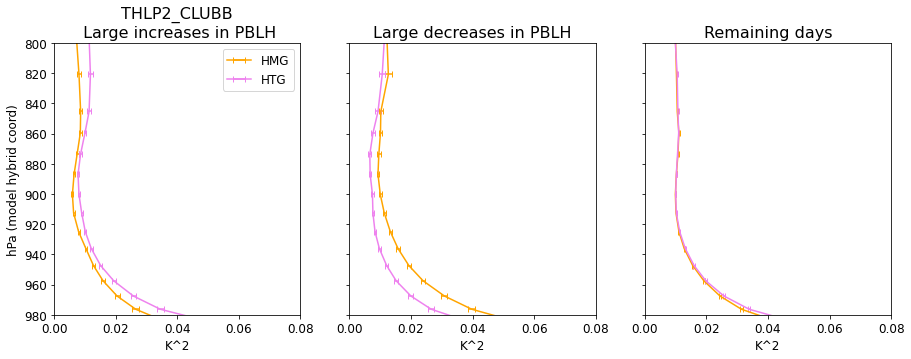

In [125]:
# plotProfiles_meanOverHours(highPct_realSfc, 
#                            lowPct_realSfc, 
#                            restOfDays_realSfc,
# #                           'THLP2_CLUBB_interp',
#                           'THLP2_CLUBB',
#                            12, 18,  # Start hr, end hr
#                            0,       # Min x value
#                            0.08,     # Max x value
#                            800)     # Max level 

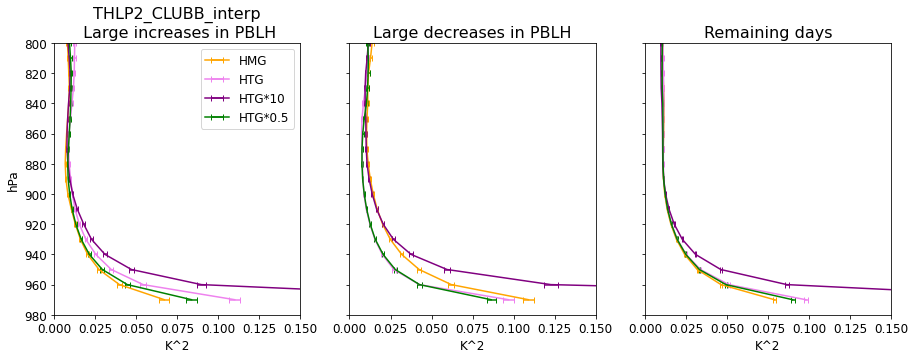

In [126]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'THLP2_CLUBB_interp',
                           12, 17,  # Start hr, end hr
                           0,       # Min x value
                           0.15,     # Max x value
                           800)     # Max level 


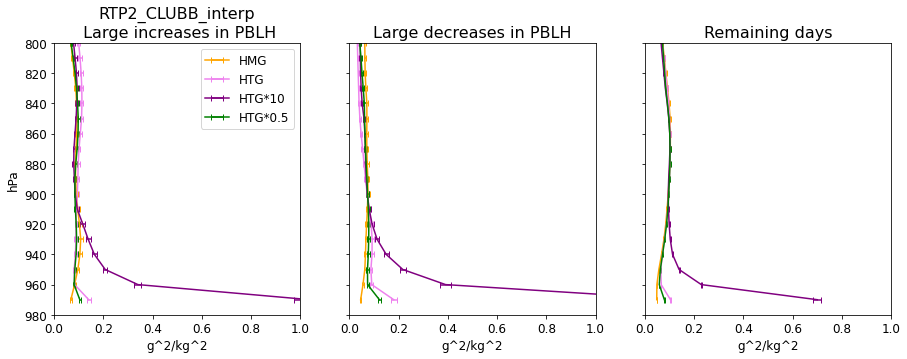

In [127]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'RTP2_CLUBB_interp',
                           12, 17,  # Start hr, end hr
                           0,       # Min x value
#                            2.0,    # Max x value
                           1.0,     # Max x value
                           800)     # Max level 


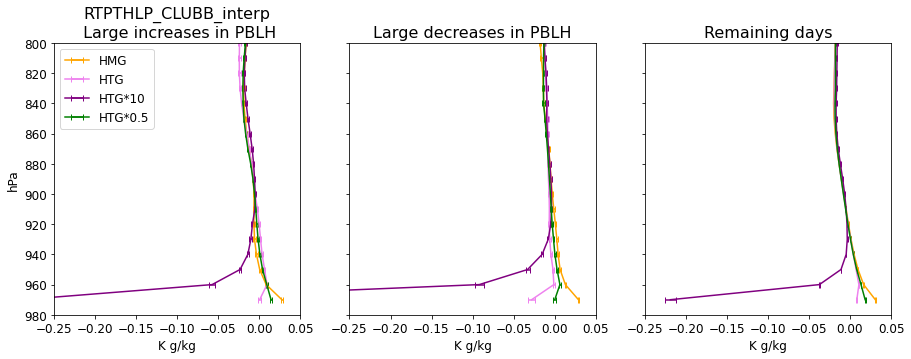

In [128]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'RTPTHLP_CLUBB_interp',
                           12, 17,  # Start hr, end hr
                           -0.25,       # Min x value
                           0.05,     # Max x value
                           800)     # Max level 


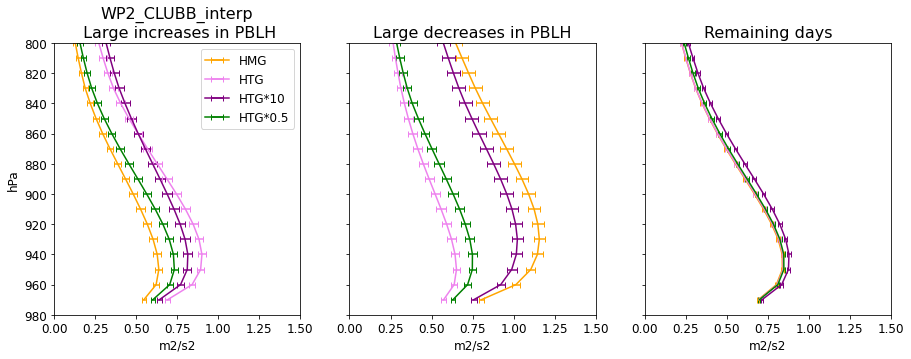

In [129]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'WP2_CLUBB_interp',
                           12, 17,  # Start hr, end hr
                           0,       # Min x value
#                            2.0,     # Max x value
                           1.5,     # Max x value
                           800)     # Max level


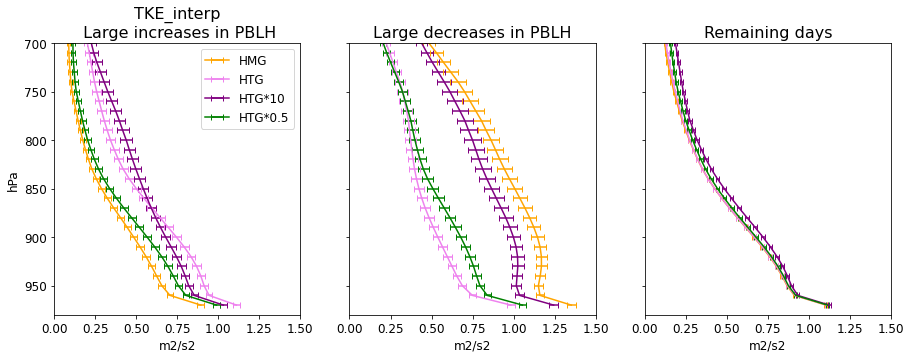

In [130]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'TKE_interp',
                           12, 17,  # Start hr, end hr
                           0,       # Min x value
                           1.5,     # Max x value
                           700)     # Max level 

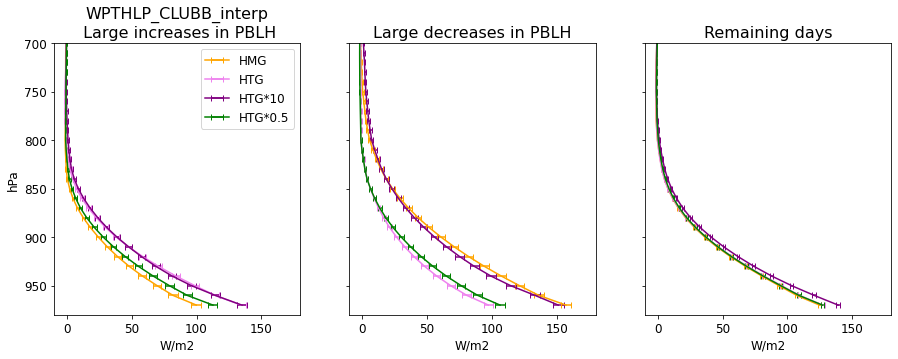

In [131]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'WPTHLP_CLUBB_interp',
                           12, 17,  # Start hr, end hr
                           -10,       # Min x value
                           180,     # Max x value
                           700)     # Max level 


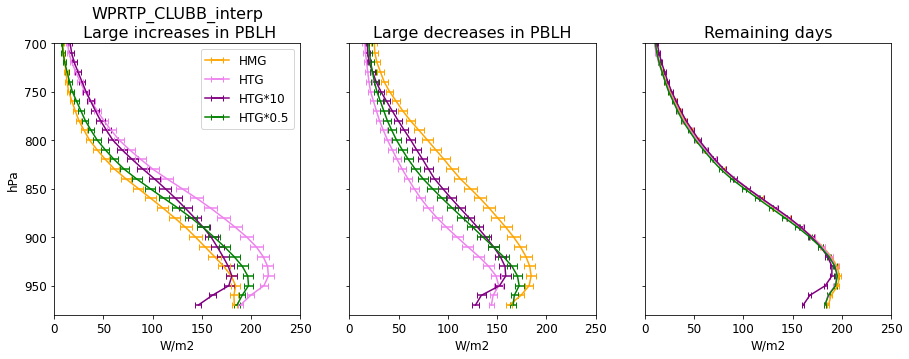

In [132]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'WPRTP_CLUBB_interp',
                           12, 17,  # Start hr, end hr
                           0,       # Min x value
                           250,     # Max x value
                           700)     # Max level 


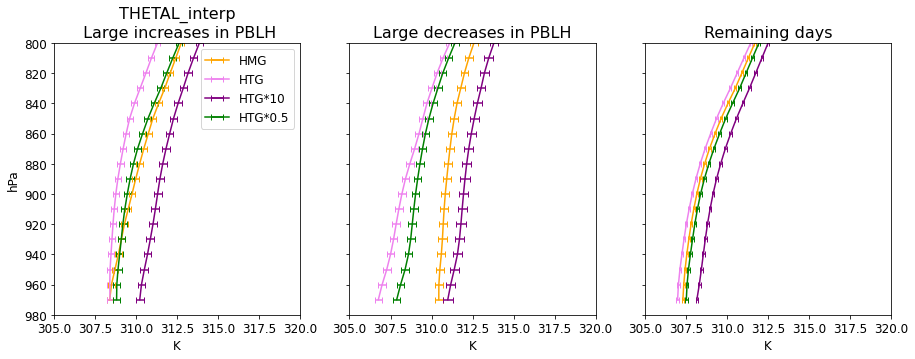

In [133]:
plotProfiles_meanOverHours(highPct_realSfc, 
                           lowPct_realSfc, 
                           restOfDays_realSfc,
                          'THETAL_interp',
                           12, 17,  # Start hr, end hr
                           305,       # Min x value
                           320,     # Max x value
                           800)     # Max level 


## Skew-T

In [231]:
print(varSel)

PBLH


In [237]:
# Select the hour of interest (since it's 0-23, this is just what we set iHour to and select that)
iHour = 15
iCase = 1

selHour_highPct_realSfc    = hourlyMean_highPct_realSfc.isel(hour=iHour, case=iCase)
selHour_lowPct_realSfc     = hourlyMean_lowPct_realSfc.isel(hour=iHour, case=iCase)
selHour_restOfDays_realSfc = hourlyMean_restOfDays_realSfc.isel(hour=iHour, case=iCase)


In [238]:
## Need to get dewpoint 

# First: assume Q (specific humidity) is roughly the mixing ratio 
mixing_highReal = selHour_highPct_realSfc.Q_interp.values     * units(realSfc_allCases.Q.units)
mixing_lowReal  = selHour_lowPct_realSfc.Q_interp.values      * units(realSfc_allCases.Q.units)
mixing_restReal = selHour_restOfDays_realSfc.Q_interp.values  * units(realSfc_allCases.Q.units)

# Calculate the vapor pressure at each level
vapPres_highReal = mpc.vapor_pressure(realSfc_allCases.levInterp.values * units.hPa, np.squeeze(mixing_highReal) )
vapPres_lowReal  = mpc.vapor_pressure(realSfc_allCases.levInterp.values * units.hPa, np.squeeze(mixing_lowReal)  )
vapPres_restReal = mpc.vapor_pressure(realSfc_allCases.levInterp.values * units.hPa, np.squeeze(mixing_restReal) )

# Now we can get the dewpoint
dewpoint_highReal = mpc.dewpoint(vapPres_highReal)
dewpoint_lowReal  = mpc.dewpoint(vapPres_lowReal)
dewpoint_restReal = mpc.dewpoint(vapPres_restReal)


LFC pressure - LCL pressure =  -157.22970819460795 hectopascal
Metpy calculated CAPE:  885.8931177058888 joule / kilogram
Metpy calculated CIN:  -223.28780012667224 joule / kilogram


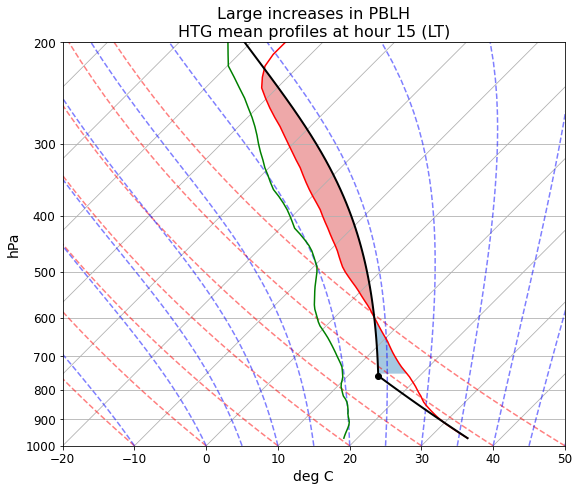

In [239]:
## Plot?
# import matplotlib.pyplot as plt
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# import pandas as pd

# import metpy.calc as mpcalc
# from metpy.cbook import get_test_data
# from metpy.plots import Hodograph, SkewT
# from metpy.units import units

p  = selHour_highPct_realSfc.levInterp.values
T  = np.squeeze(selHour_highPct_realSfc.T_interp.values) * units.K
Td = np.squeeze(dewpoint_highReal)

## Set up the plot
fig = plt.figure(figsize=(9, 9))
# add_metpy_logo(fig, 115, 100)
skew = SkewT(fig, rotation=45)

skew.plot(np.flip(p), np.flip(T), 'r')
skew.plot(np.flip(p), np.flip(Td), 'g')
# skew.plot_barbs(p, u, v)
skew.ax.set_ylim(1000, 200)
skew.ax.set_xlim(-20, 50)

# Calculate LCL height and plot as black dot. Because `p`'s first value is
# ~1000 mb and its last value is ~250 mb, the `0` index is selected for
# `p`, `T`, and `Td` to lift the parcel from the surface. If `p` was inverted,
# i.e. start from low value, 250 mb, to a high value, 1000 mb, the `-1` index
# should be selected.
lcl_pressure, lcl_temperature = mpc.lcl(p[-1]*units.hPa, T[-1], Td[-1])
skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black')

# Calculate full parcel profile and add to plot as black line
prof = mpc.parcel_profile( np.flip(p)*units.hPa, np.squeeze(T[-1]), np.squeeze(Td[-1]) ).to('degC')
skew.plot(np.flip(p), prof, 'k', linewidth=2)

lfc_pressure, lfc_temperature = mpc.lfc(np.flip(p)*units.hPa, np.flip(T), np.flip(Td), 
                                        parcel_temperature_profile=prof)
# skew.plot(lfc_pressure, lfc_temperature, 'bo', markerfacecolor='blue')

print('LFC pressure - LCL pressure = ', lfc_pressure-lcl_pressure)

# Print out metpy's calculated CAPE: 
mpc_cape, mpc_cin = mpc.cape_cin(np.flip(p)*units.hPa, 
                                 np.flip(T), 
                                 np.flip(Td), 
                                 prof, which_lfc='top', which_el='bottom')
print('Metpy calculated CAPE: ', mpc_cape)
print('Metpy calculated CIN: ', mpc_cin)


# Shade areas of CAPE and CIN
skew.shade_cin(np.flip(p)*units.hPa,  np.flip(T), prof, np.flip(Td))
skew.shade_cape(np.flip(p)*units.hPa, np.flip(T), prof)

plt.title('Large increases in '+varSel+'\n'+ str(selHour_highPct_realSfc.case.values)+' mean profiles at hour '+str(iHour)+ ' (LT)', fontsize=16)
plt.tick_params(axis='both', labelsize= 12)
plt.xlabel('deg C', fontsize=14)
plt.ylabel('hPa', fontsize=14)

# Add the relevant special lines
skew.plot_dry_adiabats()
skew.plot_moist_adiabats()


del p 
del T
del Td


LFC pressure - LCL pressure =  -117.16696830713704 hectopascal
Metpy calculated CAPE:  736.9591247859157 joule / kilogram
Metpy calculated CIN:  -315.13858329374057 joule / kilogram


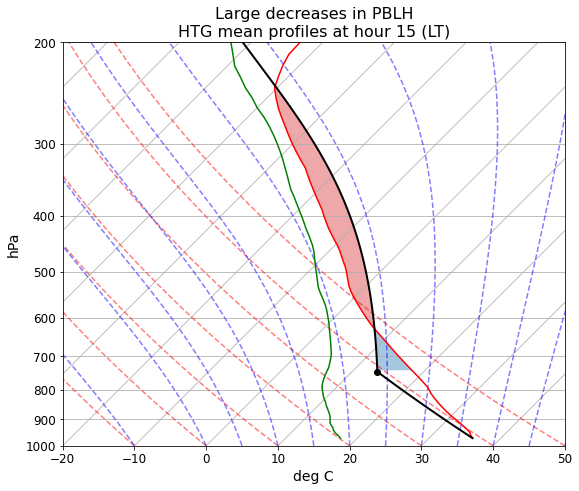

In [240]:
## Plot?
p = selHour_lowPct_realSfc.levInterp.values
T = np.squeeze(selHour_lowPct_realSfc.T_interp.values) * units.K
Td = np.squeeze(dewpoint_lowReal)

fig = plt.figure(figsize=(9, 9))
# add_metpy_logo(fig, 115, 100)
skew = SkewT(fig, rotation=45)

skew.plot(p, T, 'r')
skew.plot(p, Td, 'g')
skew.ax.set_ylim(1000, 200)
skew.ax.set_xlim(-20, 50)

# Calculate LCL height and plot as black dot. Because `p`'s first value is
# ~1000 mb and its last value is ~250 mb, the `0` index is selected for
# `p`, `T`, and `Td` to lift the parcel from the surface. If `p` was inverted,
# i.e. start from low value, 250 mb, to a high value, 1000 mb, the `-1` index
# should be selected.
lcl_pressure, lcl_temperature = mpc.lcl(p[-1]*units.hPa, T[-1], Td[-1])
skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black')


# Calculate full parcel profile and add to plot as black line
prof = mpc.parcel_profile( np.flip(p)*units.hPa, np.squeeze(T[-1]), np.squeeze(Td[-1]) ).to('degC')
skew.plot(np.flip(p), prof, 'k', linewidth=2)

lfc_pressure, lfc_temperature = mpc.lfc(np.flip(p)*units.hPa, np.flip(T), np.flip(Td), 
                                        parcel_temperature_profile=prof)
# skew.plot(lfc_pressure, lfc_temperature, 'bo', markerfacecolor='blue')

print('LFC pressure - LCL pressure = ', lfc_pressure-lcl_pressure)

# Print out metpy's calculated CAPE: 
mpc_cape, mpc_cin = mpc.cape_cin(np.flip(p)*units.hPa, 
                                 np.flip(T), 
                                 np.flip(Td), 
                                 prof, which_lfc='top', which_el='bottom')
print('Metpy calculated CAPE: ', mpc_cape)
print('Metpy calculated CIN: ', mpc_cin)

# Shade areas of CAPE and CIN
skew.shade_cin(np.flip(p)*units.hPa,  np.flip(T), prof, np.flip(Td))
skew.shade_cape(np.flip(p)*units.hPa, np.flip(T), prof)

plt.title('Large decreases in '+varSel+'\n'+ str(selHour_highPct_realSfc.case.values)+' mean profiles at hour '+str(iHour)+ ' (LT)', fontsize=16)

plt.tick_params(axis='both', labelsize= 12)
plt.xlabel('deg C', fontsize=14)
plt.ylabel('hPa', fontsize=14)

# Add the relevant special lines
skew.plot_dry_adiabats()
skew.plot_moist_adiabats()

del p 
del T
del Td


Metpy calculated CAPE:  1189.1432679279005 joule / kilogram
Metpy calculated CIN:  -153.8440704676155 joule / kilogram


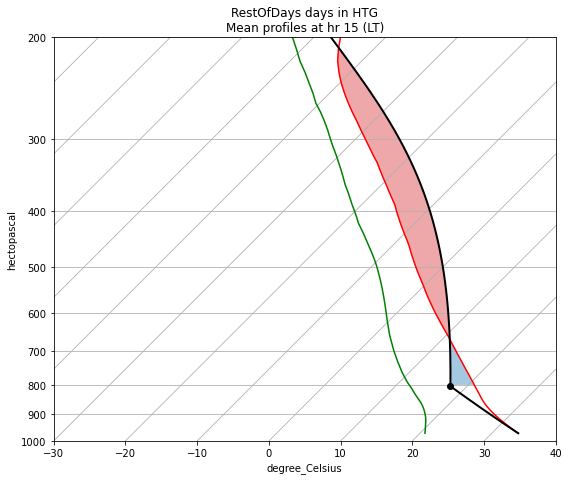

In [241]:
## Plot?
p = selHour_restOfDays_realSfc.levInterp.values
T = np.squeeze(selHour_restOfDays_realSfc.T_interp.values) * units.K
Td = np.squeeze(dewpoint_restReal)

fig = plt.figure(figsize=(9, 9))
# add_metpy_logo(fig, 115, 100)
skew = SkewT(fig, rotation=45)

skew.plot(p, T, 'r')
skew.plot(p, Td, 'g')
# skew.plot_barbs(p, u, v)
skew.ax.set_ylim(1000, 200)
skew.ax.set_xlim(-30, 40)

# Calculate LCL height and plot as black dot. Because `p`'s first value is
# ~1000 mb and its last value is ~250 mb, the `0` index is selected for
# `p`, `T`, and `Td` to lift the parcel from the surface. If `p` was inverted,
# i.e. start from low value, 250 mb, to a high value, 1000 mb, the `-1` index
# should be selected.
lcl_pressure, lcl_temperature = mpc.lcl(p[-1]*units.hPa, T[-1], Td[-1])
skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black')

# Calculate full parcel profile and add to plot as black line
prof = mpc.parcel_profile( np.flip(p)*units.hPa, np.squeeze(T[-1]), np.squeeze(Td[-1]) ).to('degC')
skew.plot(np.flip(p), prof, 'k', linewidth=2)

# Shade areas of CAPE and CIN
skew.shade_cin(np.flip(p)*units.hPa,  np.flip(T), prof, np.flip(Td))
skew.shade_cape(np.flip(p)*units.hPa, np.flip(T), prof)

# Print out metpy's calculated CAPE: 
mpc_cape, mpc_cin = mpc.cape_cin(np.flip(p)*units.hPa, 
                                 np.flip(T), 
                                 np.flip(Td), 
                                 prof, which_lfc='top', which_el='bottom')
print('Metpy calculated CAPE: ', mpc_cape)
print('Metpy calculated CIN: ', mpc_cin)

plt.title('RestOfDays days in '+str(selHour_highPct_realSfc.case.values)+'\nMean profiles at hr '+str(iHour)+ ' (LT)')

del p 
del T
del Td


Text(0.5, 1.0, 'LowPct days in HMG\nMean profiles at hr 15 (LT)')

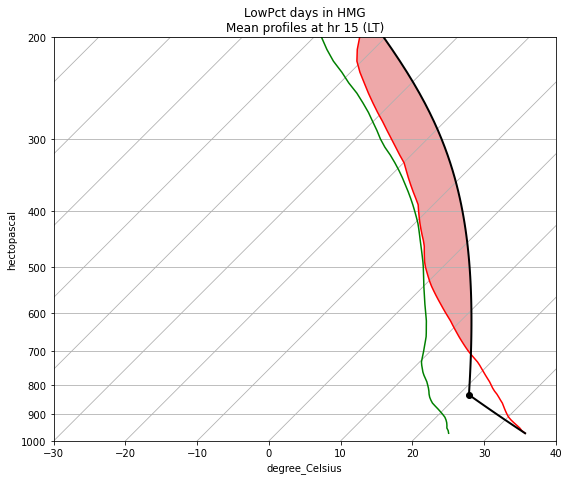

In [62]:
## Plot?
p = selHour_highPct_artSfc.levInterp.values
T = np.squeeze(selHour_highPct_artSfc.T_interp.values) * units.K
Td = np.squeeze(dewpoint_highArt)

fig = plt.figure(figsize=(9, 9))
# add_metpy_logo(fig, 115, 100)
skew = SkewT(fig, rotation=45)

skew.plot(p, T, 'r')
skew.plot(p, Td, 'g')
# skew.plot_barbs(p, u, v)
skew.ax.set_ylim(1000, 200)
skew.ax.set_xlim(-30, 40)

# Calculate LCL height and plot as black dot. Because `p`'s first value is
# ~1000 mb and its last value is ~250 mb, the `0` index is selected for
# `p`, `T`, and `Td` to lift the parcel from the surface. If `p` was inverted,
# i.e. start from low value, 250 mb, to a high value, 1000 mb, the `-1` index
# should be selected.
lcl_pressure, lcl_temperature = mpc.lcl(p[-1]*units.hPa, T[-1], Td[-1])
skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black')

# Calculate full parcel profile and add to plot as black line
prof = mpc.parcel_profile( np.flip(p)*units.hPa, np.squeeze(T[-1]), np.squeeze(Td[-1]) ).to('degC')
skew.plot(np.flip(p), prof, 'k', linewidth=2)

# Shade areas of CAPE and CIN
skew.shade_cin(np.flip(p)*units.hPa,  np.flip(T), prof, np.flip(Td))
skew.shade_cape(np.flip(p)*units.hPa, np.flip(T), prof)

plt.title('LowPct days in '+str(selHour_highPct_realSfc.case.values)+'\nMean profiles at hr '+str(iHour)+ ' (LT)')


Text(0.5, 1.0, 'LowPct days in HMG\nMean profiles at hr 15 (LT)')

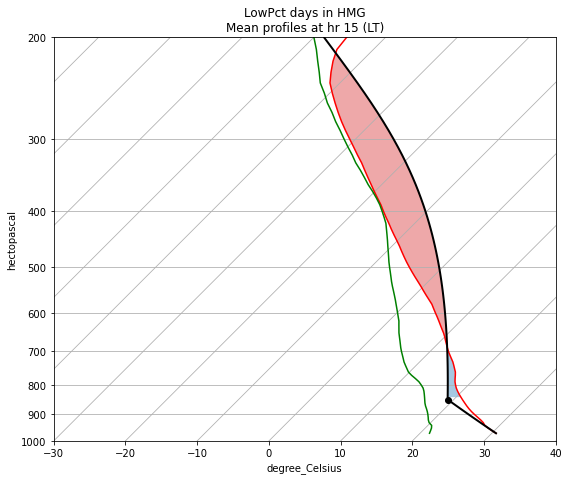

In [63]:
## Plot?
p = selHour_lowPct_artSfc.levInterp.values
T = np.squeeze(selHour_lowPct_artSfc.T_interp.values) * units.K
Td = np.squeeze(dewpoint_lowArt)

fig = plt.figure(figsize=(9, 9))
# add_metpy_logo(fig, 115, 100)
skew = SkewT(fig, rotation=45)

skew.plot(p, T, 'r')
skew.plot(p, Td, 'g')
# skew.plot_barbs(p, u, v)
skew.ax.set_ylim(1000, 200)
skew.ax.set_xlim(-30, 40)

# Calculate LCL height and plot as black dot. Because `p`'s first value is
# ~1000 mb and its last value is ~250 mb, the `0` index is selected for
# `p`, `T`, and `Td` to lift the parcel from the surface. If `p` was inverted,
# i.e. start from low value, 250 mb, to a high value, 1000 mb, the `-1` index
# should be selected.
lcl_pressure, lcl_temperature = mpc.lcl(p[-1]*units.hPa, T[-1], Td[-1])
skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black')

# Calculate full parcel profile and add to plot as black line
prof = mpc.parcel_profile( np.flip(p)*units.hPa, np.squeeze(T[-1]), np.squeeze(Td[-1]) ).to('degC')
skew.plot(np.flip(p), prof, 'k', linewidth=2)

# Shade areas of CAPE and CIN
skew.shade_cin(np.flip(p)*units.hPa,  np.flip(T), prof, np.flip(Td))
skew.shade_cape(np.flip(p)*units.hPa, np.flip(T), prof)

plt.title('LowPct days in '+str(selHour_highPct_realSfc.case.values)+'\nMean profiles at hr '+str(iHour)+ ' (LT)')


## Plot mixing diagram?

In [147]:
## Set some constants 
Lv = 2.5e6      # Latent heat of vaporization
Cp = 1005.7     # Specific heat capacity 
g  = 9.8 
Rd = 287.04
ep = 0.622
R_cp = Rd/Cp 

# Time increment of time dimension (seconds) 
# dt = 60.0*60.0    # Using hourly values  


In [148]:
def air_density(p, t, q):
    '''Calculate the air density using the ideal gas law
    with the specific humidity of gas

    Parameters
    ----------
    p : float
        pressure [Pascals]
    t : float
        dry bulb temperature [Kelvin]
    q : float
        specific humidity [kg/kg]

    Return
    ------
    float
        air density [kg/m^3]
    '''
    return p / (Rd * t * ((1. + (q/ep)) / (1. + q)))


In [155]:
# Variable name for PBL variable
PBLname = 'PBLH'

# Select just 7a-5p: 
iHours              = np.where((hourlyMean_highPct_realSfc.hour.values>=7) & 
                               (hourlyMean_highPct_realSfc.hour.values<=16))[0]

realSfc_daytime     = hourlyMean_highPct_realSfc.isel(hour=iHours)


rho_real     = air_density(realSfc_daytime.PS.values,realSfc_daytime.TREFHT.values, realSfc_daytime.QREFHT.values)
realSfc_daytime['rho'] = (('hour','case','lat','lon'), rho_real)


# Get mean over daytime hours
realSfc_daytimeMean    = realSfc_daytime.mean(dim='hour')

## Get points for Cp_delTheta and L_delQ 
real_Cp_delTheta = (np.squeeze(realSfc_daytimeMean.SHFLX.values)*(13*60*60))/(np.squeeze(realSfc_daytimeMean.rho.values )* np.squeeze(realSfc_daytimeMean[PBLname].values))
bowen_real       = np.squeeze(realSfc_daytimeMean.SHFLX.values)/np.squeeze(realSfc_daytimeMean.LHFLX.values)
real_L_delQ      = real_Cp_delTheta/bowen_real

real_LvQ = hourlyMean_highPct_realSfc.QREFHT.values[7:16,:,0,0]*Lv
real_CpT = hourlyMean_highPct_realSfc.TREFHT.values[7:16,:,0,0]*Cp


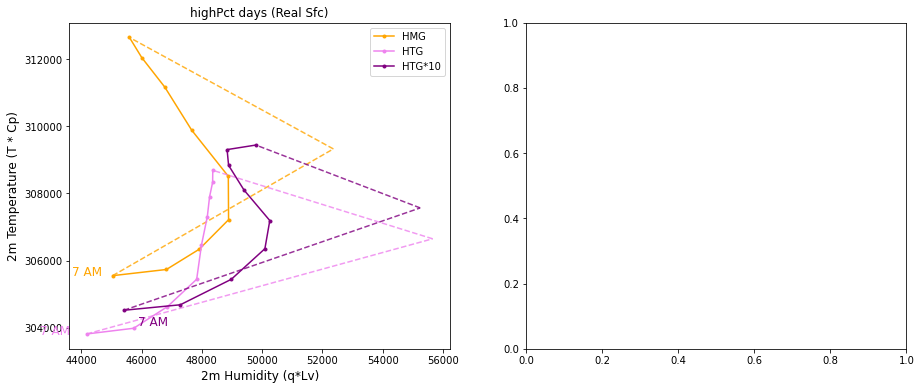

In [156]:
# Make the plots! 
fig,axs = plt.subplots(1,2, figsize=(15,6))
axs     = axs.ravel()


## Plot real surface
# - - - - - - - - - - - 

caseNames = np.asarray(['HMG','HTG','HTG*10'])
colorList = np.asarray(['orange','violet','purple'])
offset_7aText = np.asarray([ [0.97, 0.965, 1.01], 
                             [1.0,  1.0,   0.9985] ])


for iCase in range(3):
    axs[0].plot(real_LvQ[:,iCase], real_CpT[:,iCase],'o-',
                markersize=3, color=colorList[iCase], label=caseNames[iCase])
    
    # Add vectors
    axs[0].plot([real_LvQ[0,iCase], real_LvQ[0,iCase]+real_L_delQ[iCase]], 
                [real_CpT[0,iCase], real_CpT[0,iCase]+real_Cp_delTheta[iCase]],
                '--', color=colorList[iCase], alpha=0.8)
    axs[0].plot([real_LvQ[0,iCase]+real_L_delQ[iCase], real_LvQ[-1,iCase]], 
                [real_CpT[0,iCase]+real_Cp_delTheta[iCase], real_CpT[-1,iCase]],
                '--', color=colorList[iCase], alpha=0.8)
    # Add 7 am labels
    axs[0].text(real_LvQ[0,iCase]*offset_7aText[0,iCase], 
                real_CpT[0,iCase]*offset_7aText[1,iCase], '7 AM', color=colorList[iCase], fontsize=12)
    
# # ## Plot observations T/Q:
# # # - - - - - - - - - - - 
# axs[0].plot( hourlyMean_dDry_Obs.q_srf.values[7:20]*Lv, 
#             (hourlyMean_dDry_Obs.T_srf.values[7:20]+273.15)*Cp,'o-',
#                 markersize=3, color='k', label='Obs')


# ## Plot artificial surface
# # - - - - - - - - - - - 
# caseNames = np.asarray(['HMG','HTG'])
# colorList = np.asarray(['red','blue'])
# offset_7aText = np.asarray([ [0.97, 1.012 ], 
#                              [1.0,  0.999   ] ])

# for iCase in range(2): 
#     axs[1].plot(art_LvQ[:,iCase], art_CpT[:,iCase],'o-',
#                 markersize=3, color=colorList[iCase], label=caseNames[iCase])
    
#     # Add vectors
#     axs[1].plot([art_LvQ[0,iCase], art_LvQ[0,iCase]+art_L_delQ[iCase]], 
#                 [art_CpT[0,iCase], art_CpT[0,iCase]+art_Cp_delTheta[iCase]],
#                 '--', color=colorList[iCase], alpha=0.8)
#     axs[1].plot([art_LvQ[0,iCase]+art_L_delQ[iCase], art_LvQ[-1,iCase]], 
#                 [art_CpT[0,iCase]+art_Cp_delTheta[iCase], art_CpT[-1,iCase]],
#                 '--', color=colorList[iCase], alpha=0.8)
#     # Add 7 am labels
#     axs[1].text(art_LvQ[0,iCase]*offset_7aText[0,iCase], 
#                 art_CpT[0,iCase]*offset_7aText[1,iCase], '7 AM', color=colorList[iCase], fontsize=12)
    
# # Add multipliers
# caseNames = np.asarray(['HTG*0.5','HTG*.25'])
# colorList = np.asarray(['dodgerblue','skyblue'])
# offset_7aText = np.asarray([ [1.005,  0.979 ], 
#                              [0.999,  0.9995   ] ])

# for iCase in range(2): 
#     axs[1].plot(artMult_LvQ[:,iCase], artMult_CpT[:,iCase],'o-',
#                 markersize=3, color=colorList[iCase], label=caseNames[iCase])
    
#     # Add vectors
#     axs[1].plot([artMult_LvQ[0,iCase], artMult_LvQ[0,iCase]+artMult_L_delQ[iCase]], 
#                 [artMult_CpT[0,iCase], artMult_CpT[0,iCase]+artMult_Cp_delTheta[iCase]],
#                 '--', color=colorList[iCase], alpha=0.8)
#     axs[1].plot([artMult_LvQ[0,iCase]+artMult_L_delQ[iCase], artMult_LvQ[-1,iCase]], 
#                 [artMult_CpT[0,iCase]+artMult_Cp_delTheta[iCase], artMult_CpT[-1,iCase]],
#                 '--', color=colorList[iCase], alpha=0.8)
#     # Add 7 am labels
#     axs[1].text(artMult_LvQ[0,iCase]*offset_7aText[0,iCase], 
#                 artMult_CpT[0,iCase]*offset_7aText[1,iCase], '7 AM', color=colorList[iCase], fontsize=12)
    




## Add titles/labels 
# - - - - - - - - - - - 
axs[0].set_ylabel('2m Temperature (T * Cp)', fontsize=12)
axs[0].set_xlabel('2m Humidity (q*Lv)',fontsize=12)

axs[0].set_title('highPct days (Real Sfc)')

axs[0].legend()

